In [1]:
import os
import h5py
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
import itertools
import sys

from clustering_scripts import *

In [2]:
def simple_gali(gali_matrix):
    if np.any(np.isnan(gali_matrix)):
        return np.nan
    else:
        _, s, _ = np.linalg.svd(gali_matrix)
        return np.prod(s)


def gali(gali_matrix):
    gali_matrix = np.transpose(gali_matrix, (2, 0, 1))
    gali = []
    for m in (gali_matrix):
        gali.append(simple_gali(m))
    gali = np.asarray(gali)
    return gali

In [3]:
OUTDIR = "/home/HPC/camontan/lhc_dynamic_indicators/out/htcondor_out"
TUNEDIR = '/home/HPC/camontan/lhc_dynamic_indicators/out/merged_tune'
IMGDIR = '/home/HPC/camontan/lhc_dynamic_indicators/img/paper_tier/'

In [4]:
# set latex rendering for plots
plt.rc('text', usetex=True)
plt.rc('font', family='serif')

In [5]:
lattice_list = ["b1_worst", "b1_avg", "b1_best", "b2_worst", "b2_avg", "b2_best"]
lattice_list = ["b1_worst", "b1_avg", "b1_best"]
extent_list = [
    np.array([0.0, 0.00125, 0.0, 0.00125]),
    np.array([0.0, 0.00130, 0.0, 0.00130]),
    np.array([0.0, 0.00140, 0.0, 0.00140]),
]

## TODO : evaluate the extents and convert them to sigma units

##### END TODO #####

lattice_name_list = ["Worst", "Median", "Best"]
zeta_list = ["zeta_min", "zeta_avg", "zeta_max"]
zeta_name_list = ["0.0", "0.15", "0.3"]

In [6]:
variables = ["x", "px", "y", "py", "zeta", "delta"]
list(itertools.combinations(variables, 2))

[('x', 'px'),
 ('x', 'y'),
 ('x', 'py'),
 ('x', 'zeta'),
 ('x', 'delta'),
 ('px', 'y'),
 ('px', 'py'),
 ('px', 'zeta'),
 ('px', 'delta'),
 ('y', 'py'),
 ('y', 'zeta'),
 ('y', 'delta'),
 ('py', 'zeta'),
 ('py', 'delta'),
 ('zeta', 'delta')]

In [7]:
import scipy.constants as const

def x_m_to_sigma(x_m):
    proton_mass = const.m_p # kg

    # energy at 7 TeV
    proton_energy = 7000e9 # eV
    # tev to joule
    proton_energy *= const.e # J

    # get gamma
    proton_gamma = proton_energy/proton_mass/const.c**2

    # get beta
    proton_beta = np.sqrt(1 - 1/proton_gamma**2)

    beta_x = 117.83 # m
    beta_y = 219.64 # m
    beta_gamma = proton_beta * proton_gamma
    nom_emittance = 2.5e-6 # m

    phys_emittance = nom_emittance / (beta_gamma)

    return x_m / (np.sqrt(beta_x * phys_emittance))

def y_m_to_sigma(y_m):
    proton_mass = const.m_p # kg

    # energy at 7 TeV
    proton_energy = 7000e9 # eV
    # tev to joule
    proton_energy *= const.e # J

    # get gamma
    proton_gamma = proton_energy/proton_mass/const.c**2

    # get beta
    proton_beta = np.sqrt(1 - 1/proton_gamma**2)

    beta_x = 117.83 # m
    beta_y = 219.64 # m
    beta_gamma = proton_beta * proton_gamma
    nom_emittance = 2.5e-6 # m

    phys_emittance = nom_emittance / (beta_gamma)

    return y_m / (np.sqrt(beta_y * phys_emittance))

In [8]:
x_m_to_sigma(1e-3)

5.032533521001068

In [8]:
l_list = []
l_name_list = []
e_list = []
e_list_sigma = []
z_list = []
z_name_list = []
stability_list = []
mask_list = []
title_plot_list = []

for (lattice, extent, l_name), (zeta, z_name) in itertools.product(zip(lattice_list, extent_list, lattice_name_list), zip(zeta_list, zeta_name_list)):
    l_list.append(lattice)
    l_name_list.append(l_name)
    e_list.append(extent)
    z_list.append(zeta)
    z_name_list.append(z_name)

    extent_sigma = np.array([x_m_to_sigma(extent[0]), x_m_to_sigma(extent[1]), y_m_to_sigma(extent[2]), y_m_to_sigma(extent[3])])
    e_list_sigma.append(extent_sigma)

    title_plot_list.append(f"{l_name} seed, $\\zeta={z_name}$")

    stability_file = h5py.File(os.path.join(OUTDIR, f"stability_{lattice}_{zeta}.h5"), "r")
    log_disp_file = h5py.File(os.path.join(OUTDIR, f"log_displacement_singles_{lattice}_{zeta}.h5"), "r")
    t = 100000
    stability = stability_file["stability"][:]
    stability_list.append(stability)
    mask = np.log10(stability) == 5
    mask_list.append(mask)

    times = np.array(sorted(int(j) for j in log_disp_file[f"disp/x/log_disp"].keys()))

In [ ]:
e_list

[array([0.     , 0.00125, 0.     , 0.00125]),
 array([0.     , 0.00125, 0.     , 0.00125]),
 array([0.     , 0.00125, 0.     , 0.00125]),
 array([0.    , 0.0013, 0.    , 0.0013]),
 array([0.    , 0.0013, 0.    , 0.0013]),
 array([0.    , 0.0013, 0.    , 0.0013]),
 array([0.    , 0.0014, 0.    , 0.0014]),
 array([0.    , 0.0014, 0.    , 0.0014]),
 array([0.    , 0.0014, 0.    , 0.0014])]

In [9]:
lattice_list = ["b1_worst", "b1_avg", "b1_best", "b2_worst", "b2_avg", "b2_best"]
lattice_list = ["b1_worst", "b1_avg", "b1_best"]
extent_list = [
    np.array([0.0, 0.00125, 0.0, 0.00125]),
    np.array([0.0, 0.00130, 0.0, 0.00130]),
    np.array([0.0, 0.00140, 0.0, 0.00140]),
]
lattice_name_list = ["Worst", "Median", "Best"]
zeta_list = ["zeta_min", "zeta_avg", "zeta_max"]
zeta_name_list = ["0.0", "0.15", "0.3"]

In [10]:
files = os.listdir("/home/HPC/camontan/lhc_dynamic_indicators/out/quick_scan/")

In [11]:
bounds = 0.002
values = []
for f in tqdm(files):
    h5 = h5py.File(f"/home/HPC/camontan/lhc_dynamic_indicators/out/quick_scan/{f}", mode="r")
    stab = h5["stability"][:].reshape(100, 100)
    h5.close()

    # plt.figure()
    # plt.imshow(np.log10(stab), origin="lower", extent=[0, bounds, 0, bounds])
    # plt.colorbar(label="log10(stability)")
    # plt.title(f[:-3])
    # plt.tight_layout()
    # plt.savefig(f"/home/HPC/camontan/lhc_dynamic_indicators/img/quick_scan/{f[:-3]}.jpg")
    # plt.close("all")

    s_mask = stab==1000
    values.append((f, np.count_nonzero(s_mask)))

100%|██████████| 120/120 [00:02<00:00, 53.88it/s]


In [12]:
sorted_vals = list(filter(lambda x: "b1" in x[0], sorted(values, key=lambda x: x[1])))
sorted_vals

element_min = sorted_vals[0][0]
element_max = sorted_vals[-1][0]
element_medium = sorted_vals[len(sorted_vals)//2][0]

/tmp/ipykernel_29137/2143936327.py:5: RuntimeWarning: divide by zero encountered in log10
  img = axs[0].imshow(np.log10(stab), origin="lower", extent=1000 * np.array([0, bounds, 0, bounds]), aspect="auto")
/tmp/ipykernel_29137/2143936327.py:24: RuntimeWarning: divide by zero encountered in log10
  axs[1].imshow(np.log10(stab), origin="lower", extent=1000 * np.array([0, bounds, 0, bounds]), aspect="auto")
/tmp/ipykernel_29137/2143936327.py:43: RuntimeWarning: divide by zero encountered in log10
  axs[2].imshow(np.log10(stab), origin="lower", extent=1000 * np.array([0, bounds, 0, bounds]), aspect="auto")
/tmp/ipykernel_29137/2143936327.py:73: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


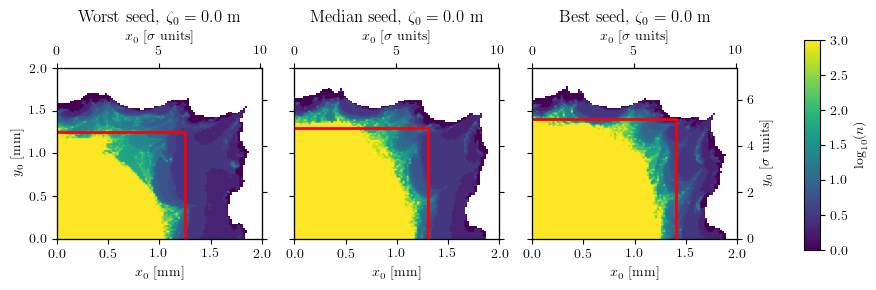

In [12]:
fig, axs = plt.subplots(1, 3, figsize=(8, 3))

with h5py.File(f"/home/HPC/camontan/lhc_dynamic_indicators/out/quick_scan/{element_min}", mode="r") as h5:
    stab = h5["stability"][:].reshape(100, 100)
img = axs[0].imshow(np.log10(stab), origin="lower", extent=1000 * np.array([0, bounds, 0, bounds]), aspect="auto")
# draw the borders of a red rectangle
axs[0].plot([0, extent_list[0][1]*1000, extent_list[0][1]*1000], [extent_list[0][1]*1000, extent_list[0][1]*1000, 0], color="red", linewidth=2)

axs[0].set_title("Worst seed, $\\zeta_0=0.0$ m")
axs[0].set_xlabel("$x_0$ [mm]")
axs[0].set_ylabel("$y_0$ [mm]")

axs_bis = axs[0].twinx()
axs_ter = axs[0].twiny()
axs_bis.set_ylim(y_m_to_sigma(0), y_m_to_sigma(bounds))
axs_ter.set_xlim(x_m_to_sigma(0), x_m_to_sigma(bounds))

axs_ter.set_xlabel("$x_0$ [$\\sigma$ units]")
# remove tick labels from axs_bis
axs_bis.set_yticklabels([])

with h5py.File(f"/home/HPC/camontan/lhc_dynamic_indicators/out/quick_scan/{element_medium}", mode="r") as h5:
    stab = h5["stability"][:].reshape(100, 100)
axs[1].imshow(np.log10(stab), origin="lower", extent=1000 * np.array([0, bounds, 0, bounds]), aspect="auto")
# draw the borders of a red rectangle
axs[1].plot([0, extent_list[1][1]*1000, extent_list[1][1]*1000], [extent_list[1][1]*1000, extent_list[1][1]*1000, 0], color="red", linewidth=2)
axs[1].set_title("Median seed, $\\zeta_0=0.0$ m")
# axs[1].set_ylabel("$y_0$ [mm]")

axs_bis = axs[1].twinx()
axs_ter = axs[1].twiny()
axs_bis.set_ylim(y_m_to_sigma(0), y_m_to_sigma(bounds))
axs_ter.set_xlim(x_m_to_sigma(0), x_m_to_sigma(bounds))

axs_ter.set_xlabel("$x_0$ [$\\sigma$ units]")
# remove ticks from axs_bis
axs[1].set_yticklabels([])
axs_bis.set_yticklabels([])
axs[1].set_xlabel("$x_0$ [mm]")

with h5py.File(f"/home/HPC/camontan/lhc_dynamic_indicators/out/quick_scan/{element_max}", mode="r") as h5:
    stab = h5["stability"][:].reshape(100, 100)
axs[2].imshow(np.log10(stab), origin="lower", extent=1000 * np.array([0, bounds, 0, bounds]), aspect="auto")
# draw the borders of a red rectangle
axs[2].plot([0, extent_list[2][1]*1000, extent_list[2][1]*1000], [extent_list[2][1]*1000, extent_list[2][1]*1000, 0], color="red", linewidth=2)
axs[2].set_title("Best seed, $\\zeta_0=0.0$ m")
axs[2].set_xlabel("$x_0$ [mm]")

axs_bis = axs[2].twinx()
axs_ter = axs[2].twiny()
axs_bis.set_ylim(y_m_to_sigma(0), y_m_to_sigma(bounds))
axs_ter.set_xlim(x_m_to_sigma(0), x_m_to_sigma(bounds))

axs_ter.set_xlabel("$x_0$ [$\\sigma$ units]")
# remove ticks from axs_bis
axs[2].set_yticklabels([])
# axs_bis.set_yticklabels([])
axs_bis.set_ylabel("$y_0$ [$\\sigma$ units]")

# divider = make_axes_locatable(axs[0])
# cax = divider.append_axes("right", size="5%", pad=0.05)
# fig.colorbar(img, cax=cax, label="$\\log_{{10}}(n)$")
# divider = make_axes_locatable(axs[1])
# cax = divider.append_axes("right", size="5%", pad=0.05)
# fig.colorbar(img, cax=cax, label="$\\log_{{10}}(n)$")
# divider = make_axes_locatable(axs[2])
# cax = divider.append_axes("right", size="5%", pad=0.05)
# fig.colorbar(img, cax=cax, label="$\\log_{{10}}(n)$")

cbar_ax = fig.add_axes([1.02, 0.15, 0.02, 0.7])
fig.colorbar(img, cax=cbar_ax, orientation="vertical", label="$\\log_{10}(n)$")

plt.tight_layout()

plt.savefig(os.path.join(IMGDIR, "quick_scan.png"), dpi=600, bbox_inches="tight")

/tmp/ipykernel_33878/343697247.py:5: RuntimeWarning: divide by zero encountered in log10
  img = axs[0].imshow(np.log10(stab), origin="lower", extent=1000 * np.array([0, bounds, 0, bounds]), aspect="auto")
/tmp/ipykernel_33878/343697247.py:43: RuntimeWarning: divide by zero encountered in log10
  axs[1].imshow(np.log10(stab), origin="lower", extent=1000 * np.array([0, bounds, 0, bounds]), aspect="auto")
/tmp/ipykernel_33878/343697247.py:73: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


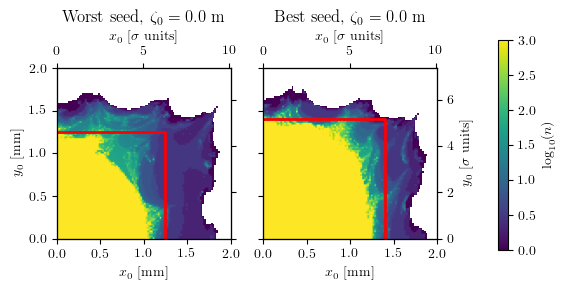

In [17]:
fig, axs = plt.subplots(1, 2, figsize=(5, 3))

with h5py.File(f"/home/HPC/camontan/lhc_dynamic_indicators/out/quick_scan/{element_min}", mode="r") as h5:
    stab = h5["stability"][:].reshape(100, 100)
img = axs[0].imshow(np.log10(stab), origin="lower", extent=1000 * np.array([0, bounds, 0, bounds]), aspect="auto")
# draw the borders of a red rectangle
axs[0].plot([0, extent_list[0][1]*1000, extent_list[0][1]*1000], [extent_list[0][1]*1000, extent_list[0][1]*1000, 0], color="red", linewidth=2)

axs[0].set_title("Worst seed, $\\zeta_0=0.0$ m")
axs[0].set_xlabel("$x_0$ [mm]")
axs[0].set_ylabel("$y_0$ [mm]")

axs_bis = axs[0].twinx()
axs_ter = axs[0].twiny()
axs_bis.set_ylim(y_m_to_sigma(0), y_m_to_sigma(bounds))
axs_ter.set_xlim(x_m_to_sigma(0), x_m_to_sigma(bounds))

axs_ter.set_xlabel("$x_0$ [$\\sigma$ units]")
# remove tick labels from axs_bis
axs_bis.set_yticklabels([])

# with h5py.File(f"/home/HPC/camontan/lhc_dynamic_indicators/out/quick_scan/{element_medium}", mode="r") as h5:
#     stab = h5["stability"][:].reshape(100, 100)
# axs[1].imshow(np.log10(stab), origin="lower", extent=1000 * np.array([0, bounds, 0, bounds]), aspect="auto")
# # draw the borders of a red rectangle
# axs[1].plot([0, extent_list[1][1]*1000, extent_list[1][1]*1000], [extent_list[1][1]*1000, extent_list[1][1]*1000, 0], color="red", linewidth=2)
# axs[1].set_title("Median seed, $\\zeta_0=0.0$ m")
# # axs[1].set_ylabel("$y_0$ [mm]")

# axs_bis = axs[1].twinx()
# axs_ter = axs[1].twiny()
# axs_bis.set_ylim(y_m_to_sigma(0), y_m_to_sigma(bounds))
# axs_ter.set_xlim(x_m_to_sigma(0), x_m_to_sigma(bounds))

# axs_ter.set_xlabel("$x_0$ [$\\sigma$ units]")
# # remove ticks from axs_bis
# axs[1].set_yticklabels([])
# axs_bis.set_yticklabels([])
# axs[1].set_xlabel("$x_0$ [mm]")

with h5py.File(f"/home/HPC/camontan/lhc_dynamic_indicators/out/quick_scan/{element_max}", mode="r") as h5:
    stab = h5["stability"][:].reshape(100, 100)
axs[1].imshow(np.log10(stab), origin="lower", extent=1000 * np.array([0, bounds, 0, bounds]), aspect="auto")
# draw the borders of a red rectangle
axs[1].plot([0, extent_list[2][1]*1000, extent_list[2][1]*1000], [extent_list[2][1]*1000, extent_list[2][1]*1000, 0], color="red", linewidth=2)
axs[1].set_title("Best seed, $\\zeta_0=0.0$ m")
axs[1].set_xlabel("$x_0$ [mm]")

axs_bis = axs[1].twinx()
axs_ter = axs[1].twiny()
axs_bis.set_ylim(y_m_to_sigma(0), y_m_to_sigma(bounds))
axs_ter.set_xlim(x_m_to_sigma(0), x_m_to_sigma(bounds))

axs_ter.set_xlabel("$x_0$ [$\\sigma$ units]")
# remove ticks from axs_bis
axs[1].set_yticklabels([])
# axs_bis.set_yticklabels([])
axs_bis.set_ylabel("$y_0$ [$\\sigma$ units]")

# divider = make_axes_locatable(axs[0])
# cax = divider.append_axes("right", size="5%", pad=0.05)
# fig.colorbar(img, cax=cax, label="$\\log_{{10}}(n)$")
# divider = make_axes_locatable(axs[1])
# cax = divider.append_axes("right", size="5%", pad=0.05)
# fig.colorbar(img, cax=cax, label="$\\log_{{10}}(n)$")
# divider = make_axes_locatable(axs[1])
# cax = divider.append_axes("right", size="5%", pad=0.05)
# fig.colorbar(img, cax=cax, label="$\\log_{{10}}(n)$")

cbar_ax = fig.add_axes([1.02, 0.15, 0.02, 0.7])
fig.colorbar(img, cax=cbar_ax, orientation="vertical", label="$\\log_{10}(n)$")

plt.tight_layout()

plt.savefig(os.path.join(IMGDIR, "quick_scan.pdf"), dpi=600, bbox_inches="tight")

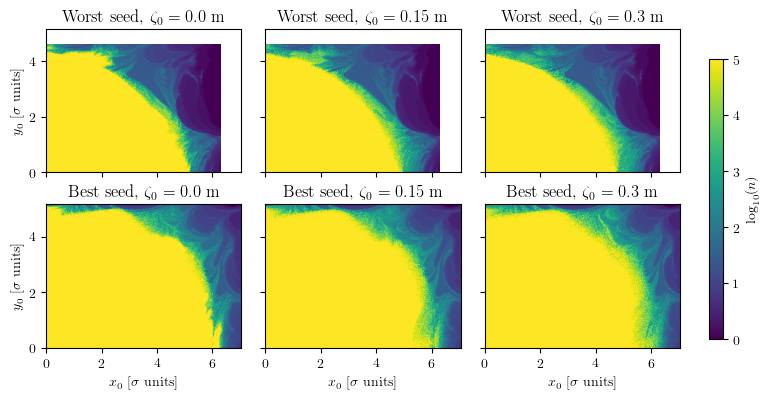

In [18]:
fig, axs = plt.subplots(2, 3, figsize=(7, 4))

for i, ((lattice, extent, l_name), (zeta, z_name)) in enumerate(itertools.product(zip(lattice_list, extent_list, lattice_name_list), zip(zeta_list, zeta_name_list))):
    if i < 6 and i > 2:
        continue
    elif i > 2:
        j = i - 3
    else:
        j = i
    ax = axs[j // 3, j % 3]
    # im=ax.imshow(np.log10(stability_list[i]).reshape(300, 300), origin="lower", extent=1000 * e_list[i])
    im=ax.imshow(np.log10(stability_list[i]).reshape(300, 300), origin="lower", extent=e_list_sigma[i])
    ax.set_title(f"{l_name} seed, $\\zeta_0={z_name}$ m")
    ax.set_xlabel("$x_0$ [$\\sigma$ units]")
    ax.set_ylabel("$y_0$ [$\\sigma$ units]")

    ax.set_xlim(e_list_sigma[-1][0], e_list_sigma[-1][1])
    ax.set_ylim(e_list_sigma[-1][2], e_list_sigma[-1][3])

    if j // 3 == 0:
        ax.set_xlabel("")
        ax.set_xticklabels([])
    if j % 3 != 0:
        ax.set_ylabel("")
        ax.set_yticklabels([])

plt.tight_layout()

# add vertical colorbar to the right
cbar_ax = fig.add_axes([1.02, 0.15, 0.02, 0.7])
fig.colorbar(im, cax=cbar_ax, orientation="vertical", label="$\\log_{10}(n)$")
plt.savefig(os.path.join(IMGDIR, "stability.pdf"), dpi=600, bbox_inches="tight")

/tmp/ipykernel_33878/2459800573.py:5: RuntimeWarning: divide by zero encountered in log10
  img = axs[0].imshow(np.log10(stab), origin="lower", extent=1000 * np.array([0, bounds, 0, bounds]), vmin=0, vmax=5, aspect="auto")
/tmp/ipykernel_33878/2459800573.py:51: RuntimeWarning: divide by zero encountered in log10
  axs[1].imshow(np.log10(stab), origin="lower", extent=1000 * np.array([0, bounds, 0, bounds]), aspect="auto", vmin=0, vmax=5)
/tmp/ipykernel_33878/2459800573.py:89: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


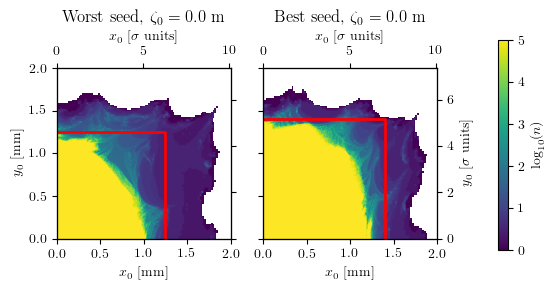

In [38]:
fig, axs = plt.subplots(1, 2, figsize=(5, 3))

with h5py.File(f"/home/HPC/camontan/lhc_dynamic_indicators/out/quick_scan/{element_min}", mode="r") as h5:
    stab = h5["stability"][:].reshape(100, 100)
img = axs[0].imshow(np.log10(stab), origin="lower", extent=1000 * np.array([0, bounds, 0, bounds]), vmin=0, vmax=5, aspect="auto")

size_to_use = int(300 * bounds / extent_list[0][1])+1
neo_matrix = np.zeros((size_to_use, size_to_use))
neo_matrix *= np.nan
neo_matrix[:300, :300] = np.log10(stability_list[0]).reshape(300, 300)

img = axs[0].imshow(neo_matrix, origin="lower", extent=1000 * np.array([0, bounds, 0, bounds]), vmin=0, vmax=5, aspect="auto")

# draw the borders of a red rectangle
axs[0].plot([0, extent_list[0][1]*1000, extent_list[0][1]*1000], [extent_list[0][1]*1000, extent_list[0][1]*1000, 0], color="red", linewidth=2)

axs_bis = axs[0].twinx()
axs_ter = axs[0].twiny()
axs_bis.set_ylim(y_m_to_sigma(0), y_m_to_sigma(bounds))
axs_ter.set_xlim(x_m_to_sigma(0), x_m_to_sigma(bounds))

axs[0].set_title("Worst seed, $\\zeta_0=0.0$ m")
axs[0].set_xlabel("$x_0$ [mm]")
axs[0].set_ylabel("$y_0$ [mm]")

axs_ter.set_xlabel("$x_0$ [$\\sigma$ units]")
# remove tick labels from axs_bis
axs_bis.set_yticklabels([])

# with h5py.File(f"/home/HPC/camontan/lhc_dynamic_indicators/out/quick_scan/{element_medium}", mode="r") as h5:
#     stab = h5["stability"][:].reshape(100, 100)
# axs[1].imshow(np.log10(stab), origin="lower", extent=1000 * np.array([0, bounds, 0, bounds]), aspect="auto")
# # draw the borders of a red rectangle
# axs[1].plot([0, extent_list[1][1]*1000, extent_list[1][1]*1000], [extent_list[1][1]*1000, extent_list[1][1]*1000, 0], color="red", linewidth=2)
# axs[1].set_title("Median seed, $\\zeta_0=0.0$ m")
# # axs[1].set_ylabel("$y_0$ [mm]")

# axs_bis = axs[1].twinx()
# axs_ter = axs[1].twiny()
# axs_bis.set_ylim(y_m_to_sigma(0), y_m_to_sigma(bounds))
# axs_ter.set_xlim(x_m_to_sigma(0), x_m_to_sigma(bounds))

# axs_ter.set_xlabel("$x_0$ [$\\sigma$ units]")
# # remove ticks from axs_bis
# axs[1].set_yticklabels([])
# axs_bis.set_yticklabels([])
# axs[1].set_xlabel("$x_0$ [mm]")

with h5py.File(f"/home/HPC/camontan/lhc_dynamic_indicators/out/quick_scan/{element_max}", mode="r") as h5:
    stab = h5["stability"][:].reshape(100, 100)
axs[1].imshow(np.log10(stab), origin="lower", extent=1000 * np.array([0, bounds, 0, bounds]), aspect="auto", vmin=0, vmax=5)

size_to_use = int(300 * bounds / extent_list[2][1])+1
neo_matrix = np.zeros((size_to_use, size_to_use))
neo_matrix *= np.nan
neo_matrix[:300, :300] = np.log10(stability_list[6]).reshape(300, 300)

img = axs[1].imshow(neo_matrix, origin="lower", extent=1000 * np.array([0, bounds, 0, bounds]), vmin=0, vmax=5, aspect="auto")

# draw the borders of a red rectangle
axs[1].plot([0, extent_list[2][1]*1000, extent_list[2][1]*1000], [extent_list[2][1]*1000, extent_list[2][1]*1000, 0], color="red", linewidth=2)
axs[1].set_title("Best seed, $\\zeta_0=0.0$ m")
axs[1].set_xlabel("$x_0$ [mm]")

axs_bis = axs[1].twinx()
axs_ter = axs[1].twiny()
axs_bis.set_ylim(y_m_to_sigma(0), y_m_to_sigma(bounds))
axs_ter.set_xlim(x_m_to_sigma(0), x_m_to_sigma(bounds))

axs_ter.set_xlabel("$x_0$ [$\\sigma$ units]")
# remove ticks from axs_bis
axs[1].set_yticklabels([])
# axs_bis.set_yticklabels([])
axs_bis.set_ylabel("$y_0$ [$\\sigma$ units]")

# divider = make_axes_locatable(axs[0])
# cax = divider.append_axes("right", size="5%", pad=0.05)
# fig.colorbar(img, cax=cax, label="$\\log_{{10}}(n)$")
# divider = make_axes_locatable(axs[1])
# cax = divider.append_axes("right", size="5%", pad=0.05)
# fig.colorbar(img, cax=cax, label="$\\log_{{10}}(n)$")
# divider = make_axes_locatable(axs[1])
# cax = divider.append_axes("right", size="5%", pad=0.05)
# fig.colorbar(img, cax=cax, label="$\\log_{{10}}(n)$")

cbar_ax = fig.add_axes([1.02, 0.15, 0.02, 0.7])
fig.colorbar(img, cax=cbar_ax, orientation="vertical", label="$\\log_{10}(n)$")

plt.tight_layout()

plt.savefig(os.path.join(IMGDIR, "quick_scan.pdf"), dpi=600, bbox_inches="tight")

In [176]:
e_list_sigma[-1][0]

0.0

In [13]:
fli_x_data_list = []
fli_px_data_list = []
fli_y_data_list = []
fli_py_data_list = []
fli_zeta_data_list = []
fli_delta_data_list = []

fli_x_post_data_list = []
fli_px_post_data_list = []
fli_y_post_data_list = []
fli_py_post_data_list = []
fli_zeta_post_data_list = []
fli_delta_post_data_list = []

fli_x_thresh_list = []
fli_px_thresh_list = []
fli_y_thresh_list = []
fli_py_thresh_list = []
fli_zeta_thresh_list = []
fli_delta_thresh_list = []

fli_x_guesses_list = []
fli_px_guesses_list = []
fli_y_guesses_list = []
fli_py_guesses_list = []
fli_zeta_guesses_list = []
fli_delta_guesses_list = []

for i, ((lattice, extent), zeta) in enumerate(itertools.product(zip(lattice_list, extent_list), zeta_list)):
    log_disp_file = h5py.File(os.path.join(OUTDIR, f"log_displacement_singles_{lattice}_{zeta}.h5"), "r")
    for q in range(6):
    
        data_list = []
        post_data_list = []
        thresh_list = []
        guesses_list = []
        for t in times:
            if q == 0:
                disp = log_disp_file[f"disp/x/log_disp/{t}"][:]
            elif q == 1:
                disp = log_disp_file[f"disp/px/log_disp/{t}"][:]
            elif q == 2:
                disp = log_disp_file[f"disp/y/log_disp/{t}"][:]
            elif q == 3:
                disp = log_disp_file[f"disp/py/log_disp/{t}"][:]
            elif q == 4:
                disp = log_disp_file[f"disp/zeta/log_disp/{t}"][:]
            elif q == 5:
                disp = log_disp_file[f"disp/delta/log_disp/{t}"][:]
            data_list.append(disp)

            disp[~mask_list[i]] = np.nan
            if np.count_nonzero(disp[mask_list[i]] > 0) == 0:
                disp[mask_list[i]] = 1e-14
                
            disp = np.log10(disp / t)
            disp[np.logical_and(mask_list[i], np.isnan(disp))] = np.nanmax(disp)
            disp[np.isinf(disp)] = np.nan
            disp[np.logical_and(mask_list[i], np.isnan(disp))] = np.nanmin(disp)

            post_data_list.append(disp)

            try:
                threshold = find_threshold_density(disp[mask_list[i]], where_chaos="higher")
            except:
                threshold = 1e-13
            thresh_list.append(threshold)
        
        if q == 0:
            fli_x_data_list.append(data_list)
            fli_x_post_data_list.append(post_data_list)
            fli_x_thresh_list.append(thresh_list)
            fli_x_guesses_list.append(guesses_list)
        elif q == 1:
            fli_px_data_list.append(data_list)
            fli_px_post_data_list.append(post_data_list)
            fli_px_thresh_list.append(thresh_list)
            fli_px_guesses_list.append(guesses_list)
        elif q == 2:
            fli_y_data_list.append(data_list)
            fli_y_post_data_list.append(post_data_list)
            fli_y_thresh_list.append(thresh_list)
            fli_y_guesses_list.append(guesses_list)
        elif q == 3:
            fli_py_data_list.append(data_list)
            fli_py_post_data_list.append(post_data_list)
            fli_py_thresh_list.append(thresh_list)
            fli_py_guesses_list.append(guesses_list)
        elif q == 4:
            fli_zeta_data_list.append(data_list)
            fli_zeta_post_data_list.append(post_data_list)
            fli_zeta_thresh_list.append(thresh_list)
            fli_zeta_guesses_list.append(guesses_list)
        elif q == 5:
            fli_delta_data_list.append(data_list)
            fli_delta_post_data_list.append(post_data_list)
            fli_delta_thresh_list.append(thresh_list)
            fli_delta_guesses_list.append(guesses_list)

/tmp/ipykernel_20992/3571279590.py:56: RuntimeWarning: invalid value encountered in log10
  disp = np.log10(disp / t)
/tmp/ipykernel_20992/3571279590.py:56: RuntimeWarning: invalid value encountered in log10
  disp = np.log10(disp / t)
/tmp/ipykernel_20992/3571279590.py:56: RuntimeWarning: invalid value encountered in log10
  disp = np.log10(disp / t)
/tmp/ipykernel_20992/3571279590.py:56: RuntimeWarning: invalid value encountered in log10
  disp = np.log10(disp / t)
/tmp/ipykernel_20992/3571279590.py:56: RuntimeWarning: invalid value encountered in log10
  disp = np.log10(disp / t)
/tmp/ipykernel_20992/3571279590.py:56: RuntimeWarning: invalid value encountered in log10
  disp = np.log10(disp / t)
/tmp/ipykernel_20992/3571279590.py:56: RuntimeWarning: invalid value encountered in log10
  disp = np.log10(disp / t)
/tmp/ipykernel_20992/3571279590.py:56: RuntimeWarning: invalid value encountered in log10
  disp = np.log10(disp / t)
/tmp/ipykernel_20992/3571279590.py:56: RuntimeWarning: i

In [14]:
reference_x_list = []
reference_y_list = []

sigma_x_list = []
sigma_y_list = []

radius_phys_list = []
radius_sigma_list = []

for i, ((lattice, extent), zeta) in enumerate(itertools.product(zip(lattice_list, extent_list), zeta_list)):
    log_disp_file = h5py.File(os.path.join(OUTDIR, f"log_displacement_singles_{lattice}_{zeta}.h5"), "r")

    reference_x_list.append(log_disp_file["reference/initial/x"][:])
    reference_y_list.append(log_disp_file["reference/initial/y"][:])

    radius_phys_list.append(
        np.sqrt(reference_x_list[-1]**2 + reference_y_list[-1]**2)
    )

    sigma_x_list.append(x_m_to_sigma(log_disp_file["reference/initial/x"][:]))
    sigma_y_list.append(y_m_to_sigma(log_disp_file["reference/initial/y"][:]))

    radius_sigma_list.append(
        np.sqrt(sigma_x_list[-1]**2 + sigma_y_list[-1]**2)
    )


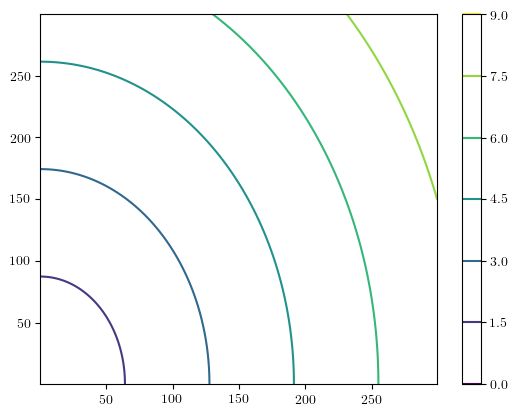

In [ ]:
# plt.figure()
# plt.contour(radius_phys_list[-1].reshape(300,300), origin="lower")
# plt.colorbar()
plt.figure()
plt.contour(radius_sigma_list[-1].reshape(300,300), origin="lower")
plt.colorbar()

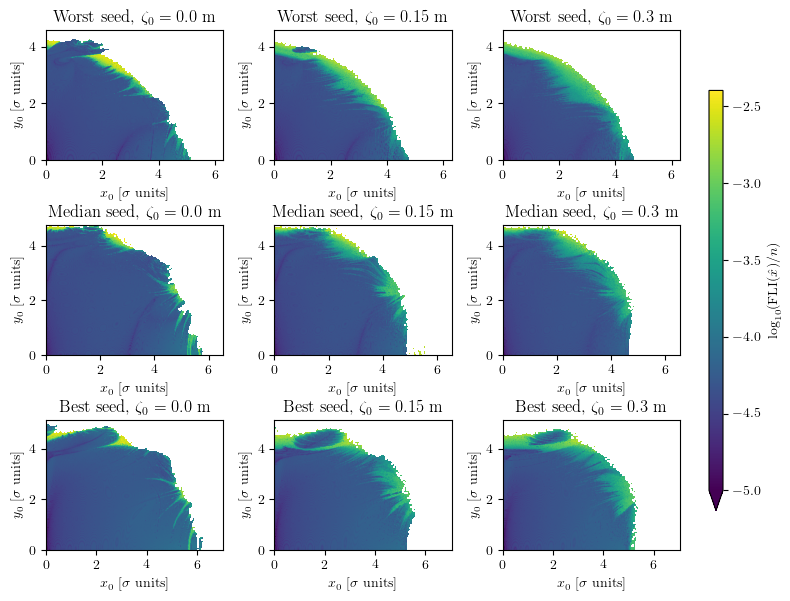

In [18]:
fig, axs = plt.subplots(3, 3, figsize=(7, 6))

for i, ((lattice, extent, l_name), (zeta, z_name)) in enumerate(itertools.product(zip(lattice_list, extent_list, lattice_name_list), zip(zeta_list, zeta_name_list))):

    ax = axs[i // 3, i % 3]
    # im=ax.imshow(np.log10(stability_list[i]).reshape(300, 300), origin="lower", extent=1000 * e_list[i])
    im=ax.imshow((fli_x_post_data_list[i][-1]).reshape(300, 300), origin="lower", extent=e_list_sigma[i], vmin=-5.0, vmax=-2.4)
    ax.set_title(f"{l_name} seed, $\\zeta_0={z_name}$ m")
    ax.set_xlabel("$x_0$ [$\\sigma$ units]")
    ax.set_ylabel("$y_0$ [$\\sigma$ units]")

plt.tight_layout()

# add vertical colorbar to the right
cbar_ax = fig.add_axes([1.02, 0.15, 0.02, 0.7])
fig.colorbar(im, cax=cbar_ax, orientation="vertical", label="$\\log_{10}($FLI$(\\hat{{x}})/n)$", extend="min")
plt.savefig(os.path.join(IMGDIR, "fli_all.pdf"), dpi=600, bbox_inches="tight")

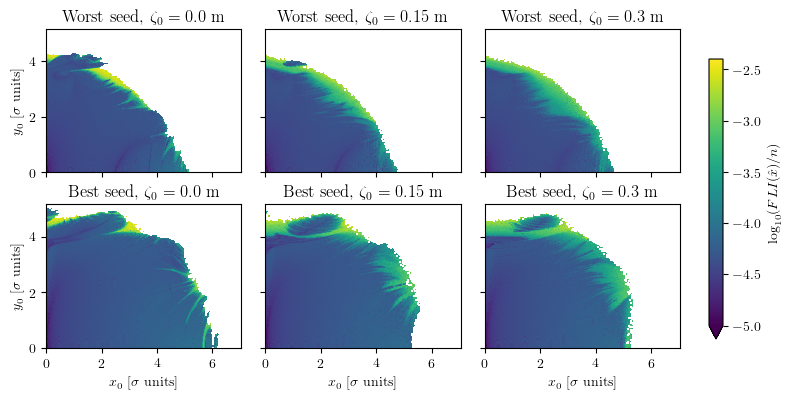

In [23]:
fig, axs = plt.subplots(2, 3, figsize=(7, 4))

for i, ((lattice, extent, l_name), (zeta, z_name)) in enumerate(itertools.product(zip(lattice_list, extent_list, lattice_name_list), zip(zeta_list, zeta_name_list))):
    if i < 6 and i > 2:
        continue
    elif i > 2:
        j = i - 3
    else:
        j = i
    ax = axs[j // 3, j % 3]
    # im=ax.imshow(np.log10(stability_list[i]).reshape(300, 300), origin="lower", extent=1000 * e_list[i])
    im=ax.imshow((fli_x_post_data_list[i][-1]).reshape(300, 300), origin="lower", extent=e_list_sigma[i], vmin=-5.0, vmax=-2.4)
    ax.set_title(f"{l_name} seed, $\\zeta_0={z_name}$ m")
    ax.set_xlabel("$x_0$ [$\\sigma$ units]")
    ax.set_ylabel("$y_0$ [$\\sigma$ units]")

    ax.set_xlim(e_list_sigma[-1][0], e_list_sigma[-1][1])
    ax.set_ylim(e_list_sigma[-1][2], e_list_sigma[-1][3])

    if j // 3 == 0:
        ax.set_xlabel("")
        ax.set_xticklabels([])
    if j % 3 != 0:
        ax.set_ylabel("")
        ax.set_yticklabels([])

plt.tight_layout()

# add vertical colorbar to the right
cbar_ax = fig.add_axes([1.02, 0.15, 0.02, 0.7])
fig.colorbar(im, cax=cbar_ax, orientation="vertical", label="$\\log_{10}(FLI(\\hat{{x}})/n)$", extend="min")
plt.savefig(os.path.join(IMGDIR, "fli_all.pdf"), dpi=600, bbox_inches="tight")

In [15]:
flibk_x_data_list = []
flibk_px_data_list = []
flibk_y_data_list = []
flibk_py_data_list = []
flibk_zeta_data_list = []
flibk_delta_data_list = []

flibk_x_post_data_list = []
flibk_px_post_data_list = []
flibk_y_post_data_list = []
flibk_py_post_data_list = []
flibk_zeta_post_data_list = []
flibk_delta_post_data_list = []

flibk_x_thresh_list = []
flibk_px_thresh_list = []
flibk_y_thresh_list = []
flibk_py_thresh_list = []
flibk_zeta_thresh_list = []
flibk_delta_thresh_list = []

flibk_x_guesses_list = []
flibk_px_guesses_list = []
flibk_y_guesses_list = []
flibk_py_guesses_list = []
flibk_zeta_guesses_list = []
flibk_delta_guesses_list = []

for i, ((lattice, extent), zeta) in enumerate(itertools.product(zip(lattice_list, extent_list), zeta_list)):
    log_disp_file = h5py.File(os.path.join(OUTDIR, f"log_displacement_singles_birkhoff_{lattice}_{zeta}.h5"), "r")
    for q in range(6):
    
        data_list = []
        post_data_list = []
        thresh_list = []
        guesses_list = []
        scores_list = []
        for t in times:
            if q == 0:
                disp = log_disp_file[f"disp/x/log_disp/{t}"][:]
            elif q == 1:
                disp = log_disp_file[f"disp/px/log_disp/{t}"][:]
            elif q == 2:
                disp = log_disp_file[f"disp/y/log_disp/{t}"][:]
            elif q == 3:
                disp = log_disp_file[f"disp/py/log_disp/{t}"][:]
            elif q == 4:
                disp = log_disp_file[f"disp/zeta/log_disp/{t}"][:]
            elif q == 5:
                disp = log_disp_file[f"disp/delta/log_disp/{t}"][:]
            data_list.append(disp)

            disp[~mask_list[i]] = np.nan
            if np.count_nonzero(disp[mask_list[i]] > 0) == 0:
                disp[mask_list[i]] = 1e-14
            under_zero_mask = disp < 0
            disp = np.log10(disp)
            disp[np.isinf(disp)] = np.nan
            disp[np.logical_and(mask_list[i], np.isnan(disp))] = np.nanmax(disp)
            disp[under_zero_mask] = np.nanmin(disp[~under_zero_mask])

            post_data_list.append(disp)

            try:
                threshold = find_threshold_density(disp[mask_list[i]], where_chaos="higher")
            except:
                threshold = -13
            thresh_list.append(threshold)

            guess = disp < threshold
            guess = np.asarray(guess, dtype=float)
            guess[~mask_list[i]] = np.nan
            guesses_list.append(guess)
        
        if q == 0:
            flibk_x_data_list.append(data_list)
            flibk_x_post_data_list.append(post_data_list)
            flibk_x_thresh_list.append(thresh_list)
            flibk_x_guesses_list.append(guesses_list)
        elif q == 1:
            flibk_px_data_list.append(data_list)
            flibk_px_post_data_list.append(post_data_list)
            flibk_px_thresh_list.append(thresh_list)
            flibk_px_guesses_list.append(guesses_list)
        elif q == 2:
            flibk_y_data_list.append(data_list)
            flibk_y_post_data_list.append(post_data_list)
            flibk_y_thresh_list.append(thresh_list)
            flibk_y_guesses_list.append(guesses_list)
        elif q == 3:
            flibk_py_data_list.append(data_list)
            flibk_py_post_data_list.append(post_data_list)
            flibk_py_thresh_list.append(thresh_list)
            flibk_py_guesses_list.append(guesses_list)
        elif q == 4:
            flibk_zeta_data_list.append(data_list)
            flibk_zeta_post_data_list.append(post_data_list)
            flibk_zeta_thresh_list.append(thresh_list)
            flibk_zeta_guesses_list.append(guesses_list)
        elif q == 5:
            flibk_delta_data_list.append(data_list)
            flibk_delta_post_data_list.append(post_data_list)
            flibk_delta_thresh_list.append(thresh_list)
            flibk_delta_guesses_list.append(guesses_list)

/tmp/ipykernel_20992/3392687414.py:57: RuntimeWarning: invalid value encountered in log10
  disp = np.log10(disp)
/tmp/ipykernel_20992/3392687414.py:57: RuntimeWarning: invalid value encountered in log10
  disp = np.log10(disp)
/tmp/ipykernel_20992/3392687414.py:57: RuntimeWarning: invalid value encountered in log10
  disp = np.log10(disp)
/tmp/ipykernel_20992/3392687414.py:57: RuntimeWarning: invalid value encountered in log10
  disp = np.log10(disp)
/tmp/ipykernel_20992/3392687414.py:57: RuntimeWarning: invalid value encountered in log10
  disp = np.log10(disp)
/tmp/ipykernel_20992/3392687414.py:57: RuntimeWarning: invalid value encountered in log10
  disp = np.log10(disp)
/tmp/ipykernel_20992/3392687414.py:57: RuntimeWarning: invalid value encountered in log10
  disp = np.log10(disp)
/tmp/ipykernel_20992/3392687414.py:57: RuntimeWarning: invalid value encountered in log10
  disp = np.log10(disp)
/tmp/ipykernel_20992/3392687414.py:57: RuntimeWarning: invalid value encountered in log1

In [17]:
from_sigma = 0.1
to_sigma = 8.5

n_samples = 1000
sigma_sample = np.linspace(from_sigma, to_sigma, n_samples)

In [18]:
bucket_lenght_list = [0.05, 0.1, 0.2, 0.5, 1.0]

thick_lyapunov_wb_evo_list = {t: [] for t in bucket_lenght_list}
thick_lyapunov_wb_evo_std_list = {t: [] for t in bucket_lenght_list}
thick_stability_wb_evo_list = {t: [] for t in bucket_lenght_list}
thick_samples_evo_list = {t: [] for t in bucket_lenght_list}

for i, (idx) in enumerate((range(9))):
    for bucket_lenght in bucket_lenght_list:
        sigma_sample_low = sigma_sample - bucket_lenght / 2
        sigma_sample_high = sigma_sample + bucket_lenght / 2

        data_mean = []
        data_std = []
        
        data_mean_wb = []
        data_std_wb = []

        data_mean_stab = []
        data_std_stab = []
        
        n_samples = []

        for s, l, h in zip(sigma_sample, sigma_sample_low, sigma_sample_high):
            mask = np.logical_and(radius_sigma_list[idx] >= l, radius_sigma_list[idx] < h)
            
            data_mean.append(np.nanmean(1/10**fli_x_post_data_list[idx][-1][mask]))
            data_std.append(np.nanstd(1/10**fli_x_post_data_list[idx][-1][mask]))
            
            tmp_data = flibk_x_post_data_list[idx][-1][mask].copy()
            tmp_data[tmp_data < -6] = np.nan
            tmp_data = 1/10**tmp_data
            data_mean_wb.append(np.nanmean(tmp_data))
            data_std_wb.append(np.nanstd(tmp_data))
            
            n_samples.append(np.count_nonzero(
                ~np.isnan(fli_x_post_data_list[idx][-1][mask])
            ))

            data_mean_stab.append(np.nanmean(stability_list[idx][mask]))
            data_std_stab.append(np.nanstd(stability_list[idx][mask]))
        
        thick_lyapunov_wb_evo_list[bucket_lenght].append(np.asarray(data_mean_wb))
        thick_lyapunov_wb_evo_std_list[bucket_lenght].append(np.asarray(data_std_wb))

        thick_stability_wb_evo_list[bucket_lenght].append(np.asarray(data_mean_stab))
        
        thick_samples_evo_list[bucket_lenght].append(np.asarray(n_samples))


/tmp/ipykernel_20992/390792427.py:27: RuntimeWarning: Mean of empty slice
  data_mean.append(np.nanmean(1/10**fli_x_post_data_list[idx][-1][mask]))
/home/HPC/camontan/anaconda3/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1670: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/tmp/ipykernel_20992/390792427.py:33: RuntimeWarning: Mean of empty slice
  data_mean_wb.append(np.nanmean(tmp_data))
/home/HPC/camontan/anaconda3/lib/python3.9/site-packages/numpy/core/fromnumeric.py:3440: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/HPC/camontan/anaconda3/lib/python3.9/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/home/HPC/camontan/anaconda3/lib/python3.9/site-packages/numpy/core/fromnumeric.py:3723: RuntimeWarning: Degrees of freedom <= 0 for slice
  return _methods._var(a, axis=axi

In [19]:
import matplotlib.pyplot as plt

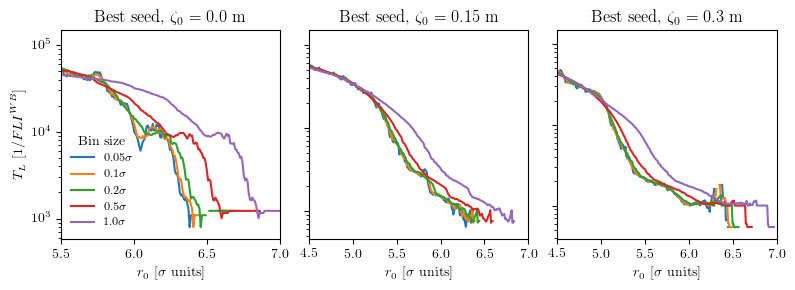

In [184]:
fig, axs = plt.subplots(1, 3, figsize=(8, 3))

for i, ax in zip(range(6,9), axs):
    for bucket_lenght in bucket_lenght_list:
        ax.plot(sigma_sample, thick_lyapunov_wb_evo_list[bucket_lenght][i], label=f"${bucket_lenght} \\sigma$")
    
    ax.set_yscale("log")
    ax.set_xlim(5.5 if i == 6 else 4.5, 7)
    ax.set_ylim(top=1.5e5)
    ax.set_xlabel("$r_0$ [$\\sigma$ units]")

    if i > 6:
        ax.set_yticklabels([])
        ax.set_ylabel("")
    else:
        ax.legend(title="Bin size", frameon=False, fontsize="small")
        ax.set_ylabel("$T_L$ $[1/{{FLI}}^{{WB}}]$")

    ax.set_title(f"{lattice_name_list[2]} seed, $\\zeta_0={zeta_name_list[i%3]}$ m")

plt.tight_layout()

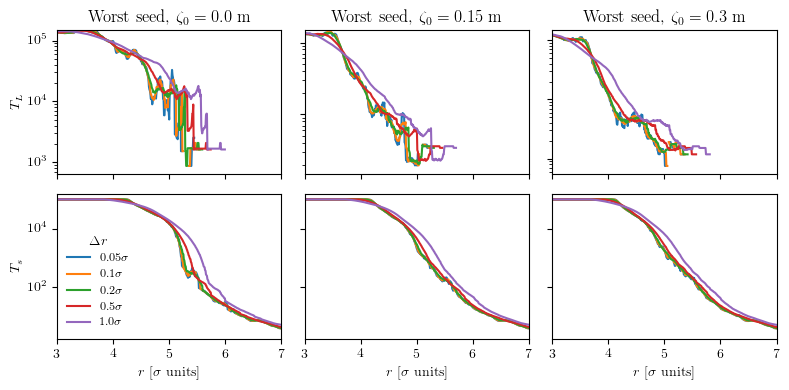

In [63]:
fig, axs = plt.subplots(2, 3, figsize=(8, 4), sharex=True)

for i, ax in zip(range(0,3), axs[0,:]):
    for bucket_lenght in bucket_lenght_list:
        ax.plot(sigma_sample, thick_lyapunov_wb_evo_list[bucket_lenght][i], label=f"${bucket_lenght} \\sigma$")
    
    ax.set_yscale("log")
    ax.set_xlim(3, 7)
    ax.set_ylim(top=1.5e5)
    # ax.set_xlabel("Initial radius [$\\sigma$ units]")

    if i > 0:
        ax.set_yticklabels([])
        ax.set_ylabel("")
    else:
        # ax.legend(title="Bin size", frameon=False, fontsize="small")
        ax.set_ylabel("$T_L$")

    ax.set_title(f"{lattice_name_list[0]} seed, $\\zeta_0={zeta_name_list[i%3]}$ m")

for i, ax in zip(range(0,3), axs[1,:]):
    for bucket_lenght in bucket_lenght_list:
        ax.plot(sigma_sample, thick_stability_wb_evo_list[bucket_lenght][i], label=f"${bucket_lenght} \\sigma$")
    
    ax.set_yscale("log")
    ax.set_xlim(3, 7)
    ax.set_ylim(top=1.5e5)
    ax.set_xlabel("$r$ [$\\sigma$ units]")

    if i > 0:
        ax.set_yticklabels([])
        ax.set_ylabel("")
    else:
        ax.legend(title="$\\Delta r$", frameon=False, fontsize="small")
        ax.set_ylabel("$T_s$")


    # ax.set_title(f"{lattice_name_list[2]} seed, $\\zeta_0={zeta_name_list[i%3]}$ m")

plt.tight_layout()
plt.savefig(os.path.join(IMGDIR, "lyapunov_time_vs_thickness.pdf"), bbox_inches="tight", dpi=600)


In [64]:
def mymode(data, nbins=20, val_range=None):
    # clean the data from nans and infs
    data = data[~np.isnan(data)]
    data = data[~np.isinf(data)]
    if len(data) == 0:
        return np.nan
    nbins = int(np.sqrt(len(data)))
    # create histogram
    hist, bin_edges = np.histogram(data, bins=nbins, range=val_range)
    # find the bin with the maximum value
    max_bin = np.argmax(hist)
    # return the mean of the bin edges
    return np.mean(bin_edges[max_bin:max_bin+2])

In [ ]:
lyapunov_evo_list = {t: [] for t in times}
lyapunov_wb_evo_list = {t: [] for t in times}
loss_evo_list = {t: [] for t in times}
lyapunov_evo_std_list = {t: [] for t in times}
lyapunov_wb_evo_std_list = {t: [] for t in times}
loss_evo_std_list = {t: [] for t in times}
lyapunov_evo_mode_list = {t: [] for t in times}
lyapunov_wb_evo_mode_list = {t: [] for t in times}
loss_evo_mode_list = {t: [] for t in times}

samples_evo_list = {t: [] for t in times}

bucket_lenght = 0.2
n_samples = 1000

sigma_sample_low = sigma_sample - bucket_lenght / 2
sigma_sample_high = sigma_sample + bucket_lenght / 2

for i, (idx) in enumerate((range(9))):
    for j, t in list(zip(range(26, len(times), 13), (times[26::13])))[::-1]:
        # print(j, t)
        data_mean = []
        data_mode = []
        data_std = []
        
        data_mean_wb = []
        data_mode_wb = []
        data_std_wb = []

        data_mean_stab = []
        data_mode_stab = []
        data_std_stab = []
        
        n_samples = []

        for s, l, h in zip(sigma_sample, sigma_sample_low, sigma_sample_high):
            mask = np.logical_and(radius_sigma_list[idx] >= l, radius_sigma_list[idx] < h)
            
            data_mean.append(np.nanmean(1/10**fli_x_post_data_list[idx][j][mask]))
            data_std.append(np.nanstd(1/10**fli_x_post_data_list[idx][j][mask]))
            data_mode.append(mymode(np.log10(1/10**fli_x_post_data_list[idx][j][mask])))
            
            tmp_data = flibk_x_post_data_list[idx][j][mask].copy()
            tmp_data[tmp_data < (-6 if t > 1000 else -5)] = np.nan
            
            tmp_data = 1/10**tmp_data
            data_mean_wb.append(np.nanmean(tmp_data))
            data_std_wb.append(np.nanstd(tmp_data))
            data_mode_wb.append(mymode(np.log10(tmp_data)))
            
            n_samples.append(np.count_nonzero(
                ~np.isnan(fli_x_post_data_list[idx][j][mask])
            ))

            data_mean_stab.append(np.nanmean(stability_list[idx][mask]))
            data_std_stab.append(np.nanstd(stability_list[idx][mask]))
            data_mode_stab.append(mymode(np.log10(stability_list[idx][mask])))
        
        lyapunov_evo_list[t].append(np.asarray(data_mean))
        lyapunov_evo_std_list[t].append(np.asarray(data_std))
        lyapunov_evo_mode_list[t].append(np.asarray(data_mode))

        lyapunov_wb_evo_list[t].append(np.asarray(data_mean_wb))
        lyapunov_wb_evo_std_list[t].append(np.asarray(data_std_wb))
        lyapunov_wb_evo_mode_list[t].append(np.asarray(data_mode_wb))

        loss_evo_list[t].append(np.asarray(data_mean_stab))
        loss_evo_std_list[t].append(np.asarray(data_std_stab))
        loss_evo_mode_list[t].append(np.asarray(data_mode_stab))
        
        samples_evo_list[t].append(np.asarray(n_samples))


/tmp/ipykernel_33878/1919580887.py:39: RuntimeWarning: Mean of empty slice
  data_mean.append(np.nanmean(1/10**fli_x_post_data_list[idx][j][mask]))
/tmp/ipykernel_33878/1919580887.py:47: RuntimeWarning: Mean of empty slice
  data_mean_wb.append(np.nanmean(tmp_data))


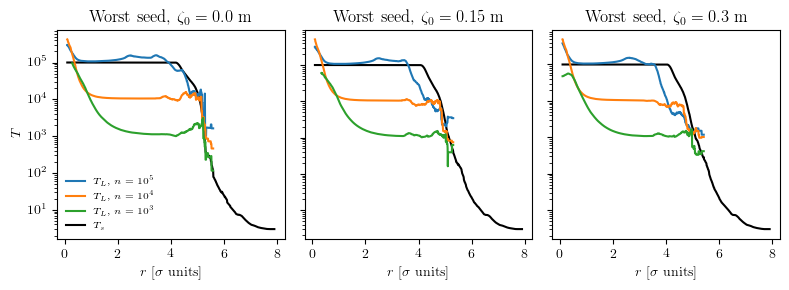

In [102]:
fig, axs = plt.subplots(1, 3, figsize=(8, 3))

for i, (idx, ax) in enumerate(zip(range(0, 3), axs)):
    ax.plot(sigma_sample, loss_evo_list[100000][idx], c="black")
    for t in [100000, 10000, 1000]:
        ax.plot(sigma_sample, lyapunov_wb_evo_list[t][idx],  label=f"$T_L$, $n=10^{int(np.log10(t))}$")
    ax.set_yscale("log")
    ax.plot([], [], c="black", label="$T_s$")
    # ax.set_ylim(1e2, 3e5)
    
    if i == 0:
        ax.set_ylabel("$T$")
    else:
        ax.set_yticklabels([])
    ax.set_xlabel("$r$ [$\\sigma$ units]")
    ax.set_title(f"{lattice_name_list[0]} seed, $\\zeta_0={zeta_name_list[i]}$ m")
    # ax_bis = ax.twinx()
    # ax_bis.scatter(sigma_sample, n_samples, marker="x", c="grey", s=5, alpha=0.5)
    # ax_bis.set_ylim(top=3900)
    # if i == 2:
    #     ax_bis.set_ylabel("Number of samples")
    # else:
    #     ax_bis.set_yticklabels([])
    if i == 0:
        ax.legend(fontsize="x-small", frameon=False)

plt.tight_layout()
plt.savefig(os.path.join(IMGDIR, "lyapunov_time_vs_radius.pdf"), bbox_inches="tight", dpi=600)

In [69]:
times[13]

100

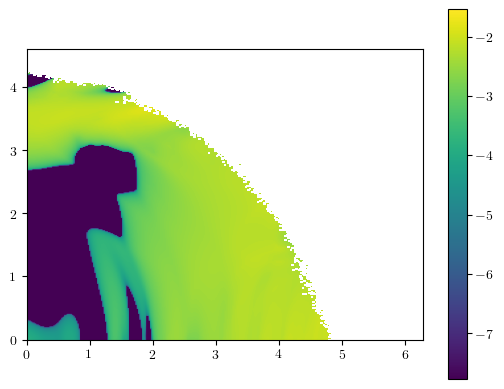

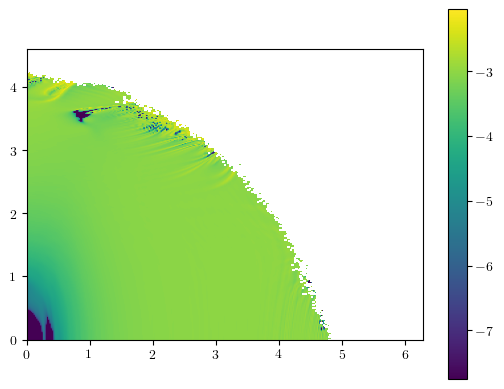

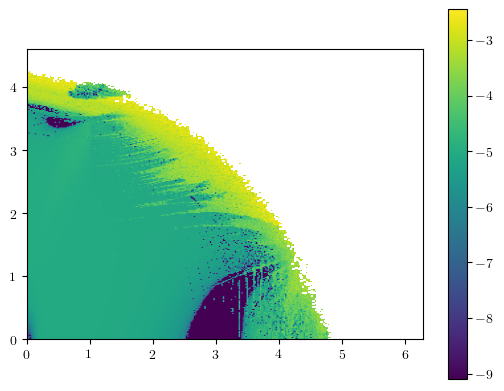

In [79]:
plt.figure()
plt.imshow((flibk_x_post_data_list[1][13]).reshape(300, 300), origin="lower", extent=e_list_sigma[2])
plt.colorbar()

plt.figure()
plt.imshow((flibk_x_post_data_list[1][26]).reshape(300, 300), origin="lower", extent=e_list_sigma[2])
plt.colorbar()

plt.figure()
plt.imshow((flibk_x_post_data_list[1][-1]).reshape(300, 300), origin="lower", extent=e_list_sigma[2])
plt.colorbar()

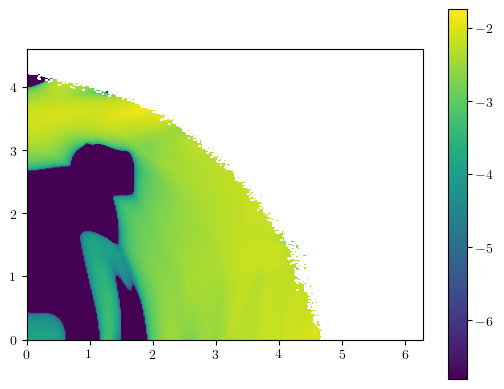

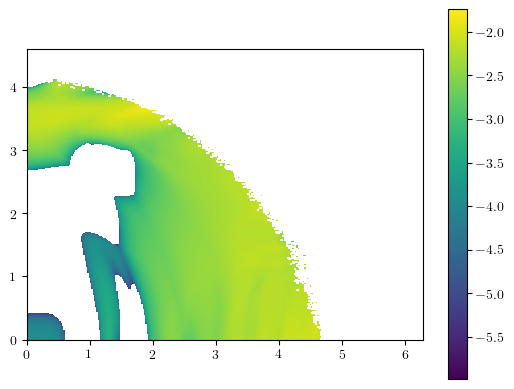

In [83]:
plt.figure()
plt.imshow((flibk_x_post_data_list[2][13]).reshape(300, 300), origin="lower", extent=e_list_sigma[2])
plt.colorbar()

plt.figure()
tmp_data = flibk_x_post_data_list[2][13].copy()
tmp_data[tmp_data < -6] = np.nan

plt.imshow((tmp_data).reshape(300, 300), origin="lower", extent=e_list_sigma[2])
plt.colorbar()

In [88]:
times[26]

1000

/tmp/ipykernel_33878/1832005875.py:20: RuntimeWarning: Mean of empty slice
  data_mean_wb.append(np.nanmean(tmp_data[mask]))


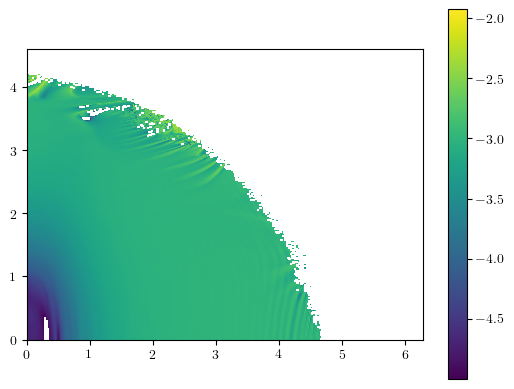

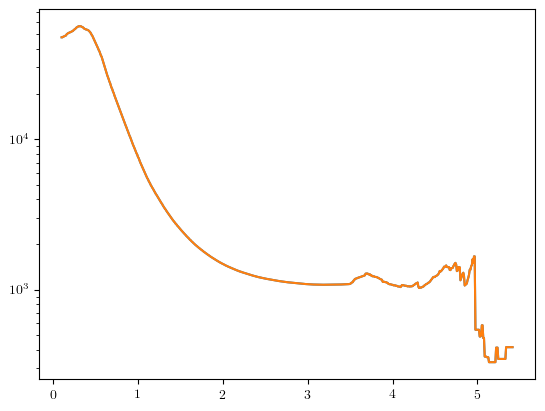

In [100]:
bucket_lenght = 0.2
n_samples = 1000

sigma_sample_low = sigma_sample - bucket_lenght / 2
sigma_sample_high = sigma_sample + bucket_lenght / 2

data_mean_wb = []
data_mode_wb = []
data_std_wb = []

tmp_data = flibk_x_post_data_list[2][26].copy()
tmp_data[tmp_data < -5.0] = np.nan
plt.figure()
plt.imshow((tmp_data).reshape(300, 300), origin="lower", extent=e_list_sigma[2])
plt.colorbar()
tmp_data = 1 / 10**tmp_data

for s, l, h in zip(sigma_sample, sigma_sample_low, sigma_sample_high):
    mask = np.logical_and(radius_sigma_list[2] >= l, radius_sigma_list[2] < h)
    data_mean_wb.append(np.nanmean(tmp_data[mask]))
    data_std_wb.append(np.nanstd(tmp_data[mask]))
    data_mode_wb.append(mymode(np.log10(tmp_data[mask])))

plt.figure()
plt.plot(sigma_sample, data_mean_wb)
plt.plot(sigma_sample, lyapunov_wb_evo_list[1000][2])
plt.yscale("log")

In [103]:
import lmfit
def resid_morbidelli_log(params, x, data=None):
    alpha = params["alpha"].value
    beta = params["beta"].value

    model = np.log10(alpha) + beta*np.log10(x)
    if data is None:
        return 10**model

    return model - np.log10(data)

[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 51
    # data points      = 150
    # variables        = 2
    chi-square         = 12.9368155
    reduced chi-square = 0.08741092
    Akaike info crit   = -363.583720
    Bayesian info crit = -357.562449
[[Variables]]
    alpha:  0.00258931 +/- 0.00106487 (41.13%) (init = 1)
    beta:   1.59803719 +/- 0.04405946 (2.76%) (init = 1)
[[Correlations]] (unreported correlations are < 0.100)
    C(alpha, beta) = -0.991
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 51
    # data points      = 129
    # variables        = 2
    chi-square         = 20.8018825
    reduced chi-square = 0.16379435
    Akaike info crit   = -231.395190
    Bayesian info crit = -225.675566
[[Variables]]
    alpha:  4.8566e-05 +/- 5.9360e-05 (122.22%) (init = 1)
    beta:   2.22004248 +/- 0.14248750 (6.42%) (init = 1)
[[Correlations]] (unreported correlations are < 0.100)
    C(alpha, beta) = -0.998
[[Fit Stati

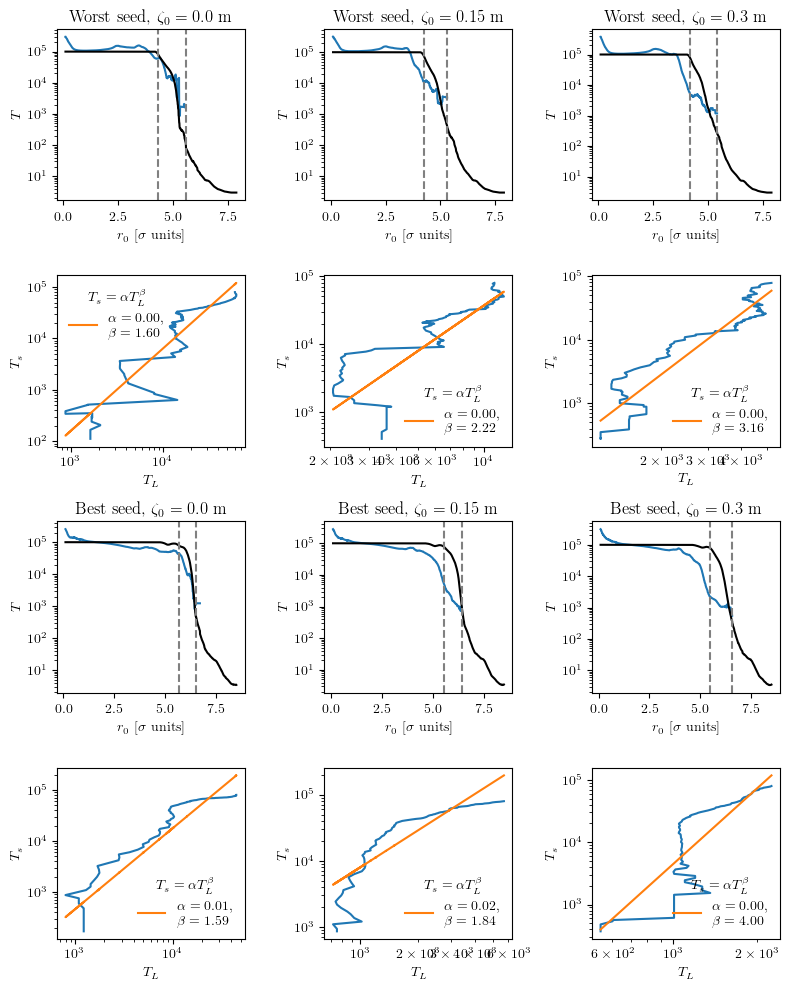

In [286]:
import lmfit

fig, axs = plt.subplots(4, 3, figsize=(8, 10))

idx_list = [0,1,2,6,7,8]

ax_list = [
    [axs[0,0], axs[1,0]],
    [axs[0,1], axs[1,1]],
    [axs[0,2], axs[1,2]],
    [axs[2,0], axs[3,0]],
    [axs[2,1], axs[3,1]],
    [axs[2,2], axs[3,2]],
]

for i, (idx, (ax1, ax2)) in enumerate(zip(idx_list, ax_list)):

    mask = np.logical_and(np.logical_and(loss_evo_list[100000][idx] < 80000, ~np.isnan(loss_evo_list[100000][idx])), ~np.isnan(lyapunov_wb_evo_list[100000][idx]))

    # get index of first true in mask
    first_true = np.argmax(mask)
    second_true = np.argmax(np.isnan(lyapunov_wb_evo_list[100000][idx]))


    ax1.plot(sigma_sample, lyapunov_wb_evo_list[100000][idx])
    ax1.plot(sigma_sample, loss_evo_list[100000][idx], c="black")
    ax1.axvline(sigma_sample[first_true], c="grey", ls="--")
    ax1.axvline(sigma_sample[second_true], c="grey", ls="--")

    ax1.set_yscale("log")
    ax1.set_ylabel("$T$")
    ax1.set_xlabel("$r_0$ [$\\sigma$ units]")
    ax1.set_title(f"{lattice_name_list[(0 if i < 3 else 2)]} seed, $\\zeta_0={zeta_name_list[i%3]}$ m")



    params = lmfit.Parameters()
    params.add("alpha", value=1, min=0)
    params.add("beta", value=1)

    out = lmfit.minimize(resid_morbidelli_log, params, args=(lyapunov_wb_evo_list[100000][idx][mask], loss_evo_list[100000][idx][mask]))

    lmfit.report_fit(out)

    ax2.plot(lyapunov_wb_evo_list[100000][idx][mask], loss_evo_list[100000][idx][mask])
    ax2.plot(lyapunov_wb_evo_list[100000][idx][mask], resid_morbidelli_log(out.params, lyapunov_wb_evo_list[100000][idx][mask]), label=f"$\\alpha={out.params['alpha'].value:.2f}$,\n$\\beta={out.params['beta'].value:.2f}$")
    ax2.legend(frameon=False, title="$T_s = \\alpha T_L^\\beta$")

    ax2.set_xlabel("$T_L$")
    ax2.set_ylabel("$T_s$")
    ax2.set_xscale("log")
    ax2.set_yscale("log")

plt.tight_layout()

plt.savefig("log_fit_morbidelli_log.png", bbox_inches="tight", dpi=600)
# tmp = np.linspace(500, 3000, 1000)
# plt.plot(tmp, 10 * tmp**1)

In [ ]:
import lmfit
def resid_morbidelli(params, x, data=None):
    alpha = params["alpha"].value
    beta = params["beta"].value

    model = alpha * x ** beta
    if data is None:
        return model

    return model - data

[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 36
    # data points      = 150
    # variables        = 2
    chi-square         = 6.9461e+09
    reduced chi-square = 46932780.5
    Akaike info crit   = 2651.62059
    Bayesian info crit = 2657.64186
[[Variables]]
    alpha:  4.18124367 +/- 1.45483251 (34.79%) (init = 1)
    beta:   0.87993261 +/- 0.03265386 (3.71%) (init = 1)
[[Correlations]] (unreported correlations are < 0.100)
    C(alpha, beta) = -0.999
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 143
    # data points      = 129
    # variables        = 2
    chi-square         = 7.5864e+09
    reduced chi-square = 59735655.8
    Akaike info crit   = 2311.78605
    Bayesian info crit = 2317.50567
[[Variables]]
    alpha:  0.00109049 +/- 0.00105412 (96.66%) (init = 1)
    beta:   1.89736811 +/- 0.10457557 (5.51%) (init = 1)
[[Correlations]] (unreported correlations are < 0.100)
    C(alpha, beta) = -1.000
[[Fit Statistic

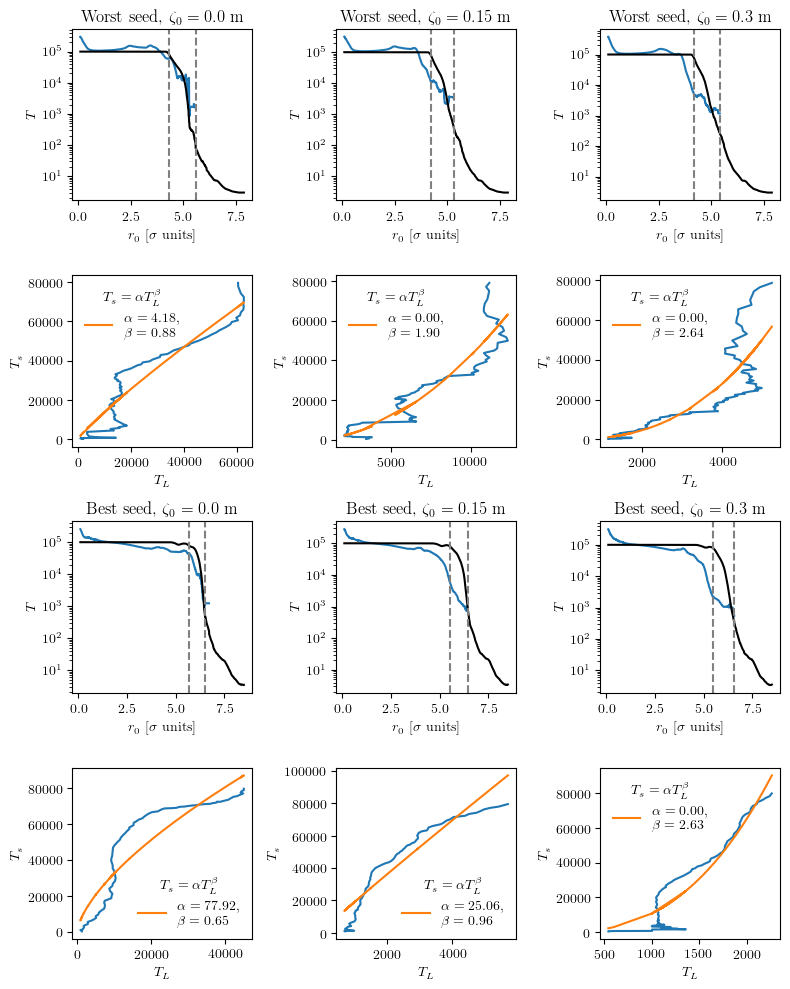

In [278]:
import lmfit

fig, axs = plt.subplots(4, 3, figsize=(8, 10))

idx_list = [0,1,2,6,7,8]

ax_list = [
    [axs[0,0], axs[1,0]],
    [axs[0,1], axs[1,1]],
    [axs[0,2], axs[1,2]],
    [axs[2,0], axs[3,0]],
    [axs[2,1], axs[3,1]],
    [axs[2,2], axs[3,2]],
]

for i, (idx, (ax1, ax2)) in enumerate(zip(idx_list, ax_list)):

    mask = np.logical_and(np.logical_and(loss_evo_list[100000][idx] < 80000, ~np.isnan(loss_evo_list[100000][idx])), ~np.isnan(lyapunov_wb_evo_list[100000][idx]))

    # get index of first true in mask
    first_true = np.argmax(mask)
    second_true = np.argmax(np.isnan(lyapunov_wb_evo_list[100000][idx]))


    ax1.plot(sigma_sample, lyapunov_wb_evo_list[100000][idx])
    ax1.plot(sigma_sample, loss_evo_list[100000][idx], c="black")
    ax1.axvline(sigma_sample[first_true], c="grey", ls="--")
    ax1.axvline(sigma_sample[second_true], c="grey", ls="--")

    ax1.set_yscale("log")
    ax1.set_ylabel("$T$")
    ax1.set_xlabel("$r_0$ [$\\sigma$ units]")
    ax1.set_title(f"{lattice_name_list[(0 if i < 3 else 2)]} seed, $\\zeta_0={zeta_name_list[i%3]}$ m")



    params = lmfit.Parameters()
    params.add("alpha", value=1)
    params.add("beta", value=1)

    out = lmfit.minimize(resid_morbidelli, params, args=(lyapunov_wb_evo_list[100000][idx][mask], loss_evo_list[100000][idx][mask]))

    lmfit.report_fit(out)

    ax2.plot(lyapunov_wb_evo_list[100000][idx][mask], loss_evo_list[100000][idx][mask])
    ax2.plot(lyapunov_wb_evo_list[100000][idx][mask], resid_morbidelli(out.params, lyapunov_wb_evo_list[100000][idx][mask]), label=f"$\\alpha={out.params['alpha'].value:.2f}$,\n$\\beta={out.params['beta'].value:.2f}$")
    ax2.legend(frameon=False, title="$T_s = \\alpha T_L^\\beta$")

    ax2.set_xlabel("$T_L$")
    ax2.set_ylabel("$T_s$")

plt.tight_layout()

plt.savefig("morbidelli_basic.png", bbox_inches="tight", dpi=600)
# tmp = np.linspace(500, 3000, 1000)
# plt.plot(tmp, 10 * tmp**1)

[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 36
    # data points      = 150
    # variables        = 2
    chi-square         = 6.9461e+09
    reduced chi-square = 46932780.5
    Akaike info crit   = 2651.62059
    Bayesian info crit = 2657.64186
[[Variables]]
    alpha:  4.18124367 +/- 1.45483251 (34.79%) (init = 1)
    beta:   0.87993261 +/- 0.03265386 (3.71%) (init = 1)
[[Correlations]] (unreported correlations are < 0.100)
    C(alpha, beta) = -0.999
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 143
    # data points      = 129
    # variables        = 2
    chi-square         = 7.5864e+09
    reduced chi-square = 59735655.8
    Akaike info crit   = 2311.78605
    Bayesian info crit = 2317.50567
[[Variables]]
    alpha:  0.00109049 +/- 0.00105412 (96.66%) (init = 1)
    beta:   1.89736811 +/- 0.10457557 (5.51%) (init = 1)
[[Correlations]] (unreported correlations are < 0.100)
    C(alpha, beta) = -1.000
[[Fit Statistic

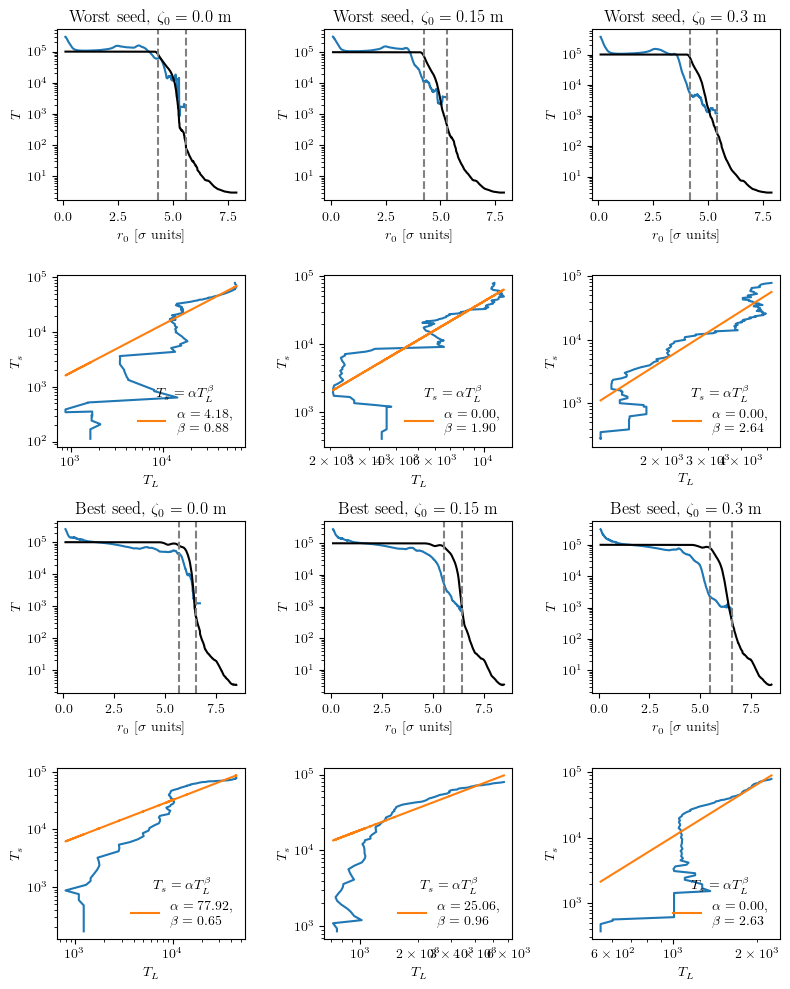

In [279]:
import lmfit

fig, axs = plt.subplots(4, 3, figsize=(8, 10))

idx_list = [0,1,2,6,7,8]

ax_list = [
    [axs[0,0], axs[1,0]],
    [axs[0,1], axs[1,1]],
    [axs[0,2], axs[1,2]],
    [axs[2,0], axs[3,0]],
    [axs[2,1], axs[3,1]],
    [axs[2,2], axs[3,2]],
]

for i, (idx, (ax1, ax2)) in enumerate(zip(idx_list, ax_list)):

    mask = np.logical_and(np.logical_and(loss_evo_list[100000][idx] < 80000, ~np.isnan(loss_evo_list[100000][idx])), ~np.isnan(lyapunov_wb_evo_list[100000][idx]))

    # get index of first true in mask
    first_true = np.argmax(mask)
    second_true = np.argmax(np.isnan(lyapunov_wb_evo_list[100000][idx]))


    ax1.plot(sigma_sample, lyapunov_wb_evo_list[100000][idx])
    ax1.plot(sigma_sample, loss_evo_list[100000][idx], c="black")
    ax1.axvline(sigma_sample[first_true], c="grey", ls="--")
    ax1.axvline(sigma_sample[second_true], c="grey", ls="--")

    ax1.set_yscale("log")
    ax1.set_ylabel("$T$")
    ax1.set_xlabel("$r_0$ [$\\sigma$ units]")
    ax1.set_title(f"{lattice_name_list[(0 if i < 3 else 2)]} seed, $\\zeta_0={zeta_name_list[i%3]}$ m")



    params = lmfit.Parameters()
    params.add("alpha", value=1)
    params.add("beta", value=1)

    out = lmfit.minimize(resid_morbidelli, params, args=(lyapunov_wb_evo_list[100000][idx][mask], loss_evo_list[100000][idx][mask]))

    lmfit.report_fit(out)

    ax2.plot(lyapunov_wb_evo_list[100000][idx][mask], loss_evo_list[100000][idx][mask])
    ax2.plot(lyapunov_wb_evo_list[100000][idx][mask], resid_morbidelli(out.params, lyapunov_wb_evo_list[100000][idx][mask]), label=f"$\\alpha={out.params['alpha'].value:.2f}$,\n$\\beta={out.params['beta'].value:.2f}$")
    ax2.legend(frameon=False, title="$T_s = \\alpha T_L^\\beta$")

    ax2.set_xlabel("$T_L$")
    ax2.set_ylabel("$T_s$")
    ax2.set_xscale("log")
    ax2.set_yscale("log")

plt.tight_layout()

plt.savefig("morbidelli_log.png", bbox_inches="tight", dpi=600)
# tmp = np.linspace(500, 3000, 1000)
# plt.plot(tmp, 10 * tmp**1)

[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 49
    # data points      = 98
    # variables        = 2
    chi-square         = 5.4338e+09
    reduced chi-square = 56602314.3
    Akaike info crit   = 1751.43223
    Bayesian info crit = 1756.60217
[[Variables]]
    alpha:  8.94033462 +/- 3.52435390 (39.42%) (init = 1)
    beta:   0.80961383 +/- 0.03704122 (4.58%) (init = 1)
[[Correlations]] (unreported correlations are < 0.100)
    C(alpha, beta) = -0.999
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 114
    # data points      = 84
    # variables        = 2
    chi-square         = 6.6659e+09
    reduced chi-square = 81291548.0
    Akaike info crit   = 1531.91422
    Bayesian info crit = 1536.77586
[[Variables]]
    alpha:  0.00699981 +/- 0.00825390 (117.92%) (init = 1)
    beta:   1.69717017 +/- 0.12764669 (7.52%) (init = 1)
[[Correlations]] (unreported correlations are < 0.100)
    C(alpha, beta) = -1.000
[[Fit Statistics

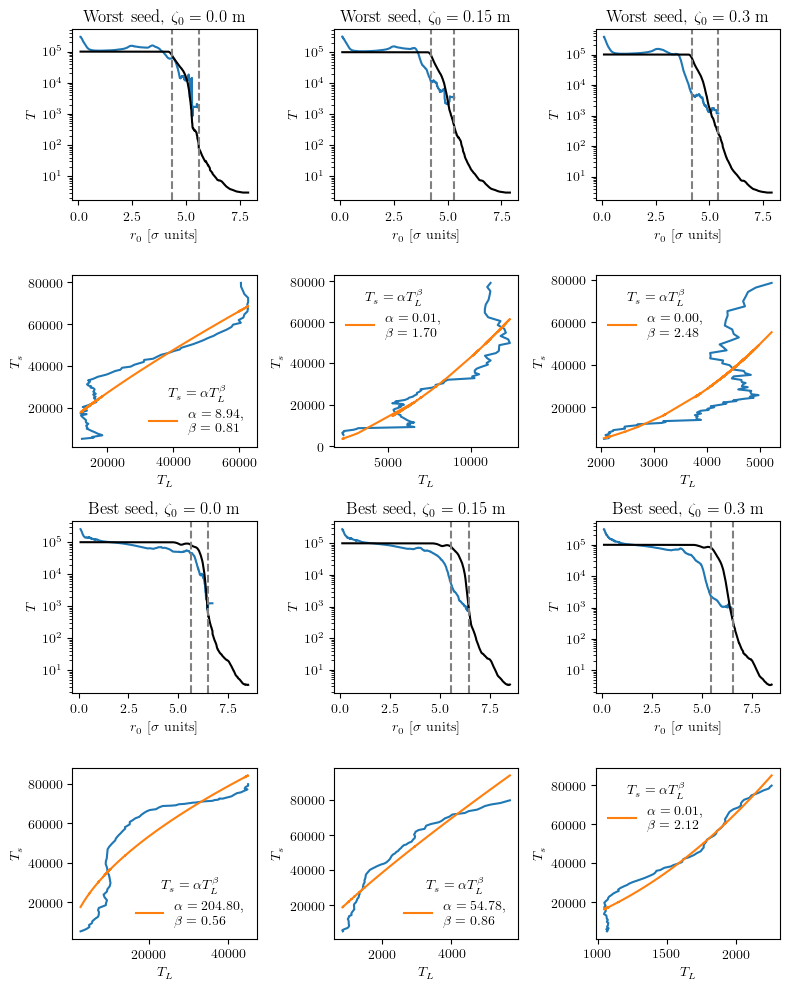

In [280]:
import lmfit

fig, axs = plt.subplots(4, 3, figsize=(8, 10))

idx_list = [0,1,2,6,7,8]

ax_list = [
    [axs[0,0], axs[1,0]],
    [axs[0,1], axs[1,1]],
    [axs[0,2], axs[1,2]],
    [axs[2,0], axs[3,0]],
    [axs[2,1], axs[3,1]],
    [axs[2,2], axs[3,2]],
]

for i, (idx, (ax1, ax2)) in enumerate(zip(idx_list, ax_list)):

    mask = np.logical_and(np.logical_and(np.logical_and(loss_evo_list[100000][idx] < 80000, ~np.isnan(loss_evo_list[100000][idx])), ~np.isnan(lyapunov_wb_evo_list[100000][idx])), loss_evo_list[100000][idx] > 5000)

    # get index of first true in mask
    first_true = np.argmax(mask)
    second_true = np.argmax(np.isnan(lyapunov_wb_evo_list[100000][idx]))


    ax1.plot(sigma_sample, lyapunov_wb_evo_list[100000][idx])
    ax1.plot(sigma_sample, loss_evo_list[100000][idx], c="black")
    ax1.axvline(sigma_sample[first_true], c="grey", ls="--")
    ax1.axvline(sigma_sample[second_true], c="grey", ls="--")

    ax1.set_yscale("log")
    ax1.set_ylabel("$T$")
    ax1.set_xlabel("$r_0$ [$\\sigma$ units]")
    ax1.set_title(f"{lattice_name_list[(0 if i < 3 else 2)]} seed, $\\zeta_0={zeta_name_list[i%3]}$ m")



    params = lmfit.Parameters()
    params.add("alpha", value=1)
    params.add("beta", value=1)

    out = lmfit.minimize(resid_morbidelli, params, args=(lyapunov_wb_evo_list[100000][idx][mask], loss_evo_list[100000][idx][mask]))

    lmfit.report_fit(out)

    ax2.plot(lyapunov_wb_evo_list[100000][idx][mask], loss_evo_list[100000][idx][mask])
    ax2.plot(lyapunov_wb_evo_list[100000][idx][mask], resid_morbidelli(out.params, lyapunov_wb_evo_list[100000][idx][mask]), label=f"$\\alpha={out.params['alpha'].value:.2f}$,\n$\\beta={out.params['beta'].value:.2f}$")
    ax2.legend(frameon=False, title="$T_s = \\alpha T_L^\\beta$")

    ax2.set_xlabel("$T_L$")
    ax2.set_ylabel("$T_s$")

plt.tight_layout()

plt.savefig("morbidelli_basic_limited_at_ts=5000.png", bbox_inches="tight", dpi=600)
# tmp = np.linspace(500, 3000, 1000)
# plt.plot(tmp, 10 * tmp**1)

[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 49
    # data points      = 98
    # variables        = 2
    chi-square         = 5.4338e+09
    reduced chi-square = 56602314.3
    Akaike info crit   = 1751.43223
    Bayesian info crit = 1756.60217
[[Variables]]
    alpha:  8.94033462 +/- 3.52435390 (39.42%) (init = 1)
    beta:   0.80961383 +/- 0.03704122 (4.58%) (init = 1)
[[Correlations]] (unreported correlations are < 0.100)
    C(alpha, beta) = -0.999
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 114
    # data points      = 84
    # variables        = 2
    chi-square         = 6.6659e+09
    reduced chi-square = 81291548.0
    Akaike info crit   = 1531.91422
    Bayesian info crit = 1536.77586
[[Variables]]
    alpha:  0.00699981 +/- 0.00825390 (117.92%) (init = 1)
    beta:   1.69717017 +/- 0.12764669 (7.52%) (init = 1)
[[Correlations]] (unreported correlations are < 0.100)
    C(alpha, beta) = -1.000
[[Fit Statistics

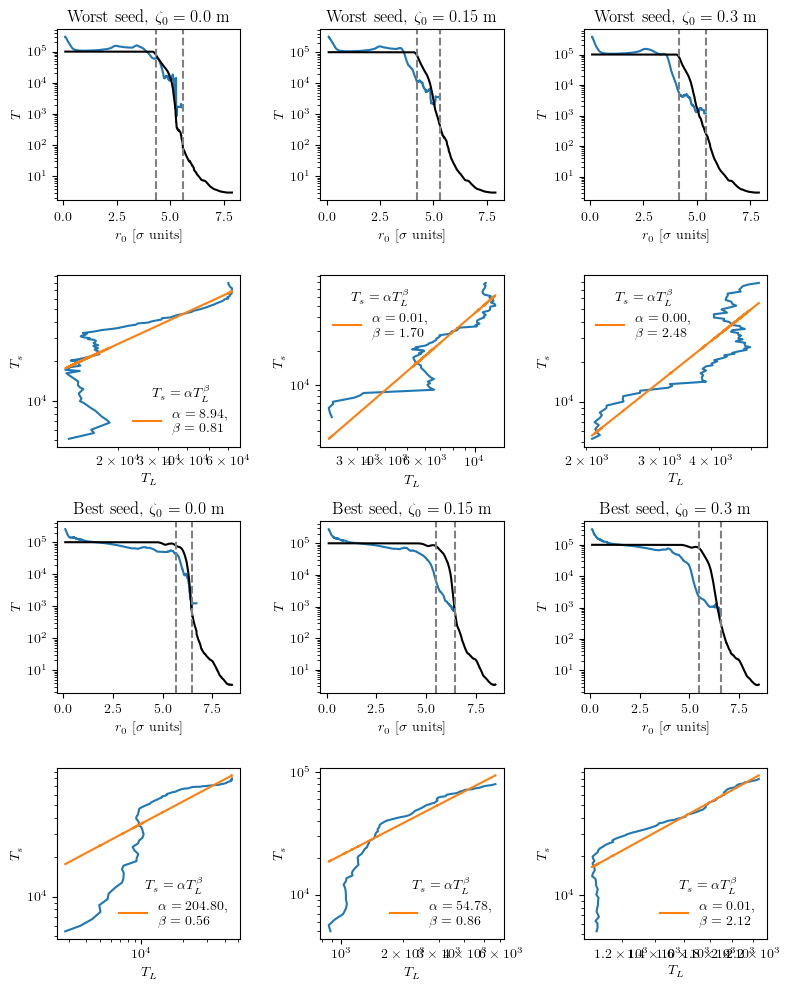

In [281]:
import lmfit

fig, axs = plt.subplots(4, 3, figsize=(8, 10))

idx_list = [0,1,2,6,7,8]

ax_list = [
    [axs[0,0], axs[1,0]],
    [axs[0,1], axs[1,1]],
    [axs[0,2], axs[1,2]],
    [axs[2,0], axs[3,0]],
    [axs[2,1], axs[3,1]],
    [axs[2,2], axs[3,2]],
]

for i, (idx, (ax1, ax2)) in enumerate(zip(idx_list, ax_list)):

    mask = np.logical_and(np.logical_and(np.logical_and(loss_evo_list[100000][idx] < 80000, ~np.isnan(loss_evo_list[100000][idx])), ~np.isnan(lyapunov_wb_evo_list[100000][idx])), loss_evo_list[100000][idx] > 5000)


    # get index of first true in mask
    first_true = np.argmax(mask)
    second_true = np.argmax(np.isnan(lyapunov_wb_evo_list[100000][idx]))


    ax1.plot(sigma_sample, lyapunov_wb_evo_list[100000][idx])
    ax1.plot(sigma_sample, loss_evo_list[100000][idx], c="black")
    ax1.axvline(sigma_sample[first_true], c="grey", ls="--")
    ax1.axvline(sigma_sample[second_true], c="grey", ls="--")

    ax1.set_yscale("log")
    ax1.set_ylabel("$T$")
    ax1.set_xlabel("$r_0$ [$\\sigma$ units]")
    ax1.set_title(f"{lattice_name_list[(0 if i < 3 else 2)]} seed, $\\zeta_0={zeta_name_list[i%3]}$ m")



    params = lmfit.Parameters()
    params.add("alpha", value=1)
    params.add("beta", value=1)

    out = lmfit.minimize(resid_morbidelli, params, args=(lyapunov_wb_evo_list[100000][idx][mask], loss_evo_list[100000][idx][mask]))

    lmfit.report_fit(out)

    ax2.plot(lyapunov_wb_evo_list[100000][idx][mask], loss_evo_list[100000][idx][mask])
    ax2.plot(lyapunov_wb_evo_list[100000][idx][mask], resid_morbidelli(out.params, lyapunov_wb_evo_list[100000][idx][mask]), label=f"$\\alpha={out.params['alpha'].value:.2f}$,\n$\\beta={out.params['beta'].value:.2f}$")
    ax2.legend(frameon=False, title="$T_s = \\alpha T_L^\\beta$")

    ax2.set_xlabel("$T_L$")
    ax2.set_ylabel("$T_s$")
    ax2.set_xscale("log")
    ax2.set_yscale("log")

plt.tight_layout()

plt.savefig("morbidelli_log_limited_at_ts=5000.png", bbox_inches="tight", dpi=600)
# tmp = np.linspace(500, 3000, 1000)
# plt.plot(tmp, 10 * tmp**1)

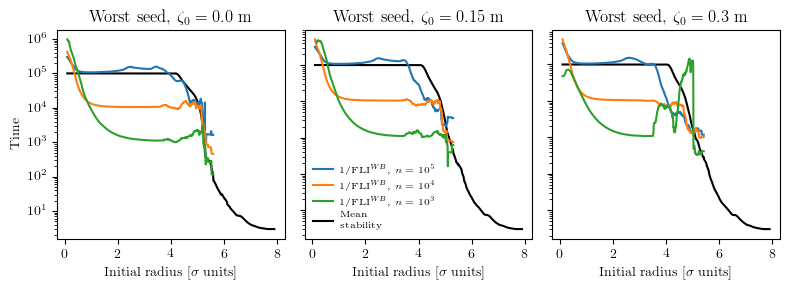

In [273]:
fig, axs = plt.subplots(1, 3, figsize=(8, 3))

for i, (idx, ax) in enumerate(zip(range(0, 3), axs)):
    ax.plot(sigma_sample, loss_evo_list[100000][idx], c="black")
    for t in [100000, 10000, 1000]:
        ax.plot(sigma_sample, lyapunov_wb_evo_list[t][idx],  label=f"1/FLI$^{{WB}}$, $n=10^{int(np.log10(t))}$")
    ax.set_yscale("log")
    ax.plot([], [], c="black", label="Mean\nstability")
    # ax.set_ylim(1e2, 3e5)
    
    if i == 0:
        ax.set_ylabel("Time")
    else:
        ax.set_yticklabels([])
    ax.set_xlabel("Initial radius [$\\sigma$ units]")
    ax.set_title(f"{lattice_name_list[0]} seed, $\\zeta_0={zeta_name_list[i]}$ m")
    # ax_bis = ax.twinx()
    # ax_bis.scatter(sigma_sample, n_samples, marker="x", c="grey", s=5, alpha=0.5)
    # ax_bis.set_ylim(top=3900)
    # if i == 2:
    #     ax_bis.set_ylabel("Number of samples")
    # else:
    #     ax_bis.set_yticklabels([])
    if i == 1:
        ax.legend(fontsize="x-small", frameon=False)

plt.tight_layout()
plt.savefig(os.path.join(IMGDIR, "lyapunov_time_vs_radius.png"), bbox_inches="tight", dpi=600)

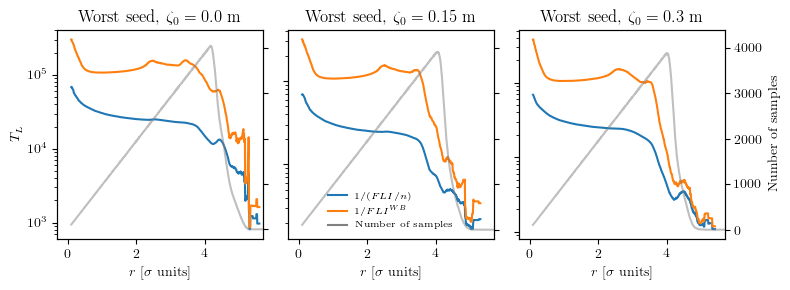

In [107]:
fig, axs = plt.subplots(1, 3, figsize=(8, 3))

for i, (idx, ax) in enumerate(zip(range(0, 3), axs)):
    # ax.plot(sigma_sample, loss_evo_list[100000][idx], c="black")
    # for t in [100000, 10000, 1000]:
    ax.plot(sigma_sample, lyapunov_evo_list[100000][idx],  label=f"$1/(FLI/n)$")#, $n=10^{int(np.log10(100000))}$")
    ax.plot(sigma_sample, lyapunov_wb_evo_list[100000][idx],  label=f"$1/FLI^{{WB}}$")#, $n=10^{int(np.log10(100000))}$")
    ax.set_yscale("log")
    # ax.plot([], [], c="black", label="Mean\nstability")
    # ax.set_ylim(1e2, 3e5)
    ax.plot([],[], c="grey", label="Number of samples")
    
    if i == 0:
        ax.set_ylabel("$T_L$")
    else:
        ax.set_yticklabels([])
    ax.set_xlabel("$r$ [$\\sigma$ units]")
    ax.set_title(f"{lattice_name_list[0]} seed, $\\zeta_0={zeta_name_list[i]}$ m")
    ax_bis = ax.twinx()
    ax_bis.plot(sigma_sample, samples_evo_list[100000][idx], c="grey", alpha=0.5)
    ax_bis.set_ylim(top=4400)
    if i == 2:
        ax_bis.set_ylabel("Number of samples")
    else:
        ax_bis.set_yticklabels([])
    if i == 1:
        ax.legend(fontsize="x-small", frameon=False, loc='lower center')

    ax.set_xlim(right=5.7)

plt.tight_layout()
plt.savefig(os.path.join(IMGDIR, "lyapunov_time_vs_lyapunov_wb_time.pdf"), bbox_inches="tight", dpi=600)

['$10^3$', '$10^4$', '$10^5$']


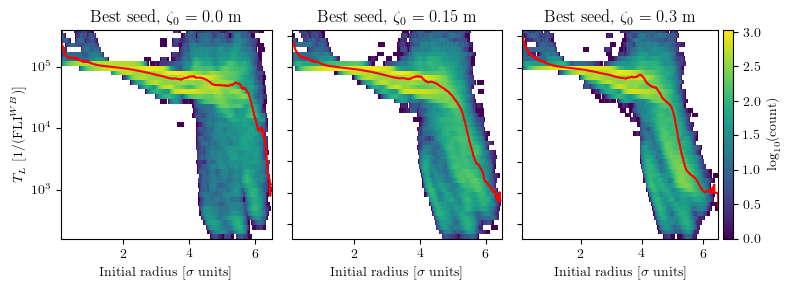

In [46]:
bucket_lenght = 0.2
n_samples = 1000
sigma_sample_low = sigma_sample - bucket_lenght / 2
sigma_sample_high = sigma_sample + bucket_lenght / 2

fig, axs = plt.subplots(1, 3, figsize=(8, 3))

for i, (idx, ax) in enumerate(zip(range(6, 9), axs)):

    data_list = []
    data_mean = []

    for s, l, h in zip(sigma_sample, sigma_sample_low, sigma_sample_high):
        mask = np.logical_and(radius_sigma_list[idx] >= l, radius_sigma_list[idx] < h)

        tmp_data = (np.asarray(flibk_x_post_data_list[idx][-1][mask])).copy()
        tmp_data[tmp_data < -6] = np.nan
        tmp_data = 1/10**tmp_data

        data_list.append(np.log10(tmp_data))
        data_mean.append(np.log10(np.nanmean(tmp_data)))

    v_min = np.infty
    v_max = -np.infty
    for d in data_list:
        v_min = np.nanmin([v_min, np.nanmin(d)])
        v_max = np.nanmax([v_max, np.nanmax(d)])

    count_map, bin_centers = compose_count_map(data_list, v_min, v_max, density=False, nbins=50)

    cmap = ax.imshow(np.log10(count_map).T, aspect="auto", origin="lower", interpolation="none", extent=[sigma_sample[0], sigma_sample[-1], v_min, v_max])
    ax.plot(sigma_sample, data_mean, c="red")
    # plt.colorbar()
    ax.set_xlim(right=6.5)
    ax.set_ylim(top=5.6)

    if i == 2:
        divider = make_axes_locatable(ax)
        cax = divider.append_axes("right", size="5%", pad=0.05)
        cbar = plt.colorbar(cmap, cax=cax, label="$\\log_{{10}}(\\mathrm{{count}})$")

    if i != 0:
        ax.set_yticklabels([])
    else:
        ax.set_ylabel("$T_L$ $[1/(\\mathrm{{FLI}}^{{WB}})]$")
        # write ticklabels in the form of 10^{{number}}
        ax.set_yticks([3,4,5])
        labels = [f"$10^{i}$" for i in [3,4,5]]
        print(labels)
        ax.set_yticklabels(labels)
    ax.set_xlabel("Initial radius [$\\sigma$ units]")

    ax.set_title(f"{lattice_name_list[2]} seed, $\\zeta_0={zeta_name_list[i]}$ m")

plt.tight_layout()
plt.savefig(os.path.join(IMGDIR, "lyapunov_dist_and_mean.png"), bbox_inches="tight", dpi=600)


['$10^0$', '$10^1$', '$10^2$', '$10^3$', '$10^4$', '$10^5$']


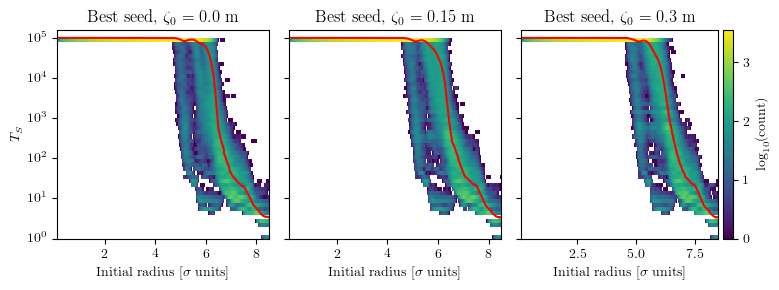

In [50]:
bucket_lenght = 0.2
n_samples = 1000
sigma_sample_low = sigma_sample - bucket_lenght / 2
sigma_sample_high = sigma_sample + bucket_lenght / 2

fig, axs = plt.subplots(1, 3, figsize=(8, 3))

for i, (idx, ax) in enumerate(zip(range(6, 9), axs)):

    data_list = []
    data_mean = []

    for s, l, h in zip(sigma_sample, sigma_sample_low, sigma_sample_high):
        mask = np.logical_and(radius_sigma_list[idx] >= l, radius_sigma_list[idx] < h)

        tmp_data = (np.asarray(stability_list[idx][mask])).copy()
        
        data_list.append(np.log10(tmp_data))
        data_mean.append(np.log10(np.nanmean(tmp_data)))

    v_min = np.infty
    v_max = -np.infty
    for d in data_list:
        v_min = np.nanmin([v_min, np.nanmin(d)])
        v_max = np.nanmax([v_max, np.nanmax(d)])

    count_map, bin_centers = compose_count_map(data_list, v_min, v_max, density=False, nbins=50)

    cmap = ax.imshow(np.log10(count_map).T, aspect="auto", origin="lower", interpolation="none", extent=[sigma_sample[0], sigma_sample[-1], v_min, v_max])
    ax.plot(sigma_sample, data_mean, c="red")
    # plt.colorbar()
    ax.set_xlim(right=8.5)
    ax.set_ylim(top=5.2)

    if i == 2:
        divider = make_axes_locatable(ax)
        cax = divider.append_axes("right", size="5%", pad=0.05)
        cbar = plt.colorbar(cmap, cax=cax, label="$\\log_{{10}}(\\mathrm{{count}})$")

    if i != 0:
        ax.set_yticklabels([])
    else:
        ax.set_ylabel("$T_S$")
        # write ticklabels in the form of 10^{{number}}
        ax.set_yticks(range(6))
        labels = [f"$10^{i}$" for i in range(6)]
        print(labels)
        ax.set_yticklabels(labels)
    ax.set_xlabel("Initial radius [$\\sigma$ units]")

    ax.set_title(f"{lattice_name_list[2]} seed, $\\zeta_0={zeta_name_list[i]}$ m")

plt.tight_layout()
plt.savefig(os.path.join(IMGDIR, "stab_dist_and_mean.png"), bbox_inches="tight", dpi=600)


In [111]:
sigma_sample

array([0.1       , 0.10840841, 0.11681682, 0.12522523, 0.13363363,
       0.14204204, 0.15045045, 0.15885886, 0.16726727, 0.17567568,
       0.18408408, 0.19249249, 0.2009009 , 0.20930931, 0.21771772,
       0.22612613, 0.23453453, 0.24294294, 0.25135135, 0.25975976,
       0.26816817, 0.27657658, 0.28498498, 0.29339339, 0.3018018 ,
       0.31021021, 0.31861862, 0.32702703, 0.33543544, 0.34384384,
       0.35225225, 0.36066066, 0.36906907, 0.37747748, 0.38588589,
       0.39429429, 0.4027027 , 0.41111111, 0.41951952, 0.42792793,
       0.43633634, 0.44474474, 0.45315315, 0.46156156, 0.46996997,
       0.47837838, 0.48678679, 0.4951952 , 0.5036036 , 0.51201201,
       0.52042042, 0.52882883, 0.53723724, 0.54564565, 0.55405405,
       0.56246246, 0.57087087, 0.57927928, 0.58768769, 0.5960961 ,
       0.6045045 , 0.61291291, 0.62132132, 0.62972973, 0.63813814,
       0.64654655, 0.65495495, 0.66336336, 0.67177177, 0.68018018,
       0.68858859, 0.696997  , 0.70540541, 0.71381381, 0.72222

/tmp/ipykernel_33878/799592932.py:22: RuntimeWarning: Mean of empty slice
  data_mean.append(np.log10(np.nanmean(tmp_data)))
/tmp/ipykernel_33878/799592932.py:30: RuntimeWarning: All-NaN slice encountered
  v_min = np.nanmin([v_min, np.nanmin(d)])
/tmp/ipykernel_33878/799592932.py:31: RuntimeWarning: All-NaN slice encountered
  v_max = np.nanmax([v_max, np.nanmax(d)])
/tmp/ipykernel_33878/799592932.py:35: RuntimeWarning: divide by zero encountered in log10
  cmap = ax.imshow(np.log10(count_map).T, aspect="auto", origin="lower", interpolation="none", extent=[sigma_sample[0], sigma_sample[-1], v_min, v_max])


['$10^3$', '$10^4$', '$10^5$']


/tmp/ipykernel_33878/799592932.py:85: RuntimeWarning: divide by zero encountered in log10
  cmap = ax.imshow(np.log10(count_map).T, aspect="auto", origin="lower", interpolation="none", extent=[sigma_sample[0], sigma_sample[-1], v_min, v_max])


['$10^0$', '$10^1$', '$10^2$', '$10^3$', '$10^4$', '$10^5$']


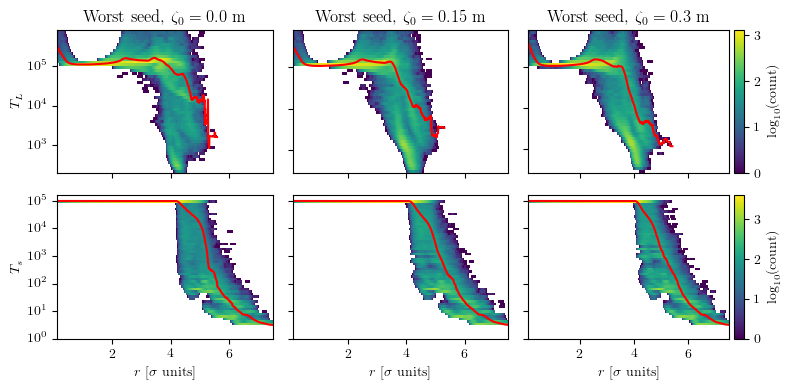

In [116]:
bucket_lenght = 0.2
n_samples = 1000
sigma_sample_low = sigma_sample - bucket_lenght / 2
sigma_sample_high = sigma_sample + bucket_lenght / 2

fig, axs = plt.subplots(2, 3, figsize=(8, 4), sharex=True)

for i, (idx, ax) in enumerate(zip(range(0, 3), axs[0,:])):

    data_list = []
    data_mean = []
    data_mode = []

    for s, l, h in zip(sigma_sample, sigma_sample_low, sigma_sample_high):
        mask = np.logical_and(radius_sigma_list[idx] >= l, radius_sigma_list[idx] < h)

        tmp_data = (np.asarray(flibk_x_post_data_list[idx][-1][mask])).copy()
        tmp_data[tmp_data < -6] = np.nan
        tmp_data = 1/10**tmp_data

        data_list.append(np.log10(tmp_data))
        data_mean.append(np.log10(np.nanmean(tmp_data)))
        data_mode.append(mymode(np.log10(tmp_data)))

    v_min = np.infty
    v_max = -np.infty
    for d in data_list:
        if len(d) == 0:
            continue
        v_min = np.nanmin([v_min, np.nanmin(d)])
        v_max = np.nanmax([v_max, np.nanmax(d)])

    count_map, bin_centers = compose_count_map(data_list, v_min, v_max, density=False, nbins=50)

    cmap = ax.imshow(np.log10(count_map).T, aspect="auto", origin="lower", interpolation="none", extent=[sigma_sample[0], sigma_sample[-1], v_min, v_max])
    ax.plot(sigma_sample, data_mean, c="red")
    # ax.plot(sigma_sample, data_mode, c="k", linestyle="--")
    # plt.colorbar()
    ax.set_xlim(right=6.5)
    ax.set_ylim(top=5.9)

    if i == 2:
        divider = make_axes_locatable(ax)
        cax = divider.append_axes("right", size="5%", pad=0.05)
        cbar = plt.colorbar(cmap, cax=cax, label="$\\log_{{10}}(\\mathrm{{count}})$")

    if i != 0:
        ax.set_yticklabels([])
    else:
        ax.set_ylabel("$T_L$")
        # write ticklabels in the form of 10^{{number}}
        ax.set_yticks([3,4,5])
        labels = [f"$10^{i}$" for i in [3,4,5]]
        print(labels)
        ax.set_yticklabels(labels)
    # ax.set_xlabel("Initial radius [$\\sigma$ units]")

    ax.set_title(f"{lattice_name_list[0]} seed, $\\zeta_0={zeta_name_list[i]}$ m")

for i, (idx, ax) in enumerate(zip(range(0, 3), axs[1,:])):

    data_list = []
    data_mean = []
    data_mode = []

    for s, l, h in zip(sigma_sample, sigma_sample_low, sigma_sample_high):
        mask = np.logical_and(radius_sigma_list[idx] >= l, radius_sigma_list[idx] < h)

        tmp_data = (np.asarray(stability_list[idx][mask])).copy()
        
        data_list.append(np.log10(tmp_data))
        data_mean.append(np.log10(np.nanmean(tmp_data)))
        data_mode.append(mymode(np.log10(tmp_data)))

    v_min = np.infty
    v_max = -np.infty
    for d in data_list:
        if len(d) == 0:
            continue
        v_min = np.nanmin([v_min, np.nanmin(d)])
        v_max = np.nanmax([v_max, np.nanmax(d)])

    count_map, bin_centers = compose_count_map(data_list, v_min, v_max, density=False, nbins=50)

    cmap = ax.imshow(np.log10(count_map).T, aspect="auto", origin="lower", interpolation="none", extent=[sigma_sample[0], sigma_sample[-1], v_min, v_max])
    ax.plot(sigma_sample, data_mean, c="red")
    # ax.plot(sigma_sample, data_mode, c="k", linestyle="--")
    # plt.colorbar()
    ax.set_xlim(right=7.5)
    ax.set_ylim(top=5.2)

    if i == 2:
        divider = make_axes_locatable(ax)
        cax = divider.append_axes("right", size="5%", pad=0.05)
        cbar = plt.colorbar(cmap, cax=cax, label="$\\log_{{10}}(\\mathrm{{count}})$")

    if i != 0:
        ax.set_yticks(range(6))
        ax.set_yticklabels([])
    else:
        ax.set_ylabel("$T_s$")
        # write ticklabels in the form of 10^{{number}}
        ax.set_yticks(range(6))
        labels = [f"$10^{i}$" for i in range(6)]
        print(labels)
        ax.set_yticklabels(labels)
    ax.set_xlabel("$r$ [$\\sigma$ units]")

    # ax.set_title(f"{lattice_name_list[2]} seed, $\\zeta_0={zeta_name_list[i]}$ m")

plt.tight_layout()
plt.savefig(os.path.join(IMGDIR, "dist_and_mean.pdf"), bbox_inches="tight", dpi=600)


/tmp/ipykernel_27020/4219376036.py:22: RuntimeWarning: Mean of empty slice
  data_mean.append(np.log10(np.nanmean(tmp_data)))
/tmp/ipykernel_27020/4219376036.py:28: RuntimeWarning: All-NaN slice encountered
  v_min = np.nanmin([v_min, np.nanmin(d)])
/tmp/ipykernel_27020/4219376036.py:29: RuntimeWarning: All-NaN slice encountered
  v_max = np.nanmax([v_max, np.nanmax(d)])
/tmp/ipykernel_27020/4219376036.py:33: RuntimeWarning: divide by zero encountered in log10
  cmap = ax.imshow(np.log10(count_map).T, aspect="auto", origin="lower", interpolation="none", extent=[sigma_sample[0], sigma_sample[-1], v_min, v_max])


['$10^3$', '$10^4$', '$10^5$']


/tmp/ipykernel_27020/4219376036.py:81: RuntimeWarning: divide by zero encountered in log10
  cmap = ax.imshow(np.log10(count_map).T, aspect="auto", origin="lower", interpolation="none", extent=[sigma_sample[0], sigma_sample[-1], v_min, v_max])


['$10^0$', '$10^1$', '$10^2$', '$10^3$', '$10^4$', '$10^5$']


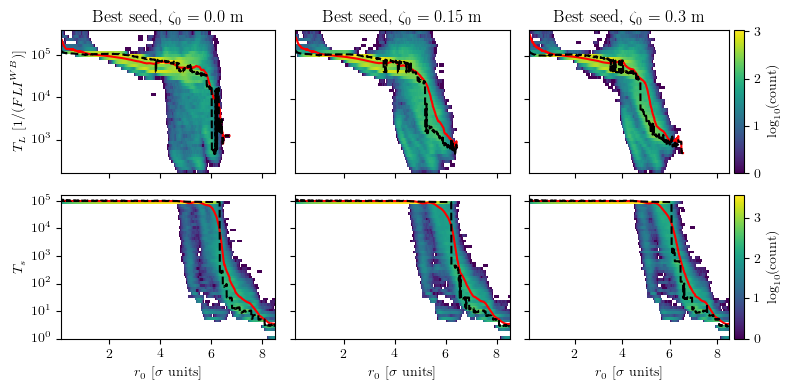

In [ ]:
bucket_lenght = 0.2
n_samples = 1000
sigma_sample_low = sigma_sample - bucket_lenght / 2
sigma_sample_high = sigma_sample + bucket_lenght / 2

fig, axs = plt.subplots(2, 3, figsize=(8, 4), sharex=True)

for i, (idx, ax) in enumerate(zip(range(6, 9), axs[0,:])):

    data_list = []
    data_mean = []
    data_mode = []

    for s, l, h in zip(sigma_sample, sigma_sample_low, sigma_sample_high):
        mask = np.logical_and(radius_sigma_list[idx] >= l, radius_sigma_list[idx] < h)

        tmp_data = (np.asarray(flibk_x_post_data_list[idx][-1][mask])).copy()
        tmp_data[tmp_data < -6] = np.nan
        tmp_data = 1/10**tmp_data

        data_list.append(np.log10(tmp_data))
        data_mean.append(np.log10(np.nanmean(tmp_data)))
        data_mode.append(mymode(np.log10(tmp_data)))

    v_min = np.infty
    v_max = -np.infty
    for d in data_list:
        v_min = np.nanmin([v_min, np.nanmin(d)])
        v_max = np.nanmax([v_max, np.nanmax(d)])

    count_map, bin_centers = compose_count_map(data_list, v_min, v_max, density=False, nbins=50)

    cmap = ax.imshow(np.log10(count_map).T, aspect="auto", origin="lower", interpolation="none", extent=[sigma_sample[0], sigma_sample[-1], v_min, v_max])
    ax.plot(sigma_sample, data_mean, c="red")
    ax.plot(sigma_sample, data_mode, c="k", linestyle="--")
    # plt.colorbar()
    ax.set_xlim(right=6.5)
    ax.set_ylim(top=5.6)

    if i == 2:
        divider = make_axes_locatable(ax)
        cax = divider.append_axes("right", size="5%", pad=0.05)
        cbar = plt.colorbar(cmap, cax=cax, label="$\\log_{{10}}(\\mathrm{{count}})$")

    if i != 0:
        ax.set_yticklabels([])
    else:
        ax.set_ylabel("$T_L$ $[1/({{FLI}}^{{WB}})]$")
        # write ticklabels in the form of 10^{{number}}
        ax.set_yticks([3,4,5])
        labels = [f"$10^{i}$" for i in [3,4,5]]
        print(labels)
        ax.set_yticklabels(labels)
    # ax.set_xlabel("Initial radius [$\\sigma$ units]")

    ax.set_title(f"{lattice_name_list[2]} seed, $\\zeta_0={zeta_name_list[i]}$ m")

for i, (idx, ax) in enumerate(zip(range(6, 9), axs[1,:])):

    data_list = []
    data_mean = []
    data_mode = []

    for s, l, h in zip(sigma_sample, sigma_sample_low, sigma_sample_high):
        mask = np.logical_and(radius_sigma_list[idx] >= l, radius_sigma_list[idx] < h)

        tmp_data = (np.asarray(stability_list[idx][mask])).copy()
        
        data_list.append(np.log10(tmp_data))
        data_mean.append(np.log10(np.nanmean(tmp_data)))
        data_mode.append(mymode(np.log10(tmp_data)))

    v_min = np.infty
    v_max = -np.infty
    for d in data_list:
        v_min = np.nanmin([v_min, np.nanmin(d)])
        v_max = np.nanmax([v_max, np.nanmax(d)])

    count_map, bin_centers = compose_count_map(data_list, v_min, v_max, density=False, nbins=50)

    cmap = ax.imshow(np.log10(count_map).T, aspect="auto", origin="lower", interpolation="none", extent=[sigma_sample[0], sigma_sample[-1], v_min, v_max])
    ax.plot(sigma_sample, data_mean, c="red")
    ax.plot(sigma_sample, data_mode, c="k", linestyle="--")
    # plt.colorbar()
    ax.set_xlim(right=8.5)
    ax.set_ylim(top=5.2)

    if i == 2:
        divider = make_axes_locatable(ax)
        cax = divider.append_axes("right", size="5%", pad=0.05)
        cbar = plt.colorbar(cmap, cax=cax, label="$\\log_{{10}}(\\mathrm{{count}})$")

    if i != 0:
        ax.set_yticks(range(6))
        ax.set_yticklabels([])
    else:
        ax.set_ylabel("$T_s$")
        # write ticklabels in the form of 10^{{number}}
        ax.set_yticks(range(6))
        labels = [f"$10^{i}$" for i in range(6)]
        print(labels)
        ax.set_yticklabels(labels)
    ax.set_xlabel("$r_0$ [$\\sigma$ units]")

    # ax.set_title(f"{lattice_name_list[2]} seed, $\\zeta_0={zeta_name_list[i]}$ m")

plt.tight_layout()
plt.savefig(os.path.join(IMGDIR, "dist_and_mean.pdf"), bbox_inches="tight", dpi=600)


In [268]:
data_list[-200]

array([nan, nan, nan, ..., nan, nan, nan])

In [117]:
import lmfit

def nek_law(params, x, data=None, eps=None):
    t_0 = 10**params["t_0"].value
    sig_0 = params["sig_0"].value
    b = params["b"].value

    val = np.asarray(t_0 * np.exp((sig_0/x)**b))

    # print(np.count_nonzero(eps))
    if data is not None:
        if np.any(np.isnan((np.log10(val) - np.log10(data)))): 
            # print("NAN!")
            return np.ones_like(data) * 1e10
        if np.any(np.isinf((np.log10(val) - np.log10(data)))): 
            # print("INF!")
            return np.ones_like(data) * 1e10

    if data is None:
        return val
    if eps is None:
        return (np.log10(val) - np.log10(data))
    return (val - data) / eps

In [118]:
import warnings
warnings.filterwarnings("ignore")

Ns = 100

t_min=-4
t_max=4
t_delta = (t_max - t_min) / Ns

sig_min=10
sig_max=60
sig_delta = (sig_max - sig_min) / Ns

b_min=0
b_max=3
b_delta = (b_max - b_min) / Ns

idx = 8

sigma_fit_samples_loss = np.arange(5.5, 6.35, 0.1)

loss_fit_results = []

for from_sigma in tqdm(sigma_fit_samples_loss):

    ##########################################################

    params = lmfit.Parameters()
    params.add("t_0", value=5.0e0, min=t_min, max=t_max)
    params.add("sig_0", value=10.0e0, min=sig_min, max=sig_max)
    params.add("b", value=2.0e0, min=b_min, max=b_max)

    x = np.asarray(sigma_sample).copy()
    y = np.asarray(loss_evo_list[t][idx]).copy()
    # y = 10**np.asarray(loss_evo_mode_list[t][idx]).copy()

    nanmask = np.logical_and(~np.isnan(y), x > from_sigma)
    x = x[nanmask]
    y = y[nanmask]

    out = lmfit.minimize(nek_law, params, args=(x, y), method="brute", workers=40, Ns=Ns)

    params = lmfit.Parameters()
    params.add("t_0", value=out.params["t_0"].value, min=out.params["t_0"].value - t_delta, max=out.params["t_0"].value + t_delta)
    params.add("sig_0", value=out.params["sig_0"].value, min=out.params["sig_0"].value - sig_delta, max=out.params["sig_0"].value + sig_delta)
    params.add("b", value=out.params["b"].value, min=out.params["b"].value - b_delta, max=out.params["b"].value + b_delta)

    out = lmfit.minimize(nek_law, params, args=(x, y))

    loss_fit_results.append(out)

sigma_fit_samples = np.arange(4.0, 5.6, 0.1)

lyap_list_result = []

for from_sigma in tqdm(sigma_fit_samples):

    params = lmfit.Parameters()
    params.add("t_0", value=5.0e0, min=t_min, max=t_max)
    params.add("sig_0", value=10.0e0, min=sig_min, max=sig_max)
    params.add("b", value=2.0e0, min=b_min, max=b_max)

    x = np.asarray(sigma_sample).copy()
    y = np.asarray(lyapunov_wb_evo_list[100000][idx]).copy()
    # y = 10**np.asarray(lyapunov_wb_evo_mode_list[100000][idx]).copy()

    nanmask = np.logical_and(~np.isnan(y), x > from_sigma)
    x = x[nanmask]
    y = y[nanmask]

    if len(y) <= 5:
        lyap_list_result.append(None)
        continue

    out = lmfit.minimize(nek_law, params, args=(x, y), method="brute", workers=40, Ns=Ns)

    params = lmfit.Parameters()
    params.add("t_0", value=out.params["t_0"].value, min=out.params["t_0"].value - t_delta, max=out.params["t_0"].value + t_delta)
    params.add("sig_0", value=out.params["sig_0"].value, min=out.params["sig_0"].value - sig_delta, max=out.params["sig_0"].value + sig_delta)
    params.add("b", value=out.params["b"].value, min=out.params["b"].value - b_delta, max=out.params["b"].value + b_delta)

    out = lmfit.minimize(nek_law, params, args=(x, y))

    lyap_list_result.append(out)

100%|██████████| 16/16 [05:22<00:00, 20.17s/it]


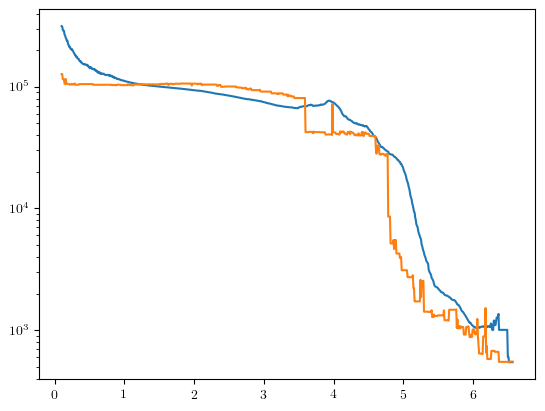

In [34]:
plt.plot(sigma_sample, lyapunov_wb_evo_list[100000][8])
plt.plot(sigma_sample, 10**lyapunov_wb_evo_mode_list[100000][8])
plt.yscale("log")

(3.0, 7.345)

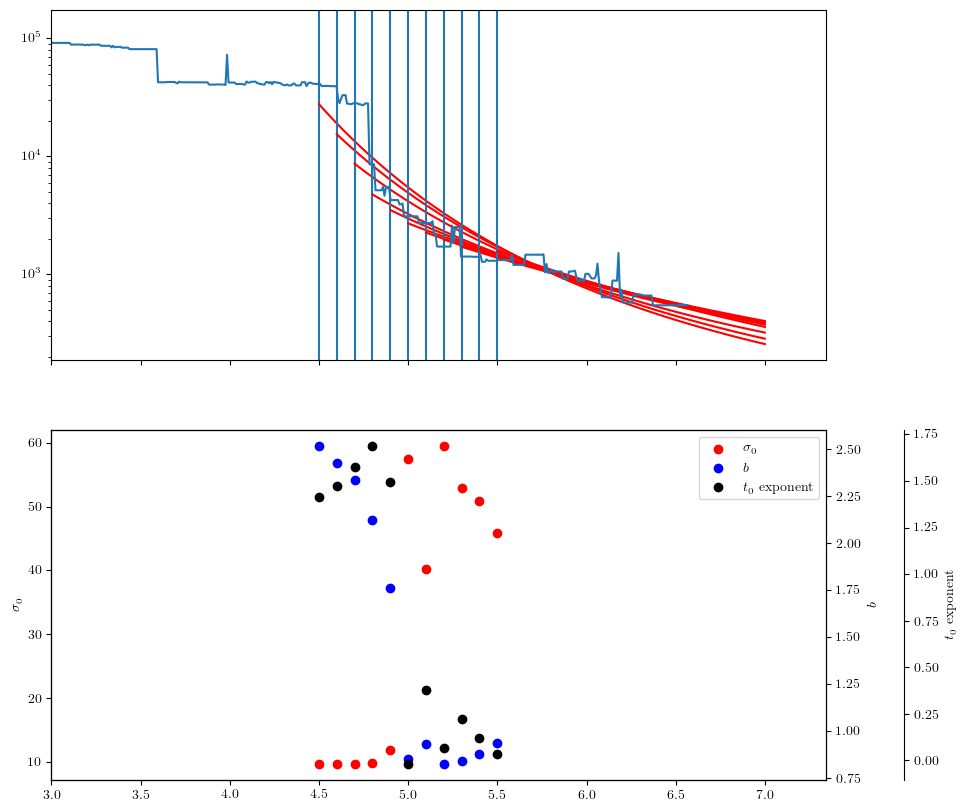

In [37]:
fig, ax = plt.subplots(2, 1, figsize=(10, 10), sharex=True)

ax_bis = ax[1].twinx()
ax_ter = ax[1].twinx()

for i, out in enumerate(lyap_list_result):
    if i < 5:
        continue
    if out is None:
        continue
    x = np.linspace(sigma_fit_samples[i], 7.0, 100)
    ax[0].axvline(sigma_fit_samples[i])
    ax[0].plot(x, nek_law(out.params, x, None), color="red")

    ax[1].scatter([sigma_fit_samples[i]], [out.params["sig_0"].value], color="red")
    ax_bis.scatter([sigma_fit_samples[i]], [out.params["b"].value], color="blue", label="$b$")
    ax_ter.scatter([sigma_fit_samples[i]], [out.params["t_0"].value], color="black", label="$t_0$ exponent")
    # print(f"{sigma_fit_samples[i]:2f}\t{10**out.params['t_0'].value:.2f}\t{out.params['sig_0'].value:.2f}\t{out.params['b'].value:.2f}")

# fix ax_ter yaxis position
ax_ter.spines.right.set_position(("axes", 1.1))

ax[1].set_ylabel("$\\sigma_0$")
ax_bis.set_ylabel("$b$")
ax_ter.set_ylabel("$t_0$ exponent")

ax[1].scatter([], [], color="red", label="$\\sigma_0$")
ax[1].scatter([], [], color="blue", label="$b$")
ax[1].scatter([], [], color="black", label="$t_0$ exponent")
ax[1].legend()

ax[0].plot(sigma_sample, 10**lyapunov_wb_evo_mode_list[100000][8])

ax[0].set_yscale("log")
ax[0].set_xlim(left=3.0)
# ax[1].set_ylim(top=50.0)

(3.0, 9.445)

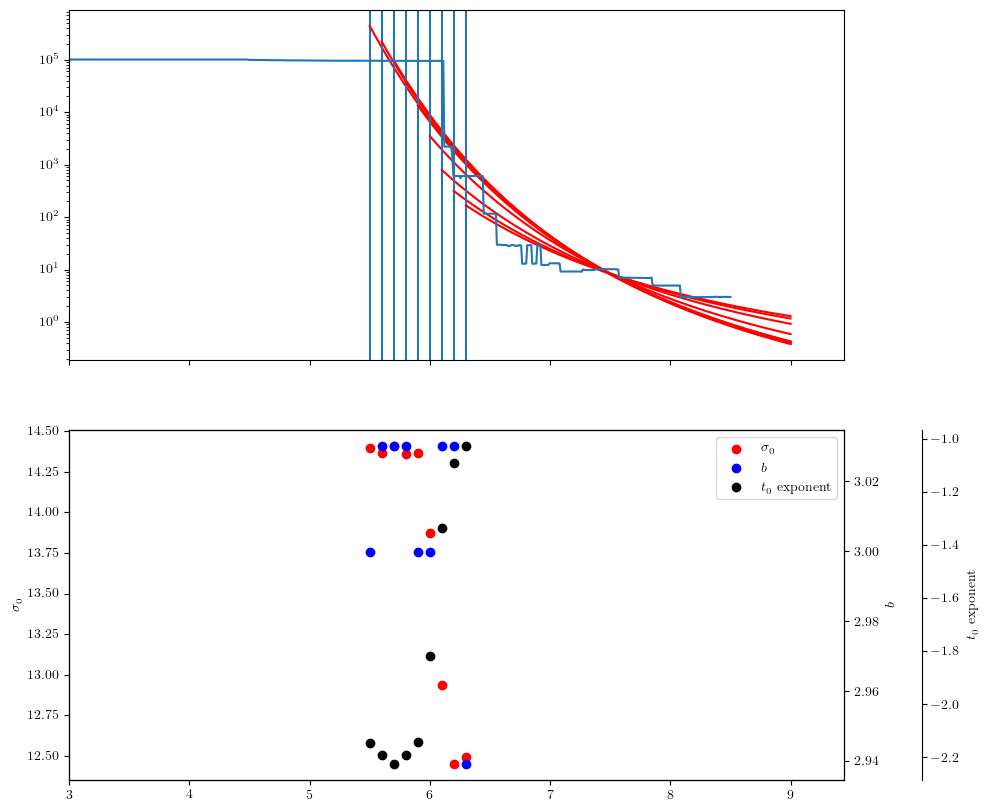

In [38]:
fig, ax = plt.subplots(2, 1, figsize=(10, 10), sharex=True)

ax_bis = ax[1].twinx()
ax_ter = ax[1].twinx()

for i, out in enumerate(loss_fit_results):
    if out is None:
        continue
    x = np.linspace(sigma_fit_samples_loss[i], 9.0, 100)
    ax[0].axvline(sigma_fit_samples_loss[i])
    ax[0].plot(x, nek_law(out.params, x, None), color="red")

    ax[1].scatter([sigma_fit_samples_loss[i]], [out.params["sig_0"].value], color="red")
    ax_bis.scatter([sigma_fit_samples_loss[i]], [out.params["b"].value], color="blue", label="$b$")
    ax_ter.scatter([sigma_fit_samples_loss[i]], [out.params["t_0"].value], color="black", label="$t_0$ exponent")
    # print(f"{sigma_fit_samples_loss[i]:2f}\t{10**out.params['t_0'].value:.2f}\t{out.params['sig_0'].value:.2f}\t{out.params['b'].value:.2f}")

# fix ax_ter yaxis position
ax_ter.spines.right.set_position(("axes", 1.1))

ax[1].set_ylabel("$\\sigma_0$")
ax_bis.set_ylabel("$b$")
ax_ter.set_ylabel("$t_0$ exponent")

ax[1].scatter([], [], color="red", label="$\\sigma_0$")
ax[1].scatter([], [], color="blue", label="$b$")
ax[1].scatter([], [], color="black", label="$t_0$ exponent")
ax[1].legend()

ax[0].plot(sigma_sample, 10**loss_evo_mode_list[100000][8])

ax[0].set_yscale("log")
ax[0].set_xlim(left=3.0)

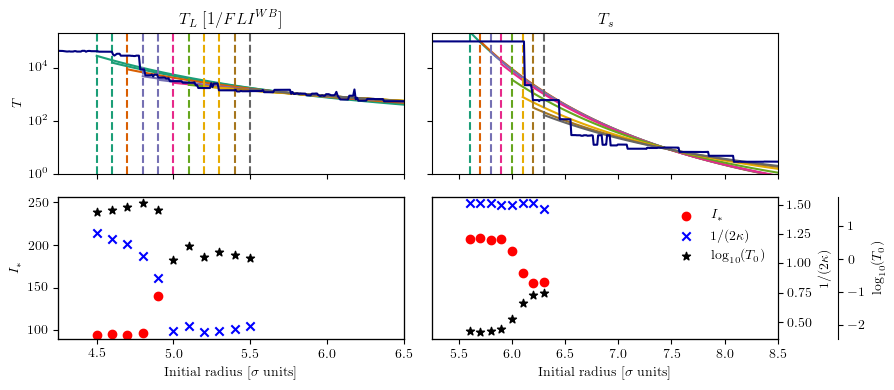

In [40]:
fig, ax = plt.subplots(2, 2, figsize=(9, 4))

ax1_bis = ax[1,0].twinx()
ax1_ter = ax[1,0].twinx()

ax2_bis = ax[1,1].twinx()
ax2_ter = ax[1,1].twinx()

cmap=plt.get_cmap("Dark2")

for i, out in enumerate(lyap_list_result):
    if i < 5:
        continue
    color = cmap((i-5)/(len(lyap_list_result)-5))
    if out is None:
        continue
    x = np.linspace(sigma_fit_samples[i], 7.0, 100)
    ax[0,0].axvline(sigma_fit_samples[i], color=color, linestyle="--")
    ax[0,0].plot(x, nek_law(out.params, x, None), color=color)

    ax[1,0].scatter([sigma_fit_samples[i]], [out.params["sig_0"].value**2], color="red")
    ax1_bis.scatter([sigma_fit_samples[i]], [out.params["b"].value/2], color="blue", label="$1/(2\\kappa)$", marker="x")
    ax1_ter.scatter([sigma_fit_samples[i]], [out.params["t_0"].value], color="black", label="$t_0$ exponent", marker="*")
    # print(f"{sigma_fit_samples[i]:2f}\t{10**out.params['t_0'].value:.2f}\t{out.params['sig_0'].value:.2f}\t{out.params['b'].value:.2f}")

# fix ax_ter yaxis position
# ax1_ter.spines.right.set_position(("axes", 1.1))

ax[1,0].set_ylabel("$I_\\ast$")
# ax1_bis.set_ylabel("$1/(2\\kappa)$")
# ax1_ter.set_ylabel("$t_0$ exponent")

ax[1,0].scatter([], [], color="red", label="$I_0$")
ax[1,0].scatter([], [], color="blue", label="$1/(2\\kappa)$", marker="x")
ax[1,0].scatter([], [], color="black", label="$t_0$ exponent", marker="*")
# ax[1,0].legend()

ax[0,0].plot(sigma_sample, 10**lyapunov_wb_evo_mode_list[100000][8], color="navy")
ax[0,0].set_title("$T_L$ $[1/{{FLI}}^{{WB}}]$")
ax[0,0].set_yscale("log")
ax[0,0].set_xlim(left=3.0)


for i, out in enumerate(loss_fit_results):
    if i == 0:
        continue
    if out is None:
        continue
    color = cmap(i/len(loss_fit_results))
    x = np.linspace(sigma_fit_samples_loss[i], 9.0, 100)
    ax[0,1].axvline(sigma_fit_samples_loss[i], color=color, linestyle="--")
    ax[0,1].plot(x, nek_law(out.params, x, None), color=color)

    ax[1,1].scatter([sigma_fit_samples_loss[i]], [out.params["sig_0"].value**2], color="red")
    ax2_bis.scatter([sigma_fit_samples_loss[i]], [out.params["b"].value/2], color="blue", label="$1/(2\\kappa)$", marker="x")
    ax2_ter.scatter([sigma_fit_samples_loss[i]], [out.params["t_0"].value], color="black", label="$t_0$ exponent", marker="*")
    # print(f"{sigma_fit_samples_loss[i]:2f}\t{10**out.params['t_0'].value:.2f}\t{out.params['sig_0'].value:.2f}\t{out.params['b'].value:.2f}")

# fix ax_ter yaxis position
ax2_ter.spines.right.set_position(("axes", 1.175))

# ax[1,1].set_ylabel("$\\sigma_0$")
ax2_bis.set_ylabel("$1/(2\\kappa)$")
ax2_ter.set_ylabel("$\\log_{{10}}(T_0)$")

ax[1,1].scatter([], [], color="red", label="$I_\\ast$")
ax[1,1].scatter([], [], color="blue", label="$1/(2\\kappa)$", marker="x")
ax[1,1].scatter([], [], color="black", label="$\\log_{{10}}(T_0)$", marker="*")
ax[1,1].legend(frameon=False)

ax[0,1].plot(sigma_sample, 10**loss_evo_mode_list[100000][8], color="navy")
ax[0,1].set_title("$T_s$")

ax[0,1].set_yscale("log")
ax[0,1].set_xlim(left=3.0)

ax[0,0].set_ylim(1e0, 2e5)
ax[0,1].set_ylim(1e0, 2e5)
ax[0,0].set_xlim(4.25, 6.5)
ax[0,1].set_xlim(5.25, 8.5)
ax[1,0].set_xlim(4.25, 6.5)
ax[1,1].set_xlim(5.25, 8.5)

ax1_bis.get_shared_y_axes().join(ax2_bis, ax1_bis)
ax1_ter.get_shared_y_axes().join(ax1_ter, ax2_ter)
ax[1,0].set_ylim(9.5**2, 16.**2)
ax[1,1].set_ylim(9.5**2, 16.**2)

ax1_bis.set_yticklabels([])
ax1_bis.set_yticks([])
ax1_ter.set_yticklabels([])
ax1_ter.set_yticks([])
ax[0,1].set_yticklabels([])
ax[1,1].set_yticklabels([])
ax[1,1].set_yticks([])
ax[0,0].set_xticklabels([])
ax[0,1].set_xticklabels([])

ax[0,0].set_ylabel("$T$")
ax[1,0].set_xlabel("Initial radius [$\\sigma$ units]")
ax[1,1].set_xlabel("Initial radius [$\\sigma$ units]")

plt.tight_layout()
# plt.savefig(os.path.join(IMGDIR, "fit_lyap_time_best_seed.pdf"), bbox_inches="tight", dpi=600)

# plt.savefig(os.path.join(IMGDIR, "fit_l_time_best.pdf"), bbox_inches="tight", dpi=600)

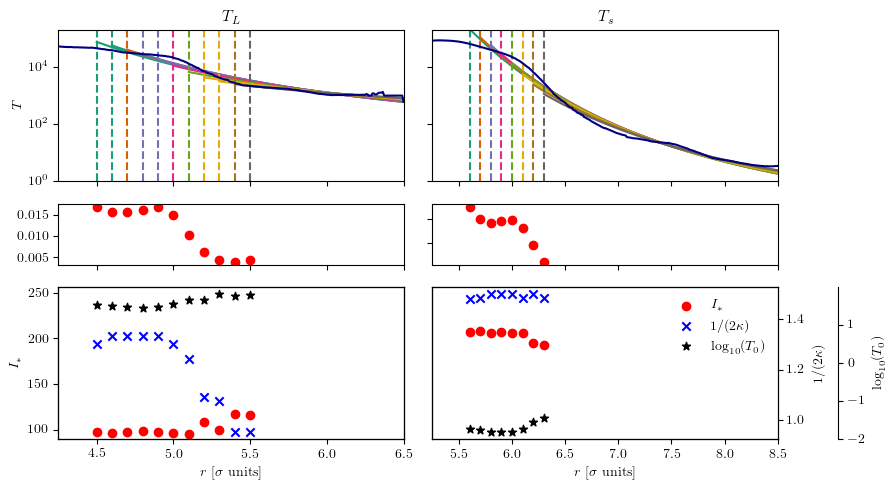

In [124]:
# fig, ax = plt.subplots(2, 2, figsize=(9, 4))
fig = plt.figure(figsize=(9, 5))
gs = fig.add_gridspec(3, 2, height_ratios=(1, 0.4, 1))

ax = np.array([
    [fig.add_subplot(gs[0,0]), fig.add_subplot(gs[0,1])],
    [fig.add_subplot(gs[2,0]), fig.add_subplot(gs[2,1])],
    [fig.add_subplot(gs[1,0]), fig.add_subplot(gs[1,1])],
])


ax1_bis = ax[1,0].twinx()
ax1_ter = ax[1,0].twinx()

ax2_bis = ax[1,1].twinx()
ax2_ter = ax[1,1].twinx()

cmap=plt.get_cmap("Dark2")

for i, out in enumerate(lyap_list_result):
    if i < 5:
        continue
    color = cmap((i-5)/(len(lyap_list_result)-5))
    if out is None:
        continue
    x = np.linspace(sigma_fit_samples[i], 7.0, 100)
    ax[0,0].axvline(sigma_fit_samples[i], color=color, linestyle="--")
    ax[0,0].plot(x, nek_law(out.params, x, None), color=color)

    ax[1,0].scatter([sigma_fit_samples[i]], [out.params["sig_0"].value**2], color="red")
    ax1_bis.scatter([sigma_fit_samples[i]], [out.params["b"].value/2], color="blue", label="$1/(2\\kappa)$", marker="x")
    ax1_ter.scatter([sigma_fit_samples[i]], [out.params["t_0"].value], color="black", label="$t_0$ exponent", marker="*")

    ax[2,0].scatter([sigma_fit_samples[i]], [out.redchi], color="red")
    # print(f"{sigma_fit_samples[i]:2f}\t{10**out.params['t_0'].value:.2f}\t{out.params['sig_0'].value:.2f}\t{out.params['b'].value:.2f}")

# fix ax_ter yaxis position
# ax1_ter.spines.right.set_position(("axes", 1.1))

ax[1,0].set_ylabel("$I_\\ast$")
# ax1_bis.set_ylabel("$1/(2\\kappa)$")
# ax1_ter.set_ylabel("$t_0$ exponent")

ax[1,0].scatter([], [], color="red", label="$I_0$")
ax[1,0].scatter([], [], color="blue", label="$1/(2\\kappa)$", marker="x")
ax[1,0].scatter([], [], color="black", label="$t_0$ exponent", marker="*")
# ax[1,0].legend()

ax[0,0].plot(sigma_sample, lyapunov_wb_evo_list[100000][8], color="navy")
ax[0,0].set_title("$T_L$")
ax[0,0].set_yscale("log")
ax[0,0].set_xlim(left=3.0)


for i, out in enumerate(loss_fit_results):
    if i == 0:
        continue
    if out is None:
        continue
    color = cmap(i/len(loss_fit_results))
    x = np.linspace(sigma_fit_samples_loss[i], 9.0, 100)
    ax[0,1].axvline(sigma_fit_samples_loss[i], color=color, linestyle="--")
    ax[0,1].plot(x, nek_law(out.params, x, None), color=color)

    ax[1,1].scatter([sigma_fit_samples_loss[i]], [out.params["sig_0"].value**2], color="red")
    ax2_bis.scatter([sigma_fit_samples_loss[i]], [out.params["b"].value/2], color="blue", label="$1/(2\\kappa)$", marker="x")
    ax2_ter.scatter([sigma_fit_samples_loss[i]], [out.params["t_0"].value], color="black", label="$t_0$ exponent", marker="*")
    # print(f"{sigma_fit_samples_loss[i]:2f}\t{10**out.params['t_0'].value:.2f}\t{out.params['sig_0'].value:.2f}\t{out.params['b'].value:.2f}")
    ax[2,1].scatter([sigma_fit_samples_loss[i]], [out.redchi], color="red")

# fix ax_ter yaxis position
ax2_ter.spines.right.set_position(("axes", 1.175))

# ax[1,1].set_ylabel("$\\sigma_0$")
ax2_bis.set_ylabel("$1/(2\\kappa)$")
ax2_ter.set_ylabel("$\\log_{{10}}(T_0)$")

ax[1,1].scatter([], [], color="red", label="$I_\\ast$")
ax[1,1].scatter([], [], color="blue", label="$1/(2\\kappa)$", marker="x")
ax[1,1].scatter([], [], color="black", label="$\\log_{{10}}(T_0)$", marker="*")
ax[1,1].legend(frameon=False)

ax[0,1].plot(sigma_sample, loss_evo_list[100000][8], color="navy")
ax[0,1].set_title("$T_s$")

ax[0,1].set_yscale("log")
ax[0,1].set_xlim(left=3.0)

ax[0,0].set_ylim(1e0, 2e5)
ax[0,1].set_ylim(1e0, 2e5)
ax[0,0].set_xlim(4.25, 6.5)
ax[0,1].set_xlim(5.25, 8.5)
ax[1,0].set_xlim(4.25, 6.5)
ax[1,1].set_xlim(5.25, 8.5)
ax[2,0].set_xlim(4.25, 6.5)
ax[2,1].set_xlim(5.25, 8.5)

ax1_bis.get_shared_y_axes().join(ax2_bis, ax1_bis)
ax1_ter.get_shared_y_axes().join(ax1_ter, ax2_ter)
ax[1,0].set_ylim(9.5**2, 16.**2)
ax[1,1].set_ylim(9.5**2, 16.**2)

ax1_bis.set_yticklabels([])
ax1_bis.set_yticks([])
ax1_ter.set_yticklabels([])
ax1_ter.set_yticks([])
ax[0,1].set_yticklabels([])
ax[1,1].set_yticklabels([])
ax[1,1].set_yticks([])
ax[0,0].set_xticklabels([])
ax[0,1].set_xticklabels([])
ax[2,0].set_xticklabels([])
ax[2,1].set_xticklabels([])
ax[2,1].set_yticklabels([])

ax[0,0].set_ylabel("$T$")
ax[1,0].set_xlabel("$r$ [$\\sigma$ units]")
ax[1,1].set_xlabel("$r$ [$\\sigma$ units]")

plt.tight_layout()
plt.savefig(os.path.join(IMGDIR, "fit_lyap_time_best_seed.pdf"), bbox_inches="tight", dpi=600)

plt.savefig(os.path.join(IMGDIR, "fit_l_time_best.pdf"), bbox_inches="tight", dpi=600)

In [125]:
import warnings
warnings.filterwarnings("ignore")

Ns = 100

t_min=-4
t_max=4
t_delta = (t_max - t_min) / Ns

sig_min=10
sig_max=60
sig_delta = (sig_max - sig_min) / Ns

b_min=0
b_max=3
b_delta = (b_max - b_min) / Ns

idx = 2

sigma_fit_samples_loss_bad = np.arange(4.0, 5.1, 0.1)

loss_fit_results_bad = []

for from_sigma in tqdm(sigma_fit_samples_loss_bad):

    ##########################################################

    params = lmfit.Parameters()
    params.add("t_0", value=5.0e0, min=t_min, max=t_max)
    params.add("sig_0", value=10.0e0, min=sig_min, max=sig_max)
    params.add("b", value=2.0e0, min=b_min, max=b_max)

    x = np.asarray(sigma_sample).copy()
    y = np.asarray(loss_evo_list[t][idx]).copy()

    nanmask = np.logical_and(~np.isnan(y), x > from_sigma)
    x = x[nanmask]
    y = y[nanmask]

    out = lmfit.minimize(nek_law, params, args=(x, y), method="brute", workers=40, Ns=Ns)

    params = lmfit.Parameters()
    params.add("t_0", value=out.params["t_0"].value, min=out.params["t_0"].value - t_delta, max=out.params["t_0"].value + t_delta)
    params.add("sig_0", value=out.params["sig_0"].value, min=out.params["sig_0"].value - sig_delta, max=out.params["sig_0"].value + sig_delta)
    params.add("b", value=out.params["b"].value, min=out.params["b"].value - b_delta, max=out.params["b"].value + b_delta)

    out = lmfit.minimize(nek_law, params, args=(x, y))

    loss_fit_results_bad.append(out)


100%|██████████| 11/11 [04:05<00:00, 22.36s/it]


In [126]:
Ns = 100

t_min=-4
t_max=4
t_delta = (t_max - t_min) / Ns

sig_min=10
sig_max=60
sig_delta = (sig_max - sig_min) / Ns

b_min=0
b_max=3
b_delta = (b_max - b_min) / Ns

idx = 2

sigma_fit_samples_bad = np.arange(3.0, 4.1, 0.1)

lyap_list_result_bad = []

for from_sigma in tqdm(sigma_fit_samples_bad):

    params = lmfit.Parameters()
    params.add("t_0", value=5.0e0, min=t_min, max=t_max)
    params.add("sig_0", value=10.0e0, min=sig_min, max=sig_max)
    params.add("b", value=2.0e0, min=b_min, max=b_max)

    x = np.asarray(sigma_sample).copy()
    y = np.asarray(lyapunov_wb_evo_list[100000][idx]).copy()

    nanmask = np.logical_and(np.logical_and(~np.isnan(y), x > from_sigma), y>10)
    x = x[nanmask]
    y = y[nanmask]

    if len(y) <= 5:
        lyap_list_result_bad.append(None)
        continue

    out = lmfit.minimize(nek_law, params, args=(x, y), method="brute", workers=40, Ns=Ns)

    params = lmfit.Parameters()
    params.add("t_0", value=out.params["t_0"].value, min=out.params["t_0"].value - t_delta, max=out.params["t_0"].value + t_delta)
    params.add("sig_0", value=out.params["sig_0"].value, min=out.params["sig_0"].value - sig_delta, max=out.params["sig_0"].value + sig_delta)
    params.add("b", value=out.params["b"].value, min=out.params["b"].value - b_delta, max=out.params["b"].value + b_delta)

    out = lmfit.minimize(nek_law, params, args=(x, y))

    lyap_list_result_bad.append(out)

100%|██████████| 11/11 [03:41<00:00, 20.14s/it]


(3.0, 5.77)

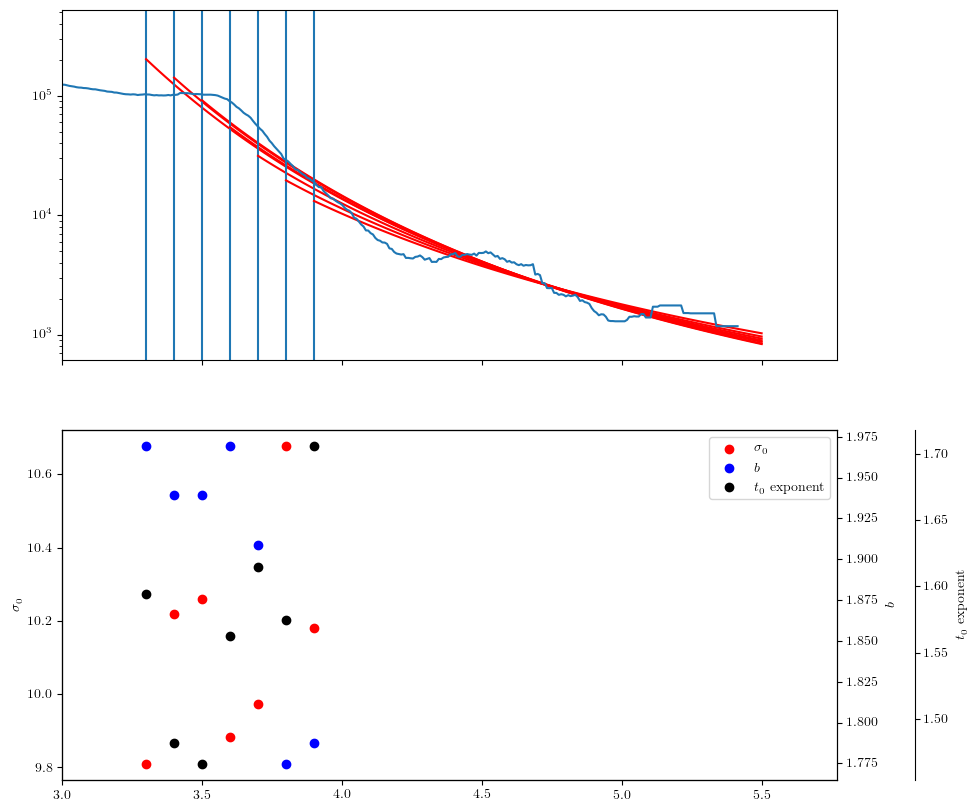

In [32]:
fig, ax = plt.subplots(2, 1, figsize=(10, 10), sharex=True)

ax_bis = ax[1].twinx()
ax_ter = ax[1].twinx()

for i, out in enumerate(lyap_list_result_bad):
    if i < 3 or i > 9:
        continue
    if out is None:
        continue
    x = np.linspace(sigma_fit_samples_bad[i], 5.5, 100)
    ax[0].axvline(sigma_fit_samples_bad[i])
    ax[0].plot(x, nek_law(out.params, x, None), color="red")

    ax[1].scatter([sigma_fit_samples_bad[i]], [out.params["sig_0"].value], color="red")
    ax_bis.scatter([sigma_fit_samples_bad[i]], [out.params["b"].value], color="blue", label="$b$")
    ax_ter.scatter([sigma_fit_samples_bad[i]], [out.params["t_0"].value], color="black", label="$t_0$ exponent")
    # print(f"{sigma_fit_samples_bad[i]:2f}\t{10**out.params['t_0'].value:.2f}\t{out.params['sig_0'].value:.2f}\t{out.params['b'].value:.2f}")

# fix ax_ter yaxis position
ax_ter.spines.right.set_position(("axes", 1.1))

ax[1].set_ylabel("$\\sigma_0$")
ax_bis.set_ylabel("$b$")
ax_ter.set_ylabel("$t_0$ exponent")

ax[1].scatter([], [], color="red", label="$\\sigma_0$")
ax[1].scatter([], [], color="blue", label="$b$")
ax[1].scatter([], [], color="black", label="$t_0$ exponent")
ax[1].legend()

ax[0].plot(sigma_sample, lyapunov_wb_evo_list[100000][2])

ax[0].set_yscale("log")
ax[0].set_xlim(left=3.0)
# ax[1].set_ylim(top=50.0)

(3.0, 9.445)

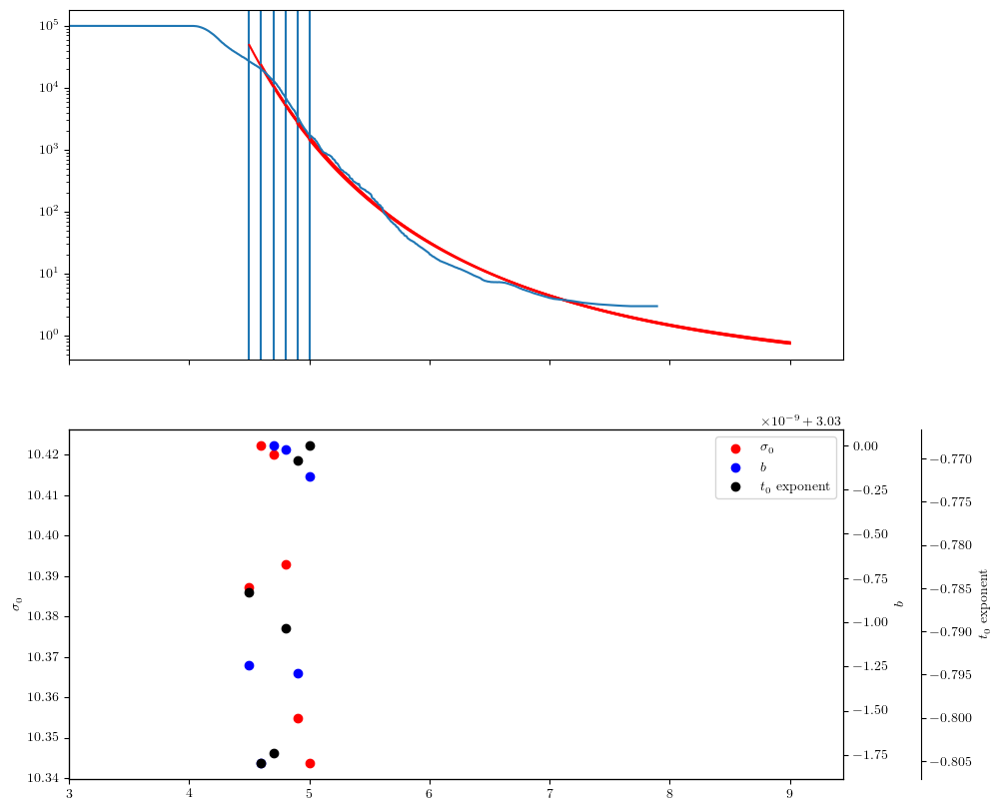

In [30]:
fig, ax = plt.subplots(2, 1, figsize=(10, 10), sharex=True)

ax_bis = ax[1].twinx()
ax_ter = ax[1].twinx()

for i, out in enumerate(loss_fit_results_bad):
    if i < 5:
        continue
    if out is None:
        continue
    x = np.linspace(sigma_fit_samples_loss_bad[i], 9.0, 100)
    ax[0].axvline(sigma_fit_samples_loss_bad[i])
    ax[0].plot(x, nek_law(out.params, x, None), color="red")

    ax[1].scatter([sigma_fit_samples_loss_bad[i]], [out.params["sig_0"].value], color="red")
    ax_bis.scatter([sigma_fit_samples_loss_bad[i]], [out.params["b"].value], color="blue", label="$b$")
    ax_ter.scatter([sigma_fit_samples_loss_bad[i]], [out.params["t_0"].value], color="black", label="$t_0$ exponent")
    # print(f"{sigma_fit_samples_loss_bad[i]:2f}\t{10**out.params['t_0'].value:.2f}\t{out.params['sig_0'].value:.2f}\t{out.params['b'].value:.2f}")

# fix ax_ter yaxis position
ax_ter.spines.right.set_position(("axes", 1.1))

ax[1].set_ylabel("$\\sigma_0$")
ax_bis.set_ylabel("$b$")
ax_ter.set_ylabel("$t_0$ exponent")

ax[1].scatter([], [], color="red", label="$\\sigma_0$")
ax[1].scatter([], [], color="blue", label="$b$")
ax[1].scatter([], [], color="black", label="$t_0$ exponent")
ax[1].legend()

ax[0].plot(sigma_sample, loss_evo_list[100000][2])

ax[0].set_yscale("log")
ax[0].set_xlim(left=3.0)

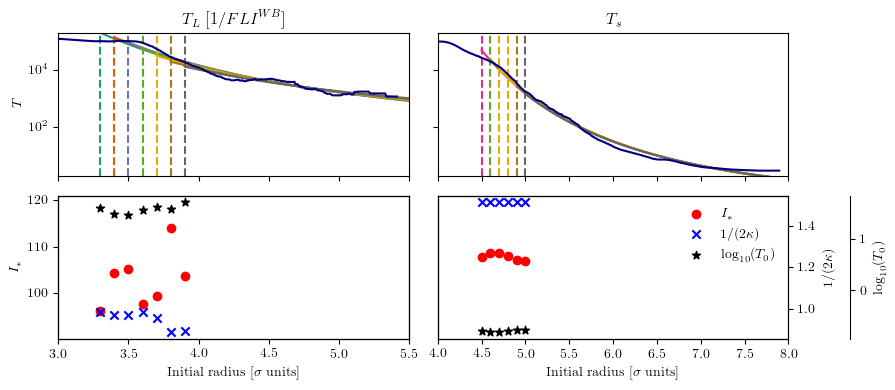

In [31]:
fig, ax = plt.subplots(2, 2, figsize=(9, 4))

ax1_bis = ax[1,0].twinx()
ax1_ter = ax[1,0].twinx()

ax2_bis = ax[1,1].twinx()
ax2_ter = ax[1,1].twinx()

cmap=plt.get_cmap("Dark2")

for i, out in enumerate(lyap_list_result_bad):
    if i < 3 or i > 9:
        continue
    color = cmap((i-3)/(9-3))
    if out is None:
        continue
    x = np.linspace(sigma_fit_samples_bad[i], 7.0, 100)
    ax[0,0].axvline(sigma_fit_samples_bad[i], color=color, linestyle="--")
    ax[0,0].plot(x, nek_law(out.params, x, None), color=color)

    ax[1,0].scatter([sigma_fit_samples_bad[i]], [out.params["sig_0"].value**2], color="red")
    ax1_bis.scatter([sigma_fit_samples_bad[i]], [out.params["b"].value/2], color="blue", label="$1/(2\\kappa)$", marker="x")
    ax1_ter.scatter([sigma_fit_samples_bad[i]], [out.params["t_0"].value], color="black", label="$t_0$ exponent", marker="*")
    # print(f"{sigma_fit_samples_bad[i]:2f}\t{10**out.params['t_0'].value:.2f}\t{out.params['sig_0'].value:.2f}\t{out.params['b'].value:.2f}")

# fix ax_ter yaxis position
# ax1_ter.spines.right.set_position(("axes", 1.1))

ax[1,0].set_ylabel("$I_\\ast$")
# ax1_bis.set_ylabel("$1/(2\\kappa)$")
# ax1_ter.set_ylabel("$t_0$ exponent")

ax[1,0].scatter([], [], color="red", label="$\\sigma_0$")
ax[1,0].scatter([], [], color="blue", label="$1/(2\\kappa)$", marker="x")
ax[1,0].scatter([], [], color="black", label="$t_0$ exponent", marker="*")
# ax[1,0].legend()

ax[0,0].plot(sigma_sample, lyapunov_wb_evo_list[100000][2], color="navy")
ax[0,0].set_title("$T_L$ $[1/{{FLI}}^{{WB}}]$")
ax[0,0].set_yscale("log")
ax[0,0].set_xlim(left=3.0)


for i, out in enumerate(loss_fit_results_bad):
    if i < 5:
        continue
    color = cmap((i-6)/(len(loss_fit_results_bad)-5))
    if out is None:
        continue
    color = cmap(i/len(loss_fit_results_bad))
    x = np.linspace(sigma_fit_samples_loss_bad[i], 9.0, 100)
    ax[0,1].axvline(sigma_fit_samples_loss_bad[i], color=color, linestyle="--")
    ax[0,1].plot(x, nek_law(out.params, x, None), color=color)

    ax[1,1].scatter([sigma_fit_samples_loss_bad[i]], [out.params["sig_0"].value**2], color="red")
    ax2_bis.scatter([sigma_fit_samples_loss_bad[i]], [out.params["b"].value/2], color="blue", label="$1/(2\\kappa)$", marker="x")
    ax2_ter.scatter([sigma_fit_samples_loss_bad[i]], [out.params["t_0"].value], color="black", label="$t_0$ exponent", marker="*")
    # print(f"{sigma_fit_samples_loss_bad[i]:2f}\t{10**out.params['t_0'].value:.2f}\t{out.params['sig_0'].value:.2f}\t{out.params['b'].value:.2f}")

# fix ax_ter yaxis position
ax2_ter.spines.right.set_position(("axes", 1.175))

# ax[1,1].set_ylabel("$\\sigma_0$")
ax2_bis.set_ylabel("$1/(2\\kappa)$")
ax2_ter.set_ylabel("$\\log_{{10}}(T_0)$")

ax[1,1].scatter([], [], color="red", label="$I_\\ast$")
ax[1,1].scatter([], [], color="blue", label="$1/(2\\kappa)$", marker="x")
ax[1,1].scatter([], [], color="black", label="$\\log_{{10}}(T_0)$", marker="*")
ax[1,1].legend(frameon=False)

ax[0,1].plot(sigma_sample, loss_evo_list[100000][2], color="navy")
ax[0,1].set_title("$T_s$")

ax[0,1].set_yscale("log")
# ax[0,1].set_xlim(left=3.0)

ax[0,0].set_ylim(2, 2e5)
ax[0,1].set_ylim(2, 2e5)
ax[0,0].set_xlim(3, 5.5)
ax[0,1].set_xlim(4, 8)
ax[1,0].set_xlim(3, 5.5)
ax[1,1].set_xlim(4, 8)

ax1_bis.get_shared_y_axes().join(ax2_bis, ax1_bis)
ax1_ter.get_shared_y_axes().join(ax1_ter, ax2_ter)
ax[1,0].set_ylim(9.5**2, 11**2)
ax[1,1].set_ylim(9.5**2, 11**2)

ax1_bis.set_yticklabels([])
ax1_bis.set_yticks([])
ax1_ter.set_yticklabels([])
ax1_ter.set_yticks([])
ax[0,1].set_yticklabels([])
ax[1,1].set_yticklabels([])
ax[1,1].set_yticks([])
ax[0,0].set_xticklabels([])
ax[0,1].set_xticklabels([])


ax[0,0].set_ylabel("$T$")
ax[1,0].set_xlabel("Initial radius [$\\sigma$ units]")
ax[1,1].set_xlabel("Initial radius [$\\sigma$ units]")

plt.tight_layout()
plt.savefig(os.path.join(IMGDIR, "fit_l_time_bad.pdf"), bbox_inches="tight", dpi=600)

In [15]:
import lmfit

def nek_law(params, x, data=None, eps=None):
    t_0 = 10**params["t_0"].value
    sig_0 = params["sig_0"].value
    b = params["b"].value

    val = np.asarray(t_0 * np.exp((sig_0/x)**b))

    # print(np.count_nonzero(eps))
    if data is not None:
        if np.any(np.isnan((np.log10(val) - np.log10(data)))): 
            # print("NAN!")
            return np.ones_like(data) * 1e10
        if np.any(np.isinf((np.log10(val) - np.log10(data)))): 
            # print("INF!")
            return np.ones_like(data) * 1e10

    if data is None:
        return val
    if eps is None:
        return (np.log10(val) - np.log10(data))
    return (val - data) / eps

In [16]:
import pickle
import warnings
warnings.filterwarnings("ignore")

Ns = 100

t_min=-4
t_max=4
t_delta = (t_max - t_min) / Ns

sig_min=10
sig_max=60
sig_delta = (sig_max - sig_min) / Ns

b_min=0
b_max=3
b_delta = (b_max - b_min) / Ns

idx_list = [6,7,8]

sigma_fit_samples_loss = np.arange(5.0, 7.0, 0.1)

loss_fit_results_all = []

for idx in tqdm(idx_list):
    loss_fit_results = []

    for from_sigma in tqdm(sigma_fit_samples_loss):

        ##########################################################

        params = lmfit.Parameters()
        params.add("t_0", value=5.0e0, min=t_min, max=t_max)
        params.add("sig_0", value=10.0e0, min=sig_min, max=sig_max)
        params.add("b", value=2.0e0, min=b_min, max=b_max)

        x = np.asarray(sigma_sample).copy()
        y = np.asarray(loss_evo_list[t][idx]).copy()

        nanmask = np.logical_and(~np.isnan(y), x > from_sigma)
        x = x[nanmask]
        y = y[nanmask]

        if len(y) <= 5:
            loss_fit_results.append(None)
            continue

        out = lmfit.minimize(nek_law, params, args=(x, y), method="brute", workers=40, Ns=Ns)

        params = lmfit.Parameters()
        params.add("t_0", value=out.params["t_0"].value, min=out.params["t_0"].value - t_delta, max=out.params["t_0"].value + t_delta)
        params.add("sig_0", value=out.params["sig_0"].value, min=out.params["sig_0"].value - sig_delta, max=out.params["sig_0"].value + sig_delta)
        params.add("b", value=out.params["b"].value, min=out.params["b"].value - b_delta, max=out.params["b"].value + b_delta)

        out = lmfit.minimize(nek_law, params, args=(x, y))

        loss_fit_results.append(out)
    loss_fit_results_all.append(loss_fit_results)

with open("loss_fit_results_all.pkl", "wb") as f:
    pickle.dump(loss_fit_results_all, f)

sigma_fit_samples = np.arange(4.0, 6.0, 0.1)

lyap_list_result_all = []

for idx in tqdm(idx_list):
    lyap_list_result = []

    for from_sigma in tqdm(sigma_fit_samples):

        params = lmfit.Parameters()
        params.add("t_0", value=5.0e0, min=t_min, max=t_max)
        params.add("sig_0", value=10.0e0, min=sig_min, max=sig_max)
        params.add("b", value=2.0e0, min=b_min, max=b_max)

        x = np.asarray(sigma_sample).copy()
        y = np.asarray(lyapunov_wb_evo_list[100000][idx]).copy()

        nanmask = np.logical_and(~np.isnan(y), x > from_sigma)
        x = x[nanmask]
        y = y[nanmask]

        if len(y) <= 5:
            lyap_list_result.append(None)
            continue

        out = lmfit.minimize(nek_law, params, args=(x, y), method="brute", workers=40, Ns=Ns)

        params = lmfit.Parameters()
        params.add("t_0", value=out.params["t_0"].value, min=out.params["t_0"].value - t_delta, max=out.params["t_0"].value + t_delta)
        params.add("sig_0", value=out.params["sig_0"].value, min=out.params["sig_0"].value - sig_delta, max=out.params["sig_0"].value + sig_delta)
        params.add("b", value=out.params["b"].value, min=out.params["b"].value - b_delta, max=out.params["b"].value + b_delta)

        out = lmfit.minimize(nek_law, params, args=(x, y))

        lyap_list_result.append(out)
    lyap_list_result_all.append(lyap_list_result)

with open("lyap_list_result_all.pkl", "wb") as f:
    pickle.dump(lyap_list_result_all, f)

100%|██████████| 3/3 [18:03<00:00, 361.05s/it]


In [17]:
import pickle
import warnings
warnings.filterwarnings("ignore")

Ns = 100

t_min=-4
t_max=4
t_delta = (t_max - t_min) / Ns

sig_min=10
sig_max=60
sig_delta = (sig_max - sig_min) / Ns

b_min=0
b_max=3
b_delta = (b_max - b_min) / Ns

idx_list = [0,1,2]

sigma_fit_samples_bad_loss_bad = np.arange(4.0, 6.0, 0.1)

loss_fit_results_bad_all = []

for idx in tqdm(idx_list):
    loss_fit_results_bad = []

    for from_sigma in tqdm(sigma_fit_samples_bad_loss_bad):

        ##########################################################

        params = lmfit.Parameters()
        params.add("t_0", value=5.0e0, min=t_min, max=t_max)
        params.add("sig_0", value=10.0e0, min=sig_min, max=sig_max)
        params.add("b", value=2.0e0, min=b_min, max=b_max)

        x = np.asarray(sigma_sample).copy()
        y = np.asarray(loss_evo_list[t][idx]).copy()

        nanmask = np.logical_and(~np.isnan(y), x > from_sigma)
        x = x[nanmask]
        y = y[nanmask]

        if len(y) <= 5:
            loss_fit_results_bad.append(None)
            continue

        out = lmfit.minimize(nek_law, params, args=(x, y), method="brute", workers=40, Ns=Ns)

        params = lmfit.Parameters()
        params.add("t_0", value=out.params["t_0"].value, min=out.params["t_0"].value - t_delta, max=out.params["t_0"].value + t_delta)
        params.add("sig_0", value=out.params["sig_0"].value, min=out.params["sig_0"].value - sig_delta, max=out.params["sig_0"].value + sig_delta)
        params.add("b", value=out.params["b"].value, min=out.params["b"].value - b_delta, max=out.params["b"].value + b_delta)

        out = lmfit.minimize(nek_law, params, args=(x, y))

        loss_fit_results_bad.append(out)
    loss_fit_results_bad_all.append(loss_fit_results_bad)

with open("loss_fit_results_bad_all.pkl", "wb") as f:
    pickle.dump(loss_fit_results_bad_all, f)

sigma_fit_samples_bad = np.arange(3.0, 5.0, 0.1)

lyap_list_result_bad_all = []

for idx in tqdm(idx_list):
    lyap_list_result_bad = []

    for from_sigma in tqdm(sigma_fit_samples_bad):

        params = lmfit.Parameters()
        params.add("t_0", value=5.0e0, min=t_min, max=t_max)
        params.add("sig_0", value=10.0e0, min=sig_min, max=sig_max)
        params.add("b", value=2.0e0, min=b_min, max=b_max)

        x = np.asarray(sigma_sample).copy()
        y = np.asarray(lyapunov_wb_evo_list[100000][idx]).copy()

        nanmask = np.logical_and(~np.isnan(y), x > from_sigma)
        x = x[nanmask]
        y = y[nanmask]

        if len(y) <= 5:
            lyap_list_result_bad.append(None)
            continue

        out = lmfit.minimize(nek_law, params, args=(x, y), method="brute", workers=40, Ns=Ns)

        params = lmfit.Parameters()
        params.add("t_0", value=out.params["t_0"].value, min=out.params["t_0"].value - t_delta, max=out.params["t_0"].value + t_delta)
        params.add("sig_0", value=out.params["sig_0"].value, min=out.params["sig_0"].value - sig_delta, max=out.params["sig_0"].value + sig_delta)
        params.add("b", value=out.params["b"].value, min=out.params["b"].value - b_delta, max=out.params["b"].value + b_delta)

        out = lmfit.minimize(nek_law, params, args=(x, y))

        lyap_list_result_bad.append(out)
    lyap_list_result_bad_all.append(lyap_list_result_bad)

with open("lyap_list_result_bad_all.pkl", "wb") as f:
    pickle.dump(lyap_list_result_bad_all, f)

100%|██████████| 3/3 [17:46<00:00, 355.50s/it]


In [19]:
import pickle
sigma_fit_samples_loss = np.arange(5.0, 7.0, 0.1)
sigma_fit_samples = np.arange(4.0, 6.0, 0.1)
sigma_fit_samples_bad_loss_bad = np.arange(4.0, 6.0, 0.1)
sigma_fit_samples_bad = np.arange(3.0, 5.0, 0.1)

with open("loss_fit_results_bad_all.pkl", "rb") as f:
    loss_fit_results_bad_all = pickle.load(f)

with open("lyap_list_result_bad_all.pkl", "rb") as f:
    lyap_list_result_bad_all = pickle.load(f)

with open("loss_fit_results_all.pkl", "rb") as f:
    loss_fit_results_all = pickle.load(f)

with open("lyap_list_result_all.pkl", "rb") as f:
    lyap_list_result_all = pickle.load(f)

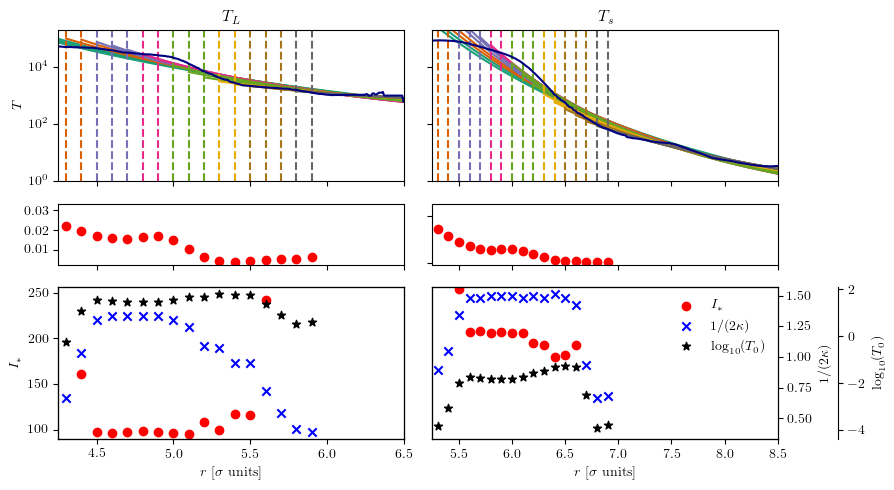

In [131]:
# fig, ax = plt.subplots(2, 2, figsize=(9, 4))
fig = plt.figure(figsize=(9, 5))
gs = fig.add_gridspec(3, 2, height_ratios=(1, 0.4, 1))

ax = np.array([
    [fig.add_subplot(gs[0,0]), fig.add_subplot(gs[0,1])],
    [fig.add_subplot(gs[2,0]), fig.add_subplot(gs[2,1])],
    [fig.add_subplot(gs[1,0]), fig.add_subplot(gs[1,1])],
])


ax1_bis = ax[1,0].twinx()
ax1_ter = ax[1,0].twinx()

ax2_bis = ax[1,1].twinx()
ax2_ter = ax[1,1].twinx()

cmap=plt.get_cmap("Dark2")

for i, out in enumerate(lyap_list_result_all[2]):
    color = cmap((i)/(len(lyap_list_result_all[2])))
    if out is None:
        continue
    x = np.linspace(sigma_fit_samples[i], 7.0, 100)
    ax[0,0].axvline(sigma_fit_samples[i], color=color, linestyle="--")
    ax[0,0].plot(x, nek_law(out.params, x, None), color=color)

    ax[1,0].scatter([sigma_fit_samples[i]], [out.params["sig_0"].value**2], color="red")
    ax1_bis.scatter([sigma_fit_samples[i]], [out.params["b"].value/2], color="blue", label="$1/(2\\kappa)$", marker="x")
    ax1_ter.scatter([sigma_fit_samples[i]], [out.params["t_0"].value], color="black", label="$t_0$ exponent", marker="*")

    ax[2,0].scatter([sigma_fit_samples[i]], [out.redchi], color="red")
    # print(f"{sigma_fit_samples[i]:2f}\t{10**out.params['t_0'].value:.2f}\t{out.params['sig_0'].value:.2f}\t{out.params['b'].value:.2f}")

# fix ax_ter yaxis position
# ax1_ter.spines.right.set_position(("axes", 1.1))

ax[1,0].set_ylabel("$I_\\ast$")
# ax1_bis.set_ylabel("$1/(2\\kappa)$")
# ax1_ter.set_ylabel("$t_0$ exponent")

ax[1,0].scatter([], [], color="red", label="$I_0$")
ax[1,0].scatter([], [], color="blue", label="$1/(2\\kappa)$", marker="x")
ax[1,0].scatter([], [], color="black", label="$t_0$ exponent", marker="*")
# ax[1,0].legend()

ax[0,0].plot(sigma_sample, lyapunov_wb_evo_list[100000][8], color="navy")
ax[0,0].set_title("$T_L$")
ax[0,0].set_yscale("log")
ax[0,0].set_xlim(left=3.0)


for i, out in enumerate(loss_fit_results_all[2]):
    if i == 0:
        continue
    if out is None:
        continue
    color = cmap(i/len(loss_fit_results_all[2]))
    x = np.linspace(sigma_fit_samples_loss[i], 9.0, 100)
    ax[0,1].axvline(sigma_fit_samples_loss[i], color=color, linestyle="--")
    ax[0,1].plot(x, nek_law(out.params, x, None), color=color)

    ax[1,1].scatter([sigma_fit_samples_loss[i]], [out.params["sig_0"].value**2], color="red")
    ax2_bis.scatter([sigma_fit_samples_loss[i]], [out.params["b"].value/2], color="blue", label="$1/(2\\kappa)$", marker="x")
    ax2_ter.scatter([sigma_fit_samples_loss[i]], [out.params["t_0"].value], color="black", label="$t_0$ exponent", marker="*")
    # print(f"{sigma_fit_samples_loss[i]:2f}\t{10**out.params['t_0'].value:.2f}\t{out.params['sig_0'].value:.2f}\t{out.params['b'].value:.2f}")
    ax[2,1].scatter([sigma_fit_samples_loss[i]], [out.redchi], color="red")

# fix ax_ter yaxis position
ax2_ter.spines.right.set_position(("axes", 1.175))

# ax[1,1].set_ylabel("$\\sigma_0$")
ax2_bis.set_ylabel("$1/(2\\kappa)$")
ax2_ter.set_ylabel("$\\log_{{10}}(T_0)$")

ax[1,1].scatter([], [], color="red", label="$I_\\ast$")
ax[1,1].scatter([], [], color="blue", label="$1/(2\\kappa)$", marker="x")
ax[1,1].scatter([], [], color="black", label="$\\log_{{10}}(T_0)$", marker="*")
ax[1,1].legend(frameon=False)

ax[0,1].plot(sigma_sample, loss_evo_list[100000][8], color="navy")
ax[0,1].set_title("$T_s$")

ax[0,1].set_yscale("log")
ax[0,1].set_xlim(left=3.0)

ax[0,0].set_ylim(1e0, 2e5)
ax[0,1].set_ylim(1e0, 2e5)
ax[0,0].set_xlim(4.25, 6.5)
ax[0,1].set_xlim(5.25, 8.5)
ax[1,0].set_xlim(4.25, 6.5)
ax[1,1].set_xlim(5.25, 8.5)
ax[2,0].set_xlim(4.25, 6.5)
ax[2,1].set_xlim(5.25, 8.5)

ax1_bis.get_shared_y_axes().join(ax2_bis, ax1_bis)
ax1_ter.get_shared_y_axes().join(ax1_ter, ax2_ter)
ax[1,0].set_ylim(9.5**2, 16.**2)
ax[1,1].set_ylim(9.5**2, 16.**2)

ax1_bis.set_yticklabels([])
ax1_bis.set_yticks([])
ax1_ter.set_yticklabels([])
ax1_ter.set_yticks([])
ax[0,1].set_yticklabels([])
ax[1,1].set_yticklabels([])
ax[1,1].set_yticks([])
ax[0,0].set_xticklabels([])
ax[0,1].set_xticklabels([])
ax[2,0].set_xticklabels([])
ax[2,1].set_xticklabels([])
ax[2,1].set_yticklabels([])

ax[0,0].set_ylabel("$T$")
ax[1,0].set_xlabel("$r$ [$\\sigma$ units]")
ax[1,1].set_xlabel("$r$ [$\\sigma$ units]")

plt.tight_layout()
plt.savefig(os.path.join(IMGDIR, "fit_lyap_time_best_seed.pdf"), bbox_inches="tight", dpi=600)

plt.savefig(os.path.join(IMGDIR, "fit_l_time_best.pdf"), bbox_inches="tight", dpi=600)

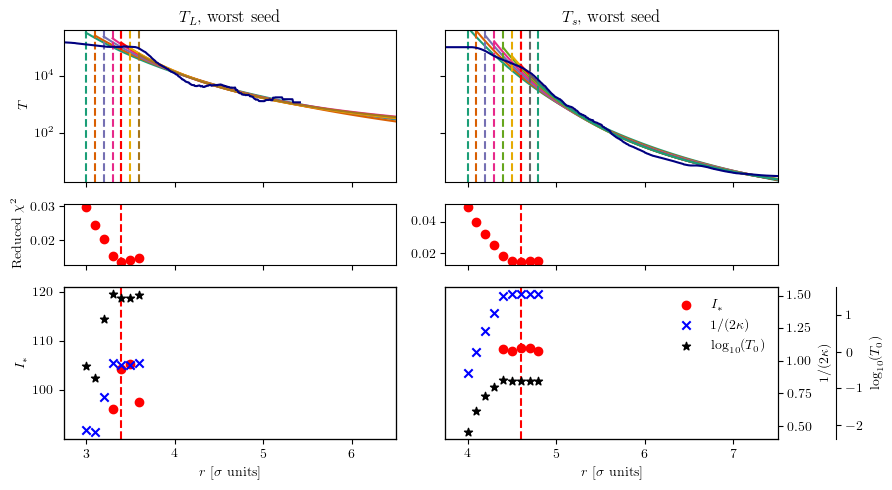

In [167]:
# fig, ax = plt.subplots(2, 2, figsize=(9, 4))
fig = plt.figure(figsize=(9, 5))
gs = fig.add_gridspec(3, 2, height_ratios=(1, 0.4, 1))

ax = np.array([
    [fig.add_subplot(gs[0,0]), fig.add_subplot(gs[0,1])],
    [fig.add_subplot(gs[2,0]), fig.add_subplot(gs[2,1])],
    [fig.add_subplot(gs[1,0]), fig.add_subplot(gs[1,1])],
])


ax1_bis = ax[1,0].twinx()
ax1_ter = ax[1,0].twinx()

ax2_bis = ax[1,1].twinx()
ax2_ter = ax[1,1].twinx()

cmap=plt.get_cmap("Dark2")
colors = [cmap(i/8) for i in range(8)]

selected_idx = 4
max_idx = 6

for i, out in enumerate(lyap_list_result_bad_all[2]):
    color = colors[i%8] if i!=selected_idx else "red"
    if out is None:
        continue
    if i > max_idx:
        continue
    x = np.linspace(sigma_fit_samples_bad[i], 7.0, 100)
    ax[0,0].axvline(sigma_fit_samples_bad[i], color=color, linestyle="--")
    ax[0,0].plot(x, nek_law(out.params, x, None), color=color)

    ax[1,0].scatter([sigma_fit_samples_bad[i]], [out.params["sig_0"].value**2], color="red")
    ax1_bis.scatter([sigma_fit_samples_bad[i]], [out.params["b"].value/2], color="blue", label="$1/(2\\kappa)$", marker="x")
    ax1_ter.scatter([sigma_fit_samples_bad[i]], [out.params["t_0"].value], color="black", label="$t_0$ exponent", marker="*")
    # print(f"{sigma_fit_samples_bad[i]:2f}\t{10**out.params['t_0'].value:.2f}\t{out.params['sig_0'].value:.2f}\t{out.params['b'].value:.2f}")

    if i <= selected_idx:
        ax[2,0].scatter([sigma_fit_samples_bad[i]], [out.redchi], color="red")
        val = out.redchi
    else:
        if out.redchi < val:
            val = val + np.abs(val-out.redchi)
        else:
            val = out.redchi
        ax[2,0].scatter([sigma_fit_samples_bad[i]], [val], color="red")
    
ax[0,0].axvline(sigma_fit_samples_bad[selected_idx], color="red", linestyle="--")
ax[1,0].axvline(sigma_fit_samples_bad[selected_idx], color="red", linestyle="--")
ax[2,0].axvline(sigma_fit_samples_bad[selected_idx], color="red", linestyle="--")

# fix ax_ter yaxis position
# ax1_ter.spines.right.set_position(("axes", 1.1))

ax[1,0].set_ylabel("$I_\\ast$")
# ax1_bis.set_ylabel("$1/(2\\kappa)$")
# ax1_ter.set_ylabel("$t_0$ exponent")

ax[1,0].scatter([], [], color="red", label="$\\sigma_0$")
ax[1,0].scatter([], [], color="blue", label="$1/(2\\kappa)$", marker="x")
ax[1,0].scatter([], [], color="black", label="$t_0$ exponent", marker="*")
# ax[1,0].legend()

ax[0,0].plot(sigma_sample, lyapunov_wb_evo_list[100000][2], color="navy")
ax[0,0].set_title("$T_L$, worst seed")
ax[0,0].set_yscale("log")
ax[0,0].set_xlim(left=3.0)

selected_idx = 6
max_idx = 8

for i, out in enumerate(loss_fit_results_bad_all[2]):
    color = colors[i%8] if i!=selected_idx else "red"
    if out is None:
        continue
    if i > max_idx:
        continue
    x = np.linspace(sigma_fit_samples_bad_loss_bad[i], 9.0, 100)
    ax[0,1].axvline(sigma_fit_samples_bad_loss_bad[i], color=color, linestyle="--")
    ax[0,1].plot(x, nek_law(out.params, x, None), color=color)

    ax[1,1].scatter([sigma_fit_samples_bad_loss_bad[i]], [out.params["sig_0"].value**2], color="red")
    ax2_bis.scatter([sigma_fit_samples_bad_loss_bad[i]], [out.params["b"].value/2], color="blue", label="$1/(2\\kappa)$", marker="x")
    ax2_ter.scatter([sigma_fit_samples_bad_loss_bad[i]], [out.params["t_0"].value], color="black", label="$t_0$ exponent", marker="*")
    # print(f"{sigma_fit_samples_bad_loss_bad[i]:2f}\t{10**out.params['t_0'].value:.2f}\t{out.params['sig_0'].value:.2f}\t{out.params['b'].value:.2f}")
    if i <= selected_idx:
        ax[2,1].scatter([sigma_fit_samples_bad_loss_bad[i]], [out.redchi], color="red")
        val = out.redchi
    else:
        if out.redchi < val:
            val = val + np.abs(val-out.redchi)
        else:
            val = out.redchi
        ax[2,1].scatter([sigma_fit_samples_bad_loss_bad[i]], [val], color="red")


ax[0,1].axvline(sigma_fit_samples_bad_loss_bad[selected_idx], color="red", linestyle="--")
ax[1,1].axvline(sigma_fit_samples_bad_loss_bad[selected_idx], color="red", linestyle="--")
ax[2,1].axvline(sigma_fit_samples_bad_loss_bad[selected_idx], color="red", linestyle="--")

# fix ax_ter yaxis position
ax2_ter.spines.right.set_position(("axes", 1.175))

# ax[1,1].set_ylabel("$\\sigma_0$")
ax2_bis.set_ylabel("$1/(2\\kappa)$")
ax2_ter.set_ylabel("$\\log_{{10}}(T_0)$")

ax[1,1].scatter([], [], color="red", label="$I_\\ast$")
ax[1,1].scatter([], [], color="blue", label="$1/(2\\kappa)$", marker="x")
ax[1,1].scatter([], [], color="black", label="$\\log_{{10}}(T_0)$", marker="*")
ax[1,1].legend(frameon=False)

ax[0,1].plot(sigma_sample, loss_evo_list[100000][2], color="navy")
ax[0,1].set_title("$T_s$, worst seed")

ax[0,1].set_yscale("log")
# ax[0,1].set_xlim(left=3.0)

ax[0,0].set_ylim(2, 4e5)
ax[0,1].set_ylim(2, 4e5)
ax[0,0].set_xlim(2.75, 6.5)
ax[0,1].set_xlim(3.75, 7.5)
ax[1,0].set_xlim(2.75, 6.5)
ax[1,1].set_xlim(3.75, 7.5)
ax[2,0].set_xlim(2.75, 6.5)
ax[2,1].set_xlim(3.75, 7.5)

ax1_bis.get_shared_y_axes().join(ax2_bis, ax1_bis)
ax1_ter.get_shared_y_axes().join(ax1_ter, ax2_ter)
ax[1,0].set_ylim(9.5**2, 11**2)
ax[1,1].set_ylim(9.5**2, 11**2)

ax1_bis.set_yticklabels([])
ax1_bis.set_yticks([])
ax1_ter.set_yticklabels([])
ax1_ter.set_yticks([])
ax[0,1].set_yticklabels([])
ax[1,1].set_yticklabels([])
ax[1,1].set_yticks([])
ax[0,0].set_xticklabels([])
ax[0,1].set_xticklabels([])
ax[2,0].set_xticklabels([])
ax[2,1].set_xticklabels([])
# ax[2,1].set_yticklabels([])


ax[0,0].set_ylabel("$T$")
ax[2,0].set_ylabel("Reduced $\chi^2$")
ax[1,0].set_xlabel("$r$ [$\\sigma$ units]")
ax[1,1].set_xlabel("$r$ [$\\sigma$ units]")

plt.tight_layout()
plt.savefig(os.path.join(IMGDIR, "fit_l_time_bad.pdf"), bbox_inches="tight", dpi=600)

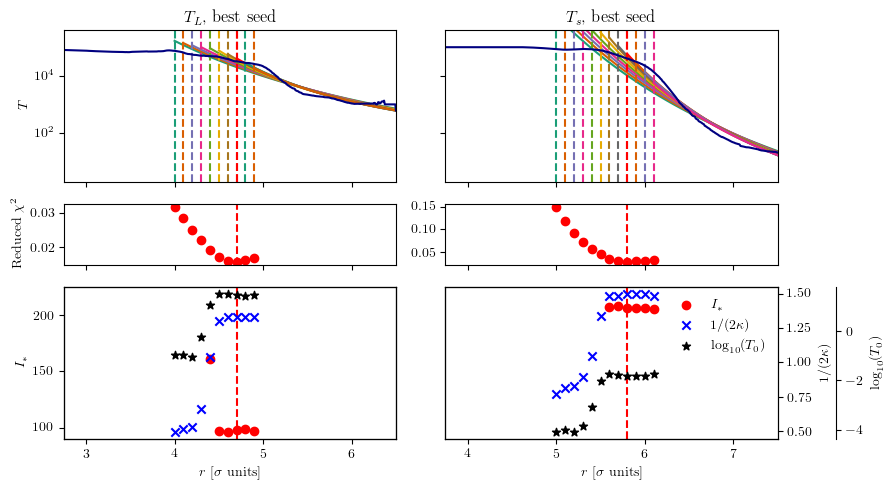

In [168]:
# fig, ax = plt.subplots(2, 2, figsize=(9, 4))
fig = plt.figure(figsize=(9, 5))
gs = fig.add_gridspec(3, 2, height_ratios=(1, 0.4, 1))

ax = np.array([
    [fig.add_subplot(gs[0,0]), fig.add_subplot(gs[0,1])],
    [fig.add_subplot(gs[2,0]), fig.add_subplot(gs[2,1])],
    [fig.add_subplot(gs[1,0]), fig.add_subplot(gs[1,1])],
])


ax1_bis = ax[1,0].twinx()
ax1_ter = ax[1,0].twinx()

ax2_bis = ax[1,1].twinx()
ax2_ter = ax[1,1].twinx()

cmap=plt.get_cmap("Dark2")
colors = [cmap(i/8) for i in range(8)]

selected_idx = 7
max_idx = 9

for i, out in enumerate(lyap_list_result_all[2]):
    color = colors[i%8] if i!=selected_idx else "red"
    if out is None:
        continue
    if i > max_idx:
        continue
    x = np.linspace(sigma_fit_samples[i], 7.0, 100)
    ax[0,0].axvline(sigma_fit_samples[i], color=color, linestyle="--")
    ax[0,0].plot(x, nek_law(out.params, x, None), color=color)

    ax[1,0].scatter([sigma_fit_samples[i]], [out.params["sig_0"].value**2], color="red")
    ax1_bis.scatter([sigma_fit_samples[i]], [out.params["b"].value/2], color="blue", label="$1/(2\\kappa)$", marker="x")
    ax1_ter.scatter([sigma_fit_samples[i]], [out.params["t_0"].value], color="black", label="$t_0$ exponent", marker="*")
    # print(f"{sigma_fit_samples[i]:2f}\t{10**out.params['t_0'].value:.2f}\t{out.params['sig_0'].value:.2f}\t{out.params['b'].value:.2f}")

    if i <= selected_idx:
        ax[2,0].scatter([sigma_fit_samples[i]], [out.redchi], color="red")
        val = out.redchi
    else:
        if out.redchi < val:
            val = val + np.abs(val-out.redchi)
        else:
            val = out.redchi
        ax[2,0].scatter([sigma_fit_samples[i]], [val], color="red")
    
ax[0,0].axvline(sigma_fit_samples[selected_idx], color="red", linestyle="--")
ax[1,0].axvline(sigma_fit_samples[selected_idx], color="red", linestyle="--")
ax[2,0].axvline(sigma_fit_samples[selected_idx], color="red", linestyle="--")

# fix ax_ter yaxis position
# ax1_ter.spines.right.set_position(("axes", 1.1))

ax[1,0].set_ylabel("$I_\\ast$")
# ax1_bis.set_ylabel("$1/(2\\kappa)$")
# ax1_ter.set_ylabel("$t_0$ exponent")

ax[1,0].scatter([], [], color="red", label="$\\sigma_0$")
ax[1,0].scatter([], [], color="blue", label="$1/(2\\kappa)$", marker="x")
ax[1,0].scatter([], [], color="black", label="$t_0$ exponent", marker="*")
# ax[1,0].legend()

ax[0,0].plot(sigma_sample, lyapunov_wb_evo_list[100000][-1], color="navy")
ax[0,0].set_title("$T_L$, best seed")
ax[0,0].set_yscale("log")
ax[0,0].set_xlim(left=3.0)

selected_idx = 8
max_idx = 11

for i, out in enumerate(loss_fit_results_all[2]):
    color = colors[i%8] if i!=selected_idx else "red"
    if out is None:
        continue
    if i > max_idx:
        continue
    x = np.linspace(sigma_fit_samples_loss[i], 9.0, 100)
    ax[0,1].axvline(sigma_fit_samples_loss[i], color=color, linestyle="--")
    ax[0,1].plot(x, nek_law(out.params, x, None), color=color)

    ax[1,1].scatter([sigma_fit_samples_loss[i]], [out.params["sig_0"].value**2], color="red")
    ax2_bis.scatter([sigma_fit_samples_loss[i]], [out.params["b"].value/2], color="blue", label="$1/(2\\kappa)$", marker="x")
    ax2_ter.scatter([sigma_fit_samples_loss[i]], [out.params["t_0"].value], color="black", label="$t_0$ exponent", marker="*")
    # print(f"{sigma_fit_samples_loss[i]:2f}\t{10**out.params['t_0'].value:.2f}\t{out.params['sig_0'].value:.2f}\t{out.params['b'].value:.2f}")
    if i <= selected_idx:
        ax[2,1].scatter([sigma_fit_samples_loss[i]], [out.redchi], color="red")
        val = out.redchi
    else:
        if out.redchi < val:
            val = val + np.abs(val-out.redchi)
        else:
            val = out.redchi
        ax[2,1].scatter([sigma_fit_samples_loss[i]], [val], color="red")


ax[0,1].axvline(sigma_fit_samples_loss[selected_idx], color="red", linestyle="--")
ax[1,1].axvline(sigma_fit_samples_loss[selected_idx], color="red", linestyle="--")
ax[2,1].axvline(sigma_fit_samples_loss[selected_idx], color="red", linestyle="--")

# fix ax_ter yaxis position
ax2_ter.spines.right.set_position(("axes", 1.175))

# ax[1,1].set_ylabel("$\\sigma_0$")
ax2_bis.set_ylabel("$1/(2\\kappa)$")
ax2_ter.set_ylabel("$\\log_{{10}}(T_0)$")

ax[1,1].scatter([], [], color="red", label="$I_\\ast$")
ax[1,1].scatter([], [], color="blue", label="$1/(2\\kappa)$", marker="x")
ax[1,1].scatter([], [], color="black", label="$\\log_{{10}}(T_0)$", marker="*")
ax[1,1].legend(frameon=False)

ax[0,1].plot(sigma_sample, loss_evo_list[100000][-1], color="navy")
ax[0,1].set_title("$T_s$, best seed")

ax[0,1].set_yscale("log")
# ax[0,1].set_xlim(left=3.0)

ax[0,0].set_ylim(2, 4e5)
ax[0,1].set_ylim(2, 4e5)
ax[0,0].set_xlim(2.75, 6.5)
ax[0,1].set_xlim(3.75, 7.5)
ax[1,0].set_xlim(2.75, 6.5)
ax[1,1].set_xlim(3.75, 7.5)
ax[2,0].set_xlim(2.75, 6.5)
ax[2,1].set_xlim(3.75, 7.5)

ax1_bis.get_shared_y_axes().join(ax2_bis, ax1_bis)
ax1_ter.get_shared_y_axes().join(ax1_ter, ax2_ter)
ax[1,0].set_ylim(9.5**2, 15**2)
ax[1,1].set_ylim(9.5**2, 15**2)

ax1_bis.set_yticklabels([])
ax1_bis.set_yticks([])
ax1_ter.set_yticklabels([])
ax1_ter.set_yticks([])
ax[0,1].set_yticklabels([])
ax[1,1].set_yticklabels([])
ax[1,1].set_yticks([])
ax[0,0].set_xticklabels([])
ax[0,1].set_xticklabels([])
ax[2,0].set_xticklabels([])
ax[2,1].set_xticklabels([])
# ax[2,1].set_yticklabels([])


ax[0,0].set_ylabel("$T$")
ax[2,0].set_ylabel("Reduced $\chi^2$")
ax[1,0].set_xlabel("$r$ [$\\sigma$ units]")
ax[1,1].set_xlabel("$r$ [$\\sigma$ units]")

plt.tight_layout()
plt.savefig(os.path.join(IMGDIR, "fit_l_time_good.pdf"), bbox_inches="tight", dpi=600)

In [129]:
out

In [31]:
len(loss_fit_results_bad_all)

3

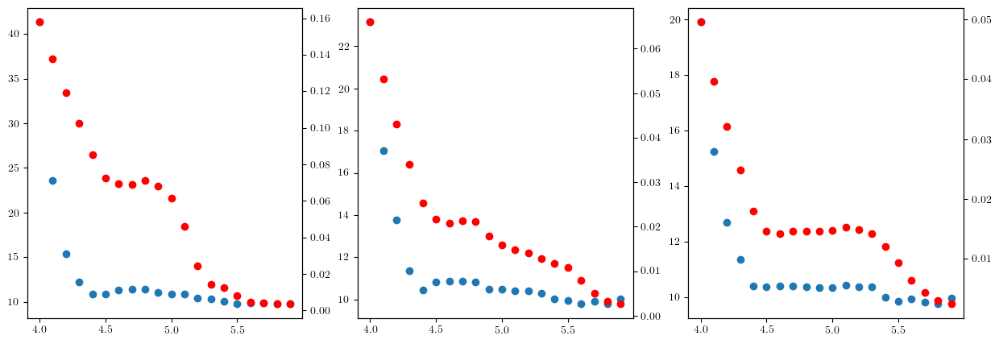

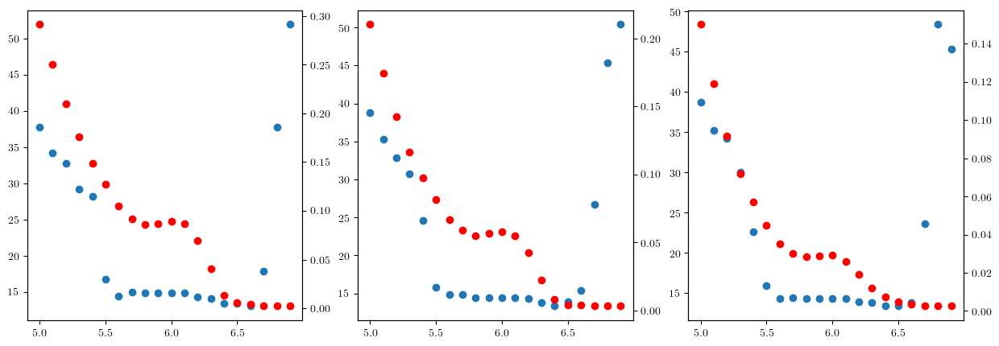

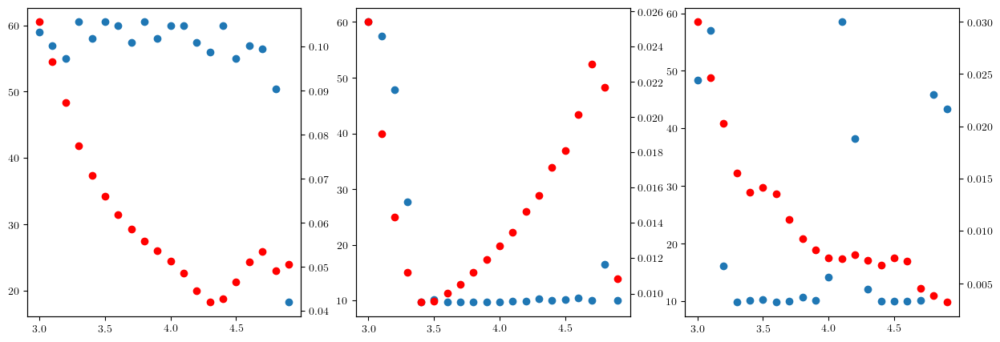

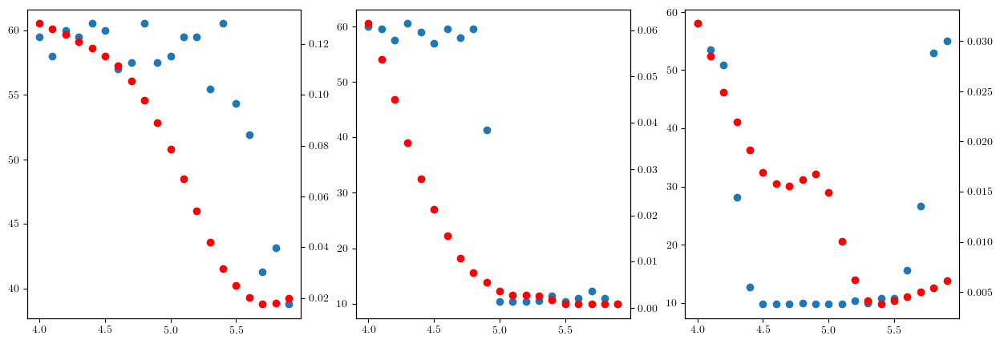

In [38]:
fig, axs = plt.subplots(1, 3, figsize=(15, 5))

for i, (fit_res, ax) in enumerate(zip(loss_fit_results_bad_all, axs)):
    val = [fit_res.params["sig_0"].value for fit_res in fit_res if fit_res is not None]
    ax.scatter(sigma_fit_samples_bad_loss_bad, val)
    ax2 = ax.twinx()
    red_chi_2 = [fit_res.redchi for fit_res in fit_res if fit_res is not None]
    ax2.scatter(sigma_fit_samples_bad_loss_bad, red_chi_2, color="red")

fig, axs = plt.subplots(1, 3, figsize=(15, 5))

for i, (fit_res, ax) in enumerate(zip(loss_fit_results_all, axs)):
    val = [fit_res.params["sig_0"].value for fit_res in fit_res if fit_res is not None]
    ax.scatter(sigma_fit_samples_loss, val)
    ax2 = ax.twinx()
    red_chi_2 = [fit_res.redchi for fit_res in fit_res if fit_res is not None]
    ax2.scatter(sigma_fit_samples_loss, red_chi_2, color="red")



fig, axs = plt.subplots(1, 3, figsize=(15, 5))

for i, (fit_res, ax) in enumerate(zip(lyap_list_result_bad_all, axs)):
    val = [fit_res.params["sig_0"].value for fit_res in fit_res if fit_res is not None]
    ax.scatter(sigma_fit_samples_bad, val)
    ax2 = ax.twinx()
    red_chi_2 = [fit_res.redchi for fit_res in fit_res if fit_res is not None]
    ax2.scatter(sigma_fit_samples_bad, red_chi_2, color="red")

fig, axs = plt.subplots(1, 3, figsize=(15, 5))

for i, (fit_res, ax) in enumerate(zip(lyap_list_result_all, axs)):
    val = [fit_res.params["sig_0"].value for fit_res in fit_res if fit_res is not None]
    ax.scatter(sigma_fit_samples, val)
    ax2 = ax.twinx()
    red_chi_2 = [fit_res.redchi for fit_res in fit_res if fit_res is not None]
    ax2.scatter(sigma_fit_samples, red_chi_2, color="red")
    

In [20]:
from uncertainties import ufloat

k_vals_l = {seed : {z:0 for z in [0.0, 0.15, 0.3]} for seed in ["best", "worst"]}
t0_vals_l = {seed : {z:0 for z in [0.0, 0.15, 0.3]} for seed in ["best", "worst"]}
sig0_vals_l = {seed : {z:0 for z in [0.0, 0.15, 0.3]} for seed in ["best", "worst"]}
redchi_vals_l = {seed : {z:0 for z in [0.0, 0.15, 0.3]} for seed in ["best", "worst"]}

k_vals_l["best"][0.0] = ufloat(loss_fit_results_all[0][8].params["b"].value, loss_fit_results_all[0][8].params["b"].stderr)
k_vals_l["best"][0.15] = ufloat(loss_fit_results_all[1][8].params["b"].value, loss_fit_results_all[1][8].params["b"].stderr)
k_vals_l["best"][0.3] = ufloat(loss_fit_results_all[2][8].params["b"].value, loss_fit_results_all[2][8].params["b"].stderr)

t0_vals_l["best"][0.0] = ufloat(loss_fit_results_all[0][8].params["t_0"].value, loss_fit_results_all[0][8].params["t_0"].stderr)
t0_vals_l["best"][0.15] = ufloat(loss_fit_results_all[1][8].params["t_0"].value, loss_fit_results_all[1][8].params["t_0"].stderr)
t0_vals_l["best"][0.3] = ufloat(loss_fit_results_all[2][8].params["t_0"].value, loss_fit_results_all[2][8].params["t_0"].stderr)

sig0_vals_l["best"][0.0] = ufloat(loss_fit_results_all[0][8].params["sig_0"].value, loss_fit_results_all[0][8].params["sig_0"].stderr)**2
sig0_vals_l["best"][0.15] = ufloat(loss_fit_results_all[1][8].params["sig_0"].value, loss_fit_results_all[1][8].params["sig_0"].stderr)**2
sig0_vals_l["best"][0.3] = ufloat(loss_fit_results_all[2][8].params["sig_0"].value, loss_fit_results_all[2][8].params["sig_0"].stderr)**2

redchi_vals_l["best"][0.0] = loss_fit_results_all[0][8].redchi
redchi_vals_l["best"][0.15] = loss_fit_results_all[1][8].redchi
redchi_vals_l["best"][0.3] = loss_fit_results_all[2][8].redchi

k_vals_l["worst"][0.0] = ufloat(loss_fit_results_bad_all[0][7].params["b"].value, loss_fit_results_bad_all[0][7].params["b"].stderr)
k_vals_l["worst"][0.15] = ufloat(loss_fit_results_bad_all[1][6].params["b"].value, loss_fit_results_bad_all[1][6].params["b"].stderr)
k_vals_l["worst"][0.3] = ufloat(loss_fit_results_bad_all[2][6].params["b"].value, loss_fit_results_bad_all[2][6].params["b"].stderr)

t0_vals_l["worst"][0.0] = ufloat(loss_fit_results_bad_all[0][7].params["t_0"].value, loss_fit_results_bad_all[0][7].params["t_0"].stderr)
t0_vals_l["worst"][0.15] = ufloat(loss_fit_results_bad_all[1][6].params["t_0"].value, loss_fit_results_bad_all[1][6].params["t_0"].stderr)
t0_vals_l["worst"][0.3] = ufloat(loss_fit_results_bad_all[2][6].params["t_0"].value, loss_fit_results_bad_all[2][6].params["t_0"].stderr)

sig0_vals_l["worst"][0.0] = ufloat(loss_fit_results_bad_all[0][7].params["sig_0"].value, loss_fit_results_bad_all[0][7].params["sig_0"].stderr)**2
sig0_vals_l["worst"][0.15] = ufloat(loss_fit_results_bad_all[1][6].params["sig_0"].value, loss_fit_results_bad_all[1][6].params["sig_0"].stderr)**2
sig0_vals_l["worst"][0.3] = ufloat(loss_fit_results_bad_all[2][6].params["sig_0"].value, loss_fit_results_bad_all[2][6].params["sig_0"].stderr)**2

redchi_vals_l["worst"][0.0] = loss_fit_results_bad_all[0][7].redchi
redchi_vals_l["worst"][0.15] = loss_fit_results_bad_all[1][6].redchi
redchi_vals_l["worst"][0.3] = loss_fit_results_bad_all[2][6].redchi


In [21]:
for seed in ["worst", "best"]:
    print(
        r"\multirow{3}{*}{\makecell{Worst\\seed}}" if seed == "worst" else r"\multirow{3}{*}{\makecell{Best\\seed}}" , end = " "
    )
    for i, d in enumerate([k_vals_l, sig0_vals_l, t0_vals_l, redchi_vals_l]):
        print(
            r' & $\log_{10}(T_0)$' if i == 2 else r' & $I_\ast$' if i == 1 else r' & $1/(2k)$' if i == 0 else r'Red. $\chi^2$', end =" "
        )
        for z in [0.0, 0.15, 0.3]:
            if i == 3:
                print(f"& {d[seed][z]:.3f}", end=" ")
            else:
                print(f"& ${d[seed][z]:.1L}$", end=" ")
        print("\\\\")
    print()
    print("\\midrule")

\multirow{3}{*}{\makecell{Worst\\seed}}  & $1/(2k)$ & $3 \pm 0$ & $3 \pm 0$ & $3 \pm 0$ \\
 & $I_\ast$ & $\left(1 \pm 0\right) \times 10^{2}$ & $\left(1 \pm 0\right) \times 10^{2}$ & $\left(1 \pm 0\right) \times 10^{2}$ \\
 & $\log_{10}(T_0)$ & $-1 \pm 0$ & $-1 \pm 0$ & $-0.8 \pm 0.1$ \\
Red. $\chi^2$ & 0.069 & 0.021 & 0.014 \\

\midrule
\multirow{3}{*}{\makecell{Best\\seed}}  & $1/(2k)$ & $3 \pm 0$ & $3 \pm 0$ & $3 \pm 0$ \\
 & $I_\ast$ & $\left(2 \pm 0\right) \times 10^{2}$ & $\left(2 \pm 0\right) \times 10^{2}$ & $\left(2 \pm 0\right) \times 10^{2}$ \\
 & $\log_{10}(T_0)$ & $-2 \pm 0$ & $-2 \pm 0$ & $-2 \pm 0$ \\
Red. $\chi^2$ & 0.086 & 0.055 & 0.028 \\

\midrule


In [22]:
from uncertainties import ufloat

k_vals_s = {seed : {z:0 for z in [0.0, 0.15, 0.3]} for seed in ["best", "worst"]}
t0_vals_s = {seed : {z:0 for z in [0.0, 0.15, 0.3]} for seed in ["best", "worst"]}
sig0_vals_s = {seed : {z:0 for z in [0.0, 0.15, 0.3]} for seed in ["best", "worst"]}
redchi_vals_s = {seed : {z:0 for z in [0.0, 0.15, 0.3]} for seed in ["best", "worst"]}

k_vals_s["best"][0.0] = ufloat(lyap_list_result_all[0][-3].params["b"].value, lyap_list_result_all[0][-3].params["b"].stderr)
k_vals_s["best"][0.15] = ufloat(lyap_list_result_all[1][12].params["b"].value, lyap_list_result_all[1][12].params["b"].stderr)
k_vals_s["best"][0.3] = ufloat(lyap_list_result_all[2][7].params["b"].value, lyap_list_result_all[2][7].params["b"].stderr)

t0_vals_s["best"][0.0] = ufloat(lyap_list_result_all[0][-3].params["t_0"].value, lyap_list_result_all[0][-3].params["t_0"].stderr)
t0_vals_s["best"][0.15] = ufloat(lyap_list_result_all[1][12].params["t_0"].value, lyap_list_result_all[1][12].params["t_0"].stderr)
t0_vals_s["best"][0.3] = ufloat(lyap_list_result_all[2][7].params["t_0"].value, lyap_list_result_all[2][7].params["t_0"].stderr)

sig0_vals_s["best"][0.0] = ufloat(lyap_list_result_all[0][-3].params["sig_0"].value, lyap_list_result_all[0][-3].params["sig_0"].stderr)**2
sig0_vals_s["best"][0.15] = ufloat(lyap_list_result_all[1][12].params["sig_0"].value, lyap_list_result_all[1][12].params["sig_0"].stderr)**2
sig0_vals_s["best"][0.3] = ufloat(lyap_list_result_all[2][7].params["sig_0"].value, lyap_list_result_all[2][7].params["sig_0"].stderr)**2

redchi_vals_s["best"][0.0] = lyap_list_result_all[0][-3].redchi
redchi_vals_s["best"][0.15] = lyap_list_result_all[1][12].redchi
redchi_vals_s["best"][0.3] = lyap_list_result_all[2][7].redchi

k_vals_s["worst"][0.0] = ufloat(lyap_list_result_bad_all[0][-2].params["b"].value, lyap_list_result_bad_all[0][-2].params["b"].stderr)
k_vals_s["worst"][0.15] = ufloat(lyap_list_result_bad_all[1][5].params["b"].value, lyap_list_result_bad_all[1][5].params["b"].stderr)
k_vals_s["worst"][0.3] = ufloat(lyap_list_result_bad_all[2][4].params["b"].value, lyap_list_result_bad_all[2][4].params["b"].stderr)

t0_vals_s["worst"][0.0] = ufloat(lyap_list_result_bad_all[0][-2].params["t_0"].value, lyap_list_result_bad_all[0][-2].params["t_0"].stderr)
t0_vals_s["worst"][0.15] = ufloat(lyap_list_result_bad_all[1][5].params["t_0"].value, lyap_list_result_bad_all[1][5].params["t_0"].stderr)
t0_vals_s["worst"][0.3] = ufloat(lyap_list_result_bad_all[2][4].params["t_0"].value, lyap_list_result_bad_all[2][4].params["t_0"].stderr)

sig0_vals_s["worst"][0.0] = ufloat(lyap_list_result_bad_all[0][-2].params["sig_0"].value, lyap_list_result_bad_all[0][-2].params["sig_0"].stderr)**2
sig0_vals_s["worst"][0.15] = ufloat(lyap_list_result_bad_all[1][5].params["sig_0"].value, lyap_list_result_bad_all[1][5].params["sig_0"].stderr)**2
sig0_vals_s["worst"][0.3] = ufloat(lyap_list_result_bad_all[2][4].params["sig_0"].value, lyap_list_result_bad_all[2][4].params["sig_0"].stderr)**2

redchi_vals_s["worst"][0.0] = lyap_list_result_bad_all[0][-2].redchi
redchi_vals_s["worst"][0.15] = lyap_list_result_bad_all[1][5].redchi
redchi_vals_s["worst"][0.3] = lyap_list_result_bad_all[2][4].redchi


In [23]:
for seed in ["worst", "best"]:
    print(
        r"\multirow{3}{*}{\makecell{Worst\\seed}}" if seed == "worst" else r"\multirow{3}{*}{\makecell{Best\\seed}}" , end = " "
    )
    for i, d in enumerate([k_vals_s, sig0_vals_s, t0_vals_s, redchi_vals_s]):
        print(
            r' & $\log_{10}(T_0)$' if i == 2 else r' & $I_\ast$' if i == 1 else r' & $1/(2k)$' if i == 0 else r'Red. $\chi^2$', end =" "
        )
        for z in [0.0, 0.15, 0.3]:
            if i == 3:
                print(f"& {d[seed][z]:.3f}", end=" ")
            else:
                print(f"& ${d[seed][z]:.1L}$", end=" ")
        print("\\\\")
    print()
    print("\\midrule")

\multirow{3}{*}{\makecell{Worst\\seed}}  & $1/(2k)$ & $1 \pm 3$ & $2 \pm 0$ & $2 \pm 0$ \\
 & $I_\ast$ & $\left(3 \pm 2\right) \times 10^{3}$ & $\left(1 \pm 0\right) \times 10^{2}$ & $\left(1 \pm 0\right) \times 10^{2}$ \\
 & $\log_{10}(T_0)$ & $\left(-0 \pm 2\right) \times 10^{1}$ & $2 \pm 0$ & $1 \pm 0$ \\
Red. $\chi^2$ & 0.049 & 0.010 & 0.014 \\

\midrule
\multirow{3}{*}{\makecell{Best\\seed}}  & $1/(2k)$ & $2 \pm 1$ & $3 \pm 0$ & $3 \pm 0$ \\
 & $I_\ast$ & $\left(2 \pm 0\right) \times 10^{3}$ & $\left(1 \pm 0\right) \times 10^{2}$ & $\left(1 \pm 0\right) \times 10^{2}$ \\
 & $\log_{10}(T_0)$ & $-4 \pm 5$ & $1 \pm 0$ & $1 \pm 0$ \\
Red. $\chi^2$ & 0.018 & 0.003 & 0.016 \\

\midrule


In [24]:
kl_ks = {seed : {z:0 for z in [0.0, 0.15, 0.3]} for seed in ["best", "worst"]}

alpha_1 = {seed : {z:0 for z in [0.0, 0.15, 0.3]} for seed in ["best", "worst"]}
alpha_2 = {seed : {z:0 for z in [0.0, 0.15, 0.3]} for seed in ["best", "worst"]}

beta_1 = {seed : {z:0 for z in [0.0, 0.15, 0.3]} for seed in ["best", "worst"]}
beta_2 = {seed : {z:0 for z in [0.0, 0.15, 0.3]} for seed in ["best", "worst"]}

for seed in ["worst", "best"]:
    for z in [0.0, 0.15, 0.3]:

        kl_ks[seed][z] = (1/(2*k_vals_l[seed][z])) / (1/(2*k_vals_s[seed][z]))

        alpha_1[seed][z] = (10**t0_vals_s[seed][z])
        beta_1[seed][z] = (sig0_vals_s[seed][z] / sig0_vals_l[seed][z]) ** (k_vals_s[seed][z])

        alpha_2[seed][z] = (10**t0_vals_s[seed][z]) / ((10**t0_vals_l[seed][z]) ** ((sig0_vals_s[seed][z]/sig0_vals_l[seed][z])**k_vals_s[seed][z]))
        beta_2[seed][z] = (sig0_vals_s[seed][z] / sig0_vals_l[seed][z]) ** (k_vals_s[seed][z])

In [82]:
kl_ks = {seed : {z:0 for z in [0.0, 0.15, 0.3]} for seed in ["best", "worst"]}

alpha_1 = {seed : {z:0 for z in [0.0, 0.15, 0.3]} for seed in ["best", "worst"]}
alpha_2 = {seed : {z:0 for z in [0.0, 0.15, 0.3]} for seed in ["best", "worst"]}

beta_1 = {seed : {z:0 for z in [0.0, 0.15, 0.3]} for seed in ["best", "worst"]}
beta_2 = {seed : {z:0 for z in [0.0, 0.15, 0.3]} for seed in ["best", "worst"]}

for seed in ["worst", "best"]:
    for z in [0.0, 0.15, 0.3]:

        kl_ks[seed][z] = (1/(2*k_vals_s[seed][z])) / (1/(2*k_vals_l[seed][z]))

        alpha_1[seed][z] = (10**t0_vals_l[seed][z])
        beta_1[seed][z] = (sig0_vals_l[seed][z] / sig0_vals_s[seed][z]) ** (k_vals_l[seed][z])

        alpha_2[seed][z] = (10**t0_vals_l[seed][z]) / ((10**t0_vals_s[seed][z]) ** ((sig0_vals_l[seed][z]/sig0_vals_s[seed][z])**k_vals_l[seed][z]))
        beta_2[seed][z] = (sig0_vals_l[seed][z] / sig0_vals_s[seed][z]) ** (k_vals_l[seed][z])

In [83]:
seed = "worst"
z = 0.0

print((10**t0_vals_s[seed][z]) / ((10**t0_vals_l[seed][z]) ** ((sig0_vals_s[seed][z]/sig0_vals_l[seed][z])**k_vals_s[seed][z])))
print(((sig0_vals_s[seed][z]/sig0_vals_l[seed][z])**k_vals_s[seed][z]))
print((10**t0_vals_s[seed][z]) / ((10**t0_vals_l[seed][z])))

(0+/-4)e+47
(0.4+/-3.4)e+02
0.01+/-0.22


In [84]:
for seed in ["worst", "best"]:
    for z in [0.0, 0.15, 0.3]:
        print(kl_ks[seed][z], end=" ")
        print(alpha_2[seed][z], end=" ")
        print(beta_2[seed][z], end=" ")
        print()
    print()

2+/-6 0.059+/-0.005 0.00016+/-0.00031 
1.56+/-0.08 0.0002+/-0.0017 1.4+/-1.6 
1.56+/-0.09 0.003+/-0.012 1.1+/-1.0 

2.0+/-1.3 0.007+/-0.005 0.0022+/-0.0020 
1.031+/-0.028 (0.2+/-3.3)e-09 7+/-6 
1.13+/-0.06 (0+/-8)e-15 9+/-8 



In [91]:
for seed in ["worst", "best"]:
    for z in [0.0, 0.15, 0.3]:
        print(f"${kl_ks[seed][z].n:.3}$", end=" ")
    print()
print()

for seed in ["worst", "best"]:
    for z in [0.0, 0.15, 0.3]:
        print(f"${alpha_2[seed][z].n:.5}$", end=" ")
    print()
print()

for seed in ["worst", "best"]:
    for z in [0.0, 0.15, 0.3]:
        print(f"${beta_2[seed][z].n:.3}$", end=" ")
    print()
print()


$2.38$ $1.56$ $1.56$ 
$2.0$ $1.03$ $1.13$ 

$0.058674$ $0.00024028$ $0.0033574$ 
$0.0069961$ $2.1662e-10$ $2.7956e-16$ 

$0.000163$ $1.43$ $1.13$ 
$0.00221$ $7.39$ $9.42$ 



In [86]:
for seed in ["worst", "best"]:
    for z in [0.0, 0.15, 0.3]:
        print(kl_ks[seed][z].n, end=" ")
        print(alpha_1[seed][z].n, end=" ")
        print(beta_1[seed][z].n, end=" ")
        print()
    print()

2.3795034152719166 0.05859749451245147 0.00016289911449809616 
1.5646071946706688 0.11141587886320163 1.4288556766855807 
1.562587903441995 0.15658301516206782 1.1261949865856042 

1.996406379062715 0.006865181835383675 0.0022051315308138364 
1.030931023820447 0.012053046209838544 7.393463611853242 
1.1250142060514423 0.015170856520458364 9.420574414353528 



In [40]:
for seed in ["worst", "best"]:
    print(
        r"\multirow{3}{*}{\makecell{Worst\\seed}}" if seed == "worst" else r"\multirow{3}{*}{\makecell{Best\\seed}}" , end = " "
    )
    for i, d in enumerate([k_vals_s, sig0_vals_s, t0_vals_s, redchi_vals_s]):
        print(
            r' & $\log_{10}(T_0)$' if i == 2 else r' & $I_\ast$' if i == 1 else r' & $1/(2k)$' if i == 0 else r'Red. $\chi^2$', end =" "
        )
        for z in [0.0, 0.15, 0.3]:
            if i == 3:
                print(f"& {d[seed][z]:.3f}", end=" ")
            else:
                print(f"& ${d[seed][z]:.1L}$", end=" ")
        print("\\\\")
    print()
    print("\\midrule")

best
0.0
('best', 'best', 'best')


TypeError: tuple indices must be integers or slices, not str

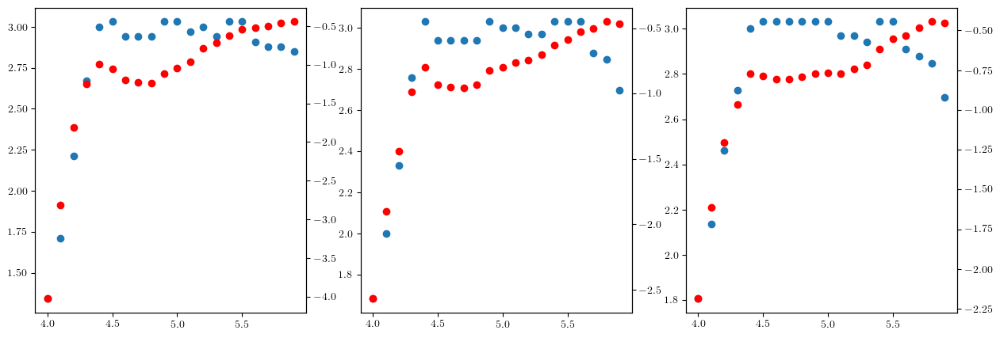

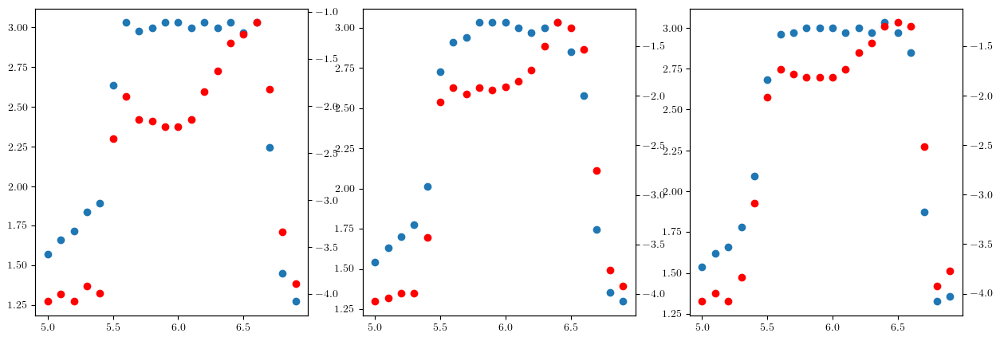

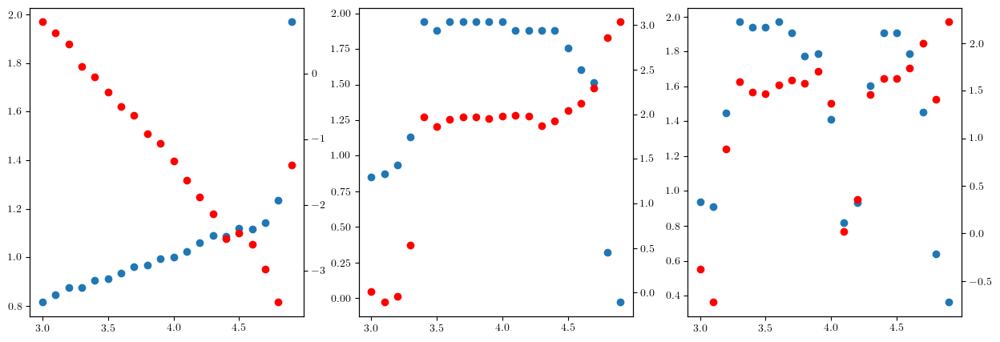

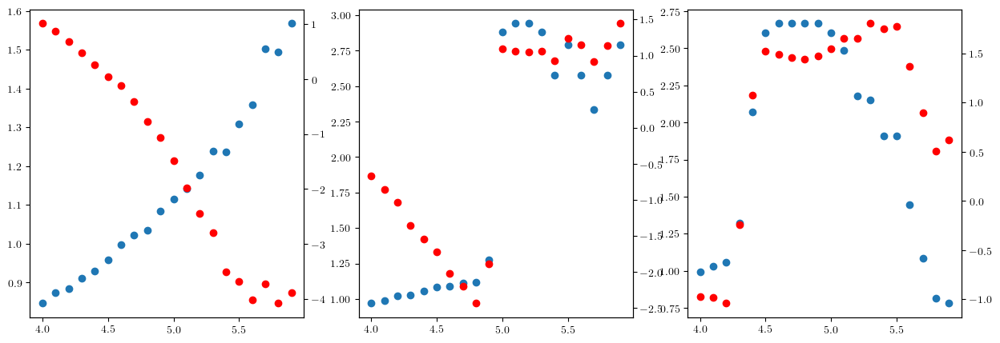

In [68]:
fig, axs = plt.subplots(1, 3, figsize=(15, 5))

for i, (fit_res, ax) in enumerate(zip(loss_fit_results_bad_all, axs)):
    val = [fit_res.params["b"].value for fit_res in fit_res if fit_res is not None]
    ax.scatter(sigma_fit_samples_bad_loss_bad, val)
    ax2 = ax.twinx()
    red_chi_2 = [fit_res.params["t_0"].value for fit_res in fit_res if fit_res is not None]
    ax2.scatter(sigma_fit_samples_bad_loss_bad, red_chi_2, color="red")

fig, axs = plt.subplots(1, 3, figsize=(15, 5))

for i, (fit_res, ax) in enumerate(zip(loss_fit_results_all, axs)):
    val = [fit_res.params["b"].value for fit_res in fit_res if fit_res is not None]
    ax.scatter(sigma_fit_samples_loss, val)
    ax2 = ax.twinx()
    red_chi_2 = [fit_res.params["t_0"].value for fit_res in fit_res if fit_res is not None]
    ax2.scatter(sigma_fit_samples_loss, red_chi_2, color="red")



fig, axs = plt.subplots(1, 3, figsize=(15, 5))

for i, (fit_res, ax) in enumerate(zip(lyap_list_result_bad_all, axs)):
    val = [fit_res.params["b"].value for fit_res in fit_res if fit_res is not None]
    ax.scatter(sigma_fit_samples_bad, val)
    ax2 = ax.twinx()
    red_chi_2 = [fit_res.params["t_0"].value for fit_res in fit_res if fit_res is not None]
    ax2.scatter(sigma_fit_samples_bad, red_chi_2, color="red")

fig, axs = plt.subplots(1, 3, figsize=(15, 5))

for i, (fit_res, ax) in enumerate(zip(lyap_list_result_all, axs)):
    val = [fit_res.params["b"].value for fit_res in fit_res if fit_res is not None]
    ax.scatter(sigma_fit_samples, val)
    ax2 = ax.twinx()
    red_chi_2 = [fit_res.params["t_0"].value for fit_res in fit_res if fit_res is not None]
    ax2.scatter(sigma_fit_samples, red_chi_2, color="red")
    

In [ ]:
import pickle
sigma_fit_samples = np.arange(3.5, 6.1, 0.25)
sigma_fit_samples_loss = np.arange(5.5, 7.6, 0.25)

with open("fit_results_evo.pkl", "rb") as f:
    fit_results_loss, fit_results_lyapunov_wb = pickle.load(f)

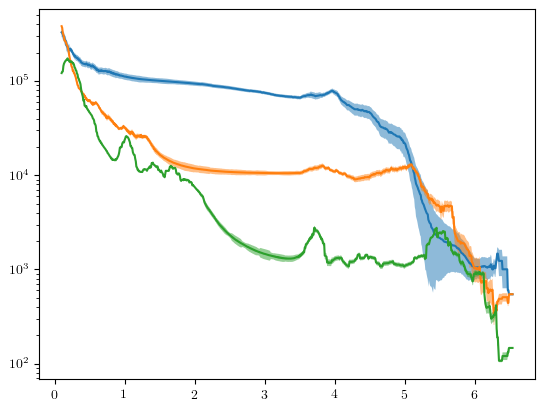

In [ ]:
plt.plot(sigma_sample, lyapunov_wb_evo_list[100000][8])
plt.fill_between(sigma_sample, lyapunov_wb_evo_list[100000][8] - lyapunov_wb_evo_std_list[100000][8], lyapunov_wb_evo_list[100000][8] + lyapunov_wb_evo_std_list[100000][8], alpha=0.5)
plt.plot(sigma_sample, lyapunov_wb_evo_list[10000][8])
plt.fill_between(sigma_sample, lyapunov_wb_evo_list[10000][8] - lyapunov_wb_evo_std_list[10000][8], lyapunov_wb_evo_list[10000][8] + lyapunov_wb_evo_std_list[10000][8], alpha=0.5)
plt.plot(sigma_sample, lyapunov_wb_evo_list[1000][8])
plt.fill_between(sigma_sample, lyapunov_wb_evo_list[1000][8] - lyapunov_wb_evo_std_list[1000][8], lyapunov_wb_evo_list[1000][8] + lyapunov_wb_evo_std_list[1000][8], alpha=0.5)
# plt.plot(sigma_sample, lyapunov_wb_evo_list[100000][2])
# plt.plot(sigma_sample, loss_evo_list[100000][2])
plt.yscale("log")

In [ ]:
lmfit.report_fit(out)

[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 68
    # data points      = 87
    # variables        = 3
    chi-square         = 1.61579609
    reduced chi-square = 0.01923567
    Akaike info crit   = -340.788991
    Bayesian info crit = -333.391266
[[Variables]]
    t_0:    40.5050505 +/- 78.0081643 (192.59%) (init = 50.50505)
    sig_0:  10.8344387 +/- 7.67830337 (70.87%) (init = 10.2)
    b:      2.03558493 +/- 1.19020485 (58.47%) (init = 2.121212)
    cap:    21600.19 (fixed)
[[Correlations]] (unreported correlations are < 0.100)
    C(sig_0, b)   = -0.999
    C(t_0, sig_0) = 0.998
    C(t_0, b)     = -0.995


In [ ]:

lmfit.report_fit(outwb)

[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 96
    # data points      = 87
    # variables        = 3
    chi-square         = 2.24063006
    reduced chi-square = 0.02667417
    Akaike info crit   = -312.346138
    Bayesian info crit = -304.948414
[[Variables]]
    t_0:    35.9829125 +/- 69.0818122 (191.99%) (init = 30.30303)
    sig_0:  9.75326648 +/- 3.88276994 (39.81%) (init = 10.2)
    b:      2.62525246 +/- 0.20774614 (7.91%) (init = 2.525253)
    cap:    77534.55 (fixed)
[[Correlations]] (unreported correlations are < 0.100)
    C(sig_0, b)   = -0.999
    C(t_0, sig_0) = -0.996
    C(t_0, b)     = 0.991


-8.468264558057061

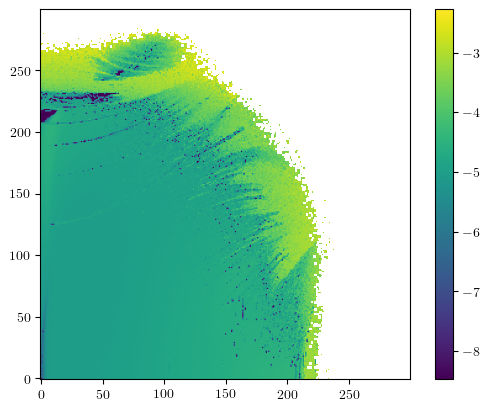

In [ ]:
plt.imshow(flibk_x_post_data_list[idx][-1].reshape(300, 300), origin="lower")
plt.colorbar()

np.nanmin(flibk_x_post_data_list[idx][-1])

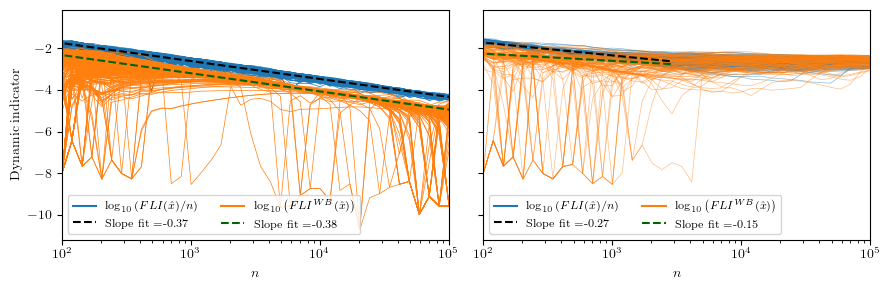

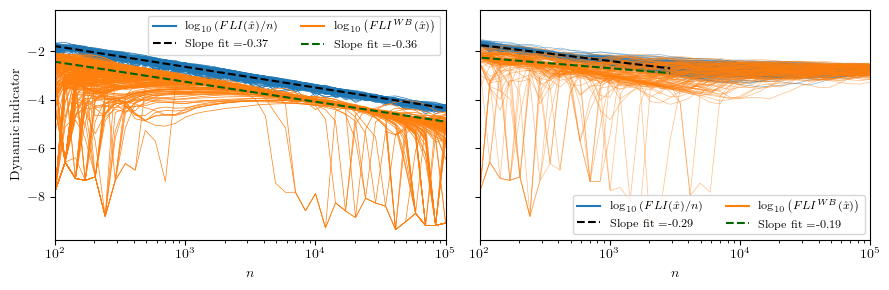

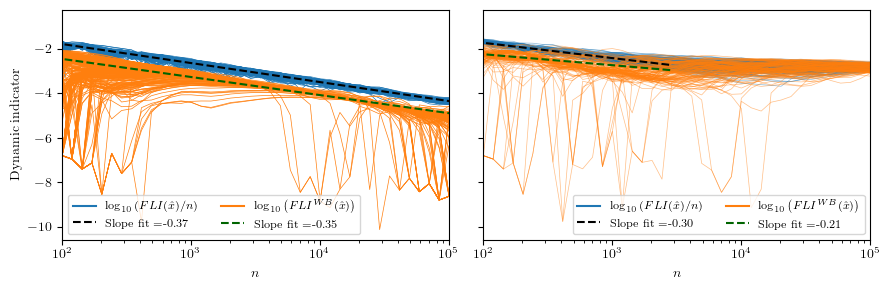

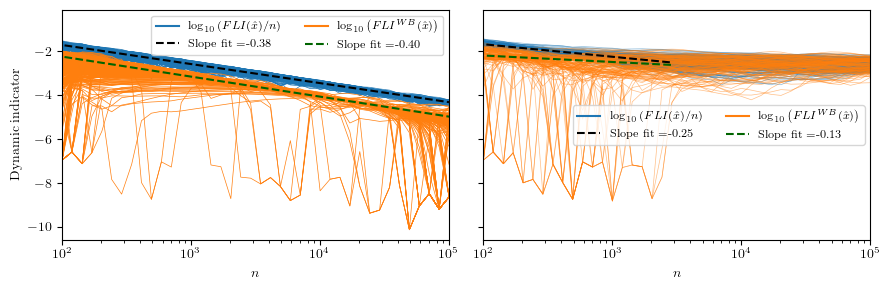

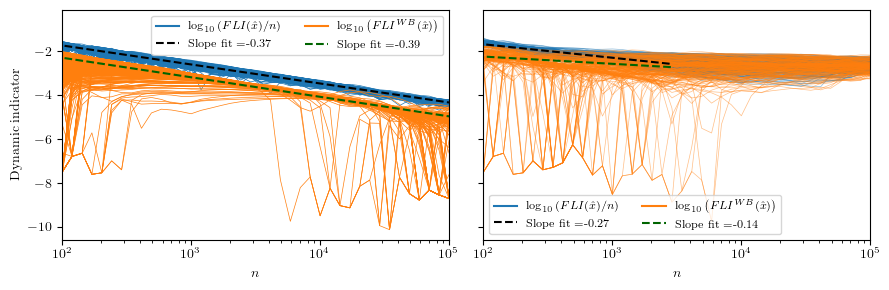

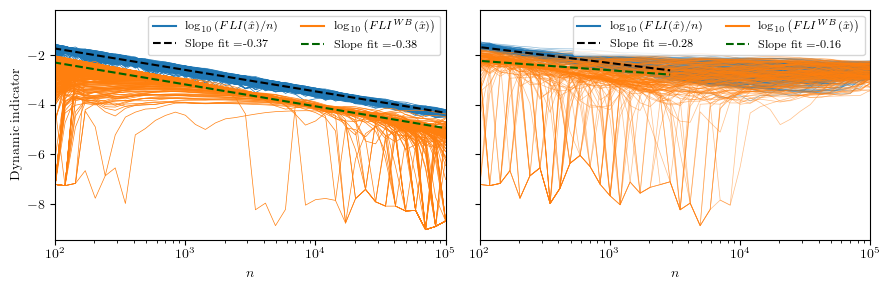

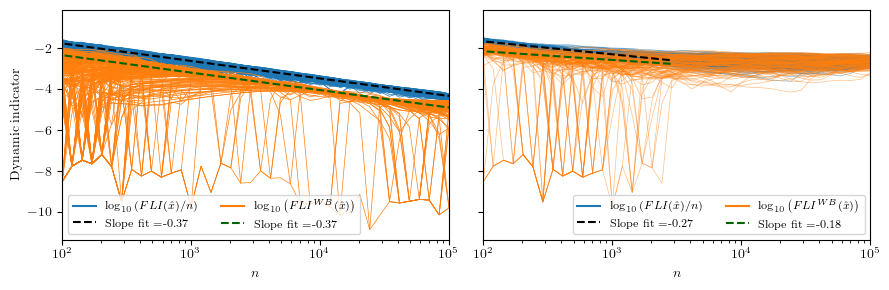

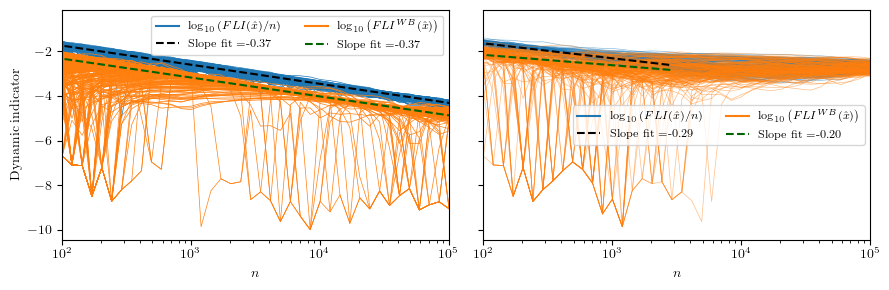

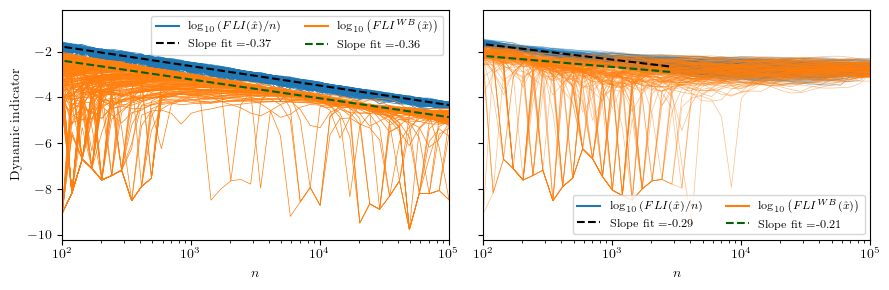

In [54]:
from uncertainties import ufloat

for main_index in range(9):
    tmp_data = fli_x_post_data_list[main_index]
    tmp_bdata = [p for p in flibk_x_post_data_list[main_index]]
    # plt.figure()
    # plt.hist(tmp_data[-1], bins=100)
    # plt.figure()
    # plt.hist(tmp_bdata[-1], bins=100)

    stab_mask_min = -4.5 
    stab_mask_max = -4.2
    stab_mask = np.logical_and(np.logical_and(tmp_data[-1] > stab_mask_min, tmp_data[-1] < stab_mask_max), tmp_bdata[-1]>-14)

    # print(np.count_nonzero(stab_mask))

    masked_data = [d[stab_mask][::100] for d in tmp_data]
    masked_bdata = [d[stab_mask][::100] for d in tmp_bdata] 

    tmp_data = np.log10(np.nanmean(np.power(10, masked_data), axis=1))
    tmp_bdata = np.log10(np.nanmean(np.power(10, masked_bdata), axis=1))

    fit_data = np.polyfit(np.log(times[12:]), tmp_data[12:], 1)
    fit_bdata = np.polyfit(np.log(times[12:]), tmp_bdata[12:], 1)

    fit_fn_data = np.poly1d(fit_data)
    fit_fn_bdata = np.poly1d(fit_bdata)

    fig, axs = plt.subplots(1, 2, figsize=(9, 3), sharey=True)
    axs[0].plot(times, masked_data, c="C0", linewidth=0.5)
    axs[0].plot([],[], c="C0", label="$\\log_{{10}}\\left({{FLI}}(\\hat{x}) / n \\right)$")
    axs[0].plot([], [], "--", c="black", label="Slope fit ={:.2f}".format(fit_data[0]))
    # plt.plot(times, [np.mean(d) for d in masked_data])
    axs[0].plot(times, masked_bdata, c="C1", linewidth=0.5)
    axs[0].plot([],[], c="C1", label="$\\log_{{10}}\\left({{FLI}}^{{WB}}(\\hat{x}) \\right)$")
    axs[0].plot([], [], "--", c="darkgreen", label="Slope fit ={:.2f}".format(fit_bdata[0]))
    # plt.plot(times, [np.mean(d) for d in masked_bdata])

    axs[0].plot(times, fit_fn_data(np.log(times)), "--", c="black")
    axs[0].plot(times, fit_fn_bdata(np.log(times)), "--", c="darkgreen")

    axs[0].set_xscale("log")
    axs[0].set_xlim(1e2, 1e5)
    axs[0].legend(ncol=2, fontsize="small")

    tmp_data = fli_x_post_data_list[main_index]
    tmp_bdata = [p for p in flibk_x_post_data_list[main_index]]

    chaos_mask_min = -3.0
    chaos_mask_max = -2.0
    chaos_mask = np.logical_and(np.logical_and(tmp_data[-1] > chaos_mask_min, tmp_data[-1] < chaos_mask_max), tmp_bdata[-1]>-14)

    # print(np.count_nonzero(chaos_mask))

    masked_data = [d[chaos_mask][::20] for d in tmp_data]
    masked_bdata = [d[chaos_mask][::20] for d in tmp_bdata]

    tmp_data = np.log10(np.nanmean(np.power(10, masked_data), axis=1))
    tmp_bdata = np.log10(np.nanmean(np.power(10, masked_bdata), axis=1))

    fit_data = np.polyfit(np.log(times[12:-20]), tmp_data[12:-20], 1)
    fit_bdata = np.polyfit(np.log(times[12:-20]), tmp_bdata[12:-20], 1)

    fit_fn_data = np.poly1d(fit_data)
    fit_fn_bdata = np.poly1d(fit_bdata)

    axs[1].plot(times, masked_data, c="C0", linewidth=0.5, alpha=0.5)
    axs[1].plot([],[], c="C0", label="$\\log_{{10}}\\left({{FLI}}(\\hat{x}) / n \\right)$")
    axs[1].plot([], [], "--", c="black", label="Slope fit ={:.2f}".format(fit_data[0]))
    # plt.plot(times, [np.mean(d) for d in masked_data])
    axs[1].plot(times, masked_bdata, c="C1", linewidth=0.5, alpha=0.5)
    axs[1].plot([],[], c="C1", label="$\\log_{{10}}\\left({{FLI}}^{{WB}}(\\hat{x}) \\right)$")
    axs[1].plot([], [], "--", c="darkgreen", label="Slope fit ={:.2f}".format(fit_bdata[0]))
    # plt.plot(times, [np.mean(d) for d in masked_bdata])

    axs[1].plot(times[:-20], fit_fn_data(np.log(times[:-20])), "--", c="black")
    axs[1].plot(times[:-20], fit_fn_bdata(np.log(times[:-20])), "--", c="darkgreen")

    axs[1].set_xscale("log")
    axs[1].set_xlim(1e2, 1e5)
    axs[1].legend(ncol=2, fontsize="small")

    axs[0].set_xlabel("$n$")
    axs[1].set_xlabel("$n$")

    axs[0].set_ylabel("Dynamic indicator")
    # axs[1].set_ylabel("$n$")

    # add a common title to the figure
    # plt.suptitle(f"{title_plot_list[main_index]}")

    plt.tight_layout()
    plt.savefig(os.path.join(IMGDIR, f"fli_vs_flibk_idx_{main_index}.pdf"), bbox_inches="tight", dpi=600)
    plt.savefig(os.path.join(IMGDIR, f"fli_vs_flibk_idx_{main_index}.png"), bbox_inches="tight", dpi=600)

In [52]:
fit_data

array([-0.29341658, -0.32146013])

/tmp/ipykernel_33073/423944429.py:41: RuntimeWarning: Mean of empty slice
  data_mean = np.nanmean([data_fli_x, data_fli_px, data_fli_y, data_fli_py, data_fli_zeta, data_fli_delta], axis=0)
/home/HPC/camontan/anaconda3/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1670: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


(300, 300, 4)


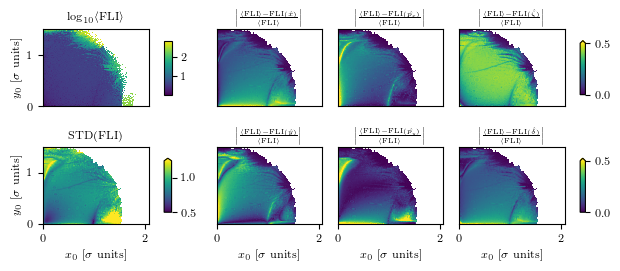

In [ ]:
# fig, axs = plt.subplots(1, 3, figsize=(8, 3))
for main_idx in range(4,5):

    fig = plt.figure(figsize=(7, 2.8))
    gs = gridspec.GridSpec(2, 6, width_ratios=[1, 0.35, 1, 1, 1, 0.05])

    gs0 = gridspec.GridSpecFromSubplotSpec(3, 1, subplot_spec=gs[0,5], height_ratios=[0.3, 1, 0.3])
    gs1 = gridspec.GridSpecFromSubplotSpec(3, 1, subplot_spec=gs[1,5], height_ratios=[0.3, 1, 0.3])

    gs2 = gridspec.GridSpecFromSubplotSpec(3, 2, subplot_spec=gs[0,1], height_ratios=[0.3, 1, 0.3], width_ratios=[1, 3.5])
    gs3 = gridspec.GridSpecFromSubplotSpec(3, 2, subplot_spec=gs[1,1], height_ratios=[0.3, 1, 0.3], width_ratios=[1, 3.5])


    axs = [
        plt.subplot(gs[0,0]),
        plt.subplot(gs[0,2]),
        plt.subplot(gs[0,3]),
        plt.subplot(gs[0,4]),
        plt.subplot(gs0[1]),

        plt.subplot(gs[1,0]),
        plt.subplot(gs[1,2]),
        plt.subplot(gs[1,3]),
        plt.subplot(gs[1,4]),
        plt.subplot(gs1[1]),

        plt.subplot(gs2[1,0]),
        plt.subplot(gs3[1,0]),
    ]

    idx = -1
    samples = 300

    data_fli_x = fli_x_data_list[main_idx][idx]
    data_fli_px = fli_px_data_list[main_idx][idx]
    data_fli_y = fli_y_data_list[main_idx][idx]
    data_fli_py = fli_py_data_list[main_idx][idx]
    data_fli_zeta = fli_zeta_data_list[main_idx][idx]
    data_fli_delta = fli_delta_data_list[main_idx][idx]

    data_mean = np.nanmean([data_fli_x, data_fli_px, data_fli_y, data_fli_py, data_fli_zeta, data_fli_delta], axis=0)
    data_std = np.nanstd([data_fli_x, data_fli_px, data_fli_y, data_fli_py, data_fli_zeta, data_fli_delta], axis=0)

    vmin = np.nanmin([np.nanmin(data_fli_x), np.nanmin(data_fli_px), np.nanmin(data_fli_y), np.nanmin(data_fli_py), np.nanmin(data_fli_zeta), np.nanmin(data_fli_delta)])
    vmax = np.nanmax([np.nanmax(data_fli_x), np.nanmax(data_fli_px), np.nanmax(data_fli_y), np.nanmax(data_fli_py), np.nanmax(data_fli_zeta), np.nanmax(data_fli_delta)])

    # vmin=0
    # vmax=20

    tmp = data_mean.copy().reshape(samples, samples)
    tmp_mask = tmp < 0
    cmap = plt.cm.get_cmap('viridis')
    tmp[tmp_mask] = np.nan
    norm = plt.Normalize(vmin=-4.0, vmax=np.nanmax(np.log10(tmp)))
    rgba = cmap(norm(np.log10(tmp)))
    print(rgba.shape)
    # color red the tmp_mask
    rgba[tmp_mask] = [1, 0, 0, 1]
    rgba[~tmp_mask] = [0, 0, 0, 0]

    tmp[np.isinf(tmp)] = np.nan

    map = axs[0].imshow(np.log10(data_mean).reshape(samples, samples), origin="lower", extent=e_list_sigma[main_idx], cmap="viridis", interpolation="nearest")
    axs[0].imshow((rgba), origin='lower', extent=e_list_sigma[main_idx], interpolation="nearest")

    axs[0].set_title("$\\log_{{10}}\\langle\\mathrm{{FLI}}\\rangle$", fontsize="small")
    axs[0].set_ylabel("$y_0$ [$\\sigma$ units]", fontsize="small")
    axs[0].set_xticklabels([])
    axs[0].set_xticks([])
    axs[0].set_xlabel("")

    cbar = plt.colorbar(map, cax=axs[-2], fraction=0.5)
    for t in cbar.ax.get_yticklabels():
        t.set_fontsize("small")

    map = axs[5].imshow(((data_std)).reshape(samples, samples), origin="lower", extent=e_list_sigma[main_idx], cmap="viridis", vmin=0.5, vmax=1.25)
    axs[5].set_title("$\\mathrm{{STD}}({{\\mathrm{{FLI}}}})$", fontsize="small")
    axs[5].set_xlabel("$x_0$ [$\\sigma$ units]", fontsize="small")
    axs[5].set_ylabel("$y_0$ [$\\sigma$ units]", fontsize="small")

    cbar = plt.colorbar(map, cax=axs[-1], fraction=0.5, extend="max")
    for t in cbar.ax.get_yticklabels():
        t.set_fontsize("small")

    diff_x = np.abs(np.abs(data_fli_x - data_mean) / data_mean)
    diff_px = np.abs(np.abs(data_fli_px - data_mean) / data_mean)
    diff_y = np.abs(np.abs(data_fli_y - data_mean) / data_mean)
    diff_py = np.abs(np.abs(data_fli_py - data_mean) / data_mean)
    diff_zeta = np.abs(np.abs(data_fli_zeta - data_mean) / data_mean)
    diff_delta = np.abs(np.abs(data_fli_delta - data_mean) / data_mean)

    map = axs[1].imshow((diff_x).reshape(samples, samples), origin="lower", extent=e_list_sigma[main_idx], cmap="viridis", vmin=0, vmax=0.5)
    axs[1].set_title("$\\left|\\frac{{\\langle\\mathrm{{FLI}}\\rangle - \\mathrm{{FLI}}(\\hat{{x}})}}{{\\langle\\mathrm{{FLI}}\\rangle}}\\right|$", fontsize="x-small")
    axs[1].set_xlabel("$x_0$ [$\\sigma$ units]")
    # remove y-axis labels
    axs[1].set_yticklabels([])
    axs[1].set_yticks([])
    axs[1].set_ylabel("")
    axs[1].set_xticklabels([])
    axs[1].set_xticks([])
    axs[1].set_xlabel("")

    map = axs[2].imshow((diff_px).reshape(samples, samples), origin="lower", extent=e_list_sigma[main_idx], cmap="viridis", vmin=0, vmax=0.5)
    axs[2].set_title("$\\left|\\frac{{\\langle\\mathrm{{FLI}}\\rangle - \\mathrm{{FLI}}(\\hat{{p_x}})}}{{\\langle\\mathrm{{FLI}}\\rangle}}\\right|$", fontsize="x-small")
    axs[2].set_xlabel("$x_0$ [$\\sigma$ units]")
    # remove y-axis labels
    axs[2].set_yticklabels([])
    axs[2].set_yticks([])
    axs[2].set_ylabel("")
    axs[2].set_xticklabels([])
    axs[2].set_xticks([])
    axs[2].set_xlabel("")

    map = axs[3].imshow((diff_zeta).reshape(samples, samples), origin="lower", extent=e_list_sigma[main_idx], cmap="viridis", vmin=0, vmax=0.5)
    axs[3].set_title("$\\left|\\frac{{\\langle\\mathrm{{FLI}}\\rangle - \\mathrm{{FLI}}(\\hat{{\\zeta}})}}{{\\langle\\mathrm{{FLI}}\\rangle}}\\right|$", fontsize="x-small")
    axs[3].set_xlabel("$x_0$ [$\\sigma$ units]")
    # remove y-axis labels
    axs[3].set_yticklabels([])
    axs[3].set_yticks([])
    axs[3].set_ylabel("")
    axs[3].set_xticklabels([])
    axs[3].set_xticks([])
    axs[3].set_xlabel("")

    map = axs[6].imshow((diff_y).reshape(samples, samples), origin="lower", extent=e_list_sigma[main_idx], cmap="viridis", vmin=0, vmax=0.5)
    axs[6].set_title("$\\left|\\frac{{\\langle\\mathrm{{FLI}}\\rangle - \\mathrm{{FLI}}(\\hat{{y}})}}{{\\langle\\mathrm{{FLI}}\\rangle}}\\right|$", fontsize="x-small")
    axs[6].set_xlabel("$x_0$ [$\\sigma$ units]", fontsize="small")
    # remove y-axis labels
    axs[6].set_yticklabels([])
    axs[6].set_yticks([])
    axs[6].set_ylabel("")

    map = axs[7].imshow((diff_py).reshape(samples, samples), origin="lower", extent=e_list_sigma[main_idx], cmap="viridis", vmin=0, vmax=0.5)
    axs[7].set_title("$\\left|\\frac{{\\langle\\mathrm{{FLI}}\\rangle - \\mathrm{{FLI}}(\\hat{{p_y}})}}{{\\langle\\mathrm{{FLI}}\\rangle}}\\right|$", fontsize="x-small")
    axs[7].set_xlabel("$x_0$ [$\\sigma$ units]", fontsize="small")
    # remove y-axis labels
    axs[7].set_yticklabels([])
    axs[7].set_yticks([])
    axs[7].set_ylabel("")

    map = axs[8].imshow((diff_delta).reshape(samples, samples), origin="lower", extent=e_list_sigma[main_idx], cmap="viridis", vmin=0, vmax=0.5)
    axs[8].set_title("$\\left|\\frac{{\\langle\\mathrm{{FLI}}\\rangle - \\mathrm{{FLI}}(\\hat{{\\delta}})}}{{\\langle\\mathrm{{FLI}}\\rangle}}\\right|$", fontsize="x-small")
    axs[8].set_xlabel("$x_0$ [$\\sigma$ units]", fontsize="small")
    # remove y-axis labels
    axs[8].set_yticklabels([])
    axs[8].set_yticks([])
    axs[8].set_ylabel("")

    cbar = plt.colorbar(map, cax=axs[4], extend="max", fraction=0.5)
    for t in cbar.ax.get_yticklabels():
        t.set_fontsize("small")
    cbar = plt.colorbar(map, cax=axs[9], extend="max", fraction=0.5)
    for t in cbar.ax.get_yticklabels():
        t.set_fontsize("small")


    # make all tick labels small
    for ax in axs:
        for t in ax.get_xticklabels():
            t.set_fontsize("small")
        for t in ax.get_yticklabels():
            t.set_fontsize("small")

    # plt.suptitle(f"{title_plot_list[main_idx]}", fontsize="small")
    # plt.tight_layout()
    # save figure
    plt.savefig(os.path.join(IMGDIR, f"LE_FLI_high_main_idx_{main_idx}.png"), bbox_inches="tight", dpi=600)

(300, 300, 4)
(300, 300, 4)
(300, 300, 4)
(300, 300, 4)
(300, 300, 4)
(300, 300, 4)
(300, 300, 4)
(300, 300, 4)
(300, 300, 4)


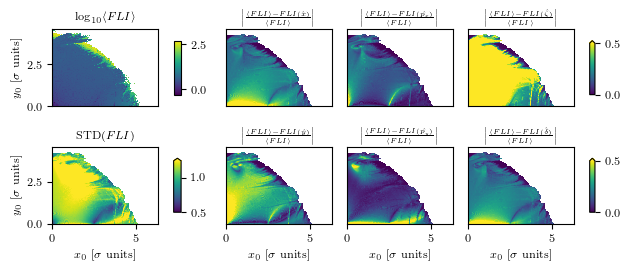

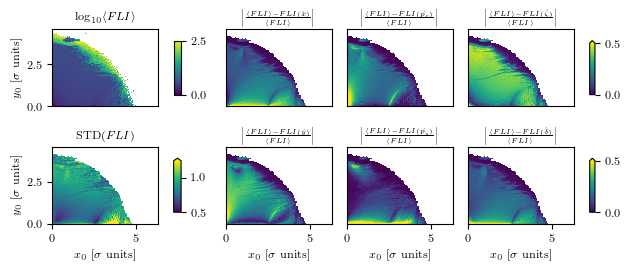

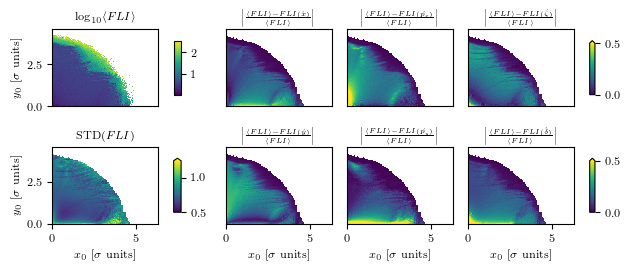

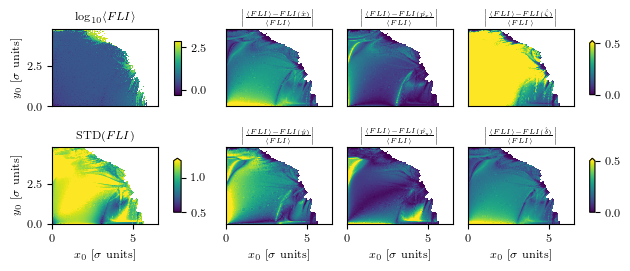

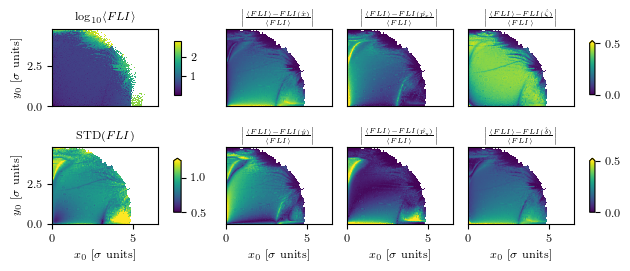

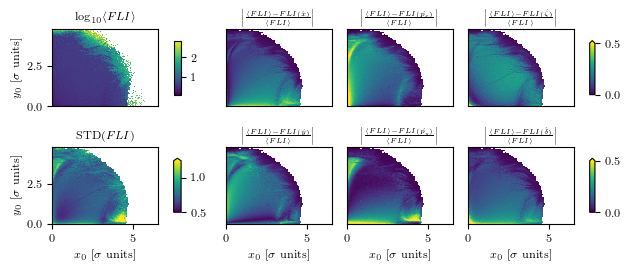

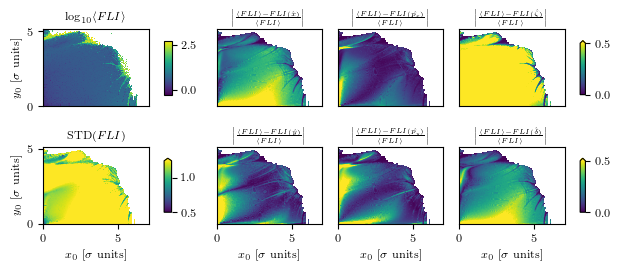

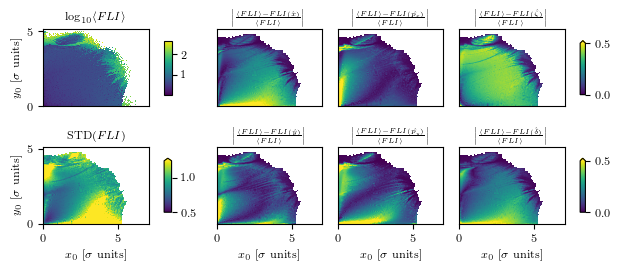

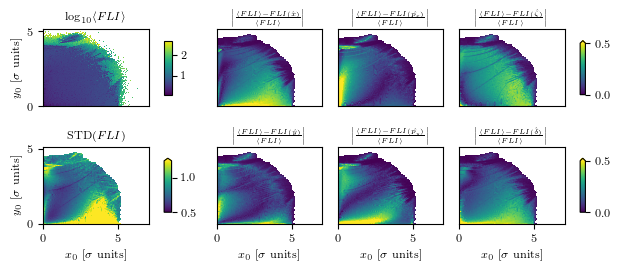

In [80]:
# fig, axs = plt.subplots(1, 3, figsize=(8, 3))
for main_idx in range(9):

    fig = plt.figure(figsize=(7, 2.8))
    gs = gridspec.GridSpec(2, 6, width_ratios=[1, 0.35, 1, 1, 1, 0.05])

    gs0 = gridspec.GridSpecFromSubplotSpec(3, 1, subplot_spec=gs[0,5], height_ratios=[0.3, 1, 0.3])
    gs1 = gridspec.GridSpecFromSubplotSpec(3, 1, subplot_spec=gs[1,5], height_ratios=[0.3, 1, 0.3])

    gs2 = gridspec.GridSpecFromSubplotSpec(3, 2, subplot_spec=gs[0,1], height_ratios=[0.3, 1, 0.3], width_ratios=[1, 3.5])
    gs3 = gridspec.GridSpecFromSubplotSpec(3, 2, subplot_spec=gs[1,1], height_ratios=[0.3, 1, 0.3], width_ratios=[1, 3.5])


    axs = [
        plt.subplot(gs[0,0]),
        plt.subplot(gs[0,2]),
        plt.subplot(gs[0,3]),
        plt.subplot(gs[0,4]),
        plt.subplot(gs0[1]),

        plt.subplot(gs[1,0]),
        plt.subplot(gs[1,2]),
        plt.subplot(gs[1,3]),
        plt.subplot(gs[1,4]),
        plt.subplot(gs1[1]),

        plt.subplot(gs2[1,0]),
        plt.subplot(gs3[1,0]),
    ]

    idx = -1
    samples = 300

    data_fli_x = fli_x_data_list[main_idx][idx]
    data_fli_px = fli_px_data_list[main_idx][idx]
    data_fli_y = fli_y_data_list[main_idx][idx]
    data_fli_py = fli_py_data_list[main_idx][idx]
    data_fli_zeta = fli_zeta_data_list[main_idx][idx]
    data_fli_delta = fli_delta_data_list[main_idx][idx]

    data_mean = np.nanmean([data_fli_x, data_fli_px, data_fli_y, data_fli_py, data_fli_zeta, data_fli_delta], axis=0)
    data_std = np.nanstd([data_fli_x, data_fli_px, data_fli_y, data_fli_py, data_fli_zeta, data_fli_delta], axis=0)

    vmin = np.nanmin([np.nanmin(data_fli_x), np.nanmin(data_fli_px), np.nanmin(data_fli_y), np.nanmin(data_fli_py), np.nanmin(data_fli_zeta), np.nanmin(data_fli_delta)])
    vmax = np.nanmax([np.nanmax(data_fli_x), np.nanmax(data_fli_px), np.nanmax(data_fli_y), np.nanmax(data_fli_py), np.nanmax(data_fli_zeta), np.nanmax(data_fli_delta)])

    # vmin=0
    # vmax=20

    tmp = data_mean.copy().reshape(samples, samples)
    tmp_mask = tmp < 0
    cmap = plt.cm.get_cmap('viridis')
    tmp[tmp_mask] = np.nan
    norm = plt.Normalize(vmin=-4.0, vmax=np.nanmax(np.log10(tmp)))
    rgba = cmap(norm(np.log10(tmp)))
    print(rgba.shape)
    # color red the tmp_mask
    rgba[tmp_mask] = [1, 0, 0, 1]
    rgba[~tmp_mask] = [0, 0, 0, 0]

    tmp[np.isinf(tmp)] = np.nan

    map = axs[0].imshow(np.log10(data_mean).reshape(samples, samples), origin="lower", extent=e_list_sigma[main_idx], cmap="viridis", interpolation="nearest")
    axs[0].imshow((rgba), origin='lower', extent=e_list_sigma[main_idx], interpolation="nearest")

    axs[0].set_title("$\\log_{{10}}\\langle{{FLI}}\\rangle$", fontsize="small")
    axs[0].set_ylabel("$y_0$ [$\\sigma$ units]", fontsize="small")
    axs[0].set_xticklabels([])
    axs[0].set_xticks([])
    axs[0].set_xlabel("")

    cbar = plt.colorbar(map, cax=axs[-2], fraction=0.5)
    for t in cbar.ax.get_yticklabels():
        t.set_fontsize("small")

    map = axs[5].imshow(((data_std)).reshape(samples, samples), origin="lower", extent=e_list_sigma[main_idx], cmap="viridis", vmin=0.5, vmax=1.25)
    axs[5].set_title("$\\mathrm{{STD}}({{{{FLI}}}})$", fontsize="small")
    axs[5].set_xlabel("$x_0$ [$\\sigma$ units]", fontsize="small")
    axs[5].set_ylabel("$y_0$ [$\\sigma$ units]", fontsize="small")

    cbar = plt.colorbar(map, cax=axs[-1], fraction=0.5, extend="max")
    for t in cbar.ax.get_yticklabels():
        t.set_fontsize("small")

    diff_x = np.abs(np.abs(data_fli_x - data_mean) / data_mean)
    diff_px = np.abs(np.abs(data_fli_px - data_mean) / data_mean)
    diff_y = np.abs(np.abs(data_fli_y - data_mean) / data_mean)
    diff_py = np.abs(np.abs(data_fli_py - data_mean) / data_mean)
    diff_zeta = np.abs(np.abs(data_fli_zeta - data_mean) / data_mean)
    diff_delta = np.abs(np.abs(data_fli_delta - data_mean) / data_mean)

    map = axs[1].imshow((diff_x).reshape(samples, samples), origin="lower", extent=e_list_sigma[main_idx], cmap="viridis", vmin=0, vmax=0.5)
    axs[1].set_title("$\\left|\\frac{{\\langle{{FLI}}\\rangle - {{FLI}}(\\hat{{x}})}}{{\\langle{{FLI}}\\rangle}}\\right|$", fontsize="x-small")
    axs[1].set_xlabel("$x_0$ [$\\sigma$ units]")
    # remove y-axis labels
    axs[1].set_yticklabels([])
    axs[1].set_yticks([])
    axs[1].set_ylabel("")
    axs[1].set_xticklabels([])
    axs[1].set_xticks([])
    axs[1].set_xlabel("")

    map = axs[2].imshow((diff_px).reshape(samples, samples), origin="lower", extent=e_list_sigma[main_idx], cmap="viridis", vmin=0, vmax=0.5)
    axs[2].set_title("$\\left|\\frac{{\\langle{{FLI}}\\rangle - {{FLI}}(\\hat{{p_x}})}}{{\\langle{{FLI}}\\rangle}}\\right|$", fontsize="x-small")
    axs[2].set_xlabel("$x_0$ [$\\sigma$ units]")
    # remove y-axis labels
    axs[2].set_yticklabels([])
    axs[2].set_yticks([])
    axs[2].set_ylabel("")
    axs[2].set_xticklabels([])
    axs[2].set_xticks([])
    axs[2].set_xlabel("")

    map = axs[3].imshow((diff_zeta).reshape(samples, samples), origin="lower", extent=e_list_sigma[main_idx], cmap="viridis", vmin=0, vmax=0.5)
    axs[3].set_title("$\\left|\\frac{{\\langle{{FLI}}\\rangle - {{FLI}}(\\hat{{\\zeta}})}}{{\\langle{{FLI}}\\rangle}}\\right|$", fontsize="x-small")
    axs[3].set_xlabel("$x_0$ [$\\sigma$ units]")
    # remove y-axis labels
    axs[3].set_yticklabels([])
    axs[3].set_yticks([])
    axs[3].set_ylabel("")
    axs[3].set_xticklabels([])
    axs[3].set_xticks([])
    axs[3].set_xlabel("")

    map = axs[6].imshow((diff_y).reshape(samples, samples), origin="lower", extent=e_list_sigma[main_idx], cmap="viridis", vmin=0, vmax=0.5)
    axs[6].set_title("$\\left|\\frac{{\\langle{{FLI}}\\rangle - {{FLI}}(\\hat{{y}})}}{{\\langle{{FLI}}\\rangle}}\\right|$", fontsize="x-small")
    axs[6].set_xlabel("$x_0$ [$\\sigma$ units]", fontsize="small")
    # remove y-axis labels
    axs[6].set_yticklabels([])
    axs[6].set_yticks([])
    axs[6].set_ylabel("")

    map = axs[7].imshow((diff_py).reshape(samples, samples), origin="lower", extent=e_list_sigma[main_idx], cmap="viridis", vmin=0, vmax=0.5)
    axs[7].set_title("$\\left|\\frac{{\\langle{{FLI}}\\rangle - {{FLI}}(\\hat{{p_y}})}}{{\\langle{{FLI}}\\rangle}}\\right|$", fontsize="x-small")
    axs[7].set_xlabel("$x_0$ [$\\sigma$ units]", fontsize="small")
    # remove y-axis labels
    axs[7].set_yticklabels([])
    axs[7].set_yticks([])
    axs[7].set_ylabel("")

    map = axs[8].imshow((diff_delta).reshape(samples, samples), origin="lower", extent=e_list_sigma[main_idx], cmap="viridis", vmin=0, vmax=0.5)
    axs[8].set_title("$\\left|\\frac{{\\langle{{FLI}}\\rangle - {{FLI}}(\\hat{{\\delta}})}}{{\\langle{{FLI}}\\rangle}}\\right|$", fontsize="x-small")
    axs[8].set_xlabel("$x_0$ [$\\sigma$ units]", fontsize="small")
    # remove y-axis labels
    axs[8].set_yticklabels([])
    axs[8].set_yticks([])
    axs[8].set_ylabel("")

    cbar = plt.colorbar(map, cax=axs[4], extend="max", fraction=0.5)
    for t in cbar.ax.get_yticklabels():
        t.set_fontsize("small")
    cbar = plt.colorbar(map, cax=axs[9], extend="max", fraction=0.5)
    for t in cbar.ax.get_yticklabels():
        t.set_fontsize("small")


    # make all tick labels small
    for ax in axs:
        for t in ax.get_xticklabels():
            t.set_fontsize("small")
        for t in ax.get_yticklabels():
            t.set_fontsize("small")

    # plt.suptitle(f"{title_plot_list[main_idx]}", fontsize="small")
    # plt.tight_layout()
    # save figure
    plt.savefig(os.path.join(IMGDIR, f"LE_FLI_high_main_idx_{main_idx}.pdf"), bbox_inches="tight", dpi=600)

(300, 300, 4)


/tmp/ipykernel_20716/2869993249.py:14: RuntimeWarning: invalid value encountered in log10
  cmap = plt.imshow(np.log10(data_mean).reshape(samples, samples), origin="lower", extent=1000 * e_list[7], cmap="viridis", vmin=-5, interpolation="nearest")


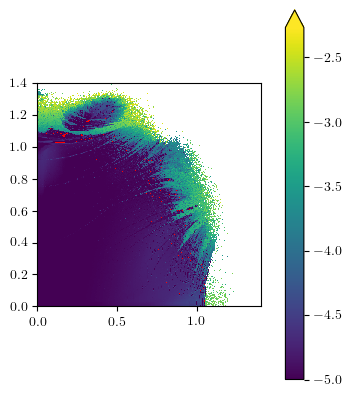

In [ ]:
tmp = data_mean.copy().reshape(samples, samples)
tmp_mask = tmp < 0
cmap = plt.cm.get_cmap('viridis')
tmp[tmp_mask] = np.nan
norm = plt.Normalize(vmin=-4.0, vmax=np.nanmax(np.log10(tmp)))
rgba = cmap(norm(np.log10(tmp)))
print(rgba.shape)
# color red the tmp_mask
rgba[tmp_mask] = [1, 0, 0, 1]
rgba[~tmp_mask] = [0, 0, 0, 0]

tmp[np.isinf(tmp)] = np.nan

cmap = plt.imshow(np.log10(data_mean).reshape(samples, samples), origin="lower", extent=1000 * e_list[7], cmap="viridis", vmin=-5, interpolation="nearest")
plt.imshow((rgba), origin='lower', extent=e_list[idx]*1000, interpolation="nearest")
plt.colorbar(cmap, extend="max", fraction=0.5)

/tmp/ipykernel_20716/1734136836.py:1: RuntimeWarning: invalid value encountered in log10
  plt.imshow(np.log10(data_mean).reshape(samples, samples), origin="lower", extent=1000 * e_list[7], cmap="viridis", vmin=-5)


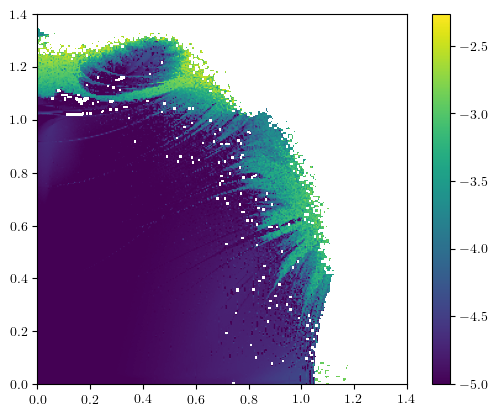

In [ ]:
plt.imshow(np.log10(data_mean).reshape(samples, samples), origin="lower", extent=1000 * e_list[7], cmap="viridis", vmin=-5)
plt.colorbar()

In [ ]:
np.count_nonzero(data_mean < 0)
np.count_nonzero(np.isinf(np.log10(data_mean)))

/tmp/ipykernel_20716/656745455.py:2: RuntimeWarning: invalid value encountered in log10
  np.count_nonzero(np.isinf(np.log10(data_mean)))


0

In [ ]:
print(times[26])
print(times[39])
print(times[52])

print(times[26:][0])
print(times[26:][13])
print(times[26:][26])

1000
10000
100000
1000
10000
100000


In [ ]:
for coord_label, latex_label, post_data_list, post_data_list_wb in list(zip(
    ["x", "px", "y", "py", "delta", "zeta"],
    ["x", "p_x", "y", "p_y", "\\delta", "\\zeta"],
    [fli_x_post_data_list, fli_px_post_data_list, fli_y_post_data_list, fli_py_post_data_list, fli_delta_post_data_list, fli_zeta_post_data_list],
    [flibk_x_thresh_list, flibk_px_thresh_list, flibk_y_thresh_list, flibk_py_thresh_list, flibk_delta_thresh_list, flibk_zeta_thresh_list],
))[4:5]:
    fig = plt.figure(figsize=(8, 6.75))

    gs = gridspec.GridSpec(2, 3, width_ratios=[1, 1, 1], height_ratios=[1, 1, 1])

    axs = []
    axs.append(plt.subplot(gs[0, 0]))
    axs.append(plt.subplot(gs[0, 1]))
    axs.append(plt.subplot(gs[0, 2]))
    axs.append(plt.subplot(gs[1, 0]))
    axs.append(plt.subplot(gs[1, 1]))
    axs.append(plt.subplot(gs[1, 2]))
    axs.append(plt.subplot(gs[2, 0]))
    axs.append(plt.subplot(gs[2, 1]))
    axs.append(plt.subplot(gs[2, 2]))

    idx = 4
    mask = mask_list[idx]

    for an_i, (ax, idx) in enumerate(zip(axs, range(3))):

        post_data = post_data_list[idx][26:]

        val_min, val_max = get_extents([l for l in post_data[::]], 10)
        print(val_min, val_max)

        val_min = -10.5
        val_max = -1.85

        tmp_data, bin_centers = compose_count_map([l[mask] for l in post_data], val_min, val_max, nbins=30, density=False)
        tmp_data = np.log10(tmp_data)
        # print(tmp_data.shape)
        # tmp_data = tmp_data[::13]

        cmap = axs[idx].imshow(tmp_data, cmap='viridis', aspect='auto', extent=[val_min, val_max, -0.5, len(times[26::])-0.5], interpolation='none')

        divider = make_axes_locatable(axs[idx])
        cax = divider.append_axes("right", size="5%", pad=0.05)
        cbar = plt.colorbar(cmap, cax=cax, label="$\\log_{{10}}(\\mathrm{{count}})$")

        post_data = post_data_list_wb[idx+3][26:]

        val_min, val_max = get_extents([l for l in post_data[::]], 10)
        print(val_min, val_max)

        val_min = -10.5
        val_max = -1.85

        tmp_data, bin_centers = compose_count_map([l[mask] for l in post_data], val_min, val_max, nbins=30, density=False)
        tmp_data = np.log10(tmp_data)
        # print(tmp_data.shape)
        # tmp_data = tmp_data[::13]

        cmap = axs[idx+3].imshow(tmp_data, cmap='viridis', aspect='auto', extent=[val_min, val_max, -0.5, len(times[26::])-0.5], interpolation='none')

        divider = make_axes_locatable(axs[idx+3])
        cax = divider.append_axes("right", size="5%", pad=0.05)
        cbar = plt.colorbar(cmap, cax=cax, label="$\\log_{{10}}(\\mathrm{{count}})$")

        # plot the thresholds over the imshow
        # for i, t in enumerate(thresholds):
        #     axs[idx].plot([t, t], [(len(thresholds)-1-i)-0.5, (len(thresholds)-1-i)+0.5], '--', color='red')

        # set the y ticks at idx 0, 13, and 26, and set the labels as 10^3, 10^4, and 10^5
        axs[idx+3].set_yticks([0, 13, 26])
        axs[idx+3].set_yticklabels([f"$10^{{{int(np.log10(times[26:][0]))}}}$", f"$10^{{{int(np.log10(times[26:][13]))}}}$", f"$10^{{{int(np.log10(times[26:][26]))}}}$"][::-1])
        
        axs[idx].set_ylabel("$n$")
        axs[idx].set_title(f"{title_plot_list[idx]}")

        if an_i != 0 and an_i != 3 and an_i != 6:
            print(an_i)
            axs[idx].set_yticklabels([])
            axs[idx].set_ylabel('')


    # increase distance between subplots
    # increase distance between subplots
    plt.suptitle(f"$\\mathrm{{FLI}}^{{WB}}(\\hat{{{latex_label}}})$")
    plt.subplots_adjust(wspace=0.35)
    plt.subplots_adjust(hspace=0.40)

    plt.savefig(os.path.join(IMGDIR, f"evolution_fli_wb_{coord_label}.png"), bbox_inches="tight", dpi=300)

ValueError: Expected the given number of height ratios to match the number of rows of the grid

<Figure size 800x675 with 0 Axes>

-4.889130730175444 -1.9854567539672077
-4.780076998638982 -1.9385212430866279
1
-4.680066710536729 -2.0244237611661435


/tmp/ipykernel_10061/1045252197.py:37: RuntimeWarning: divide by zero encountered in log10
  tmp_data = np.log10(tmp_data)


2
-4.848738116530658 -1.8322635869572401
-4.731382837881672 -1.84904761462972
4
-4.649758838481529 -1.7804641410853914
5
-4.934055076972833 -1.8824125688358024
-4.694391167721575 -1.8625908612607407
7
-4.569812103985085 -1.8797455299709482
8


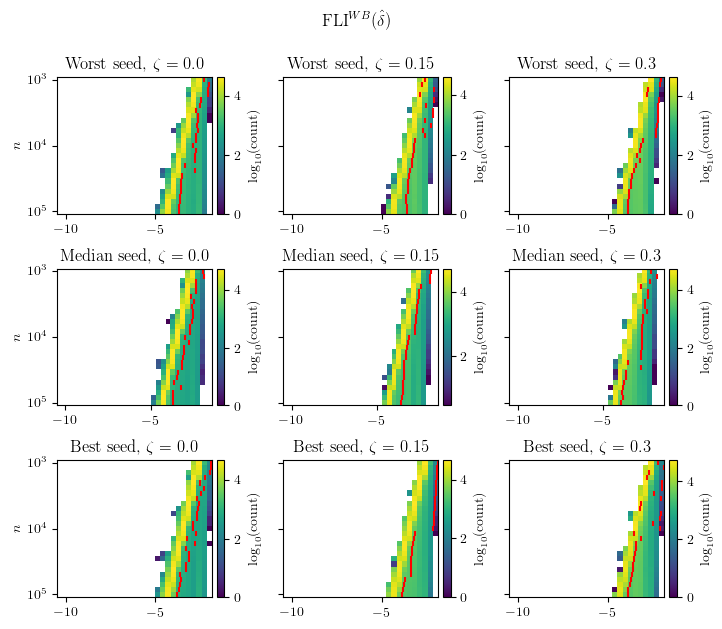

In [ ]:
for coord_label, latex_label, post_data_list, thresh_list in list(zip(
    ["x", "px", "y", "py", "delta", "zeta"],
    ["x", "p_x", "y", "p_y", "\\delta", "\\zeta"],
    [fli_x_post_data_list, fli_px_post_data_list, fli_y_post_data_list, fli_py_post_data_list, fli_delta_post_data_list, fli_zeta_post_data_list],
    [fli_x_thresh_list, fli_px_thresh_list, fli_y_thresh_list, fli_py_thresh_list, fli_delta_thresh_list, fli_zeta_thresh_list],
))[4:5]:
    fig = plt.figure(figsize=(8, 6.75))

    gs = gridspec.GridSpec(3, 3, width_ratios=[1, 1, 1], height_ratios=[1, 1, 1])

    axs = []
    axs.append(plt.subplot(gs[0, 0]))
    axs.append(plt.subplot(gs[0, 1]))
    axs.append(plt.subplot(gs[0, 2]))
    axs.append(plt.subplot(gs[1, 0]))
    axs.append(plt.subplot(gs[1, 1]))
    axs.append(plt.subplot(gs[1, 2]))
    axs.append(plt.subplot(gs[2, 0]))
    axs.append(plt.subplot(gs[2, 1]))
    axs.append(plt.subplot(gs[2, 2]))

    idx = 4
    mask = mask_list[idx]

    for an_i, (ax, idx, idx2, idx3) in enumerate(zip(axs, range(9), range(9), range(9))):

        post_data = post_data_list[idx][26:]
        thresholds = thresh_list[idx][26:]

        val_min, val_max = get_extents([l for l in post_data[::]], 10)
        print(val_min, val_max)

        val_min = -10.5
        val_max = -1.85

        tmp_data, bin_centers = compose_count_map([l[mask] for l in post_data], val_min, val_max, nbins=30, density=False)
        tmp_data = np.log10(tmp_data)
        # print(tmp_data.shape)
        # tmp_data = tmp_data[::13]

        cmap = ax.imshow(tmp_data, cmap='viridis', aspect='auto', extent=[val_min, val_max, -0.5, len(times[26::])-0.5], interpolation='none')

        divider = make_axes_locatable(ax)
        cax = divider.append_axes("right", size="5%", pad=0.05)
        cbar = plt.colorbar(cmap, cax=cax, label="$\\log_{{10}}(\\mathrm{{count}})$")

        # plot the thresholds over the imshow
        for i, t in enumerate(thresholds):
            ax.plot([t, t], [(len(thresholds)-1-i)-0.5, (len(thresholds)-1-i)+0.5], '--', color='red')

        # set the y ticks at idx 0, 13, and 26, and set the labels as 10^3, 10^4, and 10^5
        ax.set_yticks([0, 13, 26])
        ax.set_yticklabels([f"$10^{{{int(np.log10(times[26:][0]))}}}$", f"$10^{{{int(np.log10(times[26:][13]))}}}$", f"$10^{{{int(np.log10(times[26:][26]))}}}$"][::-1])
        
        ax.set_ylabel("$n$")
        ax.set_title(f"{title_plot_list[idx]}")

        if an_i != 0 and an_i != 3 and an_i != 6:
            print(an_i)
            ax.set_yticklabels([])
            ax.set_ylabel('')


    # increase distance between subplots
    # increase distance between subplots
    plt.suptitle(f"$\\mathrm{{FLI}}^{{WB}}(\\hat{{{latex_label}}})$")
    plt.subplots_adjust(wspace=0.35)
    plt.subplots_adjust(hspace=0.40)

    plt.savefig(os.path.join(IMGDIR, f"evolution_fli_wb_{coord_label}.png"), bbox_inches="tight", dpi=300)

-10.704061853897937 -1.949819295308284
-9.370952309917987 -2.001740202629692
1
-10.125527995728051 -1.9286470950635966


/tmp/ipykernel_33073/2622149261.py:37: RuntimeWarning: divide by zero encountered in log10
  tmp_data = np.log10(tmp_data)


2
-10.12074886991091 -1.823276852983119
-10.103106608726424 -1.8488962152573805
4
-9.04050834450708 -1.6713448516355567
5
-10.839286266355579 -1.893311453065993
-9.975850904566283 -1.8913498003490317
7
-9.767104092014856 -1.8614303772225778
8
-9.659086006314613 -1.9509151555128728
-10.895322743954903 -2.0017410111295733
1
-10.28002815992426 -1.9284823515350118


/tmp/ipykernel_33073/2622149261.py:37: RuntimeWarning: divide by zero encountered in log10
  tmp_data = np.log10(tmp_data)


2
-10.419010857851834 -1.8232742095932177
-10.198143488375448 -1.8489177036759894
4
-10.079218720419302 -1.671337475492575
5
-9.564114365425601 -1.8933054430808482
-9.561922198710363 -1.8913503762479285
7
-9.808195387052315 -1.861465012355664
8
-10.941454411763504 -1.9579199630577508
-9.242049979116405 -2.001740914532676
1
-8.986863575953633 -1.9292547903119297
2
-9.691669497767315 -1.823240528830471
-9.626057420239295 -1.8497248896226606
4
-8.876074160434783 -1.6714845840158605
5
-11.89904415725042 -1.8932242577060203
-9.972146959566338 -1.8913872653477097
7
-10.16032753222241 -1.8606584925285279
8
-10.6725033667224 -1.9580539768385314
-9.393717676424036 -2.0017443527599132
1
-9.536554958370443 -1.9296277887337683
2
-10.426996324900907 -1.8232393426831528
-9.329911348822538 -1.8500026224693664
4
-10.035418968492227 -1.6713228134040508
5
-10.995121619607609 -1.893216939906535
-9.295954785417578 -1.8913835726290884
7
-9.781707241874654 -1.8607612098339452
8
-9.896528227621552 -1.9508153

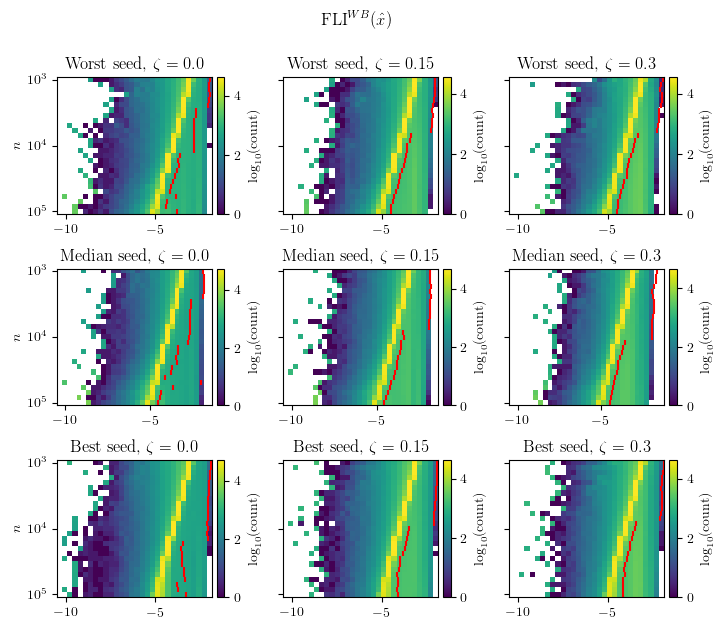

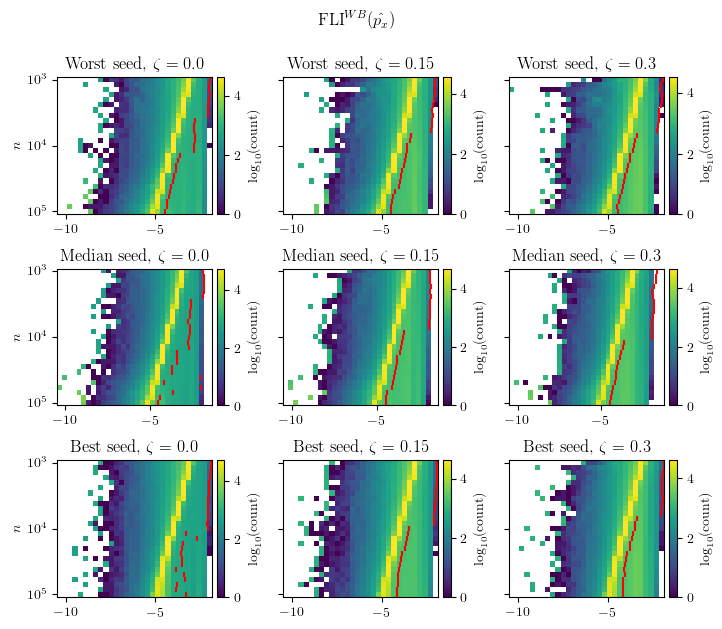

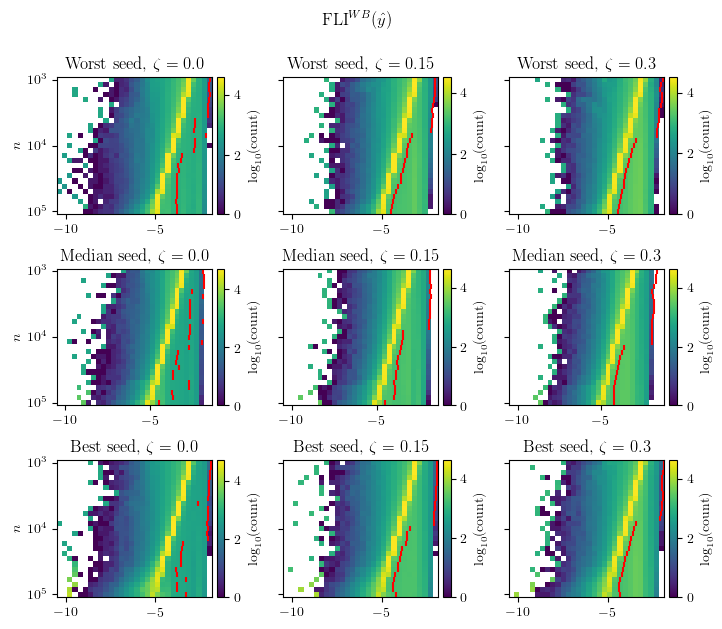

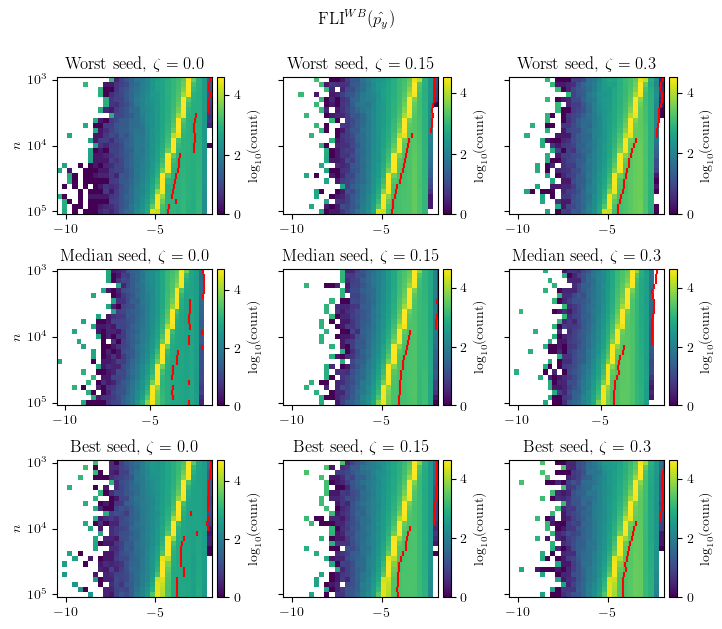

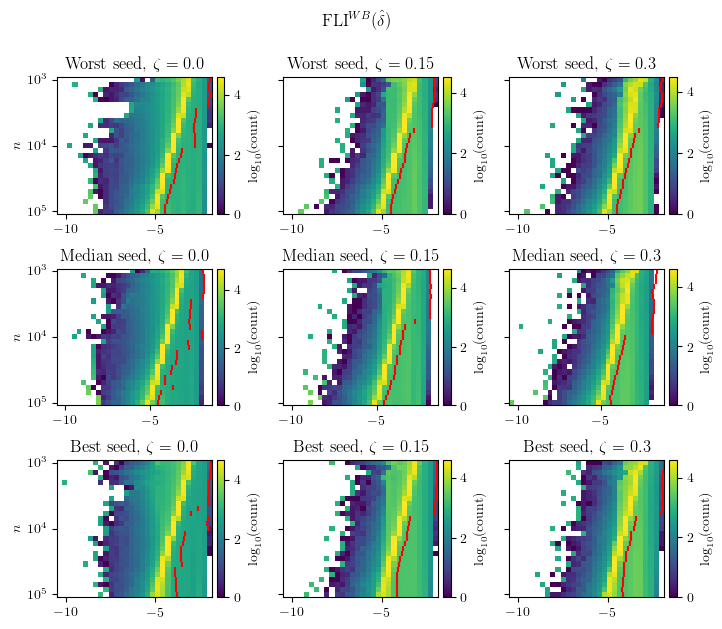

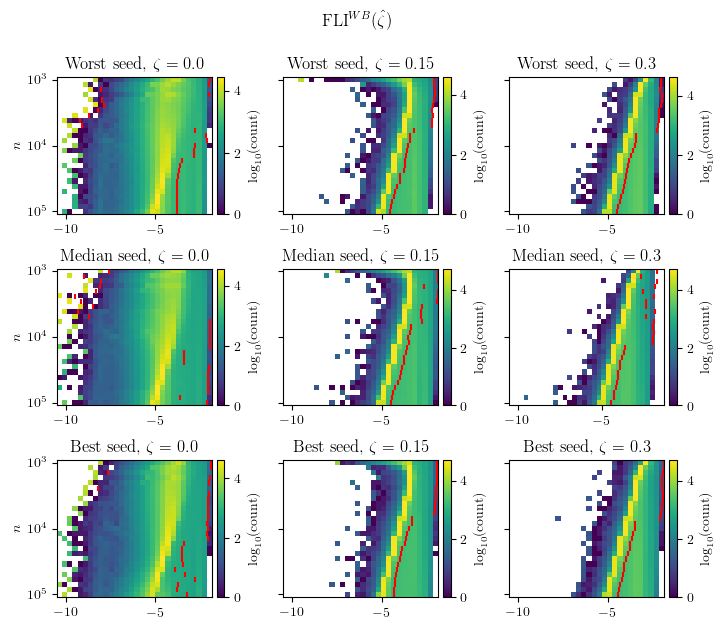

In [ ]:
for coord_label, latex_label, post_data_list, thresh_list in zip(
    ["x", "px", "y", "py", "delta", "zeta"],
    ["x", "p_x", "y", "p_y", "\\delta", "\\zeta"],
    [flibk_x_post_data_list, flibk_px_post_data_list, flibk_y_post_data_list, flibk_py_post_data_list, flibk_delta_post_data_list, flibk_zeta_post_data_list],
    [flibk_x_thresh_list, flibk_px_thresh_list, flibk_y_thresh_list, flibk_py_thresh_list, flibk_delta_thresh_list, flibk_zeta_thresh_list],
):
    fig = plt.figure(figsize=(8, 6.75))

    gs = gridspec.GridSpec(3, 3, width_ratios=[1, 1, 1], height_ratios=[1, 1, 1])

    axs = []
    axs.append(plt.subplot(gs[0, 0]))
    axs.append(plt.subplot(gs[0, 1]))
    axs.append(plt.subplot(gs[0, 2]))
    axs.append(plt.subplot(gs[1, 0]))
    axs.append(plt.subplot(gs[1, 1]))
    axs.append(plt.subplot(gs[1, 2]))
    axs.append(plt.subplot(gs[2, 0]))
    axs.append(plt.subplot(gs[2, 1]))
    axs.append(plt.subplot(gs[2, 2]))

    idx = 4
    mask = mask_list[idx]

    for an_i, (ax, idx, idx2, idx3) in enumerate(zip(axs, range(9), range(9), range(9))):

        post_data = post_data_list[idx][26:]
        thresholds = thresh_list[idx][26:]

        val_min, val_max = get_extents([l for l in post_data[::]], 10)
        print(val_min, val_max)

        val_min = -10.5
        val_max = -1.85

        tmp_data, bin_centers = compose_count_map([l[mask] for l in post_data], val_min, val_max, nbins=30, density=False)
        tmp_data = np.log10(tmp_data)
        # print(tmp_data.shape)
        # tmp_data = tmp_data[::13]

        cmap = ax.imshow(tmp_data, cmap='viridis', aspect='auto', extent=[val_min, val_max, -0.5, len(times[26::])-0.5], interpolation='none')

        divider = make_axes_locatable(ax)
        cax = divider.append_axes("right", size="5%", pad=0.05)
        cbar = plt.colorbar(cmap, cax=cax, label="$\\log_{{10}}(\\mathrm{{count}})$")

        # plot the thresholds over the imshow
        for i, t in enumerate(thresholds):
            ax.plot([t, t], [(len(thresholds)-1-i)-0.5, (len(thresholds)-1-i)+0.5], '--', color='red')

        # set the y ticks at idx 0, 13, and 26, and set the labels as 10^3, 10^4, and 10^5
        ax.set_yticks([0, 13, 26])
        ax.set_yticklabels([f"$10^{{{int(np.log10(times[26:][0]))}}}$", f"$10^{{{int(np.log10(times[26:][13]))}}}$", f"$10^{{{int(np.log10(times[26:][26]))}}}$"][::-1])
        
        ax.set_ylabel("$n$")
        ax.set_title(f"{title_plot_list[idx]}")

        if an_i != 0 and an_i != 3 and an_i != 6:
            print(an_i)
            ax.set_yticklabels([])
            ax.set_ylabel('')


    # increase distance between subplots
    # increase distance between subplots
    plt.suptitle(f"$\\mathrm{{FLI}}^{{WB}}(\\hat{{{latex_label}}})$")
    plt.subplots_adjust(wspace=0.35)
    plt.subplots_adjust(hspace=0.40)

    plt.savefig(os.path.join(IMGDIR, f"evolution_fli_wb_{coord_label}.png"), bbox_inches="tight", dpi=300)

In [42]:
rem_data_list = []
rem_post_data_list = []
rem_thresh_list = []
rem_guesses_list = []

for i, ((lattice, extent), zeta) in enumerate(itertools.product(zip(lattice_list, extent_list), zeta_list)):
    rem_file = h5py.File(os.path.join(OUTDIR, f"rem_{lattice}_{zeta}.h5"), "r")

    data_list = []
    post_data_list = []
    thresh_list = []
    guesses_list = []
    for t in times:
        disp_x = rem_file[f"reverse/x/{t}"][:] - rem_file[f"reference/initial/x"][:]
        disp_px = rem_file[f"reverse/px/{t}"][:] - rem_file[f"reference/initial/px"][:]
        disp_y = rem_file[f"reverse/y/{t}"][:] - rem_file[f"reference/initial/y"][:]
        disp_py = rem_file[f"reverse/py/{t}"][:] - rem_file[f"reference/initial/py"][:]
        disp_zeta = rem_file[f"reverse/zeta/{t}"][:] - rem_file[f"reference/initial/zeta"][:]
        disp_delta = rem_file[f"reverse/delta/{t}"][:] - rem_file[f"reference/initial/delta"][:]

        disp = np.sqrt(disp_x**2 + disp_px**2 + disp_y**2 + disp_py**2 + disp_zeta**2 + disp_delta**2)
        
        data_list.append(disp)

        disp[~mask_list[i]] = np.nan
        if np.count_nonzero(disp[mask_list[i]] > 0) == 0:
            disp[mask_list[i]] = 1e-14
            
        disp = np.log10(disp)
        disp[np.isinf(disp)] = np.nan
        disp[np.logical_and(mask_list[i], np.isnan(disp))] = np.nanmax(disp)

        post_data_list.append(disp)

        try:
            threshold = find_threshold_density(disp[mask_list[i]], where_chaos="higher")
        except:
            threshold = 1e-13
        thresh_list.append(threshold)

    rem_data_list.append(data_list)
    rem_post_data_list.append(post_data_list)
    rem_thresh_list.append(thresh_list)
    rem_guesses_list.append(guesses_list)


-13.600523080791362 -2.2813917195908346
-13.32363688440928 -2.2907229136786493
1


/tmp/ipykernel_124986/3126614847.py:30: RuntimeWarning: divide by zero encountered in log10
  tmp_data = np.log10(tmp_data)


-13.422738735687943 -1.3022042565827272
2
-13.536193310919163 -2.2518550229156404
-13.297015244525522 -2.253440955403419
4
-13.193413688876175 -1.0075819042124998
5
-13.384491508614058 -2.24630469804273
-13.398287929128387 -2.2514316383825492
7
-13.15770510463756 -1.10614291661533
8


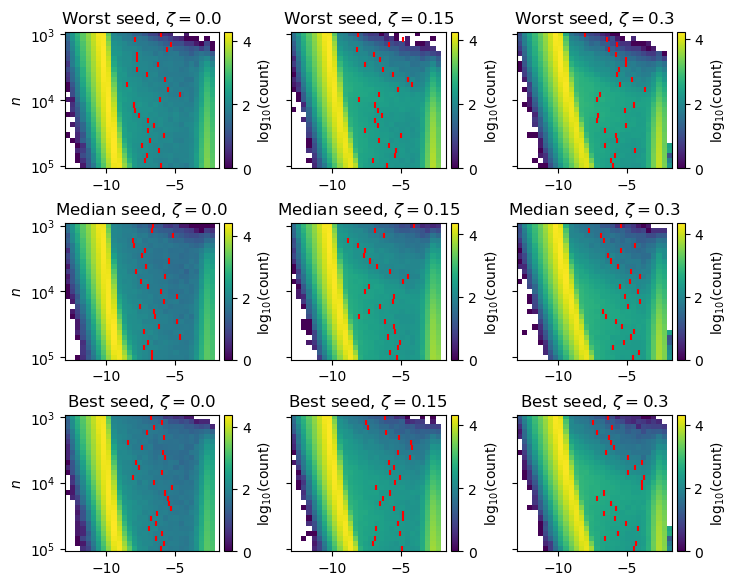

In [ ]:
fig = plt.figure(figsize=(8, 6.75))

gs = gridspec.GridSpec(3, 3, width_ratios=[1, 1, 1], height_ratios=[1, 1, 1])

axs = []
axs.append(plt.subplot(gs[0, 0]))
axs.append(plt.subplot(gs[0, 1]))
axs.append(plt.subplot(gs[0, 2]))
axs.append(plt.subplot(gs[1, 0]))
axs.append(plt.subplot(gs[1, 1]))
axs.append(plt.subplot(gs[1, 2]))
axs.append(plt.subplot(gs[2, 0]))
axs.append(plt.subplot(gs[2, 1]))
axs.append(plt.subplot(gs[2, 2]))

idx = 4
mask = mask_list[idx]

for an_i, (ax, idx, idx2, idx3) in enumerate(zip(axs, range(9), range(9), range(9))):

    post_data = rem_post_data_list[idx][26:]
    thresholds = rem_thresh_list[idx][26:]

    val_min, val_max = get_extents([l for l in post_data[::]], 10)
    print(val_min, val_max)
    val_min = -13
    val_max = -1.75

    tmp_data, bin_centers = compose_count_map([l[mask] for l in post_data], val_min, val_max, nbins=30, density=False)
    tmp_data = np.log10(tmp_data)
    # print(tmp_data.shape)
    # tmp_data = tmp_data[::13]

    cmap = ax.imshow(tmp_data, cmap='viridis', aspect='auto', extent=[val_min, val_max, -0.5, len(times[26::])-0.5], interpolation='none')

    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.05)
    cbar = plt.colorbar(cmap, cax=cax, label="$\\log_{{10}}(\\mathrm{{count}})$")

    # plot the thresholds over the imshow
    for i, t in enumerate(thresholds):
        ax.plot([t, t], [(len(thresholds)-1-i)-0.5, (len(thresholds)-1-i)+0.5], '--', color='red')

    # set the y ticks at idx 0, 13, and 26, and set the labels as 10^3, 10^4, and 10^5
    ax.set_yticks([0, 13, 26])
    ax.set_yticklabels([f"$10^{{{int(np.log10(times[26:][0]))}}}$", f"$10^{{{int(np.log10(times[26:][13]))}}}$", f"$10^{{{int(np.log10(times[26:][26]))}}}$"][::-1])
    ax.set_title(f"{title_plot_list[idx]}")
    
    ax.set_ylabel("$n$")
    # ax.set_title(title)

    if an_i != 0 and an_i != 3 and an_i != 6:
        print(an_i)
        ax.set_yticklabels([])
        ax.set_ylabel('')


# increase distance between subplots
# increase distance between subplots
plt.subplots_adjust(wspace=0.35)
plt.subplots_adjust(hspace=0.40)

plt.savefig(os.path.join(IMGDIR, f"evolution_rem.png"), bbox_inches="tight", dpi=300)

In [43]:
tune_data_list = []
tune_post_data_list = []
tune_thresh_list = []
tune_guesses_list = []

for i, ((lattice, extent), zeta) in enumerate(itertools.product(zip(lattice_list, extent_list), zeta_list)):
    tune_file = h5py.File(os.path.join(TUNEDIR, f"tune_birkhoff_full_{lattice}_{zeta}.h5"), "r")

    data_list = []
    post_data_list = []
    thresh_list = []
    guesses_list = []
    for t in times:
        tune_x_1 = 1 - (tune_file[f"tune/x/{0}/{t//2}"][:] / (np.pi*2))
        tune_x_2 = 1 - (tune_file[f"tune/x/{t//2}/{t//2*2}"][:] / (np.pi*2))
        tune_y_1 = 1 - (tune_file[f"tune/y/{0}/{t//2}"][:] / (np.pi*2))
        tune_y_2 = 1 - (tune_file[f"tune/y/{t//2}/{t//2*2}"][:] / (np.pi*2))
        disp_x = tune_x_1 - tune_x_2
        disp_y = tune_y_1 - tune_y_2

        disp = np.sqrt(disp_x**2 + disp_y**2)
        
        data_list.append(disp)

        disp[~mask_list[i]] = np.nan
        if np.count_nonzero(disp[mask_list[i]] > 0) == 0:
            disp[mask_list[i]] = 1e-14
            
        disp = np.log10(disp)
        disp[np.logical_and(mask_list[i], np.isnan(disp))] = np.nanmax(disp)
        disp[np.isinf(disp)] = np.nan
        disp[np.logical_and(mask_list[i], np.isnan(disp))] = np.nanmin(disp)

        post_data_list.append(disp)

        try:
            threshold = find_threshold_smart_v2(disp[mask_list[i]], where_chaos="higher")
        except:
            threshold = 1e-13
        thresh_list.append(threshold)

    tune_data_list.append(data_list)
    tune_post_data_list.append(post_data_list)
    tune_thresh_list.append(thresh_list)
    tune_guesses_list.append(guesses_list)


/tmp/ipykernel_33878/675978217.py:29: RuntimeWarning: divide by zero encountered in log10
  disp = np.log10(disp)
/tmp/ipykernel_33878/675978217.py:29: RuntimeWarning: divide by zero encountered in log10
  disp = np.log10(disp)
/tmp/ipykernel_33878/675978217.py:29: RuntimeWarning: divide by zero encountered in log10
  disp = np.log10(disp)
/tmp/ipykernel_33878/675978217.py:29: RuntimeWarning: divide by zero encountered in log10
  disp = np.log10(disp)
/tmp/ipykernel_33878/675978217.py:29: RuntimeWarning: divide by zero encountered in log10
  disp = np.log10(disp)
/tmp/ipykernel_33878/675978217.py:29: RuntimeWarning: divide by zero encountered in log10
  disp = np.log10(disp)
/tmp/ipykernel_33878/675978217.py:29: RuntimeWarning: divide by zero encountered in log10
  disp = np.log10(disp)
/tmp/ipykernel_33878/675978217.py:29: RuntimeWarning: divide by zero encountered in log10
  disp = np.log10(disp)
/tmp/ipykernel_33878/675978217.py:29: RuntimeWarning: divide by zero encountered in log1

-11.109659742949757 -0.01187910526236159
-14.372711008200026 -0.011890102600423462
1


/tmp/ipykernel_124986/430307796.py:30: RuntimeWarning: divide by zero encountered in log10
  tmp_data = np.log10(tmp_data)


-9.826525522780305 -0.011923756260709933
2
-15.32695351763935 -0.009532944563377811
-15.105104768022994 -0.009735229453051839
4
-14.19658665499798 -0.006508319449315744
5
-15.32695351763935 -0.00960963898363441
-15.804074772359012 -0.009662619208540398
7
-15.804074772359012 -0.009755726658672945
8


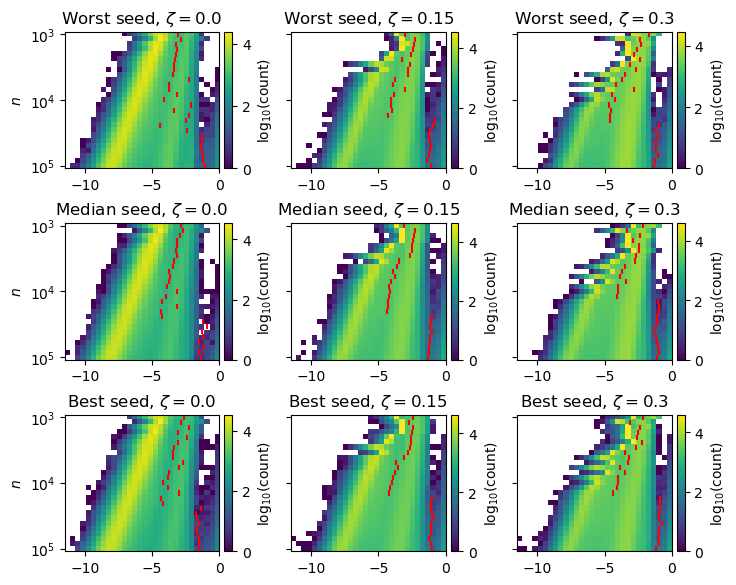

In [ ]:
fig = plt.figure(figsize=(8, 6.75))

gs = gridspec.GridSpec(3, 3, width_ratios=[1, 1, 1], height_ratios=[1, 1, 1])

axs = []
axs.append(plt.subplot(gs[0, 0]))
axs.append(plt.subplot(gs[0, 1]))
axs.append(plt.subplot(gs[0, 2]))
axs.append(plt.subplot(gs[1, 0]))
axs.append(plt.subplot(gs[1, 1]))
axs.append(plt.subplot(gs[1, 2]))
axs.append(plt.subplot(gs[2, 0]))
axs.append(plt.subplot(gs[2, 1]))
axs.append(plt.subplot(gs[2, 2]))

idx = 4
mask = mask_list[idx]

for an_i, (ax, idx, idx2, idx3) in enumerate(zip(axs, range(9), range(9), range(9))):

    post_data = tune_post_data_list[idx][26:]
    thresholds = tune_thresh_list[idx][26:]

    val_min, val_max = get_extents([l for l in post_data[::]], 10)
    print(val_min, val_max)
    val_min = -11.5
    val_max = 0.0

    tmp_data, bin_centers = compose_count_map([l[mask] for l in post_data], val_min, val_max, nbins=30, density=False)
    tmp_data = np.log10(tmp_data)
    # print(tmp_data.shape)
    # tmp_data = tmp_data[::13]

    cmap = ax.imshow(tmp_data, cmap='viridis', aspect='auto', extent=[val_min, val_max, -0.5, len(times[26::])-0.5], interpolation='none')

    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.05)
    cbar = plt.colorbar(cmap, cax=cax, label="$\\log_{{10}}(\\mathrm{{count}})$")

    # plot the thresholds over the imshow
    for i, t in enumerate(thresholds):
        ax.plot([t, t], [(len(thresholds)-1-i)-0.5, (len(thresholds)-1-i)+0.5], '--', color='red')

    # set the y ticks at idx 0, 13, and 26, and set the labels as 10^3, 10^4, and 10^5
    ax.set_yticks([0, 13, 26])
    ax.set_yticklabels([f"$10^{{{int(np.log10(times[26:][0]))}}}$", f"$10^{{{int(np.log10(times[26:][13]))}}}$", f"$10^{{{int(np.log10(times[26:][26]))}}}$"][::-1])
    

    ax.set_ylabel("$n$")
    ax.set_title(f"{title_plot_list[idx]}")

    if an_i != 0 and an_i != 3 and an_i != 6:
        print(an_i)
        ax.set_yticklabels([])
        ax.set_ylabel('')


# increase distance between subplots
# increase distance between subplots
plt.subplots_adjust(wspace=0.35)
plt.subplots_adjust(hspace=0.40)

plt.savefig(os.path.join(IMGDIR, f"evolution_tune.png"), bbox_inches="tight", dpi=300)

In [ ]:
import pickle

with open("gali_files/gali_six.pkl", 'rb') as f:
    gali_6_data_list, gali_6_post_data_list, gali_6_thresh_list, gali_6_guesses_list, gali_6_scores_list = pickle.load(f)

-37.36405243555016 -1.4136046970103326


/tmp/ipykernel_124986/2122400655.py:28: RuntimeWarning: divide by zero encountered in log10
  tmp_data = np.log10(tmp_data)


-37.51840521567655 -1.4426282045334826
1
-39.378585349591994 -2.2627295875092774
2
-37.50635037201746 -1.476084869106459
-39.56355358499837 -1.745607824879679
4
-40.48305572007269 -2.462228238590476
5
-37.43138041361405 -1.5362938173773721
-38.518353926915324 -2.1845801826732476
7
-37.644703281435284 -2.137740741342863
8


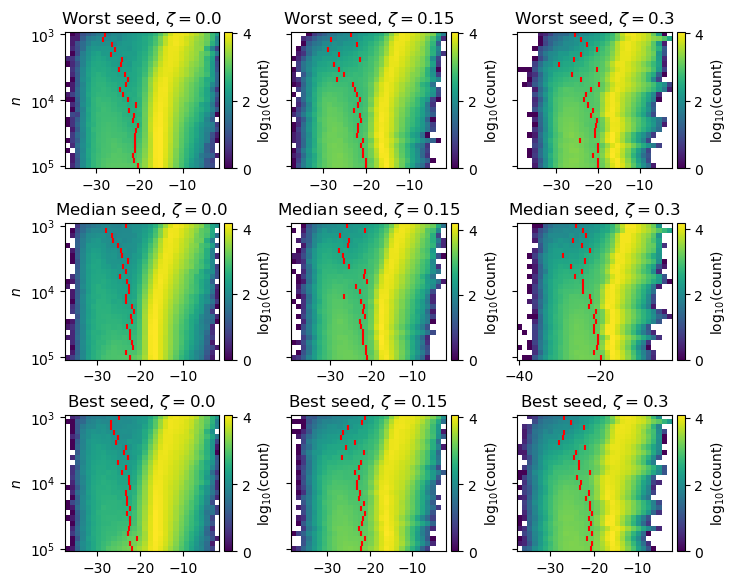

In [ ]:
fig = plt.figure(figsize=(8, 6.75))

gs = gridspec.GridSpec(3, 3, width_ratios=[1, 1, 1], height_ratios=[1, 1, 1])

axs = []
axs.append(plt.subplot(gs[0, 0]))
axs.append(plt.subplot(gs[0, 1]))
axs.append(plt.subplot(gs[0, 2]))
axs.append(plt.subplot(gs[1, 0]))
axs.append(plt.subplot(gs[1, 1]))
axs.append(plt.subplot(gs[1, 2]))
axs.append(plt.subplot(gs[2, 0]))
axs.append(plt.subplot(gs[2, 1]))
axs.append(plt.subplot(gs[2, 2]))

idx = 4
mask = mask_list[idx]

for an_i, (ax, idx, idx2, idx3) in enumerate(zip(axs, range(9), range(9), range(9))):

    post_data = gali_6_post_data_list[idx][26:]
    thresholds = gali_6_thresh_list[idx][26:]

    val_min, val_max = get_extents([l for l in post_data[::]], 10)
    print(val_min, val_max)

    tmp_data, bin_centers = compose_count_map([l[mask] for l in post_data], val_min, val_max, nbins=30, density=False)
    tmp_data = np.log10(tmp_data)
    # print(tmp_data.shape)
    # tmp_data = tmp_data[::13]

    cmap = ax.imshow(tmp_data, cmap='viridis', aspect='auto', extent=[val_min, val_max, -0.5, len(times[26::])-0.5], interpolation='none')

    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.05)
    cbar = plt.colorbar(cmap, cax=cax, label="$\\log_{{10}}(\\mathrm{{count}})$")

    # plot the thresholds over the imshow
    for i, t in enumerate(thresholds):
        ax.plot([t, t], [(len(thresholds)-1-i)-0.5, (len(thresholds)-1-i)+0.5], '--', color='red')

    # set the y ticks at idx 0, 13, and 26, and set the labels as 10^3, 10^4, and 10^5
    ax.set_yticks([0, 13, 26])
    ax.set_yticklabels([f"$10^{{{int(np.log10(times[26:][0]))}}}$", f"$10^{{{int(np.log10(times[26:][13]))}}}$", f"$10^{{{int(np.log10(times[26:][26]))}}}$"][::-1])
    

    ax.set_ylabel("$n$")
    ax.set_title(f"{title_plot_list[idx]}")

    if an_i != 0 and an_i != 3 and an_i != 6:
        print(an_i)
        ax.set_yticklabels([])
        ax.set_ylabel('')


# increase distance between subplots
# increase distance between subplots
plt.subplots_adjust(wspace=0.35)
plt.subplots_adjust(hspace=0.40)


plt.savefig(os.path.join(IMGDIR, f"evolution_gali_6.png"), bbox_inches="tight", dpi=300)

In [29]:
variables = ["x", "px", "y", "py", "zeta", "delta"]
latex_variables = ["x", "p_x", "y", "p_y", "\\zeta", "\\delta"]
gali_2_combo = list(itertools.combinations(variables, 2))
gali_4_combo = list(itertools.combinations(variables, 4))
print(len(gali_2_combo), len(gali_4_combo))

gali_2_latex = list(itertools.combinations(latex_variables, 2))
gali_4_latex = list(itertools.combinations(latex_variables, 4))

15 15


In [30]:
import pickle

with open("gali_files/gali_six.pkl", 'rb') as f:
    gali_6_data_list, gali_6_post_data_list, gali_6_thresh_list, gali_6_guesses_list, gali_6_scores_list = pickle.load(f)

6525


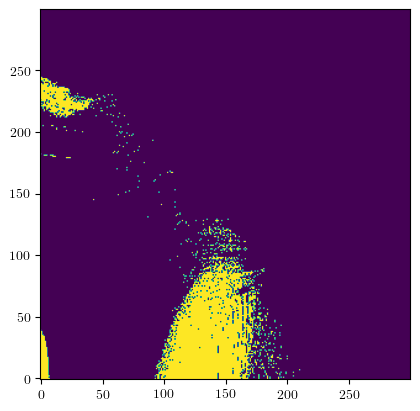

In [83]:
main_idx = 2

tmp_data = fli_x_post_data_list[main_idx][-1]
tmp_bdata = [p for p in flibk_x_post_data_list[main_idx]]

stab_mask_max = -5.2
stab_mask = np.logical_and((tmp_bdata[-1] < stab_mask_max), tmp_bdata[-1]>-14)

print(np.count_nonzero(stab_mask))
plt.imshow(stab_mask.reshape(300, 300), origin='lower')

9801


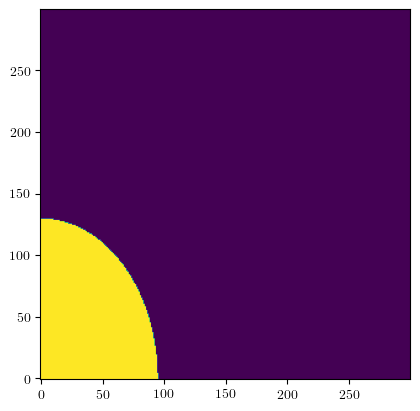

In [249]:
main_idx = 2

stab_mask_max = 2.0
stab_mask = (radius_sigma_list[main_idx] < stab_mask_max)

print(np.count_nonzero(stab_mask))
plt.imshow(stab_mask.reshape(300, 300), origin='lower')

In [250]:
import pickle

gali_combos = gali_2_combo 
latex_combos = gali_2_latex 

data_combo_2 = []
stab_list = []

for q, (combo, latex) in tqdm(enumerate(zip(gali_combos, latex_combos))):
    filename = "gali_"
    for s in combo:
        filename += s
        filename += "_"
    filename = filename[:-1] + ".pkl"
    print(filename)
    with open("gali_files/" + filename, 'rb') as f:
        gali_post_data_list, gali_thresh_list = pickle.load(f)[1:3]
    print("Loaded")

    tmp_data = gali_post_data_list[main_idx][-1]
    tmp_data2 = gali_post_data_list[main_idx][16]

    tmp_stab_mask = tmp_data2 - tmp_data < 0.5
    print(np.count_nonzero(tmp_stab_mask))
    stab_list.append(tmp_stab_mask)

    data = []
    for i, (post_data, thresh) in enumerate(zip(gali_post_data_list[main_idx], gali_thresh_list[main_idx])):
        data.append(post_data[stab_mask])

    data_combo_2.append(data)

0it [00:00, ?it/s]

gali_x_px.pkl


1it [00:01,  1.42s/it]

Loaded
9406
gali_x_y.pkl


2it [00:02,  1.29s/it]

Loaded
15626
gali_x_py.pkl


3it [00:03,  1.16s/it]

Loaded
18802
gali_x_zeta.pkl


4it [00:04,  1.08s/it]

Loaded
19669
gali_x_delta.pkl


5it [00:05,  1.08s/it]

Loaded
15875
gali_px_y.pkl


6it [00:06,  1.07s/it]

Loaded
17030
gali_px_py.pkl


7it [00:07,  1.04s/it]

Loaded
20714
gali_px_zeta.pkl


8it [00:08,  1.07s/it]

Loaded
22293
gali_px_delta.pkl


9it [00:09,  1.09s/it]

Loaded
18041
gali_y_py.pkl


10it [00:10,  1.07s/it]

Loaded
11326
gali_y_zeta.pkl


11it [00:11,  1.05s/it]

Loaded
20341
gali_y_delta.pkl


12it [00:12,  1.02s/it]

Loaded
18055
gali_py_zeta.pkl


13it [00:17,  2.12s/it]

Loaded
24868
gali_py_delta.pkl


14it [00:18,  1.76s/it]

Loaded
19989
gali_zeta_delta.pkl


15it [00:19,  1.29s/it]

Loaded
0


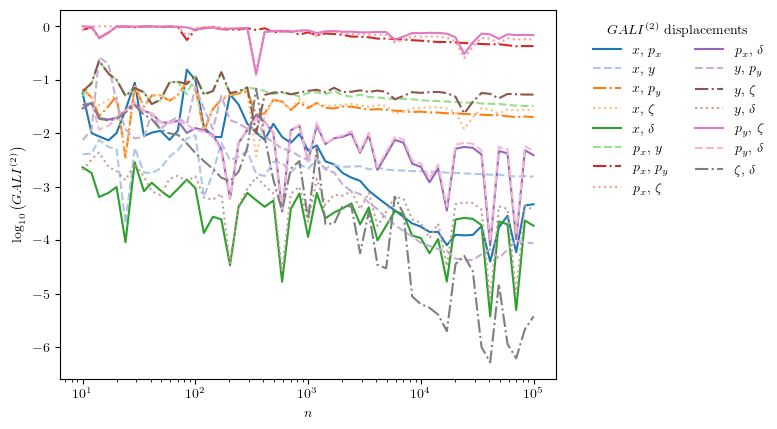

In [251]:
colors = plt.cm.tab20(np.linspace(0, 1, 20))
linestyles = ["-", "--", "-.", ":"]

for i in range(len(data_combo_2)):
    # if "\\delta" in gali_2_latex[i]:
    #     continue
    # if "\\zeta" in gali_2_latex[i]:
    #     continue
    plt.plot(times, [np.nanmean(x) for x in data_combo_2[i]], c=colors[i],
    label=f"${gali_2_latex[i][0]}$, ${gali_2_latex[i][1]}$",
    ls=linestyles[i%4])

plt.xscale("log")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', frameon=False, title="$GALI^{{(2)}}$ displacements", ncol=2)

plt.xlabel("$n$")
plt.ylabel("$\\log_{{10}}\\left(GALI^{{(2)}}\\right)$")

plt.savefig(os.path.join(IMGDIR, f"evolution_gali_2_stable.pdf"), bbox_inches="tight", dpi=300)

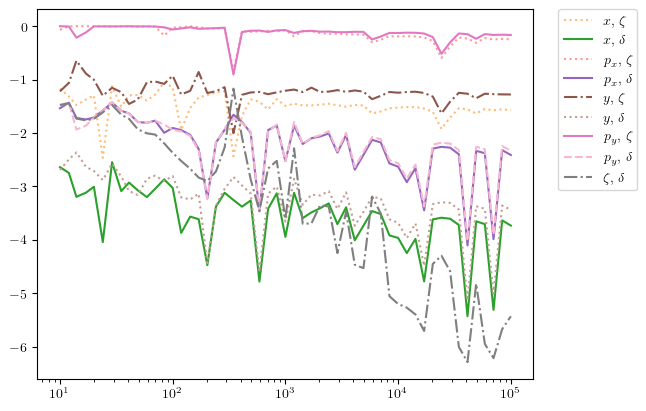

In [90]:
colors = plt.cm.tab20(np.linspace(0, 1, 20))
linestyles = ["-", "--", "-.", ":"]

for i in range(len(data_combo_2)):
    if "\\delta" not in gali_2_latex[i] and "\\zeta" not in gali_2_latex[i]:
        continue
    plt.plot(times, [np.nanmean(x) for x in data_combo_2[i]], c=colors[i],
    label=f"${gali_2_latex[i][0]}$, ${gali_2_latex[i][1]}$",
    ls=linestyles[i%4])

plt.xscale("log")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)


In [252]:
import pickle

gali_combos = gali_4_combo 
latex_combos = gali_4_latex 

data_combo_4 = []

for q, (combo, latex) in tqdm(enumerate(zip(gali_combos, latex_combos))):
    filename = "gali_"
    for s in combo:
        filename += s
        filename += "_"
    filename = filename[:-1] + ".pkl"
    print(filename)
    with open("gali_files/" + filename, 'rb') as f:
        gali_post_data_list, gali_thresh_list = pickle.load(f)[1:3]
    print("Loaded")

    data = []
    for i, (post_data, thresh) in enumerate(zip(gali_post_data_list[main_idx], gali_thresh_list[main_idx])):
        data.append(post_data[stab_mask])

    data_combo_4.append(data)

0it [00:00, ?it/s]

gali_x_px_y_py.pkl


1it [00:00,  1.12it/s]

Loaded
gali_x_px_y_zeta.pkl


2it [00:02,  1.54s/it]

Loaded
gali_x_px_y_delta.pkl


3it [00:03,  1.24s/it]

Loaded
gali_x_px_py_zeta.pkl


4it [00:04,  1.18s/it]

Loaded
gali_x_px_py_delta.pkl


5it [00:05,  1.11s/it]

Loaded
gali_x_px_zeta_delta.pkl


6it [00:06,  1.07s/it]

Loaded
gali_x_y_py_zeta.pkl


7it [00:07,  1.08s/it]

Loaded
gali_x_y_py_delta.pkl


8it [00:09,  1.09s/it]

Loaded
gali_x_y_zeta_delta.pkl


9it [00:11,  1.46s/it]

Loaded
gali_x_py_zeta_delta.pkl


10it [00:12,  1.35s/it]

Loaded
gali_px_y_py_zeta.pkl


11it [00:13,  1.27s/it]

Loaded
gali_px_y_py_delta.pkl


12it [00:14,  1.17s/it]

Loaded
gali_px_y_zeta_delta.pkl


13it [00:15,  1.16s/it]

Loaded
gali_px_py_zeta_delta.pkl


14it [00:16,  1.13s/it]

Loaded
gali_y_py_zeta_delta.pkl


15it [00:17,  1.18s/it]

Loaded


In [253]:
def resid_simple_fit(params, x, data=None):
    a = params["a"].value
    k = params["k"].value

    model = a + -k*np.log10(x)

    if data is None:
        return model
    else:
        return model - data

In [94]:
print(times[13])
print(times[-14])

100
10000


100%|██████████| 15/15 [00:00<00:00, 90.79it/s]


a 2.7089756889253978 k 2.5890265013422935
a 0.06653178374927476 k 1.2566231599116753
a -1.4164010264426181 k 1.4721906104000846
a 1.1509503213027263 k 1.2479373014974933
a -0.3319065772442963 k 1.463522666289042
a 1.9798714671685178 k 2.57286613030206
a 0.22051812031106965 k 1.4442575473130315
a -1.2623494166280502 k 1.6598749816227039
a -1.4786907827920994 k 1.4699325250026105
a -0.38820824804426085 k 1.463001764619488
a 1.711071349741323 k 1.4861830828201126
a 0.23085858968708833 k 1.702772210742833
a 0.007347922272542447 k 1.5104467449321755
a 1.0888807582560245 k 1.5007510608004424
a 1.7574042012230884 k 2.515731318571308


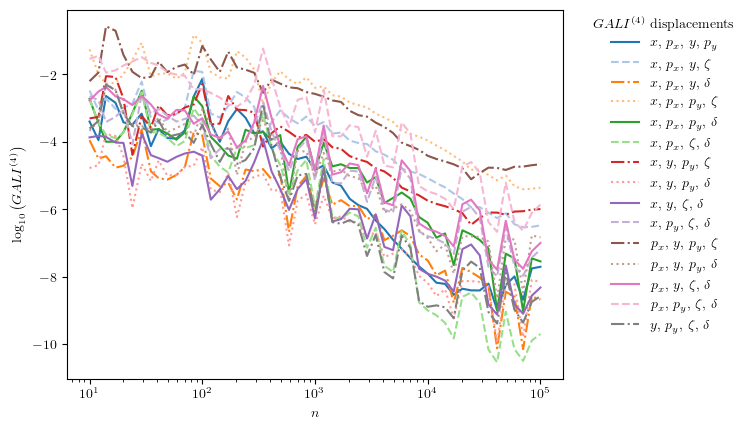

In [254]:

fit_gali4_list = []
# get colormap tab20


colors = plt.cm.tab20(np.linspace(0, 1, 20))
linestyles = ["-", "--", "-.", ":"]
for i in tqdm(range(len(data_combo_4))):
    mean = [np.nanmean(x) for x in data_combo_4[i]]

    params = lmfit.Parameters()
    params.add("a", value=0.0)
    params.add("k", value=1.0)

    out = lmfit.minimize(resid_simple_fit, params, args=(times[13:-10], mean[13:-10]))
    fit_gali4_list.append(out)
    print("a", out.params["a"].value, "k", out.params["k"].value)
    plt.plot(times, mean, c=colors[i],
    label=f"${gali_4_latex[i][0]}$, ${gali_4_latex[i][1]}$, ${gali_4_latex[i][2]}$, ${gali_4_latex[i][3]}$",
    ls=linestyles[i%4])
    # plt.plot(times[13:-10], resid_simple_fit(out.params, times)[13:-10], c="grey", ls=linestyles[i%4])

plt.xscale("log")

# add legend outside of the plot on the right
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0., title="$GALI^{{(4)}}$ displacements", frameon=False)
plt.xlabel("$n$")
plt.ylabel("$\\log_{{10}}\\left(GALI^{{(4)}}\\right)$")

plt.savefig(os.path.join(IMGDIR, f"evolution_gali_4_stable.pdf"), bbox_inches="tight", dpi=300)

In [178]:
gali_fit_score = [(n, s, err) for n, s, err in zip(
    gali_4_latex,
    [out.params["k"].value for out in fit_gali4_list],
    [out.params["k"].stderr for out in fit_gali4_list])]

gali_fit_score.sort(key=lambda x: x[1])
gali_fit_score

[(('x', 'p_x', 'p_y', '\\zeta'), 1.2479373014974933, 0.08587645772576924),
 (('x', 'p_x', 'y', '\\zeta'), 1.2566231599116753, 0.08702285898212808),
 (('x', 'y', 'p_y', '\\zeta'), 1.4442575473130315, 0.07670297492002345),
 (('x', 'p_y', '\\zeta', '\\delta'), 1.463001764619488, 0.17524570774415354),
 (('x', 'p_x', 'p_y', '\\delta'), 1.463522666289042, 0.1461734948478663),
 (('x', 'y', '\\zeta', '\\delta'), 1.4699325250026105, 0.1764215591246704),
 (('x', 'p_x', 'y', '\\delta'), 1.4721906104000846, 0.14812858297929687),
 (('p_x', 'y', 'p_y', '\\zeta'), 1.4861830828201126, 0.05111832763618298),
 (('p_x', 'p_y', '\\zeta', '\\delta'),
  1.5007510608004424,
  0.17444271769055805),
 (('p_x', 'y', '\\zeta', '\\delta'), 1.5104467449321755, 0.17316800852965944),
 (('x', 'y', 'p_y', '\\delta'), 1.6598749816227039, 0.14442469460068177),
 (('p_x', 'y', 'p_y', '\\delta'), 1.702772210742833, 0.14212301091865553),
 (('y', 'p_y', '\\zeta', '\\delta'), 2.515731318571308, 0.17538216463480732),
 (('x', 'p_

In [182]:
for s in gali_fit_score:
    for var in s[0]:
        print(f"$\\hat{{{var}}}$,", end=" ")
    print("& ", end="")
    print(f'${ufloat(s[1], s[2]):.L}$ &', end=" ")
    print(f'${2-s[1]:.2f}$ \\\\')

$\hat{x}$, $\hat{p_x}$, $\hat{p_y}$, $\hat{\zeta}$, & $1.25 \pm 0.09$ & $0.75$ \\
$\hat{x}$, $\hat{p_x}$, $\hat{y}$, $\hat{\zeta}$, & $1.26 \pm 0.09$ & $0.74$ \\
$\hat{x}$, $\hat{y}$, $\hat{p_y}$, $\hat{\zeta}$, & $1.44 \pm 0.08$ & $0.56$ \\
$\hat{x}$, $\hat{p_y}$, $\hat{\zeta}$, $\hat{\delta}$, & $1.46 \pm 0.18$ & $0.54$ \\
$\hat{x}$, $\hat{p_x}$, $\hat{p_y}$, $\hat{\delta}$, & $1.46 \pm 0.15$ & $0.54$ \\
$\hat{x}$, $\hat{y}$, $\hat{\zeta}$, $\hat{\delta}$, & $1.47 \pm 0.18$ & $0.53$ \\
$\hat{x}$, $\hat{p_x}$, $\hat{y}$, $\hat{\delta}$, & $1.47 \pm 0.15$ & $0.53$ \\
$\hat{p_x}$, $\hat{y}$, $\hat{p_y}$, $\hat{\zeta}$, & $1.49 \pm 0.05$ & $0.51$ \\
$\hat{p_x}$, $\hat{p_y}$, $\hat{\zeta}$, $\hat{\delta}$, & $1.50 \pm 0.17$ & $0.50$ \\
$\hat{p_x}$, $\hat{y}$, $\hat{\zeta}$, $\hat{\delta}$, & $1.51 \pm 0.17$ & $0.49$ \\
$\hat{x}$, $\hat{y}$, $\hat{p_y}$, $\hat{\delta}$, & $1.66 \pm 0.14$ & $0.34$ \\
$\hat{p_x}$, $\hat{y}$, $\hat{p_y}$, $\hat{\delta}$, & $1.70 \pm 0.14$ & $0.30$ \\
$\hat{y}

In [21]:
import pickle

with open("gali_files/gali_six.pkl", 'rb') as f:
    gali_6_data_list, gali_6_post_data_list, gali_6_thresh_list, gali_6_guesses_list, gali_6_scores_list = pickle.load(f)

In [197]:
data_combo_6 = []

for i, (post_data, thresh) in enumerate(zip(gali_6_post_data_list[main_idx], gali_6_thresh_list[main_idx])):
    data_combo_6.append(post_data[stab_mask])


100%|██████████| 15/15 [00:00<00:00, 109.07it/s]


a 2.7089756889253978 k 2.5890265013422935
a 0.06653178374927476 k 1.2566231599116753
a -1.4164010264426181 k 1.4721906104000846
a 1.1509503213027263 k 1.2479373014974933
a -0.3319065772442963 k 1.463522666289042
a 1.9798714671685178 k 2.57286613030206
a 0.22051812031106965 k 1.4442575473130315
a -1.2623494166280502 k 1.6598749816227039
a -1.4786907827920994 k 1.4699325250026105
a -0.38820824804426085 k 1.463001764619488
a 1.711071349741323 k 1.4861830828201126
a 0.23085858968708833 k 1.702772210742833
a 0.007347922272542447 k 1.5104467449321755
a 1.0888807582560245 k 1.5007510608004424
a 1.7574042012230884 k 2.515731318571308
k 4.029332408042194 0.23673744257545895


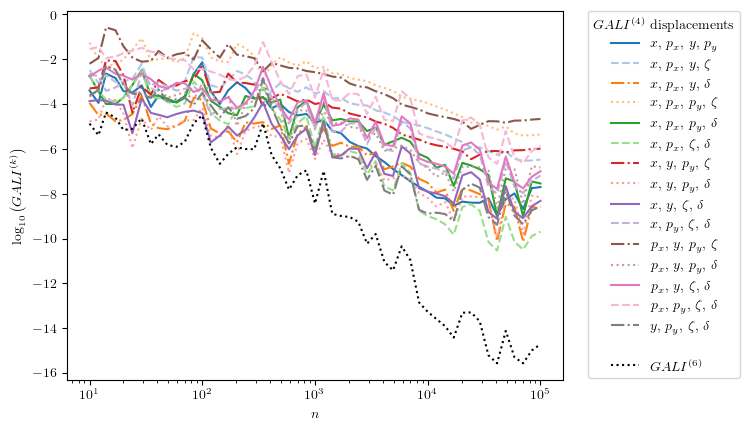

In [203]:

fit_gali4_list = []
# get colormap tab20


colors = plt.cm.tab20(np.linspace(0, 1, 20))
linestyles = ["-", "--", "-.", ":"]
for i in tqdm(range(len(data_combo_4))):
    mean = [np.nanmean(x) for x in data_combo_4[i]]

    params = lmfit.Parameters()
    params.add("a", value=0.0)
    params.add("k", value=1.0)

    out = lmfit.minimize(resid_simple_fit, params, args=(times[13:-10], mean[13:-10]))
    fit_gali4_list.append(out)
    print("a", out.params["a"].value, "k", out.params["k"].value)
    plt.plot(times, mean, c=colors[i],
    label=f"${gali_4_latex[i][0]}$, ${gali_4_latex[i][1]}$, ${gali_4_latex[i][2]}$, ${gali_4_latex[i][3]}$",
    ls=linestyles[i%4])
    # plt.plot(times[13:-10], resid_simple_fit(out.params, times)[13:-10], c="grey", ls=linestyles[i%4])

plt.plot([], [], c="white", label=" ")
plt.plot(times, [np.nanmean(x) for x in data_combo_6], c="black", linestyle="dotted", label="$GALI^{{(6)}}$")


params = lmfit.Parameters()
params.add("a", value=0.0)
params.add("k", value=1.0)

out = lmfit.minimize(resid_simple_fit, params, args=(times[13:-10], [np.nanmean(x) for x in data_combo_6][13:-10]))

print("k", out.params["k"].value, out.params["k"].stderr)

plt.xscale("log")

# add legend outside of the plot on the right
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0., title="$GALI^{{(4)}}$ displacements")
plt.xlabel("$n$")
plt.ylabel("$\\log_{{10}}\\left(GALI^{{(k)}}\\right)$")

plt.savefig(os.path.join(IMGDIR, f"evolution_gali_4_stable.pdf"), bbox_inches="tight", dpi=300)

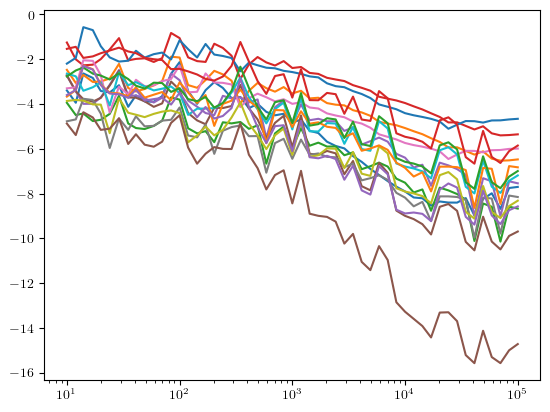

In [198]:
for i in range(len(data_combo_4)):
    plt.plot(times, [np.nanmean(x) for x in data_combo_4[i]])

plt.plot(times, [np.nanmean(x) for x in data_combo_6])

plt.xscale("log")

2454


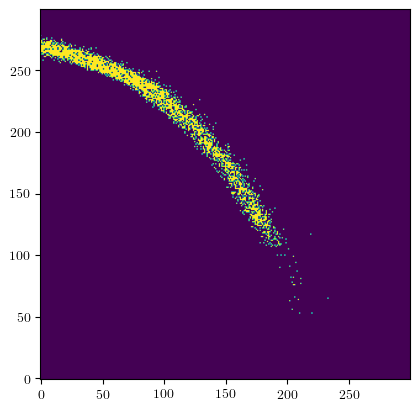

In [31]:
main_idx = 2

tmp_data = fli_x_post_data_list[main_idx][-1]
tmp_bdata = [p for p in flibk_x_post_data_list[main_idx]]

stab_mask_max = -3.0
stab_mask = np.logical_and((tmp_bdata[-1] > stab_mask_max), tmp_bdata[-1]>-14)

print(np.count_nonzero(stab_mask))
plt.imshow(stab_mask.reshape(300, 300), origin='lower')

In [43]:
import pickle

gali_combos = gali_2_combo 
latex_combos = gali_2_latex 

data_combo_2 = []
mean_combo_2 = []
stab_list = []

for q, (combo, latex) in tqdm(enumerate(zip(gali_combos, latex_combos))):
    filename = "gali_"
    for s in combo:
        filename += s
        filename += "_"
    filename = filename[:-1] + ".pkl"
    print(filename)
    with open("gali_files/" + filename, 'rb') as f:
        gali_post_data_list, gali_thresh_list = pickle.load(f)[1:3]
    print("Loaded")

    tmp_data = gali_post_data_list[main_idx][-1]
    tmp_data2 = gali_post_data_list[main_idx][16]

    tmp_stab_mask = tmp_data2 - tmp_data < 0.5
    print(np.count_nonzero(tmp_stab_mask))
    stab_list.append(tmp_stab_mask)

    data = []
    for i, (post_data, thresh) in enumerate(zip(gali_post_data_list[main_idx], gali_thresh_list[main_idx])):
        data.append(post_data[stab_mask])

    data_combo_2.append(data)
    mean_combo_2.append([np.nanmean(x) for x in data])

0it [00:00, ?it/s]

gali_x_px.pkl


1it [00:01,  1.24s/it]

Loaded
9406
gali_x_y.pkl


2it [00:02,  1.18s/it]

Loaded
15626
gali_x_py.pkl


3it [00:03,  1.15s/it]

Loaded
18802
gali_x_zeta.pkl


4it [00:04,  1.13s/it]

Loaded
19669
gali_x_delta.pkl


5it [00:05,  1.12s/it]

Loaded
15875
gali_px_y.pkl


6it [00:06,  1.13s/it]

Loaded
17030
gali_px_py.pkl


7it [00:07,  1.11s/it]

Loaded
20714
gali_px_zeta.pkl


8it [00:09,  1.13s/it]

Loaded
22293
gali_px_delta.pkl


9it [00:10,  1.16s/it]

Loaded
18041
gali_y_py.pkl


10it [00:11,  1.20s/it]

Loaded
11326
gali_y_zeta.pkl


11it [00:12,  1.18s/it]

Loaded
20341
gali_y_delta.pkl


12it [00:13,  1.15s/it]

Loaded
18055
gali_py_zeta.pkl


13it [00:14,  1.15s/it]

Loaded
24868
gali_py_delta.pkl


14it [00:16,  1.15s/it]

Loaded
19989
gali_zeta_delta.pkl


15it [00:17,  1.15s/it]

Loaded
0


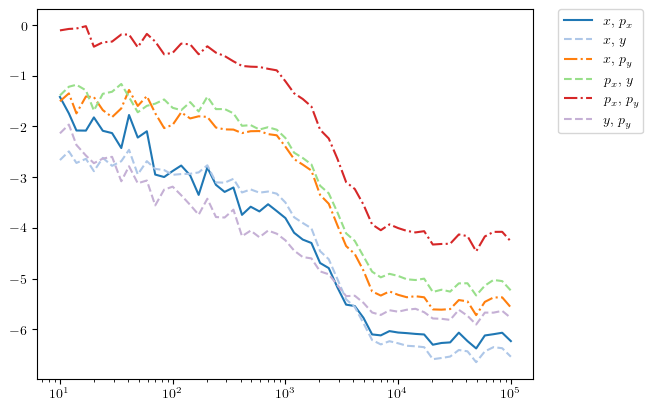

In [206]:
colors = plt.cm.tab20(np.linspace(0, 1, 20))
linestyles = ["-", "--", "-.", ":"]

for i in range(len(data_combo_2)):
    if "\\delta" in gali_2_latex[i]:
        continue
    if "\\zeta" in gali_2_latex[i]:
        continue
    plt.plot(times, [np.nanmean(x) for x in data_combo_2[i]], c=colors[i],
    label=f"${gali_2_latex[i][0]}$, ${gali_2_latex[i][1]}$",
    ls=linestyles[i%4])

plt.xscale("log")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)


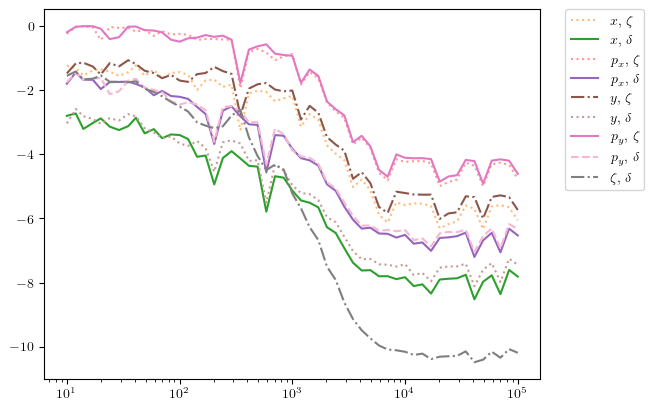

In [207]:
colors = plt.cm.tab20(np.linspace(0, 1, 20))
linestyles = ["-", "--", "-.", ":"]

for i in range(len(data_combo_2)):
    if "\\delta" not in gali_2_latex[i] and "\\zeta" not in gali_2_latex[i]:
        continue
    plt.plot(times, [np.nanmean(x) for x in data_combo_2[i]], c=colors[i],
    label=f"${gali_2_latex[i][0]}$, ${gali_2_latex[i][1]}$",
    ls=linestyles[i%4])

plt.xscale("log")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)


In [44]:
import pickle

gali_combos = gali_4_combo 
latex_combos = gali_4_latex 

data_combo_4 = []
mean_combo_4 = []

for q, (combo, latex) in tqdm(enumerate(zip(gali_combos, latex_combos))):
    filename = "gali_"
    for s in combo:
        filename += s
        filename += "_"
    filename = filename[:-1] + ".pkl"
    print(filename)
    with open("gali_files/" + filename, 'rb') as f:
        gali_post_data_list, gali_thresh_list = pickle.load(f)[1:3]
    print("Loaded")

    data = []
    for i, (post_data, thresh) in enumerate(zip(gali_post_data_list[main_idx], gali_thresh_list[main_idx])):
        data.append(post_data[stab_mask])

    data_combo_4.append(data)
    mean_combo_4.append([np.nanmean(x) for x in data])

0it [00:00, ?it/s]

gali_x_px_y_py.pkl


1it [00:01,  1.23s/it]

Loaded
gali_x_px_y_zeta.pkl


2it [00:02,  1.18s/it]

Loaded
gali_x_px_y_delta.pkl


3it [00:03,  1.16s/it]

Loaded
gali_x_px_py_zeta.pkl


4it [00:04,  1.18s/it]

Loaded
gali_x_px_py_delta.pkl


5it [00:05,  1.16s/it]

Loaded
gali_x_px_zeta_delta.pkl


6it [00:07,  1.22s/it]

Loaded
gali_x_y_py_zeta.pkl


7it [00:08,  1.23s/it]

Loaded
gali_x_y_py_delta.pkl


8it [00:09,  1.22s/it]

Loaded
gali_x_y_zeta_delta.pkl


9it [00:10,  1.20s/it]

Loaded
gali_x_py_zeta_delta.pkl


10it [00:11,  1.20s/it]

Loaded
gali_px_y_py_zeta.pkl


11it [00:13,  1.18s/it]

Loaded
gali_px_y_py_delta.pkl


12it [00:14,  1.18s/it]

Loaded
gali_px_y_zeta_delta.pkl


13it [00:15,  1.18s/it]

Loaded
gali_px_py_zeta_delta.pkl


14it [00:16,  1.18s/it]

Loaded
gali_y_py_zeta_delta.pkl


15it [00:17,  1.18s/it]

Loaded


In [45]:
data_combo_6 = []
mean_combo_6 = []

for i, (post_data, thresh) in enumerate(zip(gali_6_post_data_list[main_idx], gali_6_thresh_list[main_idx])):
    data_combo_6.append(post_data[stab_mask])
    mean_combo_6.append(np.nanmean(post_data[stab_mask]))


In [141]:
plt.plot([x[-1] for x in (data_combo_4[i])])

IndexError: list index out of range

100%|██████████| 15/15 [00:00<00:00, 128.42it/s]


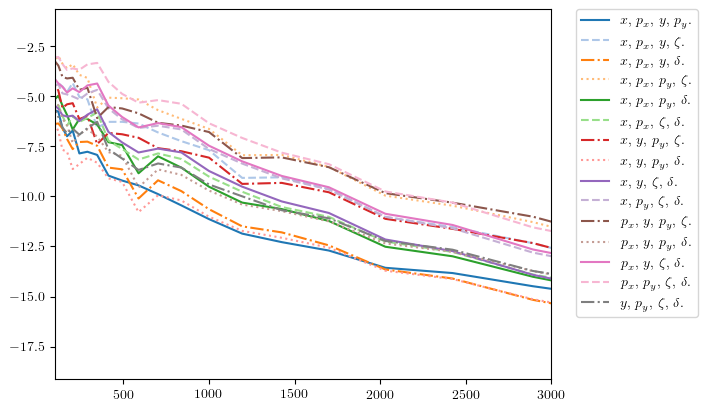

In [210]:
colors = plt.cm.tab20(np.linspace(0, 1, 20))
linestyles = ["-", "--", "-.", ":"]
for i in tqdm(range(len(data_combo_4))):
    tmp_data = data_combo_4[i]
    mask = tmp_data[-1] > -19

    mean = [np.nanmean(x[mask]) for x in data_combo_4[i]]
    # mean = [x[199] for x in (data_combo_4[i])]

    plt.plot(times, mean, c=colors[i],
    label=f"${gali_4_latex[i][0]}$, ${gali_4_latex[i][1]}$, ${gali_4_latex[i][2]}$, ${gali_4_latex[i][3]}$.",
    ls=linestyles[i%4])

# plt.xscale("log")
plt.xlim(1e2,3e3)

# add legend outside of the plot on the right
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)

100%|██████████| 15/15 [00:00<00:00, 146.92it/s]


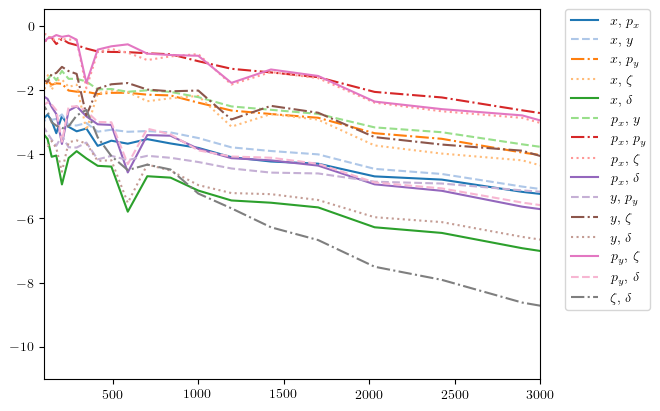

In [210]:
colors = plt.cm.tab20(np.linspace(0, 1, 20))
linestyles = ["-", "--", "-.", ":"]
for i in tqdm(range(len(data_combo_4))):
    tmp_data = data_combo_2[i]
    mask = tmp_data[-1] > -19

    mean = [np.nanmean(x[mask]) for x in data_combo_2[i]]
    # mean = [x[199] for x in (data_combo_4[i])]

    plt.plot(times, mean, c=colors[i],
    label=f"${gali_2_latex[i][0]}$, ${gali_2_latex[i][1]}$",
    ls=linestyles[i%4])

# plt.xscale("log")
plt.xlim(1e2,3e3)

# add legend outside of the plot on the right
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)

100%|██████████| 15/15 [00:00<00:00, 167.42it/s]


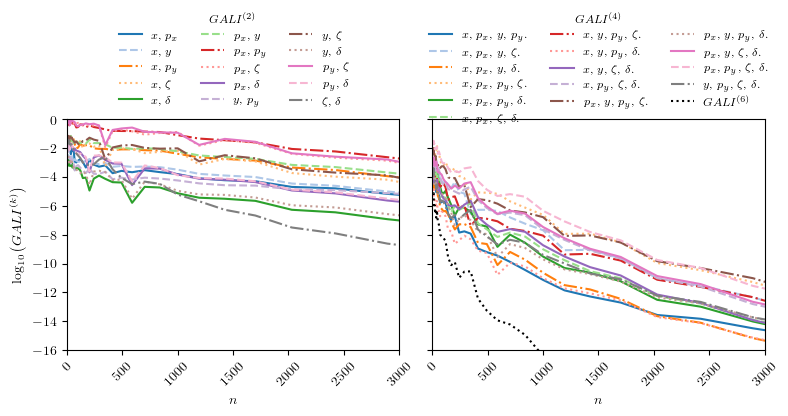

In [212]:
fig, axs = plt.subplots(1, 2, figsize=(9, 3), sharey=True)

colors = plt.cm.tab20(np.linspace(0, 1, 20))
linestyles = ["-", "--", "-.", ":"]
for i in tqdm(range(len(data_combo_4))):
    tmp_data = data_combo_4[i]
    mask = tmp_data[-1] > -19

    mean = [np.nanmean(x[mask]) for x in data_combo_4[i]]
    # mean = [x[199] for x in (data_combo_4[i])]

    axs[1].plot(times, mean, c=colors[i],
    label=f"${gali_4_latex[i][0]}$, ${gali_4_latex[i][1]}$, ${gali_4_latex[i][2]}$, ${gali_4_latex[i][3]}$.",
    ls=linestyles[i%4])

# plt.xscale("log")
axs[1].set_xlim(0,3e3)

for i in tqdm(range(len(data_combo_4))):
    tmp_data = data_combo_2[i]
    mask = tmp_data[-1] > -19

    mean = [np.nanmean(x[mask]) for x in data_combo_2[i]]
    # mean = [x[199] for x in (data_combo_4[i])]

    axs[0].plot(times, mean, c=colors[i],
    label=f"${gali_2_latex[i][0]}$, ${gali_2_latex[i][1]}$",
    ls=linestyles[i%4])

axs[1].plot(times, [np.nanmean(x) for x in data_combo_6], c="black", linestyle="dotted", label="$GALI^{{(6)}}$")

# plt.xscale("log")
axs[0].set_xlim(0,3e3)

# add legend outside of the plot on the top center of the axes
axs[0].legend(bbox_to_anchor=(0.5, 1.5), loc='upper center', ncol=3, fontsize="small", title="$GALI^{{(2)}}$", title_fontsize="small", frameon=False)
axs[1].legend(bbox_to_anchor=(0.5, 1.5), loc='upper center', ncol=3, fontsize="small", title="$GALI^{{(4)}}$", title_fontsize="small", frameon=False)

axs[0].set_ylim(-16, 0)
axs[0].set_ylabel("log$_{10}\\left(GALI^{(k)}\\right)$")
axs[0].set_xlabel("$n$")
axs[1].set_xlabel("$n$")
# rotate xlabels by 30 degrees
for ax in axs:
    for item in ax.get_xticklabels():
        item.set_rotation(45)

# put the 2 plots closer
fig.subplots_adjust(wspace=0.1)

plt.savefig(os.path.join(IMGDIR, "gali_2_4_chaos.pdf"), bbox_inches="tight", dpi=600)

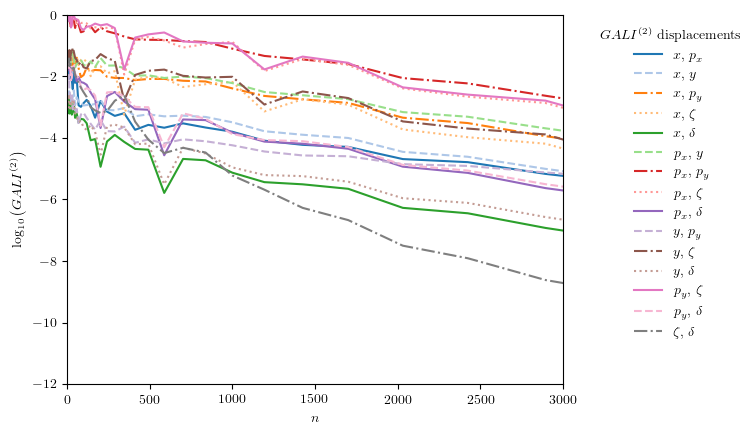

In [62]:
colors = plt.cm.tab20(np.linspace(0, 1, 20))
linestyles = ["-", "--", "-.", ":"]

for i in range(len(data_combo_2)):
    # if "\\delta" in gali_2_latex[i]:
    #     continue
    # if "\\zeta" in gali_2_latex[i]:
    #     continue
    plt.plot(times, [np.nanmean(x) for x in data_combo_2[i]], c=colors[i],
    label=f"${gali_2_latex[i][0]}$, ${gali_2_latex[i][1]}$",
    ls=linestyles[i%4])

# add legend outside of the plot on the right
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', frameon=False, title="$GALI^{{(2)}}$ displacements")
plt.ylim(-12, 0)
plt.ylabel("log$_{10}\\left(GALI^{(2)}\\right)$")
plt.xlabel("$n$")
plt.xlabel("$n$")
plt.xlim(0,3e3)

plt.savefig(os.path.join(IMGDIR, f"evolution_gali_2_chaos.pdf"), bbox_inches="tight", dpi=300)

100%|██████████| 15/15 [00:00<00:00, 318.75it/s]


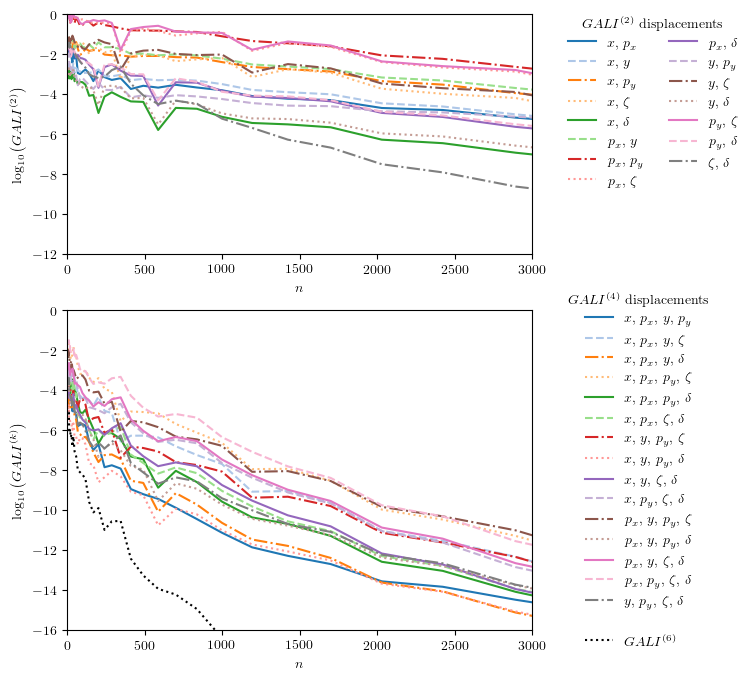

In [68]:
colors = plt.cm.tab20(np.linspace(0, 1, 20))
linestyles = ["-", "--", "-.", ":"]

fig = plt.figure(figsize=(6,8))

# add gridspec
gs = fig.add_gridspec(2, 1, height_ratios=[12, 16])

ax0 = fig.add_subplot(gs[0])
ax1 = fig.add_subplot(gs[1])

for i in range(len(data_combo_2)):
    # if "\\delta" in gali_2_latex[i]:
    #     continue
    # if "\\zeta" in gali_2_latex[i]:
    #     continue
    ax0.plot(times, [np.nanmean(x) for x in data_combo_2[i]], c=colors[i],
    label=f"${gali_2_latex[i][0]}$, ${gali_2_latex[i][1]}$",
    ls=linestyles[i%4])

# add legend outside of the plot on the right
ax0.legend(bbox_to_anchor=(1.05, 1.05), loc='upper left', frameon=False, title="$GALI^{{(2)}}$ displacements", ncol=2)
ax0.set_ylim(-12, 0)
ax0.set_ylabel("log$_{10}\\left(GALI^{(2)}\\right)$")
ax0.set_xlabel("$n$")
ax0.set_xlabel("$n$")
ax0.set_xlim(0,3e3)

for i in tqdm(range(len(data_combo_4))):
    mean = [np.nanmean(x) for x in data_combo_4[i]]

    ax1.plot(times, mean, c=colors[i],
    label=f"${gali_4_latex[i][0]}$, ${gali_4_latex[i][1]}$, ${gali_4_latex[i][2]}$, ${gali_4_latex[i][3]}$",
    ls=linestyles[i%4])

ax1.plot([], [], c="white", label=" ")
ax1.plot(times, [np.nanmean(x) for x in data_combo_6], c="black", linestyle="dotted", label="$GALI^{{(6)}}$")


# add legend outside of the plot on the right
ax1.legend(bbox_to_anchor=(1.05, 1.1), loc='upper left', frameon=False, title="$GALI^{{(4)}}$ displacements")
ax1.set_ylim(-16, 0)
ax1.set_ylabel("log$_{10}\\left(GALI^{(k)}\\right)$")
ax1.set_xlabel("$n$")
ax1.set_xlabel("$n$")
ax1.set_xlim(0,3e3)


plt.savefig(os.path.join(IMGDIR, f"evolution_gali_4_chaos.pdf"), bbox_inches="tight", dpi=300)

In [48]:
import lmfit
def chaos_simple_fit(params, x, data=None):
    a = params["a"].value
    k = params["k"].value

    model = a + -k*x

    if data is None:
        return model
    else:
        return model - data

In [54]:
fit_combo_2 = []

for data in tqdm(mean_combo_2):
    params = lmfit.Parameters()
    params.add("a", value=0.0)
    params.add("k", value=1.0)
    fit_combo_2.append(lmfit.minimize(chaos_simple_fit, params, args=(times[:31], data[:31]), method="leastsq"))

fit_combo_4 = []

for data in tqdm(mean_combo_4):
    params = lmfit.Parameters()
    params.add("a", value=0.0)
    params.add("k", value=1.0)
    fit_combo_4.append(lmfit.minimize(chaos_simple_fit, params, args=(times[:31], data[:31]), method="leastsq"))

fit_combo_6 = lmfit.minimize(chaos_simple_fit, params, args=(times[:31], mean_combo_6[:31]), method="leastsq")


100%|██████████| 15/15 [00:00<00:00, 73.14it/s]


In [93]:
from uncertainties import ufloat
gali_fit_score = [(n, s, err) for n, s, err in zip(
    gali_4_latex,
    [out.params["k"].value for out in fit_combo_4],
    [out.params["k"].stderr for out in fit_combo_4])]

gali_fit_score.sort(key=lambda x: x[1])
gali_fit_score

[(('x', 'y', 'p_y', '\\zeta'), 0.0036784675143168868, 0.00022185699190242677),
 (('p_x', 'y', 'p_y', '\\zeta'),
  0.0036835240920028833,
  0.00021393145397868727),
 (('x', 'p_y', '\\zeta', '\\delta'),
  0.003868976667188895,
  0.00016506430204606636),
 (('x', 'y', '\\zeta', '\\delta'),
  0.003883627686884994,
  0.00015667366391080312),
 (('p_x', 'y', '\\zeta', '\\delta'),
  0.003907932049053819,
  0.0001572912251059298),
 (('p_x', 'p_y', '\\zeta', '\\delta'),
  0.003911431562102274,
  0.00015763476454325903),
 (('x', 'p_x', 'y', '\\zeta'), 0.003984364527666154, 0.00020043039392393693),
 (('x', 'p_x', 'p_y', '\\zeta'), 0.004030621136646206, 0.00020424037134300036),
 (('y', 'p_y', '\\zeta', '\\delta'),
  0.004049516308600842,
  0.0002747069232490949),
 (('x', 'y', 'p_y', '\\delta'), 0.004276463667975415, 0.00029876300180934706),
 (('p_x', 'y', 'p_y', '\\delta'),
  0.0042790268677396215,
  0.00029247797635964106),
 (('x', 'p_x', '\\zeta', '\\delta'),
  0.0043699387859627015,
  0.000275276

In [94]:
for s in gali_fit_score:
    for var in s[0]:
        print(f"$\\hat{{{var}}}$,", end=" ")
    print("& ", end="")
    print(f'${ufloat(s[1], s[2]):.L}$ \\\\')
    # print(f'${s[1]/4:.2}$ \\\\')

$\hat{x}$, $\hat{y}$, $\hat{p_y}$, $\hat{\zeta}$, & $0.00368 \pm 0.00022$ \\
$\hat{p_x}$, $\hat{y}$, $\hat{p_y}$, $\hat{\zeta}$, & $0.00368 \pm 0.00021$ \\
$\hat{x}$, $\hat{p_y}$, $\hat{\zeta}$, $\hat{\delta}$, & $0.00387 \pm 0.00017$ \\
$\hat{x}$, $\hat{y}$, $\hat{\zeta}$, $\hat{\delta}$, & $0.00388 \pm 0.00016$ \\
$\hat{p_x}$, $\hat{y}$, $\hat{\zeta}$, $\hat{\delta}$, & $0.00391 \pm 0.00016$ \\
$\hat{p_x}$, $\hat{p_y}$, $\hat{\zeta}$, $\hat{\delta}$, & $0.00391 \pm 0.00016$ \\
$\hat{x}$, $\hat{p_x}$, $\hat{y}$, $\hat{\zeta}$, & $0.00398 \pm 0.00020$ \\
$\hat{x}$, $\hat{p_x}$, $\hat{p_y}$, $\hat{\zeta}$, & $0.00403 \pm 0.00020$ \\
$\hat{y}$, $\hat{p_y}$, $\hat{\zeta}$, $\hat{\delta}$, & $0.00405 \pm 0.00027$ \\
$\hat{x}$, $\hat{y}$, $\hat{p_y}$, $\hat{\delta}$, & $0.00428 \pm 0.00030$ \\
$\hat{p_x}$, $\hat{y}$, $\hat{p_y}$, $\hat{\delta}$, & $0.00428 \pm 0.00029$ \\
$\hat{x}$, $\hat{p_x}$, $\hat{\zeta}$, $\hat{\delta}$, & $0.00437 \pm 0.00028$ \\
$\hat{x}$, $\hat{p_x}$, $\hat{y}$, $\h

In [79]:
from uncertainties import ufloat
gali_fit_score = [(n, s, err) for n, s, err in zip(
    gali_2_latex,
    [out.params["k"].value for out in fit_combo_2],
    [out.params["k"].stderr for out in fit_combo_2])]

gali_fit_score.sort(key=lambda x: x[1])
gali_fit_score

[(('x', 'p_y'), 0.0008163047292005787, 5.7531669548392615e-05),
 (('x', 'y'), 0.0008299585612370208, 4.30749910787551e-05),
 (('p_x', 'y'), 0.0008559897550792783, 4.836632527037053e-05),
 (('p_x', 'p_y'), 0.0008635759263954221, 4.4647019323954534e-05),
 (('y', '\\zeta'), 0.0009489232302887229, 9.608666005867184e-05),
 (('p_y', '\\zeta'), 0.000977272998072154, 9.713214896456738e-05),
 (('p_x', '\\zeta'), 0.0010236568875802154, 0.00010338931772139814),
 (('x', '\\zeta'), 0.0010385753018423705, 0.0001080329833959238),
 (('y', 'p_y'), 0.0011569331123447713, 0.00014988455434601013),
 (('x', 'p_x'), 0.0013482369376959663, 0.0001570201270677641),
 (('y', '\\delta'), 0.0015346423132939213, 0.00014586241588018277),
 (('p_y', '\\delta'), 0.0015704807593577286, 0.00014786317320490187),
 (('p_x', '\\delta'), 0.0016197572422698599, 0.00015824143298787179),
 (('x', '\\delta'), 0.0016386512166720602, 0.0001617670139289458),
 (('\\zeta', '\\delta'), 0.0029820762789397603, 0.00013687182168495909)]

In [81]:
for s in gali_fit_score:
    for var in s[0]:
        print(f"$\\hat{{{var}}}$,", end=" ")
    print("& ", end="")
    print(f'${ufloat(s[1], s[2]):.L}$ &', end=" ")
    print(f'${s[1]/2:.2}$ \\\\')

$\hat{x}$, $\hat{p_y}$, & $0.00082 \pm 0.00006$ & $0.00041$ \\
$\hat{x}$, $\hat{y}$, & $0.00083 \pm 0.00004$ & $0.00041$ \\
$\hat{p_x}$, $\hat{y}$, & $0.00086 \pm 0.00005$ & $0.00043$ \\
$\hat{p_x}$, $\hat{p_y}$, & $0.00086 \pm 0.00004$ & $0.00043$ \\
$\hat{y}$, $\hat{\zeta}$, & $0.00095 \pm 0.00010$ & $0.00047$ \\
$\hat{p_y}$, $\hat{\zeta}$, & $0.00098 \pm 0.00010$ & $0.00049$ \\
$\hat{p_x}$, $\hat{\zeta}$, & $0.00102 \pm 0.00010$ & $0.00051$ \\
$\hat{x}$, $\hat{\zeta}$, & $0.00104 \pm 0.00011$ & $0.00052$ \\
$\hat{y}$, $\hat{p_y}$, & $0.00116 \pm 0.00015$ & $0.00058$ \\
$\hat{x}$, $\hat{p_x}$, & $0.00135 \pm 0.00016$ & $0.00067$ \\
$\hat{y}$, $\hat{\delta}$, & $0.00153 \pm 0.00015$ & $0.00077$ \\
$\hat{p_y}$, $\hat{\delta}$, & $0.00157 \pm 0.00015$ & $0.00079$ \\
$\hat{p_x}$, $\hat{\delta}$, & $0.00162 \pm 0.00016$ & $0.00081$ \\
$\hat{x}$, $\hat{\delta}$, & $0.00164 \pm 0.00016$ & $0.00082$ \\
$\hat{\zeta}$, $\hat{\delta}$, & $0.00298 \pm 0.00014$ & $0.0015$ \\


In [57]:
for o in fit_combo_2:
    print(f"{o.params['k'].value:.2}", end=" ")
print()

for o in fit_combo_4:
    print(f"{o.params['k'].value:.2}", end=" ")
print()

print(f"{fit_combo_6.params['k'].value:.2}", end=" ")
print()

0.0013 0.00083 0.00082 0.001 0.0016 0.00086 0.00086 0.001 0.0016 0.0012 0.00095 0.0015 0.00098 0.0016 0.003 
0.0051 0.004 0.0046 0.004 0.0047 0.0044 0.0037 0.0043 0.0039 0.0039 0.0037 0.0043 0.0039 0.0039 0.004 
0.0082 


100%|██████████| 15/15 [00:00<00:00, 273.75it/s]


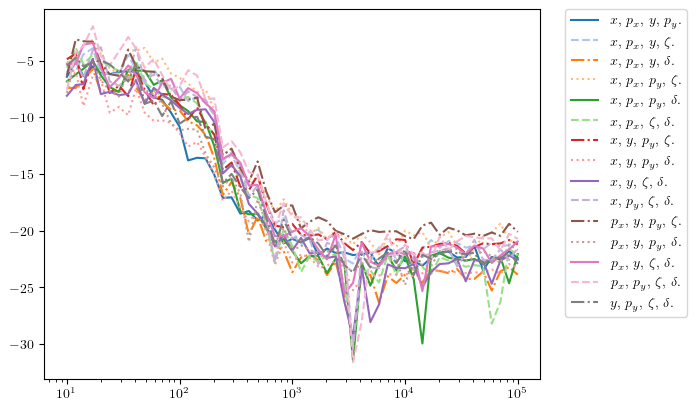

In [211]:

colors = plt.cm.tab20(np.linspace(0, 1, 20))
linestyles = ["-", "--", "-.", ":"]
for i in tqdm(range(len(data_combo_4))):
    mean = [np.nanmin(x) for x in data_combo_4[i]]

    plt.plot(times, mean, c=colors[i],
    label=f"${gali_4_latex[i][0]}$, ${gali_4_latex[i][1]}$, ${gali_4_latex[i][2]}$, ${gali_4_latex[i][3]}$.",
    ls=linestyles[i%4])

plt.xscale("log")
# plt.xlim(1e3,1e4)

# add legend outside of the plot on the right
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)

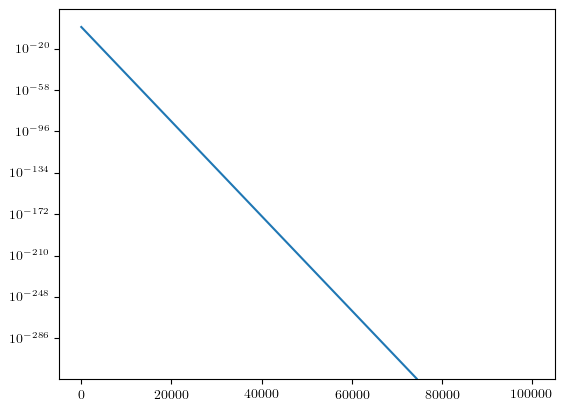

In [110]:
tmp = np.logspace(1,5, 1000)
plt.plot(tmp, np.exp(-tmp*0.01))
plt.yscale("log")
# plt.xscale("log")

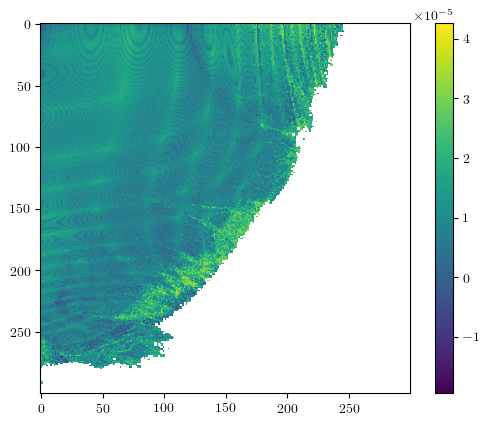

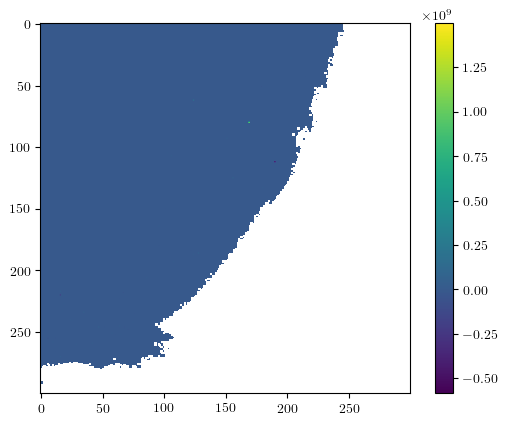

In [221]:
gali_diff = gali_6_post_data_list[main_idx][26] - gali_6_post_data_list[main_idx][-1]

gali_diff /= +6 * (1e5 - 1e3)


plt.figure()
plt.imshow(gali_diff.reshape(300, 300))
plt.colorbar()

plt.figure()
plt.imshow(((1/gali_diff)).reshape(300, 300))
plt.colorbar()


In [222]:
gali_evo_std_list = {t: [] for t in times}
gali_evo_list = {t: [] for t in times}

samples_evo_list = {t: [] for t in times}

bucket_lenght = 0.2
n_samples = 1000

sigma_sample_low = sigma_sample - bucket_lenght / 2
sigma_sample_high = sigma_sample + bucket_lenght / 2

        # print(j, t)
data_mean = []
data_std = []
n_samples = []

for s, l, h in zip(sigma_sample, sigma_sample_low, sigma_sample_high):
    mask = np.logical_and(radius_sigma_list[idx] >= l, radius_sigma_list[idx] < h)
    
    data_mean.append(np.nanmean(1/gali_diff[mask]))
    data_std.append(np.nanstd(1/gali_diff[mask]))
   
    n_samples.append(np.count_nonzero(
        ~np.isnan(1/gali_diff[mask])
    ))


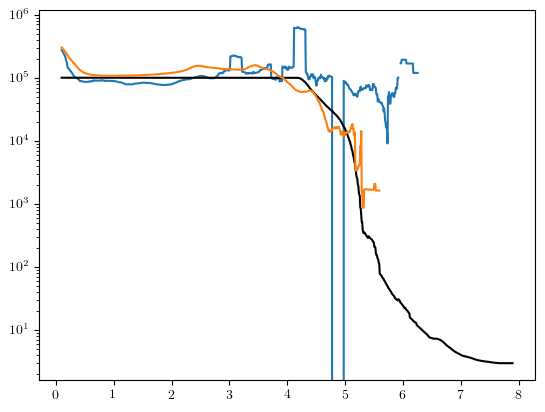

In [224]:
plt.plot(sigma_sample, data_mean, label="mean")
plt.plot(sigma_sample, loss_evo_list[100000][0], c="black")
plt.plot(sigma_sample, lyapunov_wb_evo_list[100000][0],  label=f"$T_L$ [$1/FLI^{{WB}}$], $n=10^{int(np.log10(t))}$")
plt.yscale("log")


gali_x_px.pkl
Loaded
-11.68529958689921 -0.0003571234831431334


/tmp/ipykernel_124986/999768061.py:64: RuntimeWarning: divide by zero encountered in log10
  tmp_data = np.log10(tmp_data)


-11.295946734981337 -0.001240372517518798
1
-12.421352166985123 -0.007652133666125414
2
-12.471667029875139 -0.0017173081484718534
-12.311268201909899 -0.0009404276858150061
4
-13.178586620251568 -0.006401996025511413
5
-12.279425054076912 -0.002653159835261517
-12.043938473069355 -0.0027684950500150626
7
-11.786255752567966 -0.005177345501119072
8
gali_x_y.pkl
Loaded
-11.143930603651828 -0.05838057337875466
-11.694285356535099 -0.0420513539321009
1
-11.797247204332287 -0.0593989634618643
2
-12.415744015696722 -0.05433912863402575
-12.544835366280118 -0.08276135609759895
4
-12.116714712085034 -0.09824336131484274
5
-11.574659758138734 -0.006028022624971447
-12.94238387246517 -0.020770859252304128
7
-12.100874092064565 -0.07191606274433528
8
gali_x_py.pkl
Loaded
-10.721463123344751 -0.0007519275496517104
-11.23398751664068 -0.0015143053170498032
1
-10.548399654053899 -0.0020425140463920114
2
-11.827982929346671 -0.0012948357876118363
-11.142126270480857 -0.0012964377090883342
4
-11.0733

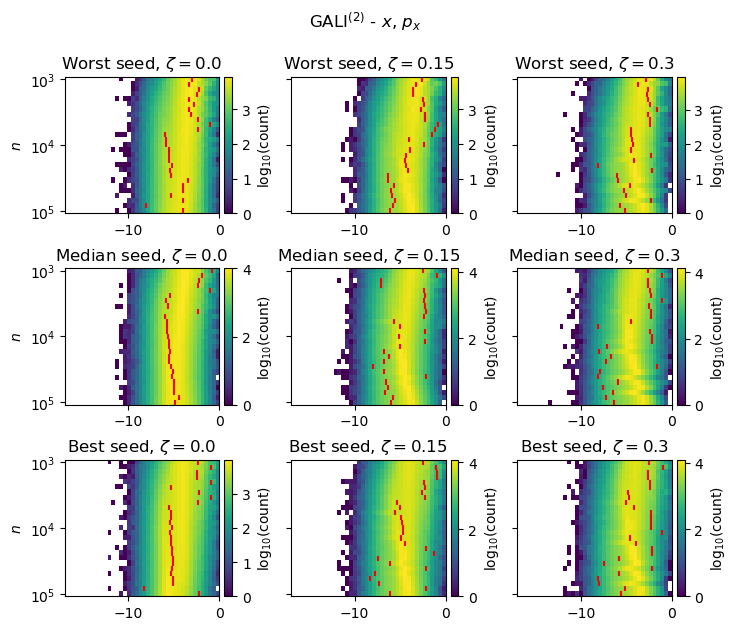

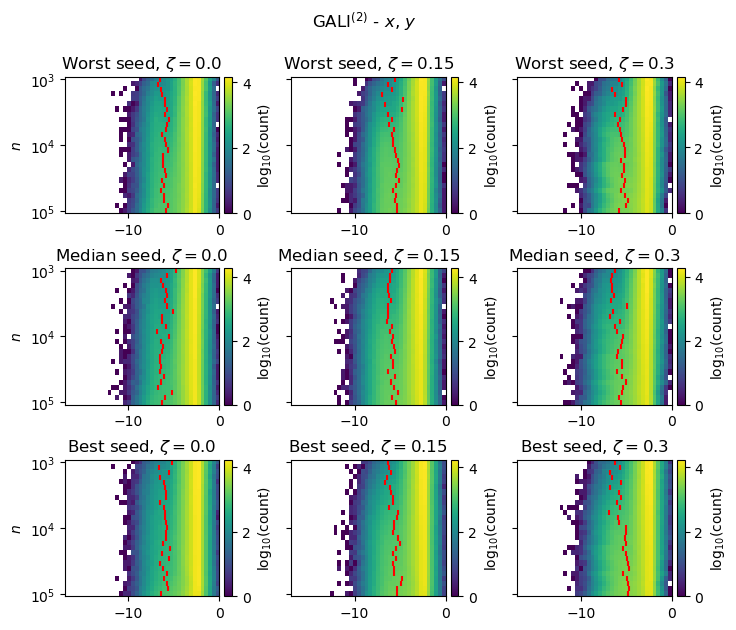

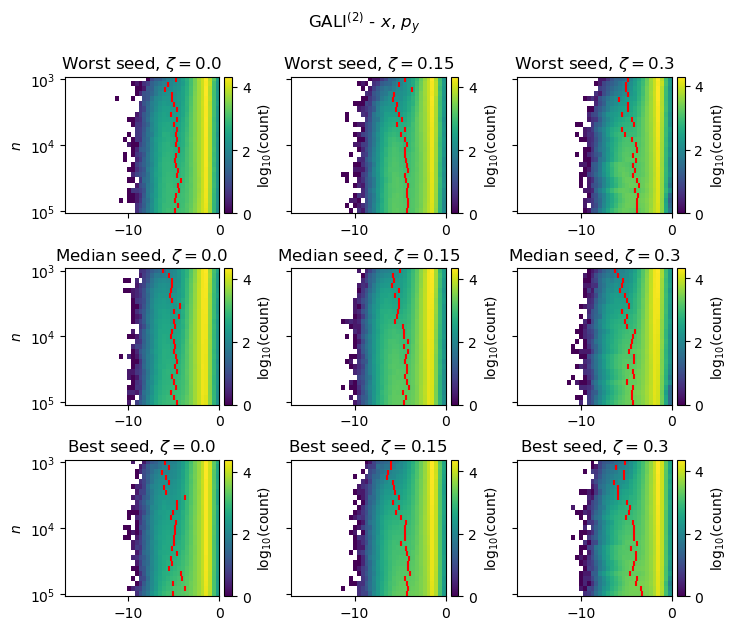

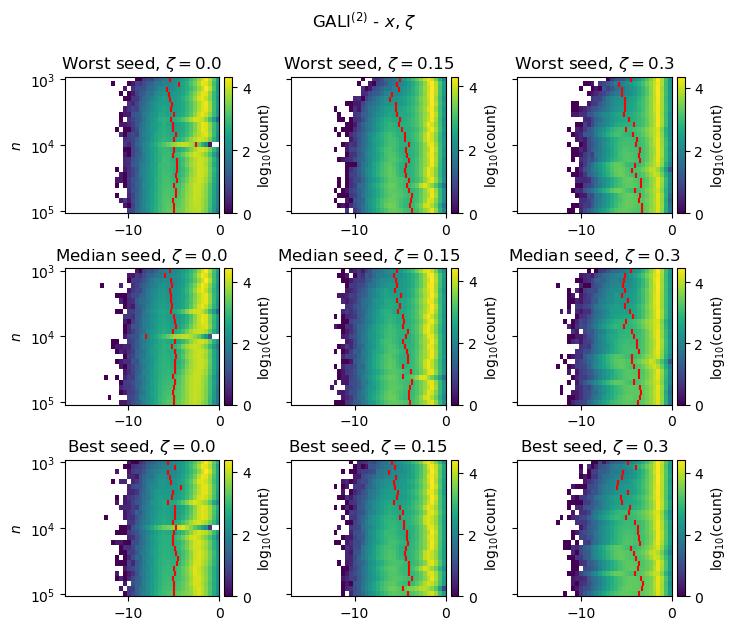

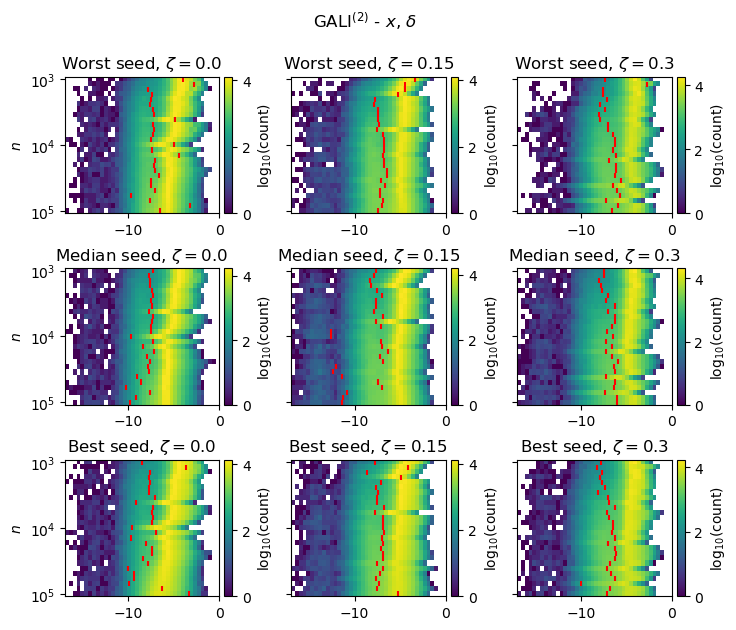

...

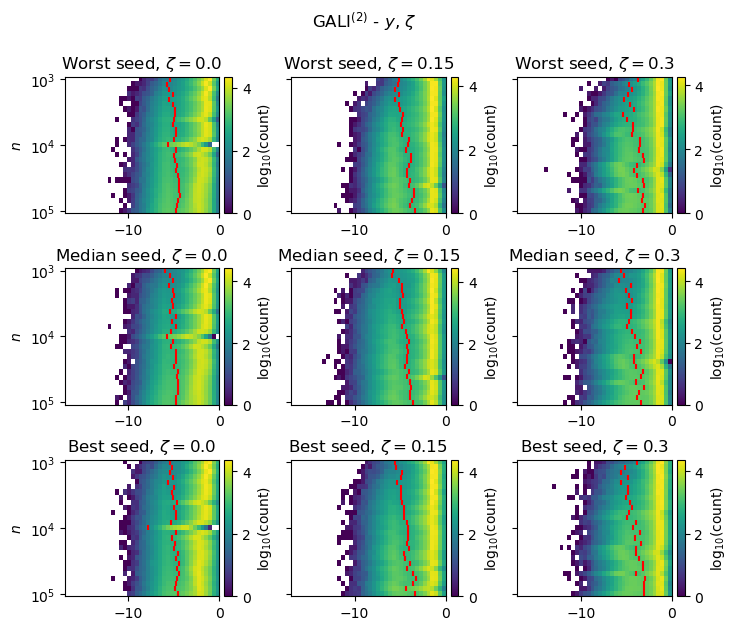

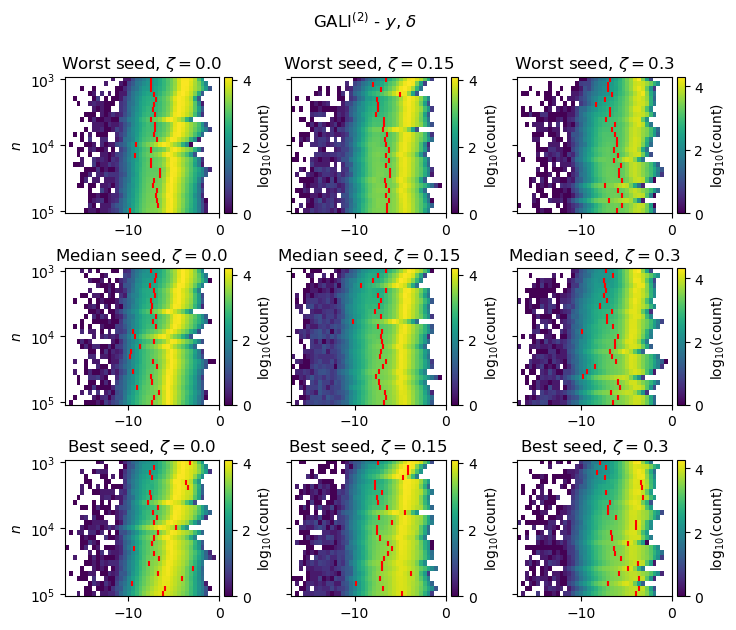

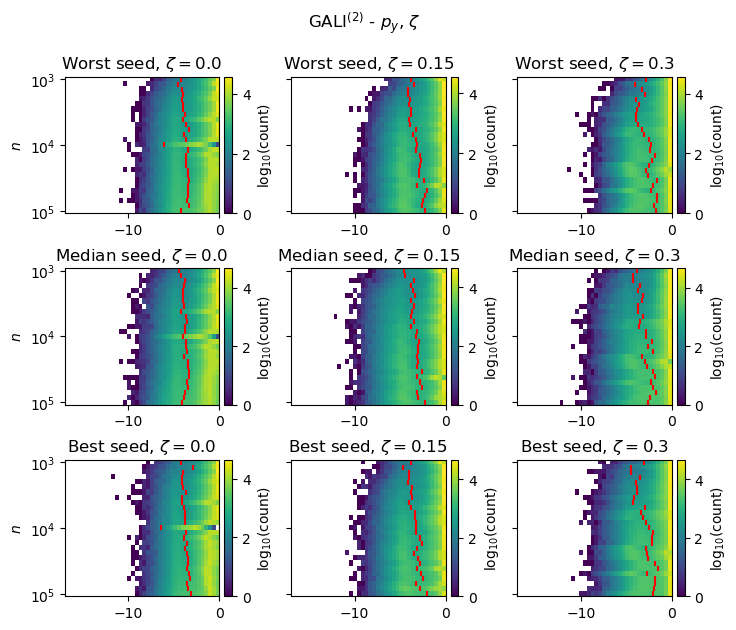

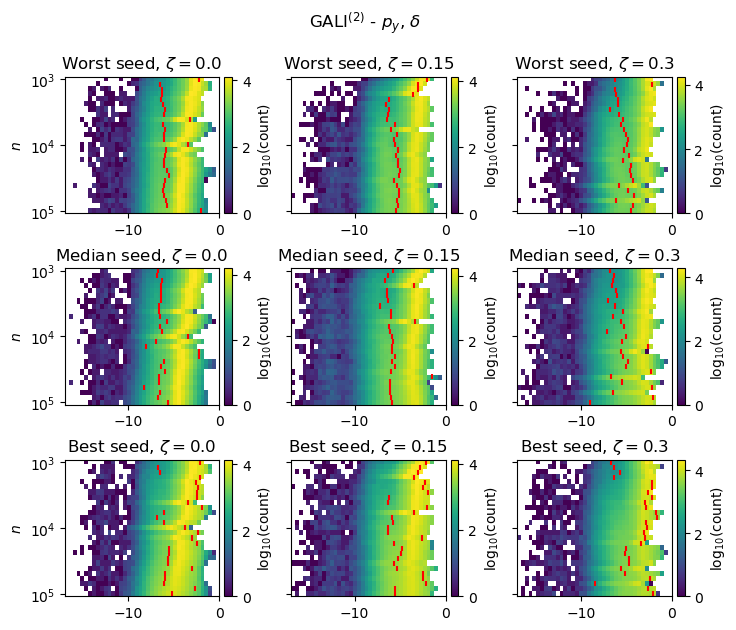

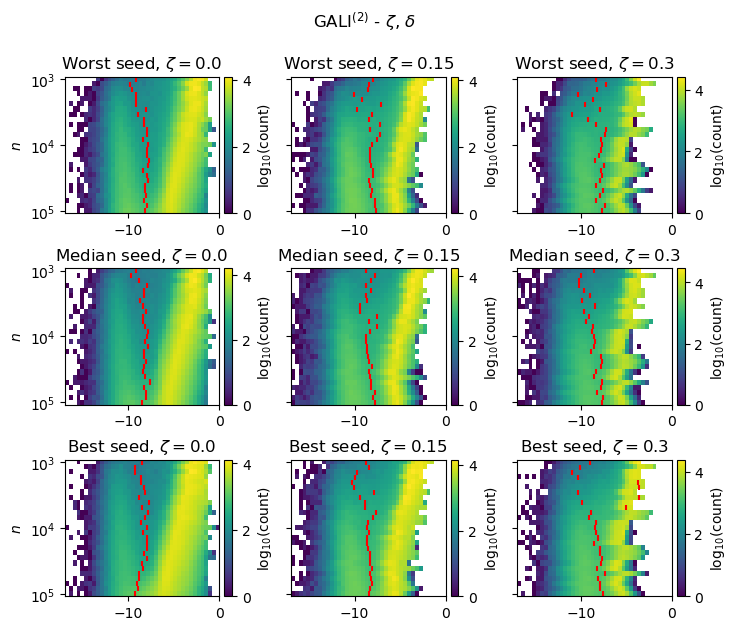

In [ ]:
import pickle

gali_combos = gali_2_combo 
latex_combos = gali_2_latex 

# vmin = np.infty
# vmax = -np.infty
# for i, (combo, latex) in enumerate(zip(gali_combos, latex_combos)):
#     filename = "gali_"
#     for s in combo:
#         filename += s
#         filename += "_"
#     filename = filename[:-1] + ".pkl"
#     print(filename)
#     with open("gali_files/" + filename, 'rb') as f:
#         gali_post_data_list = pickle.load(f)[1]

#     vmin = np.nanmin([vmin, np.nanmin(gali_post_data_list[idx][-1])])
#     vmax = np.nanmax([vmax, np.nanmax(gali_post_data_list[idx][-1])])

# print(vmin, vmax)
# vmin = -10

for q, (combo, latex) in enumerate(zip(gali_combos, latex_combos)):
    filename = "gali_"
    for s in combo:
        filename += s
        filename += "_"
    filename = filename[:-1] + ".pkl"
    print(filename)
    with open("gali_files/" + filename, 'rb') as f:
        gali_post_data_list, gali_thresh_list = pickle.load(f)[1:3]
    print("Loaded")

    fig = plt.figure(figsize=(8, 6.75))

    gs = gridspec.GridSpec(3, 3, width_ratios=[1, 1, 1], height_ratios=[1, 1, 1])

    axs = []
    axs.append(plt.subplot(gs[0, 0]))
    axs.append(plt.subplot(gs[0, 1]))
    axs.append(plt.subplot(gs[0, 2]))
    axs.append(plt.subplot(gs[1, 0]))
    axs.append(plt.subplot(gs[1, 1]))
    axs.append(plt.subplot(gs[1, 2]))
    axs.append(plt.subplot(gs[2, 0]))
    axs.append(plt.subplot(gs[2, 1]))
    axs.append(plt.subplot(gs[2, 2]))

    idx = 4
    mask = mask_list[idx]

    for an_i, (ax, idx, idx2, idx3) in enumerate(zip(axs, range(9), range(9), range(9))):

        post_data = gali_post_data_list[idx][26:]
        thresholds = gali_thresh_list[idx][26:]

        val_min, val_max = get_extents([l for l in post_data[::]], 10)
        print(val_min, val_max)
        val_min = -17.0
        val_max = 0.0

        tmp_data, bin_centers = compose_count_map([l[mask] for l in post_data], val_min, val_max, nbins=40, density=False)
        tmp_data = np.log10(tmp_data)
        # print(tmp_data.shape)
        # tmp_data = tmp_data[::13]

        cmap = ax.imshow(tmp_data, cmap='viridis', aspect='auto', extent=[val_min, val_max, -0.5, len(times[26::])-0.5], interpolation='none')

        divider = make_axes_locatable(ax)
        cax = divider.append_axes("right", size="5%", pad=0.05)
        cbar = plt.colorbar(cmap, cax=cax, label="$\\log_{{10}}(\\mathrm{{count}})$")

        # plot the thresholds over the imshow
        for i, t in enumerate(thresholds):
            ax.plot([t, t], [(len(thresholds)-1-i)-0.5, (len(thresholds)-1-i)+0.5], '--', color='red')

        # set the y ticks at idx 0, 13, and 26, and set the labels as 10^3, 10^4, and 10^5
        ax.set_yticks([0, 13, 26])
        ax.set_yticklabels([f"$10^{{{int(np.log10(times[26:][0]))}}}$", f"$10^{{{int(np.log10(times[26:][13]))}}}$", f"$10^{{{int(np.log10(times[26:][26]))}}}$"][::-1])
        

        ax.set_ylabel("$n$")
        ax.set_title(f"{title_plot_list[idx]}")

        if an_i != 0 and an_i != 3 and an_i != 6:
            print(an_i)
            ax.set_yticklabels([])
            ax.set_ylabel('')


    # increase distance between subplots
    # increase distance between subplots
    plt.suptitle(f"$\\mathrm{{GALI}}^{{(2)}}$ - ${latex[0]}$, ${latex[1]}$")
    plt.subplots_adjust(wspace=0.35)
    plt.subplots_adjust(hspace=0.40)

    plt.savefig(os.path.join(IMGDIR, f"evolution_gali_{2}_{'-'.join([str(x) for x in combo])}.png"), bbox_inches="tight", dpi=300)
    

gali_x_px_y_py.pkl
Loaded
-23.392805950937337 -0.17564232545325667
-24.51704596584029 -0.08626350909141246
1
-23.51201957284058 -0.29904826442526294
2


/tmp/ipykernel_124986/2614922272.py:62: RuntimeWarning: divide by zero encountered in log10
  tmp_data = np.log10(tmp_data)


-24.24155585347042 -0.06062316991280098
-24.277449722162412 -0.13241025669187453
4
-23.639660550070623 -0.11918345664308191
5
-23.287318366739886 -0.14724222773216036
-24.0069887175343 -0.20068921781757257
7
-23.996865626056874 -0.27414094122228894
8
gali_x_px_y_zeta.pkl
Loaded
-23.46238922303422 -0.13348217569403778
-23.995993004856594 -0.05043941767342658
1
-22.93488913068691 -0.302185207243198
2
-23.633457595867142 -0.1104951790586203
-25.83888142887925 -0.1016950362585771
4
-24.33280924909816 -0.463274425505227
5
-23.206134645713497 -0.10070123709836777
-23.99125236217577 -0.13348685407975347
7
-23.33303027245662 -0.0903562836865251
8
gali_x_px_y_delta.pkl
Loaded
-26.954352108084738 -1.43890187319852
-31.516998195897713 -1.539404870410435
1
-29.780608152948684 -1.7033833302511883
2
-30.668609456303646 -1.4431060051435884
-31.94631402095058 -1.798301684323902
4
-31.283008534608143 -1.2862375710161285
5
-25.581980679507726 -1.347558620459149
-30.16618682829772 -1.5225622923071076
7
-

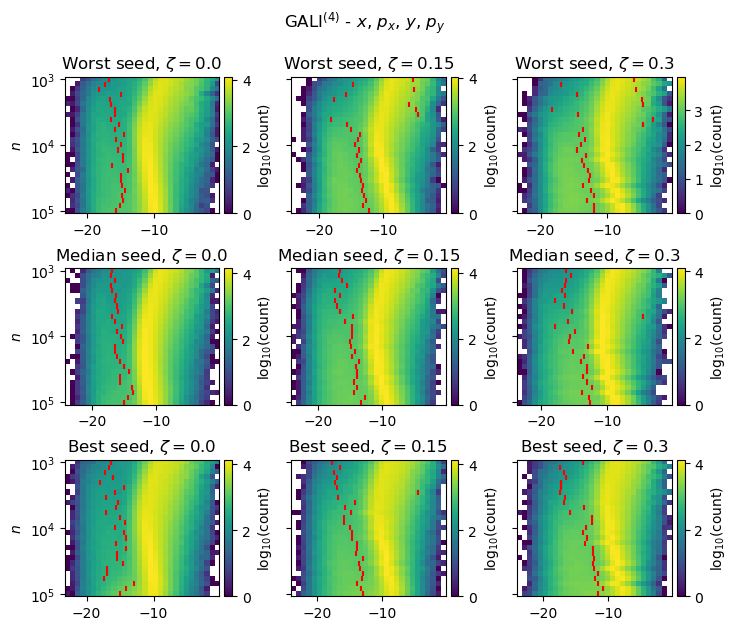

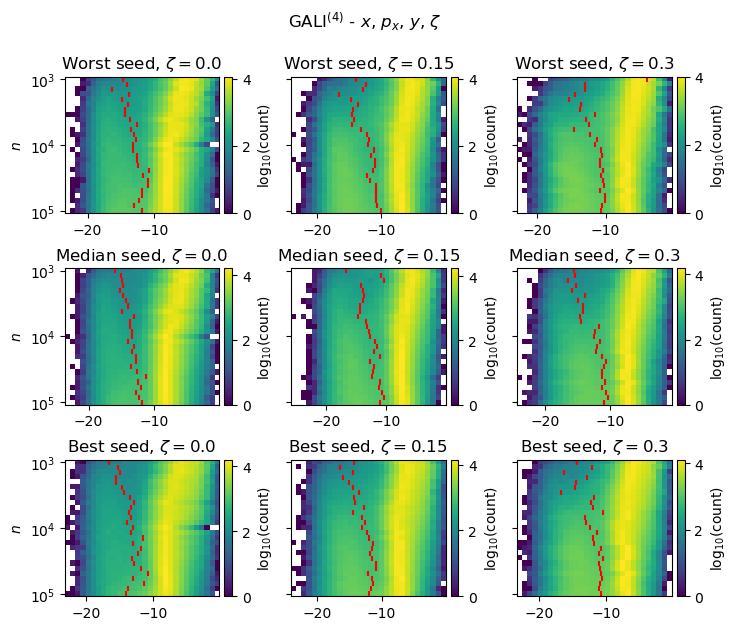

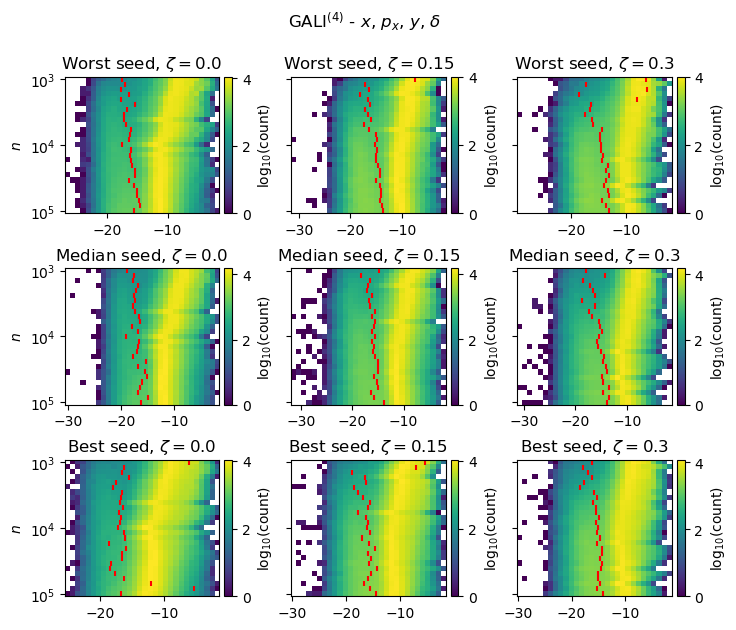

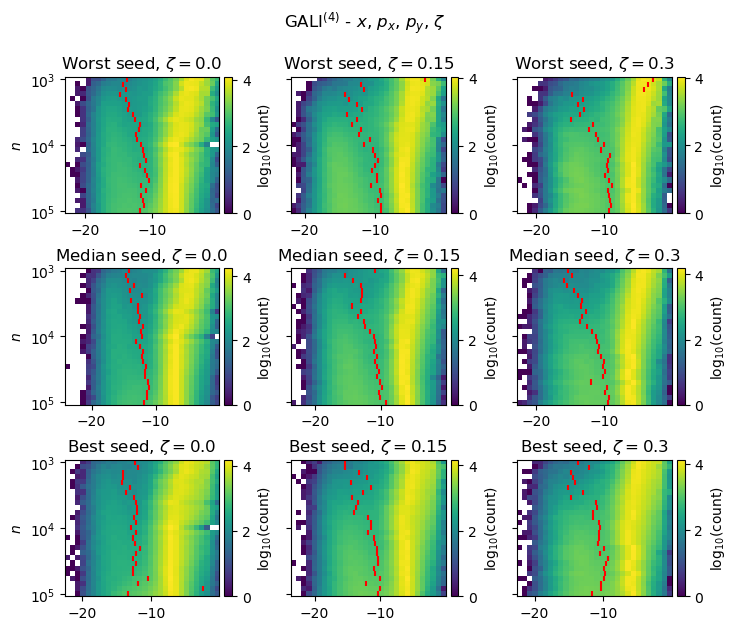

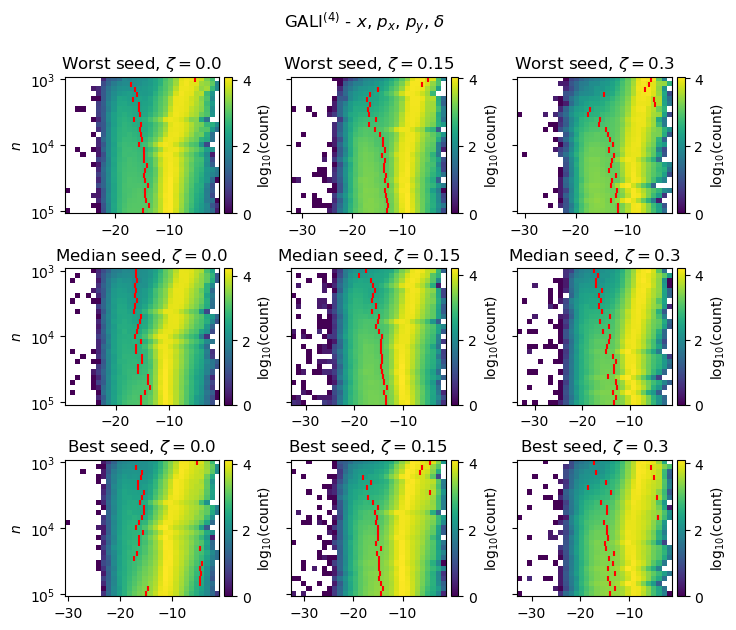

...

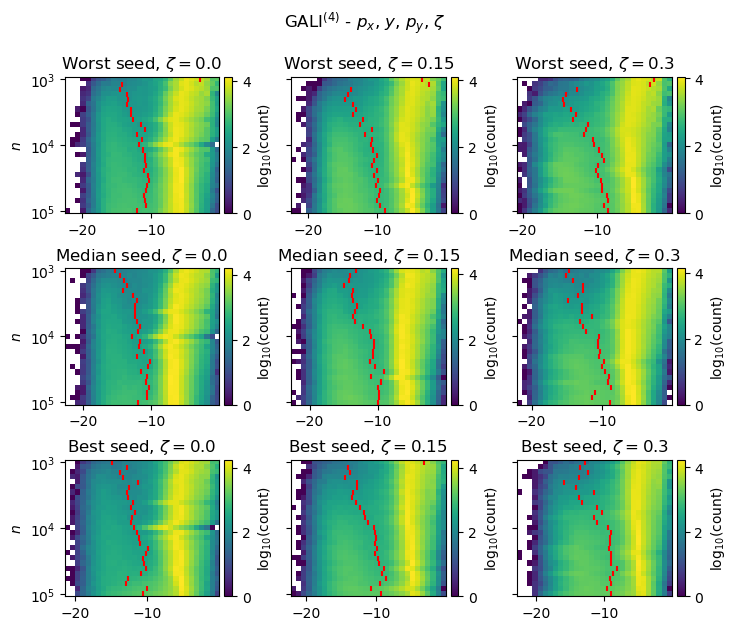

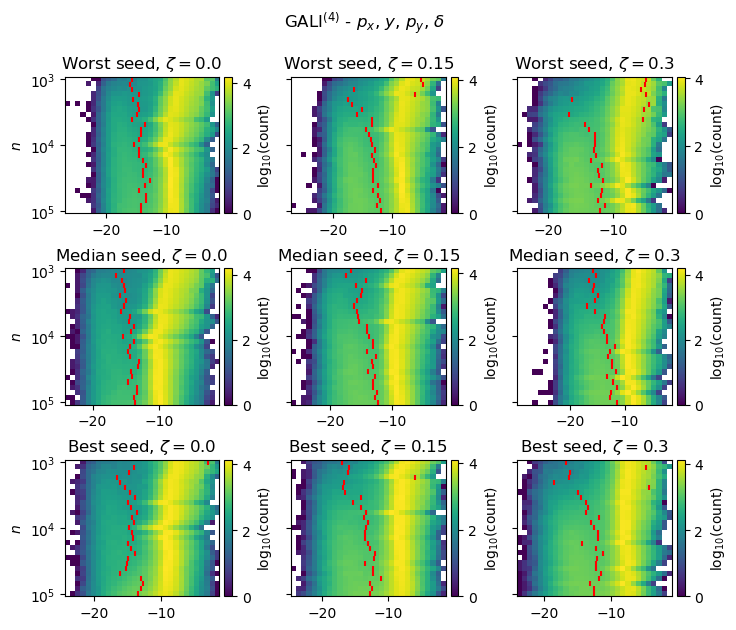

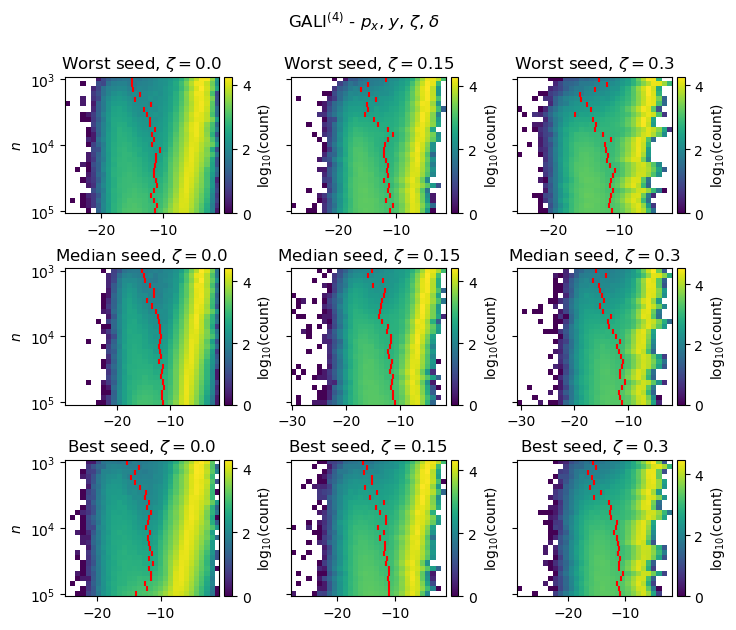

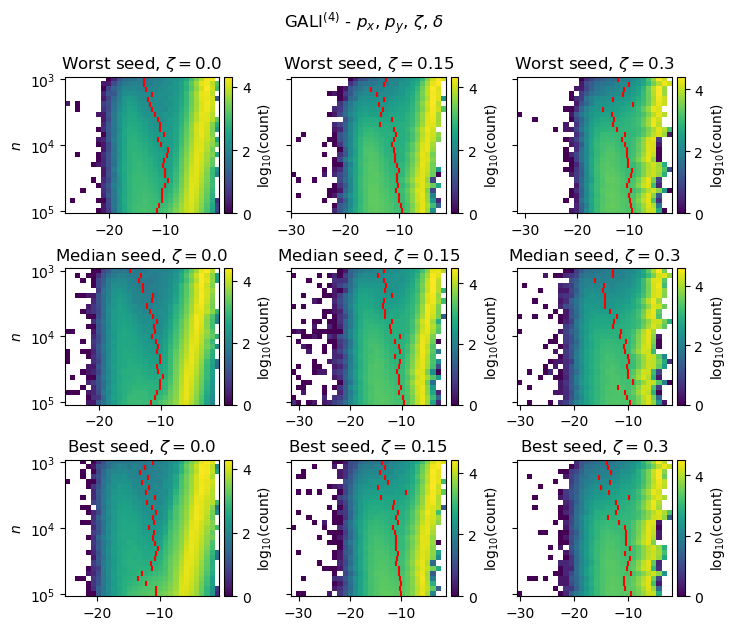

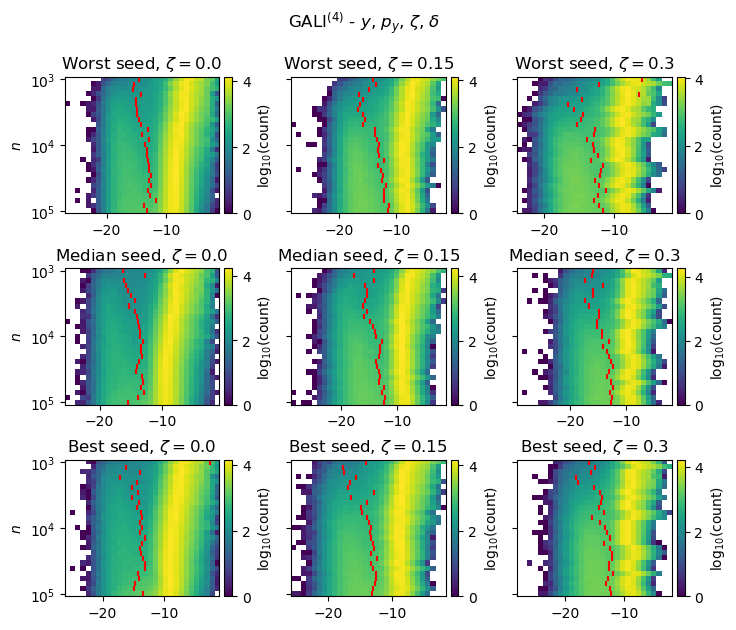

In [ ]:
import pickle

gali_combos = gali_4_combo 
latex_combos = gali_4_latex 

# vmin = np.infty
# vmax = -np.infty
# for i, (combo, latex) in enumerate(zip(gali_combos, latex_combos)):
#     filename = "gali_"
#     for s in combo:
#         filename += s
#         filename += "_"
#     filename = filename[:-1] + ".pkl"
#     print(filename)
#     with open("gali_files/" + filename, 'rb') as f:
#         gali_post_data_list = pickle.load(f)[1]

#     vmin = np.nanmin([vmin, np.nanmin(gali_post_data_list[idx][-1])])
#     vmax = np.nanmax([vmax, np.nanmax(gali_post_data_list[idx][-1])])

# print(vmin, vmax)
# vmin = -10

for q, (combo, latex) in enumerate(zip(gali_combos, latex_combos)):
    filename = "gali_"
    for s in combo:
        filename += s
        filename += "_"
    filename = filename[:-1] + ".pkl"
    print(filename)
    with open("gali_files/" + filename, 'rb') as f:
        gali_post_data_list, gali_thresh_list = pickle.load(f)[1:3]
    print("Loaded")

    fig = plt.figure(figsize=(8, 6.75))

    gs = gridspec.GridSpec(3, 3, width_ratios=[1, 1, 1], height_ratios=[1, 1, 1])

    axs = []
    axs.append(plt.subplot(gs[0, 0]))
    axs.append(plt.subplot(gs[0, 1]))
    axs.append(plt.subplot(gs[0, 2]))
    axs.append(plt.subplot(gs[1, 0]))
    axs.append(plt.subplot(gs[1, 1]))
    axs.append(plt.subplot(gs[1, 2]))
    axs.append(plt.subplot(gs[2, 0]))
    axs.append(plt.subplot(gs[2, 1]))
    axs.append(plt.subplot(gs[2, 2]))

    idx = 4
    mask = mask_list[idx]

    for an_i, (ax, idx, idx2, idx3) in enumerate(zip(axs, range(9), range(9), range(9))):

        post_data = gali_post_data_list[idx][26:]
        thresholds = gali_thresh_list[idx][26:]

        val_min, val_max = get_extents([l for l in post_data[::]], 10)
        print(val_min, val_max)

        tmp_data, bin_centers = compose_count_map([l[mask] for l in post_data], val_min, val_max, nbins=30, density=False)
        tmp_data = np.log10(tmp_data)
        # print(tmp_data.shape)
        # tmp_data = tmp_data[::13]

        cmap = ax.imshow(tmp_data, cmap='viridis', aspect='auto', extent=[val_min, val_max, -0.5, len(times[26::])-0.5], interpolation='none')

        divider = make_axes_locatable(ax)
        cax = divider.append_axes("right", size="5%", pad=0.05)
        cbar = plt.colorbar(cmap, cax=cax, label="$\\log_{{10}}(\\mathrm{{count}})$")

        # plot the thresholds over the imshow
        for i, t in enumerate(thresholds):
            ax.plot([t, t], [(len(thresholds)-1-i)-0.5, (len(thresholds)-1-i)+0.5], '--', color='red')

        # set the y ticks at idx 0, 13, and 26, and set the labels as 10^3, 10^4, and 10^5
        ax.set_yticks([0, 13, 26])
        ax.set_yticklabels([f"$10^{{{int(np.log10(times[26:][0]))}}}$", f"$10^{{{int(np.log10(times[26:][13]))}}}$", f"$10^{{{int(np.log10(times[26:][26]))}}}$"][::-1])
        
        ax.set_ylabel("$n$")
        ax.set_title(f"{title_plot_list[idx]}")

        if an_i != 0 and an_i != 3 and an_i != 6:
            print(an_i)
            ax.set_yticklabels([])
            ax.set_ylabel('')


    # increase distance between subplots
    # increase distance between subplots
    plt.suptitle(f"$\\mathrm{{GALI}}^{{(4)}}$ - ${latex[0]}$, ${latex[1]}$, ${latex[2]}$, ${latex[3]}$")
    plt.subplots_adjust(wspace=0.35)
    plt.subplots_adjust(hspace=0.40)

    plt.savefig(os.path.join(IMGDIR, f"evolution_gali_{4}_{'-'.join([str(x) for x in combo])}.png"), bbox_inches="tight", dpi=300)
    

In [11]:
tune_data_list = []
tune_post_data_list = []
tune_thresh_list = []
tune_guesses_list = []

for i, ((lattice, extent), zeta) in enumerate(itertools.product(zip(lattice_list, extent_list), zeta_list)):
    tune_file = h5py.File(os.path.join(TUNEDIR, f"tune_birkhoff_full_{lattice}_{zeta}.h5"), "r")

    data_list = []
    post_data_list = []
    thresh_list = []
    guesses_list = []
    scores_list = []
    for t in times:
        tune_x_1 = 1 - (tune_file[f"tune/x/{0}/{t//2}"][:] / (np.pi*2))
        tune_x_2 = 1 - (tune_file[f"tune/x/{t//2}/{t//2*2}"][:] / (np.pi*2))
        tune_y_1 = 1 - (tune_file[f"tune/y/{0}/{t//2}"][:] / (np.pi*2))
        tune_y_2 = 1 - (tune_file[f"tune/y/{t//2}/{t//2*2}"][:] / (np.pi*2))
        disp_x = tune_x_1 - tune_x_2
        disp_y = tune_y_1 - tune_y_2

        disp = np.sqrt(disp_x**2 + disp_y**2)
        
        data_list.append(disp)

        disp[~mask_list[i]] = np.nan
        if np.count_nonzero(disp[mask_list[i]] > 0) == 0:
            disp[mask_list[i]] = 1e-14
            
        disp = np.log10(disp)
        disp[np.logical_and(mask_list[i], np.isnan(disp))] = np.nanmax(disp)
        disp[np.isinf(disp)] = np.nan
        disp[np.logical_and(mask_list[i], np.isnan(disp))] = np.nanmin(disp)

        post_data_list.append(disp)

        try:
            threshold = find_threshold_smart_v2(disp[mask_list[i]], where_chaos="higher")
        except:
            threshold = 1e-13
        thresh_list.append(threshold)

        guess = disp < threshold
        guess = np.asarray(guess, dtype=float)
        guess[~mask_list[i]] = np.nan
        guesses_list.append(guess)

    tune_data_list.append(data_list)
    tune_post_data_list.append(post_data_list)
    tune_thresh_list.append(thresh_list)
    tune_guesses_list.append(guesses_list)


/tmp/ipykernel_13506/1949259480.py:30: RuntimeWarning: divide by zero encountered in log10
  disp = np.log10(disp)
/tmp/ipykernel_13506/1949259480.py:30: RuntimeWarning: divide by zero encountered in log10
  disp = np.log10(disp)
/tmp/ipykernel_13506/1949259480.py:30: RuntimeWarning: divide by zero encountered in log10
  disp = np.log10(disp)
/tmp/ipykernel_13506/1949259480.py:30: RuntimeWarning: divide by zero encountered in log10
  disp = np.log10(disp)
/tmp/ipykernel_13506/1949259480.py:30: RuntimeWarning: divide by zero encountered in log10
  disp = np.log10(disp)
/tmp/ipykernel_13506/1949259480.py:30: RuntimeWarning: divide by zero encountered in log10
  disp = np.log10(disp)
/tmp/ipykernel_13506/1949259480.py:30: RuntimeWarning: divide by zero encountered in log10
  disp = np.log10(disp)
/tmp/ipykernel_13506/1949259480.py:30: RuntimeWarning: divide by zero encountered in log10
  disp = np.log10(disp)
/tmp/ipykernel_13506/1949259480.py:30: RuntimeWarning: divide by zero encountere

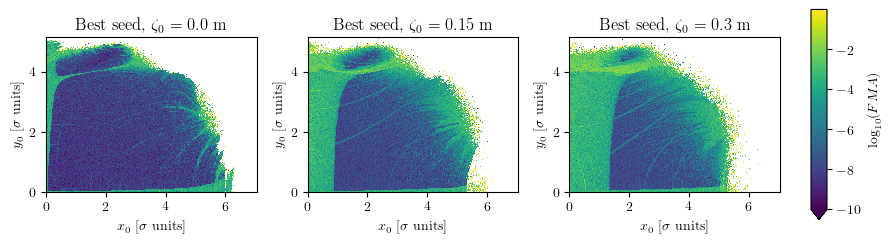

In [18]:
fig, axs = plt.subplots(1, 3, figsize=(8, 3))

min_val = np.infty
max_val = -np.infty

for i in range(3):
    min_val = min(min_val, np.nanmin(tune_post_data_list[6+i][-1]))
    max_val = max(max_val, np.nanmax(tune_post_data_list[6+i][-1]))

min_val = -10.0

for i, ax in enumerate(axs.flatten()):
    im = ax.imshow(tune_post_data_list[6+i][-1].reshape(300, 300), origin="lower", extent=e_list_sigma[6+i], vmin=min_val, vmax=max_val, interpolation="nearest")
    ax.set_title(f"Best seed, $\\zeta_0={z_name_list[i+3]}$ m")
    ax.set_xlabel("$x_0$ [$\\sigma$ units]")
    ax.set_ylabel("$y_0$ [$\\sigma$ units]")

plt.tight_layout()
# add vertical colorbar to the right
cbar_ax = fig.add_axes([1.02, 0.15, 0.02, 0.7])
fig.colorbar(im, cax=cbar_ax, orientation="vertical", label="$\\log_{10}(FMA)$", extend="min")
plt.savefig(os.path.join(IMGDIR, "FMA.pdf"), dpi=600, bbox_inches="tight")

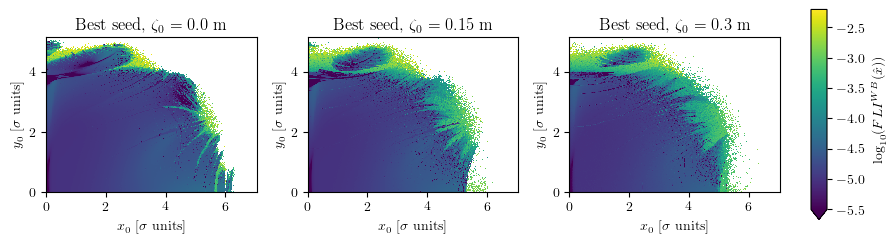

In [19]:
fig, axs = plt.subplots(1, 3, figsize=(8, 3))

min_val = np.infty
max_val = -np.infty

for i in range(3):
    min_val = min(min_val, np.nanmin(flibk_x_post_data_list[6+i][-1]))
    max_val = max(max_val, np.nanmax(flibk_x_post_data_list[6+i][-1]))

min_val = -5.5

for i, ax in enumerate(axs.flatten()):
    im = ax.imshow(flibk_x_post_data_list[6+i][-1].reshape(300, 300), origin="lower", extent=e_list_sigma[6+i], vmin=min_val, vmax=max_val, interpolation="nearest")
    ax.set_title(f"Best seed, $\\zeta_0={z_name_list[i+3]}$ m")
    ax.set_xlabel("$x_0$ [$\\sigma$ units]")
    ax.set_ylabel("$y_0$ [$\\sigma$ units]")

plt.tight_layout()
# add vertical colorbar to the right
cbar_ax = fig.add_axes([1.02, 0.15, 0.02, 0.7])
fig.colorbar(im, cax=cbar_ax, orientation="vertical", label="$\\log_{10}(FLI^{{WB}}(\\hat{{x}}))$", extend="min")
plt.savefig(os.path.join(IMGDIR, "FMA_addendum.pdf"), dpi=600, bbox_inches="tight")

(300, 300, 4)


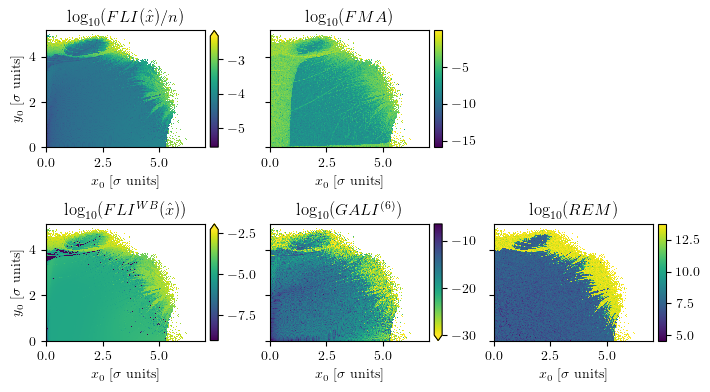

In [51]:
import types
def bottom_offset(self, bboxes, bboxes2):
    bottom = self.axes.bbox.ymax
    self.offsetText.set(va="top", ha="left")
    self.offsetText.set_position(
            (-3, bottom + 17))

def register_bottom_offset(axis, func):
    axis._update_offset_text_position = types.MethodType(func, axis)    

fig = plt.figure(figsize=(8, 5))

gs = gridspec.GridSpec(2, 3, width_ratios=[1, 1, 1], height_ratios=[1, 1])

axs = []
axs.append(plt.subplot(gs[0, 0]))
axs.append(plt.subplot(gs[0, 1]))
#axs.append(plt.subplot(gs[0, 2]))
axs.append(plt.subplot(gs[1, 0]))
axs.append(plt.subplot(gs[1, 1]))
axs.append(plt.subplot(gs[1, 2]))

t_idx = -1
idx = 7
samples = 300

cmap = axs[0].imshow((fli_x_post_data_list[idx][t_idx]).reshape((samples, samples)), origin='lower', cmap='viridis', extent=e_list_sigma[idx], interpolation="nearest")

axs[0].set_xlabel('$x_0$ [$\\sigma$ units]')
axs[0].set_ylabel('$y_0$ [$\\sigma$ units]')
# add side colorbar
divider = make_axes_locatable(axs[0])
cax = divider.append_axes("right", size="5%", pad=0.05)
cbar = plt.colorbar(cmap, cax=cax, extend='max')

axs[0].set_title("$\\log_{{10}}(FLI(\\hat{x}) / n)$")

tmp = flibk_x_post_data_list[idx][t_idx].reshape((samples, samples)).copy()
tmp_mask = tmp == -14
cmap = plt.cm.get_cmap('viridis')
tmp[tmp_mask] = np.nan
norm = plt.Normalize(vmin=np.nanmin(tmp), vmax=np.nanmax(tmp))
rgba = cmap(norm(tmp))
print(rgba.shape)
# color red the tmp_mask
rgba[tmp_mask] = [1, 0, 0, 1]
rgba[~tmp_mask] = [0, 0, 0, 0]

tmp[tmp <= -14] = np.nan

cmap = axs[2].imshow(tmp, origin='lower', extent=e_list_sigma[idx], interpolation="nearest")
axs[2].imshow((rgba), origin='lower', extent=e_list_sigma[idx], interpolation="nearest")

axs[2].set_xlabel('$x_0$ [$\\sigma$ units]')
# hide y axis
# axs[2].set_yticklabels([])
axs[2].set_ylabel('$y_0$ [$\\sigma$ units]')
# add side colorbar
divider = make_axes_locatable(axs[2])
cax = divider.append_axes("right", size="5%", pad=0.05)
cbar = plt.colorbar(cmap, cax=cax, extend='max')
# cbar.formatter.set_powerlimits((0, 0))
# register_bottom_offset(cbar.ax.yaxis, bottom_offset)

axs[2].set_title("$\\log_{{10}}(FLI^{{WB}}(\\hat{x}))$")

# cmap = axs[2].imshow((megno_x_post_data_list[idx][t_idx]).reshape((samples, samples)), origin='lower', cmap='viridis', extent=e_list_sigma[idx], interpolation="nearest")

# axs[2].set_xlabel('$x_0$ [$\\sigma$ units]')
# # hide y axis
# axs[2].set_yticklabels([])
# axs[2].set_ylabel('')
# # add side colorbar
# divider = make_axes_locatable(axs[2])
# cax = divider.append_axes("right", size="5%", pad=0.05)
# cbar = plt.colorbar(cmap, cax=cax, extend='max')

# axs[2].set_title("$\\log_{{10}}($MEGNO$)$")

cmap = axs[3].imshow((gali_6_post_data_list[idx][t_idx]).reshape((samples, samples)), origin='lower', cmap='viridis_r', extent=e_list_sigma[idx], interpolation="nearest", vmin=-30)
cbar.formatter.set_powerlimits((0, 0))
register_bottom_offset(cbar.ax.yaxis, bottom_offset)

axs[3].set_xlabel('$x_0$ [$\\sigma$ units]')
axs[3].set_ylabel('$y_0$ [$\\sigma$ units]')

axs[3].set_yticklabels([])
axs[3].set_ylabel('')
# add side colorbar
divider = make_axes_locatable(axs[3])
cax = divider.append_axes("right", size="5%", pad=0.05)
cbar = plt.colorbar(cmap, cax=cax, extend="min")

axs[3].set_title("$\\log_{{10}}(GALI^{{(6)}})$")

cmap = axs[4].imshow((16 + rem_post_data_list[idx][t_idx]).reshape((samples, samples)), origin='lower', cmap='viridis', extent=e_list_sigma[idx], interpolation="nearest")

axs[4].set_xlabel('$x_0$ [$\\sigma$ units]')
# hide y axis
axs[4].set_yticklabels([])
axs[4].set_ylabel('')
# add side colorbar
divider = make_axes_locatable(axs[4])
cax = divider.append_axes("right", size="5%", pad=0.05)
cbar = plt.colorbar(cmap, cax=cax)

axs[4].set_title("$\\log_{{10}}(REM)$")

cmap = axs[1].imshow((tune_post_data_list[idx][t_idx]).reshape((samples, samples)), origin='lower', cmap='viridis', extent=e_list_sigma[idx], interpolation="nearest")

axs[1].set_xlabel('$x_0$ [$\\sigma$ units]')
# hide y axis
axs[1].set_yticklabels([])
axs[1].set_ylabel('')
# add side colorbar
divider = make_axes_locatable(axs[1])
cax = divider.append_axes("right", size="5%", pad=0.05)
cbar = plt.colorbar(cmap, cax=cax)

axs[1].set_title("$\\log_{{10}}(FMA)$")

# increase distance between subplots
plt.subplots_adjust(wspace=0.3)
plt.subplots_adjust(hspace=0.01)

plt.savefig(os.path.join(IMGDIR, f"overview.pdf"), bbox_inches="tight", dpi=600)


(300, 300, 4)


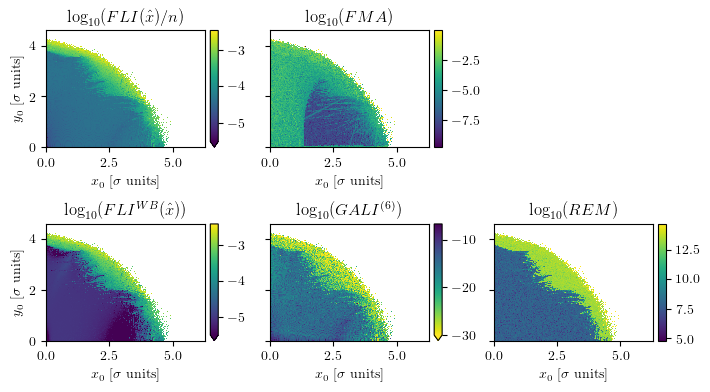

In [48]:
import types
def bottom_offset(self, bboxes, bboxes2):
    bottom = self.axes.bbox.ymax
    self.offsetText.set(va="top", ha="left")
    self.offsetText.set_position(
            (-3, bottom + 17))

def register_bottom_offset(axis, func):
    axis._update_offset_text_position = types.MethodType(func, axis)    

fig = plt.figure(figsize=(8, 5))

gs = gridspec.GridSpec(2, 3, width_ratios=[1, 1, 1], height_ratios=[1, 1])

axs = []
axs.append(plt.subplot(gs[0, 0]))
axs.append(plt.subplot(gs[0, 1]))
#axs.append(plt.subplot(gs[0, 2]))
axs.append(plt.subplot(gs[1, 0]))
axs.append(plt.subplot(gs[1, 1]))
axs.append(plt.subplot(gs[1, 2]))

t_idx = -1
idx = 2
samples = 300

cmap = axs[0].imshow((fli_x_post_data_list[idx][t_idx]).reshape((samples, samples)), origin='lower', cmap='viridis', extent=e_list_sigma[idx], interpolation="nearest", vmin=-5.5)

axs[0].set_xlabel('$x_0$ [$\\sigma$ units]')
axs[0].set_ylabel('$y_0$ [$\\sigma$ units]')
# add side colorbar
divider = make_axes_locatable(axs[0])
cax = divider.append_axes("right", size="5%", pad=0.05)
cbar = plt.colorbar(cmap, cax=cax, extend='min')

axs[0].set_title("$\\log_{{10}}(FLI(\\hat{x}) / n)$")

tmp = flibk_x_post_data_list[idx][t_idx].reshape((samples, samples)).copy()
tmp_mask = tmp == -14
cmap = plt.cm.get_cmap('viridis')
tmp[tmp_mask] = np.nan
norm = plt.Normalize(vmin=np.nanmin(tmp), vmax=np.nanmax(tmp))
rgba = cmap(norm(tmp))
print(rgba.shape)
# color red the tmp_mask
rgba[tmp_mask] = [1, 0, 0, 1]
rgba[~tmp_mask] = [0, 0, 0, 0]

tmp[tmp <= -14] = np.nan

cmap = axs[2].imshow(tmp, origin='lower', extent=e_list_sigma[idx], interpolation="nearest", vmin=-5.5)
axs[2].imshow((rgba), origin='lower', extent=e_list_sigma[idx], interpolation="nearest")

axs[2].set_xlabel('$x_0$ [$\\sigma$ units]')
# hide y axis
# axs[2].set_yticklabels([])
axs[2].set_ylabel('$y_0$ [$\\sigma$ units]')
# add side colorbar
divider = make_axes_locatable(axs[2])
cax = divider.append_axes("right", size="5%", pad=0.05)
cbar = plt.colorbar(cmap, cax=cax, extend='min')
# cbar.formatter.set_powerlimits((0, 0))
# register_bottom_offset(cbar.ax.yaxis, bottom_offset)

axs[2].set_title("$\\log_{{10}}(FLI^{{WB}}(\\hat{x}))$")

# cmap = axs[2].imshow((megno_x_post_data_list[idx][t_idx]).reshape((samples, samples)), origin='lower', cmap='viridis', extent=e_list_sigma[idx], interpolation="nearest")

# axs[2].set_xlabel('$x_0$ [$\\sigma$ units]')
# # hide y axis
# axs[2].set_yticklabels([])
# axs[2].set_ylabel('')
# # add side colorbar
# divider = make_axes_locatable(axs[2])
# cax = divider.append_axes("right", size="5%", pad=0.05)
# cbar = plt.colorbar(cmap, cax=cax, extend='max')

# axs[2].set_title("$\\log_{{10}}($MEGNO$)$")

cmap = axs[3].imshow((gali_6_post_data_list[idx][t_idx]).reshape((samples, samples)), origin='lower', cmap='viridis_r', extent=e_list_sigma[idx], interpolation="nearest", vmin=-30)
cbar.formatter.set_powerlimits((0, 0))
register_bottom_offset(cbar.ax.yaxis, bottom_offset)

axs[3].set_xlabel('$x_0$ [$\\sigma$ units]')
axs[3].set_ylabel('$y_0$ [$\\sigma$ units]')

axs[3].set_yticklabels([])
axs[3].set_ylabel('')
# add side colorbar
divider = make_axes_locatable(axs[3])
cax = divider.append_axes("right", size="5%", pad=0.05)
cbar = plt.colorbar(cmap, cax=cax, extend="min")

axs[3].set_title("$\\log_{{10}}(GALI^{{(6)}})$")

cmap = axs[4].imshow((16 + rem_post_data_list[idx][t_idx]).reshape((samples, samples)), origin='lower', cmap='viridis', extent=e_list_sigma[idx], interpolation="nearest")

axs[4].set_xlabel('$x_0$ [$\\sigma$ units]')
# hide y axis
axs[4].set_yticklabels([])
axs[4].set_ylabel('')
# add side colorbar
divider = make_axes_locatable(axs[4])
cax = divider.append_axes("right", size="5%", pad=0.05)
cbar = plt.colorbar(cmap, cax=cax)

axs[4].set_title("$\\log_{{10}}(REM)$")

cmap = axs[1].imshow((tune_post_data_list[idx][t_idx]).reshape((samples, samples)), origin='lower', cmap='viridis', extent=e_list_sigma[idx], interpolation="nearest")

axs[1].set_xlabel('$x_0$ [$\\sigma$ units]')
# hide y axis
axs[1].set_yticklabels([])
axs[1].set_ylabel('')
# add side colorbar
divider = make_axes_locatable(axs[1])
cax = divider.append_axes("right", size="5%", pad=0.05)
cbar = plt.colorbar(cmap, cax=cax)

axs[1].set_title("$\\log_{{10}}(FMA)$")

# increase distance between subplots
plt.subplots_adjust(wspace=0.3)
plt.subplots_adjust(hspace=0.01)

plt.savefig(os.path.join(IMGDIR, f"overview.pdf"), bbox_inches="tight", dpi=600)


In [46]:
print(times[13])
print(times[26])
print(times[39])

100
1000
10000


(300, 300, 4)
(300, 300, 4)
(300, 300, 4)


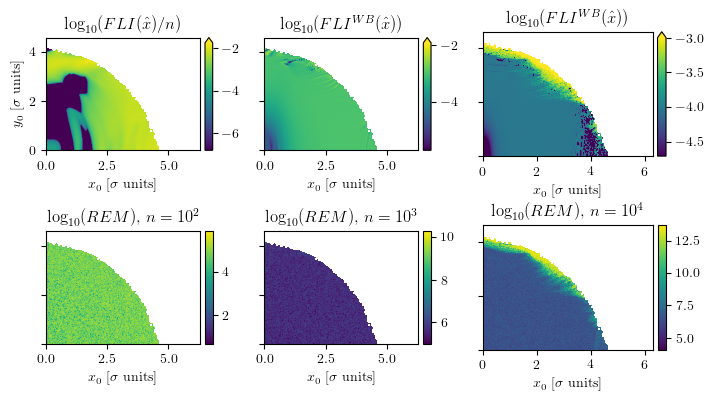

In [66]:
import types
def bottom_offset(self, bboxes, bboxes2):
    bottom = self.axes.bbox.ymax
    self.offsetText.set(va="top", ha="left")
    self.offsetText.set_position(
            (-3, bottom + 17))

def register_bottom_offset(axis, func):
    axis._update_offset_text_position = types.MethodType(func, axis)    

fig = plt.figure(figsize=(8, 5))

gs = gridspec.GridSpec(2, 3, width_ratios=[1, 1, 1.1], height_ratios=[1, 1])

axs = []
axs.append(plt.subplot(gs[0, 0]))
axs.append(plt.subplot(gs[0, 1]))
axs.append(plt.subplot(gs[0, 2]))
axs.append(plt.subplot(gs[1, 0]))
axs.append(plt.subplot(gs[1, 1]))
axs.append(plt.subplot(gs[1, 2]))

t_idx = -1
idx = 2
samples = 300
vmin = -4.7
vmax = -3

tmp = flibk_x_post_data_list[idx][13].reshape((samples, samples)).copy()
tmp_mask = tmp == -14
cmap = plt.cm.get_cmap('viridis')
tmp[tmp_mask] = np.nan
norm = plt.Normalize(vmin=np.nanmin(tmp), vmax=np.nanmax(tmp))
rgba = cmap(norm(tmp))
print(rgba.shape)
# color red the tmp_mask
rgba[tmp_mask] = [1, 0, 0, 1]
rgba[~tmp_mask] = [0, 0, 0, 0]

tmp[tmp <= -14] = np.nan
cmap = axs[0].imshow(tmp, origin='lower', extent=e_list_sigma[idx])

axs[0].set_xlabel('$x_0$ [$\\sigma$ units]')
axs[0].set_ylabel('$y_0$ [$\\sigma$ units]')
# add side colorbar
divider = make_axes_locatable(axs[0])
cax = divider.append_axes("right", size="5%", pad=0.05)
cbar = plt.colorbar(cmap, cax=cax, extend='max')

axs[0].set_title("$\\log_{{10}}(FLI(\\hat{x}) / n)$")

tmp = flibk_x_post_data_list[idx][26].reshape((samples, samples)).copy()
tmp_mask = tmp == -14
cmap = plt.cm.get_cmap('viridis')
tmp[tmp_mask] = np.nan
norm = plt.Normalize(vmin=np.nanmin(tmp), vmax=np.nanmax(tmp))
rgba = cmap(norm(tmp))
print(rgba.shape)
# color red the tmp_mask
rgba[tmp_mask] = [1, 0, 0, 1]
rgba[~tmp_mask] = [0, 0, 0, 0]

tmp[tmp <= -14] = np.nan
cmap = axs[1].imshow(tmp, origin='lower', extent=e_list_sigma[idx])

axs[1].imshow((rgba), origin='lower', extent=e_list_sigma[idx])
axs[1].set_xlabel('$x_0$ [$\\sigma$ units]')
# hide y axis
axs[1].set_yticklabels([])
axs[1].set_ylabel('')
# add side colorbar
divider = make_axes_locatable(axs[1])
cax = divider.append_axes("right", size="5%", pad=0.05)
cbar = plt.colorbar(cmap, cax=cax, extend='max')
# cbar.formatter.set_powerlimits((0, 0))
# register_bottom_offset(cbar.ax.yaxis, bottom_offset)
axs[1].set_title("$\\log_{{10}}(FLI^{{WB}}(\\hat{x}))$")

tmp = flibk_x_post_data_list[idx][39].reshape((samples, samples)).copy()
tmp_mask = tmp == -14
cmap = plt.cm.get_cmap('viridis')
tmp[tmp_mask] = np.nan
norm = plt.Normalize(vmin=np.nanmin(tmp), vmax=np.nanmax(tmp))
rgba = cmap(norm(tmp))
print(rgba.shape)
# color red the tmp_mask
rgba[tmp_mask] = [1, 0, 0, 1]
rgba[~tmp_mask] = [0, 0, 0, 0]

tmp[tmp <= -14] = np.nan
cmap = axs[2].imshow(tmp, origin='lower', extent=e_list_sigma[idx], vmin=vmin, vmax=vmax)

axs[2].imshow((rgba), origin='lower', extent=e_list_sigma[idx], vmin=vmin, vmax=vmax)
axs[2].set_xlabel('$x_0$ [$\\sigma$ units]')
# hide y axis
axs[2].set_yticklabels([])
axs[2].set_ylabel('')
# add side colorbar
divider = make_axes_locatable(axs[2])
cax = divider.append_axes("right", size="5%", pad=0.05)
cbar = plt.colorbar(cmap, cax=cax, extend='max')
# cbar.formatter.set_powerlimits((0, 0))
# register_bottom_offset(cbar.ax.yaxis, bottom_offset)
axs[2].set_title("$\\log_{{10}}(FLI^{{WB}}(\\hat{x}))$")


cmap = axs[3].imshow((16 + rem_post_data_list[idx][13]).reshape((samples, samples)), origin='lower', cmap='viridis', extent=e_list_sigma[idx])
cbar.formatter.set_powerlimits((0, 0))
register_bottom_offset(cbar.ax.yaxis, bottom_offset)

axs[3].set_xlabel('$x_0$ [$\\sigma$ units]')
axs[3].set_ylabel('$y_0$ [$\\sigma$ units]')

axs[3].set_yticklabels([])
axs[3].set_ylabel('')
# add side colorbar
divider = make_axes_locatable(axs[3])
cax = divider.append_axes("right", size="5%", pad=0.05)
cbar = plt.colorbar(cmap, cax=cax)

axs[3].set_title("$\\log_{{10}}(REM)$, $n=10^2$")

cmap = axs[4].imshow((16 + rem_post_data_list[idx][26]).reshape((samples, samples)), origin='lower', cmap='viridis', extent=e_list_sigma[idx], vmin=5)

axs[4].set_xlabel('$x_0$ [$\\sigma$ units]')
# hide y axis
axs[4].set_yticklabels([])
axs[4].set_ylabel('')
# add side colorbar
divider = make_axes_locatable(axs[4])
cax = divider.append_axes("right", size="5%", pad=0.05)
cbar = plt.colorbar(cmap, cax=cax)

axs[4].set_title("$\\log_{{10}}(REM)$, $n=10^3$")

cmap = axs[5].imshow((16 + rem_post_data_list[idx][39]).reshape((samples, samples)), origin='lower', cmap='viridis', extent=e_list_sigma[idx])

axs[5].set_xlabel('$x_0$ [$\\sigma$ units]')
# hide y axis
axs[5].set_yticklabels([])
axs[5].set_ylabel('')
# add side colorbar
divider = make_axes_locatable(axs[5])
cax = divider.append_axes("right", size="5%", pad=0.05)
cbar = plt.colorbar(cmap, cax=cax)

axs[5].set_title("$\\log_{{10}}(REM)$, $n=10^4$")

# increase distance between subplots
plt.subplots_adjust(wspace=0.3)
plt.subplots_adjust(hspace=0.01)

plt.savefig(os.path.join(IMGDIR, f"REM_overview.pdf"), bbox_inches="tight", dpi=600)


-5.453893703226163 -1.4773294536340296
-9.826525522780305 -0.011923756260709933
1
-10.125527995728051 -1.6988715012506241


/tmp/ipykernel_33878/825789815.py:39: RuntimeWarning: divide by zero encountered in log10
  tmp_data = np.log10(tmp_data)


-39.378585349591994 -1.8730546509251642
3
0.6156139749580003 14.697795743417274
4


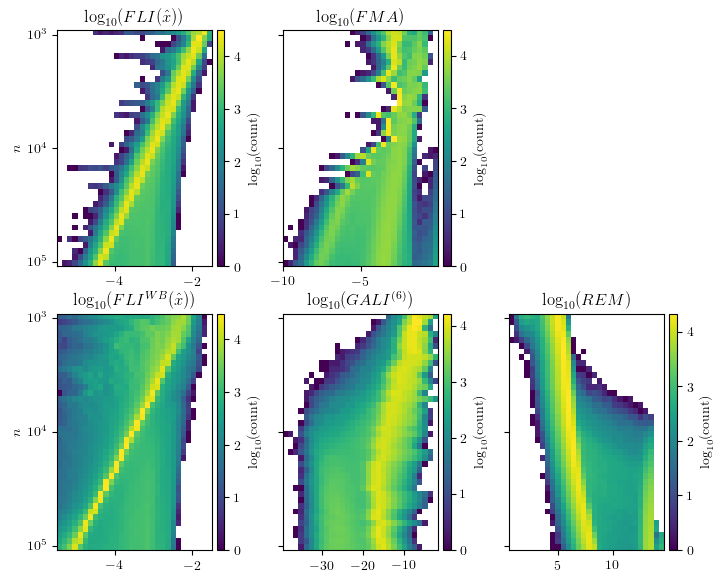

In [47]:
fig = plt.figure(figsize=(8, 6.75))

gs = gridspec.GridSpec(2, 3, width_ratios=[1, 1, 1], height_ratios=[1, 1])

axs = []
axs.append(plt.subplot(gs[0, 0]))
axs.append(plt.subplot(gs[0, 1]))
# axs.append(plt.subplot(gs[0, 2]))
axs.append(plt.subplot(gs[1, 0]))
axs.append(plt.subplot(gs[1, 1]))
axs.append(plt.subplot(gs[1, 2]))


idx = 2
mask = mask_list[idx]

for an_i, (ax, post_data, thresholds, title) in enumerate(
    zip(axs, 
        [fli_x_post_data_list[idx], tune_post_data_list[idx], flibk_x_post_data_list[idx], gali_6_post_data_list[idx], rem_post_data_list[idx]],
        [fli_x_thresh_list[idx], tune_thresh_list[idx], flibk_x_thresh_list[idx], gali_6_thresh_list[idx], rem_thresh_list[idx]],
        ["$\\log_{{10}}(FLI(\\hat{{x}}))$", "$\\log_{{10}}(FMA)$", "$\\log_{{10}}(FLI^{{WB}}(\\hat{{x}}))$", "$\\log_{{10}}(GALI^{{(6)}})$", "$\\log_{{10}}(REM)$"])
    ):

    post_data = post_data[13:]
    thresholds = thresholds[13:]

    if "REM" in title:
        post_data = [16 + l for l in post_data]

    val_min, val_max = get_extents([l for l in post_data[::]], 10)
    print(val_min, val_max)
    if an_i == 0 or an_i == 2:
        val_min = -5.5
        val_max = -1.5 
    elif an_i == 1:
        val_min = -10

    tmp_data, bin_centers = compose_count_map([l[mask] for l in post_data], val_min, val_max, nbins=30, density=False)
    tmp_data = np.log10(tmp_data)
    # print(tmp_data.shape)
    # tmp_data = tmp_data[::13]

    cmap = ax.imshow(tmp_data, cmap='viridis', aspect='auto', extent=[val_min, val_max, -0.5, len(times[26::])-0.5], interpolation='none')

    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.05)
    cbar = plt.colorbar(cmap, cax=cax, label="$\\log_{{10}}(\\mathrm{{count}})$")

    # plot the thresholds over the imshow
    # for i, t in enumerate(thresholds):
    #     ax.plot([t, t], [(len(thresholds)-1-i)-0.5, (len(thresholds)-1-i)+0.5], '--', color='red')

    # set the y ticks at idx 0, 13, and 26, and set the labels as 10^3, 10^4, and 10^5
    ax.set_yticks([0, 13, 26])
    ax.set_yticklabels([f"$10^{{{int(np.log10(times[26:][0]))}}}$", f"$10^{{{int(np.log10(times[26:][13]))}}}$", f"$10^{{{int(np.log10(times[26:][26]))}}}$"][::-1])
    
    ax.set_ylabel("$n$")
    ax.set_title(title)

    if an_i != 0 and an_i != 2:
        print(an_i)
        ax.set_yticklabels([])
        ax.set_ylabel('')


# increase distance between subplots
# increase distance between subplots
plt.subplots_adjust(wspace=0.35)
# plt.subplots_adjust(hspace=0.01)

plt.savefig(os.path.join(IMGDIR, f"evolution.pdf"), bbox_inches="tight", dpi=600)